Dear проверяющий,

Мы решили сделать один большой файл на все этапы, тк по нему будет удобнее ориентироваться при подготовке к защите. Это означает что на момент проверки уже могли появиться части для будующих этапов/структура немного могла измениться. Просьба игнорировать все кроме этапа текущего чекпоинта

!!! НЕ НАЖИМАЙТЕ ВЫПОЛНИТЬ ВСЕ !!!



---


# Этап 1

---



# Цель и подготовка к загрузке датасета

Как собирали датасет из джисонов в нормальный формат

https://colab.research.google.com/drive/1WNB4mE9iZ-OgsRiyq9gVH4yTdkQO8NM4?usp=sharing

Мы разрабатываем ML-модель для оценки потенциала видимости произведений искусства в музее. На основе исторических данных о произведениях, их авторах и прошлой выставочной активности мы выявляем объективные паттерны, связанные с попаданием в экспозиции и коммерческие продукты.


Цель проекта - не заменить кураторов, а предоставить им дополнительный инструмент для data-driven принятия решений, помогающий обнаруживать перспективные работы и оптимизировать ресурсы. Результатом работы станет либо рабочая модель, либо четкое понимание ограничений атрибутивных данных и рекомендации по сбору новых метрик

Это - реальный бизнес-процесс музея:


видимость -> экспонирование -> публикации -> коммерческая монетизация.

In [4]:
!pip install -q gdown

In [5]:
import gdown
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
gdown.download(
    id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
    output="AIC_artwork_visibility_dataset_final.csv",
    quiet=False
)

df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

print("Форма датасета:", df.shape)


Downloading...
From (original): https://drive.google.com/uc?id=1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S
From (redirected): https://drive.google.com/uc?id=1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S&confirm=t&uuid=7b42a58d-777e-441a-a421-0fcdda785e3b
To: /content/AIC_artwork_visibility_dataset_final.csv
100%|██████████| 114M/114M [00:01<00:00, 70.3MB/s]


Форма датасета: (134078, 57)


In [7]:
df.head()

,artwork_id,title,artist_id,artist_title,department_title,classification_title,style_title,medium_display,place_of_origin,date_start,...,has_advanced_imaging_extra,is_zoomable_extra,geo_has_coords,geo_quadrant,last_product_year,time_since_last_product,last_publication_year,time_since_last_publication,last_visible_year,time_since_last_visible
0,274738,"Man with Plumed Cap and Scarf, from the Large ...",33894.0,Giovanni Benedetto Castiglione,Prints and Drawings,print,NaN,Etching on ivory laid paper,Italy,1645.0,...,False,False,0,unknown,NaN,NaN,NaN,NaN,NaN,NaN
1,207576,Look Out Range Jasup Mississippi,40896.0,Joseph Yoakum,Prints and Drawings,ball-point pen,NaN,Blue ballpoint pen and colored pencil on cream...,United States,1962.0,...,False,False,0,unknown,NaN,NaN,NaN,NaN,NaN,NaN
2,141686,As (Coin) Portraying Germanicus,51349.0,Ancient Roman,"Arts of Greece, Rome, and Byzantium",coin,"roman (ancient, style or period)",Bronze,Roman Empire,39.0,...,False,True,0,unknown,NaN,NaN,NaN,NaN,NaN,NaN
3,229035,"Locomotive, frontispiece from Armin Landeck: T...",35381.0,Armin Landeck,Prints and Drawings,aquatint,NaN,Aquatint with stop-out varnish and drypoint on...,United States,1936.0,...,False,False,0,unknown,NaN,NaN,NaN,NaN,NaN,NaN
4,85059,"Standing Youth Holding Hat, and Sketch of Legs",42311.0,Domenico Fiasella,Prints and Drawings,graphite,NaN,Black chalk on blue laid paper,Italy,1600.0,...,False,True,0,unknown,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
import matplotlib.pyplot as mpl

BG = "#F0F1F1"

plt.rcParams.update({
    "figure.facecolor": BG,     # фон всей фигуры
    "axes.facecolor": BG,       # фон области с осями
    "savefig.facecolor": BG,    # фон при сохранении
    "savefig.transparent": False
})


In [9]:
BG = "#F0F1F1"

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(
    style="whitegrid",
    rc={
        "figure.facecolor": BG,
        "axes.facecolor": BG,
        "savefig.facecolor": BG,
    },
)

plt.rcParams.update({
    "figure.facecolor": BG,
    "axes.facecolor": BG,
    "savefig.facecolor": BG,
})


### Museum pipeline

# EDA

## 1. Авторы, биография, человек + страна происхождения

(выполнял Кирилл Орлов)

Цель этого блока заключалась в том, чтобы понять, какие элементы авторской биографии действительно влияют на вероятность того, что работа попадает в поле музейной видимости. В распоряжении были сведения о месте происхождения, датах рождения и смерти, объеме биографических текстов и редкости автора внутри коллекции.

Основные вопросы анализа:
какие биографические поля в реальности заполнены,
как распределены авторы по странам и эпохам,
существуют ли устойчивые различия в видимости между странами и веками рождения,
несет ли сигнал редкость автора,
влияет ли наличие и длина биографического описания,
можно ли получить устойчивые признаки, пригодные для модели.

Наблюдения показали, что формально в датасете присутствует большое количество авторских полей, но значительная часть из них практически не используется. Поля пола, политипа агента и национальности заполнены слишком фрагментарно, чтобы на них можно было опираться. Их можно исключить без потери качества.

Более полезной оказалась информация о месте происхождения. Даже после приведения стран к укрупненному набору видно, что доля видимых работ различается весьма существенно. США, Франция, Нидерланды, Япония и Мексика показывают повышенную вероятность присутствия в экспозициях, тогда как другие регионы дают более слабый или нестабильный сигнал. Это делает место происхождения важной категориальной переменной, способной работать как маркер художественной традиции и внутримузейных предпочтений.

Даты рождения и смерти в исходном виде содержат много пропусков, но очищенная версия позволяет получить два устойчивых признака: век рождения и тип авторского профиля. Разбиение на века дает понятную классификацию эпох, а распределения показывают, что работы авторов, родившихся в XVI–XVIII веках, чаще оказываются видимыми, чем объекты, связанные с XIX или XXI веками. Это не признак качества, а отражение факта, что определенные эпохи исторически лучше представлены в музейных витринах.

Отдельного внимания заслуживает признак author_profile, который фиксирует, есть ли у автора биография, только даты или не заполнено ничего. Этот признак стабильно связан с видимостью: наличие описания коррелирует с более высоким уровнем публичной активности объекта. Это подчеркивает важность качества музейной документации.

Редкость автора как количественный признак показала нерегулярное поведение, но в квартильной форме стала полезной категорией. Группа редких авторов в среднем дает более высокую вероятность видимости, что отражает интерес музея к уникальным и слабо представленным в коллекции именам.

В итоге для модели были отобраны только устойчивые признаки: place_of_origin_top, birth_century, rarity_q, author_profile, artist_description_len, artist_display_len и age_at_creation как слабый вспомогательный фактор. Остальные биографические поля исключены из-за отсутствия систематичности или информационной нагрузки.

### Краткие результаты

1) часть колонок по авторам формально есть но полностью пустые  
   это `artist_gender` `agent_type_id` `artist_nationality`  
   нормальный анализ по полу или типу агента сделать нельзя  
   эти признаки можно сразу убрать и не тащить в модель  

2) биографические данные в целом шумные и неполные  
   даты рождения есть примерно у двух третей записей  
   даты смерти меньше  
   тексты встречаются редко  
   но при этом из блока можно вытащить несколько вполне работающих фич  

3) страна происхождения по `place_of_origin` дает сильные различия  
   доля видимых работ по странам заметно отличается  
   в комбинации с веком рождения это дает устойчивые паттерны

4) редкость автора `artist_rarity` полезна если ее дискретизировать  
   редкие авторы и очень массовые ведут себя по видимости по разному  
   квартильная разбивка по редкости работает лучше чем сырое число  

5) возраст автора на момент создания `age_at_creation` выглядит разумно  
   но с таргетом почти не связан  
   можно оставить как вспомогательный числовой признак  
   но основную ставку на него делать не стоит  

6) факт наличия нормальной биографии важен  
   авторы у которых есть описания и карточки заметно чаще видимы  
   длина текстов тоже немного сдвинута в сторону видимых  
   сами тексты в модель тащить не планируем а флаги и длины в бакетах можно

7) простая классификация профиля автора  описание  только даты  нет биографии  
   дает понятный сигнал  
   это хороший компактный категориальный признак для модели  

8) по корреляциям видно что линейная связь чисел с таргетом слабая  
   то есть главный сигнал в этом блоке лежит в категориальных признаках  
   страна эпоха профиль редкость  

дальше идет код который реализует весь этот анализ


In [16]:
# выделяем блок колонок по авторам плюс таргет и даты

author_cols = [
    "agent_type_id",
    "artist_birth_date",
    "artist_death_date",
    "artist_description",
    "artist_display",
    "artist_gender",
    "artist_id",
    "artist_nationality",
    "artist_rarity",
    "artist_title",
    "artist_title_full",
    "place_of_origin",
]

extra_cols = ["visible", "date_start", "date_end"]
df_author = df[author_cols + extra_cols].copy()

df_author["visible"] = df_author["visible"].astype(int)

# чистим странный код 4713 в датах рождения и смерти
df_author["artist_birth_clean"] = df_author["artist_birth_date"].replace(4713, np.nan)
df_author["artist_death_clean"] = df_author["artist_death_date"].replace(4713, np.nan)

# фильтруем год конца создания в разумный диапазон
df_author["date_end_clean"] = df_author["date_end"].where(
    df_author["date_end"].between(1000, 2100), np.nan
)

# примерный возраст автора на момент создания
df_author["age_at_creation"] = df_author["date_end_clean"] - df_author["artist_birth_clean"]
df_author.loc[
    (df_author["age_at_creation"] < 10) | (df_author["age_at_creation"] > 120),
    "age_at_creation",
] = np.nan

df_author.head()

,agent_type_id,artist_birth_date,artist_death_date,artist_description,artist_display,artist_gender,artist_id,artist_nationality,artist_rarity,artist_title,artist_title_full,place_of_origin,visible,date_start,date_end,artist_birth_clean,artist_death_clean,date_end_clean,age_at_creation
0,NaN,1609.0,1664.0,"<p>A prolific and multifaceted artist, Giovann...","Giovanni Benedetto Castiglione\nItalian, 1609-...",NaN,33894.0,NaN,35,Giovanni Benedetto Castiglione,Giovanni Benedetto Castiglione,Italy,0,1645.0,1650.0,1609.0,1664.0,1650.0,41.0
1,NaN,1890.0,1972.0,"<p>Over a late and brief career, Joseph E. Yoa...","Joseph Yoakum\nAmerican, 1890-1972",NaN,40896.0,NaN,232,Joseph Yoakum,Joseph Yoakum,United States,0,1962.0,1964.0,1890.0,1972.0,1964.0,74.0
2,NaN,NaN,NaN,<p>The ancient Roman period is considered to h...,"Roman, minted in Rome",NaN,51349.0,NaN,2017,Ancient Roman,Ancient Roman,Roman Empire,0,39.0,41.0,NaN,NaN,NaN,NaN
3,NaN,1905.0,1984.0,NaN,"Armin Landeck (American, 1905–1984)\nprinted b...",NaN,35381.0,NaN,11,Armin Landeck,Armin Landeck,United States,0,1936.0,1936.0,1905.0,1984.0,1936.0,31.0
4,NaN,1589.0,1669.0,NaN,"Probably Domenico Fiasella (Italian, 1589-1669...",NaN,42311.0,NaN,15,Domenico Fiasella,Domenico Fiasella,Italy,0,1600.0,1699.0,1589.0,1669.0,1699.0,110.0


In [17]:
df_author[author_cols + ["visible"]].info()

missing_counts = df_author[author_cols].isna().sum().sort_values(ascending=False)
missing_perc = (missing_counts / len(df_author) * 100).round(2)

missing_summary = pd.DataFrame(
    {"missing_count": missing_counts, "missing_%": missing_perc}
)
missing_summary


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134078 entries, 0 to 134077
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   agent_type_id       0 non-null       float64
 1   artist_birth_date   91222 non-null   float64
 2   artist_death_date   73841 non-null   float64
 3   artist_description  13118 non-null   object 
 4   artist_display      133990 non-null  object 
 5   artist_gender       0 non-null       float64
 6   artist_id           115492 non-null  float64
 7   artist_nationality  0 non-null       float64
 8   artist_rarity       134078 non-null  int64  
 9   artist_title        115492 non-null  object 
 10  artist_title_full   115492 non-null  object 
 11  place_of_origin     124454 non-null  object 
 12  visible             134078 non-null  int64  
dtypes: float64(6), int64(2), object(5)
memory usage: 13.3+ MB


,missing_count,missing_%
agent_type_id,134078,100.00
artist_gender,134078,100.00
artist_nationality,134078,100.00
artist_description,120960,90.22
artist_death_date,60237,44.93
artist_birth_date,42856,31.96
artist_id,18586,13.86
artist_title,18586,13.86
artist_title_full,18586,13.86
place_of_origin,9624,7.18


In [18]:
# распределение по странам происхождения и связь со видимостью

print(df_author["place_of_origin"].value_counts(dropna=False).head(20))

top_places = df_author["place_of_origin"].value_counts().head(15).index
df_author["place_of_origin_top"] = np.where(
    df_author["place_of_origin"].isin(top_places),
    df_author["place_of_origin"],
    "Other"
)


place_of_origin
United States     39194
France            15243
Japan             13960
NaN                9624
England            8492
Italy              5128
Germany            4514
China              3964
Netherlands        2373
Spain              1333
Chicago            1312
Egypt              1237
Mexico             1169
Flanders           1036
Holland             901
Unknown Place       896
Peru                877
United Kingdom      836
Roman Empire        693
Sweden              689
Name: count, dtype: int64


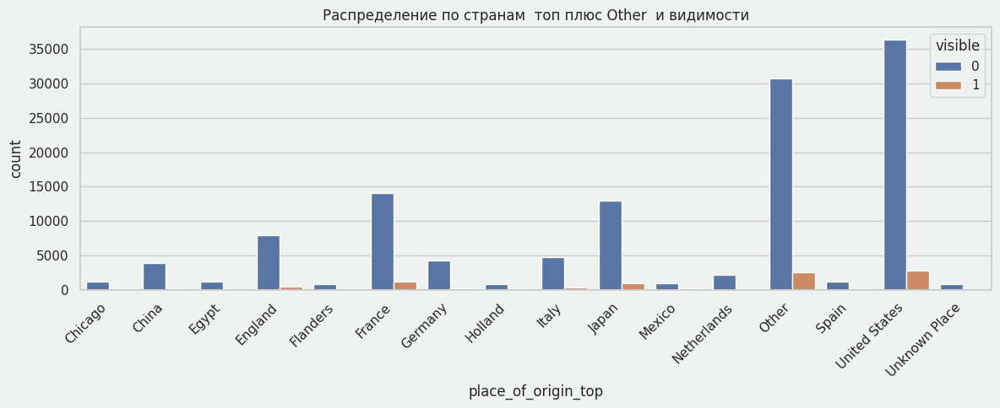

In [19]:
plt.figure(figsize=(12, 5))
sns.countplot(
    data=df_author,
    x="place_of_origin_top",
    hue="visible",
    order=sorted(df_author["place_of_origin_top"].unique())
)
plt.title("Распределение по странам  топ плюс Other  и видимости")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

по графику видно что доля видимых работ заметно различается между странами  
значит `place_of_origin` точно имеет смысл использовать как фичу

count    134078.000000
mean        197.934546
std         394.642199
min           0.000000
25%           4.000000
50%          37.000000
75%         193.000000
max        2017.000000
Name: artist_rarity, dtype: float64


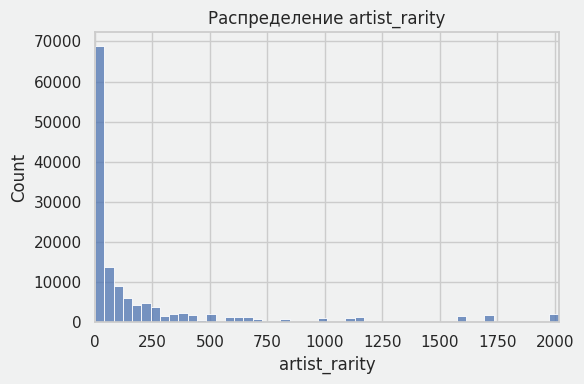

In [20]:
# анализ редкости автора

print(df_author["artist_rarity"].describe())

plt.figure(figsize=(6, 4))
sns.histplot(data=df_author, x="artist_rarity", bins=50)
plt.xlim(0, df_author["artist_rarity"].quantile(0.99))
plt.title("Распределение artist_rarity")
plt.tight_layout()
plt.show()

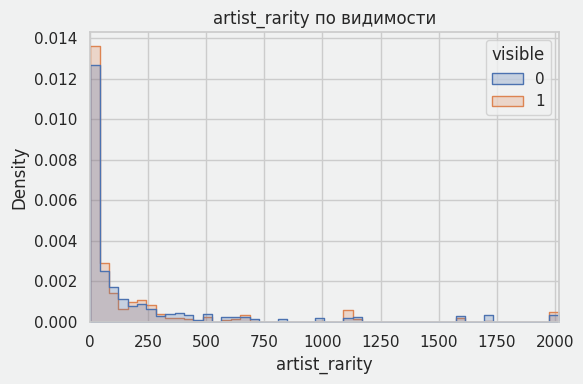

In [21]:
plt.figure(figsize=(6, 4))
sns.histplot(
    data=df_author,
    x="artist_rarity",
    bins=50,
    hue="visible",
    element="step",
    stat="density",
    common_norm=False
)
sns.set_theme(style="white", rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"})
plt.xlim(0, df_author["artist_rarity"].quantile(0.99))
plt.title("artist_rarity по видимости")
plt.tight_layout()
plt.show()

распределение `artist_rarity` как обычно тяжелый хвост  

редких авторов много массовых мало  
по плотностям видно что профиль по видимости у групп разный  

лучше всего это раскроется если разбить редкость на группы

In [22]:
# возраст автора на момент создания работы

print(df_author["age_at_creation"].describe())


count    89008.000000
mean        45.997427
std         15.646602
min         10.000000
25%         34.000000
50%         43.000000
75%         55.000000
max        120.000000
Name: age_at_creation, dtype: float64


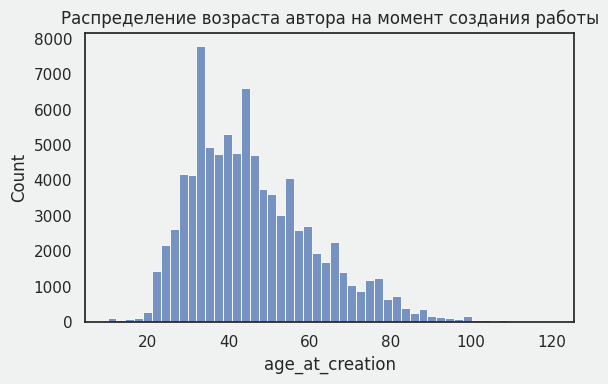

In [23]:
plt.figure(figsize=(6, 4))
sns.histplot(data=df_author, x="age_at_creation", bins=50)
plt.title("Распределение возраста автора на момент создания работы")
plt.tight_layout()
plt.show()


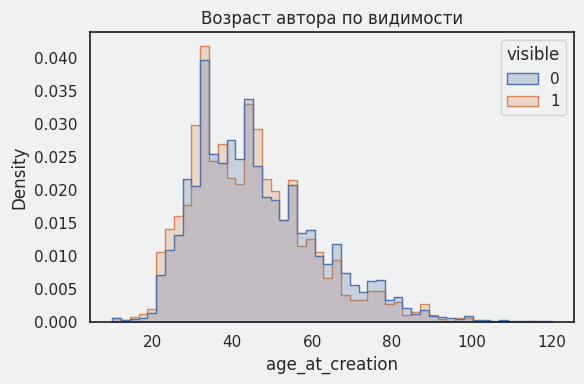

In [24]:
plt.figure(figsize=(6, 4))
sns.histplot(
    data=df_author,
    x="age_at_creation",
    bins=50,
    hue="visible",
    element="step",
    stat="density",
    common_norm=False
)
plt.title("Возраст автора по видимости")
plt.tight_layout()
plt.show()

возраст автора в целом выглядит реалистично  
связь с видимостью слабая но это нормальная вспомогательная фича

In [25]:
# флаги наличия разных биографических полей

df_author["has_description"] = df_author["artist_description"].notna().astype(int)
df_author["has_display"] = df_author["artist_display"].notna().astype(int)
df_author["has_birth"] = df_author["artist_birth_clean"].notna().astype(int)
df_author["has_death"] = df_author["artist_death_clean"].notna().astype(int)
df_author["has_nationality"] = df_author["artist_nationality"].notna().astype(int)

def make_profile(row):
    if row["has_description"]:
        return "description"
    if row["has_birth"] or row["has_death"]:
        return "dates_only"
    return "no_bio"

df_author["author_profile"] = df_author[["has_description", "has_birth", "has_death"]].apply(
    make_profile, axis=1
)

df_author["author_profile"].value_counts()

,count
author_profile,
dates_only,83027
no_bio,37933
description,13118


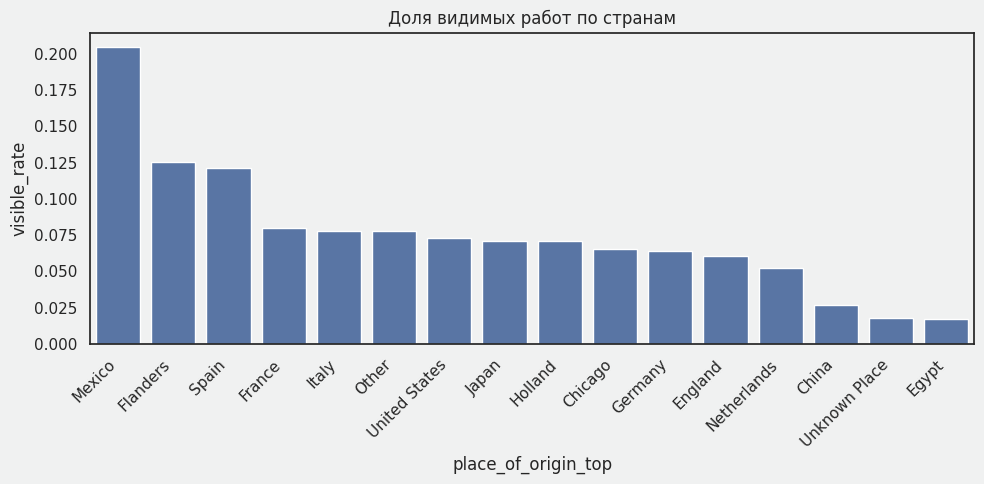

In [26]:
# страна плюс видимость в агрегате

place_vis = (
    df_author.groupby("place_of_origin_top")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
    .sort_values("visible_rate", ascending=False)
)
place_vis

plt.figure(figsize=(10, 5))
sns.barplot(
    data=place_vis.reset_index(),
    x="place_of_origin_top",
    y="visible_rate"
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("visible_rate")
plt.title("Доля видимых работ по странам")
plt.tight_layout()
plt.show()

таблица и график подтверждают что страна дает сильный сигнал по видимости  
эта фича точно пойдет в модель

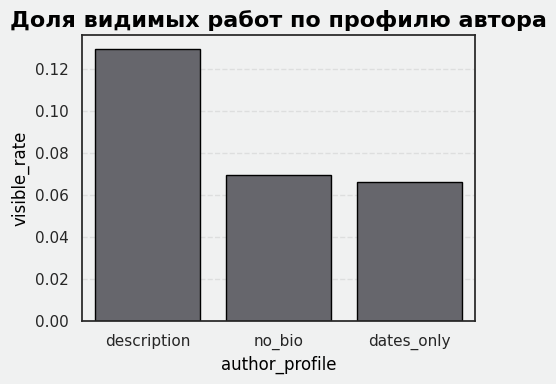

In [27]:
profile_vis = (
    df_author.groupby("author_profile")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
    .sort_values("visible_rate", ascending=False)
)

plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_theme(style="white", rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"})

sns.set_palette(["#65656D"])

plt.figure(figsize=(5, 4))
sns.barplot(
    data=profile_vis.reset_index(),
    x="author_profile",
    y="visible_rate",
    edgecolor="black",
    linewidth=1
)
sns.set_theme(style="white", rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"})
plt.ylabel("visible_rate", color="black")
plt.xlabel("author_profile", color="black")
plt.title("Доля видимых работ по профилю автора", fontsize=16, fontweight="bold", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()

авторы с нормальным описанием в базе видимы заметно чаще  
простой `author_profile` уже сам по себе выглядит как хорошая категориальная фича

In [28]:
# пропуски в birth death и базовая импутация

birth_missing = df_author["artist_birth_clean"].isna().mean()
death_missing = df_author["artist_death_clean"].isna().mean()
print("Доля пропусков birth:", round(birth_missing, 4))
print("Доля пропусков death:", round(death_missing, 4))

birth_vis = (
    df_author.groupby("has_birth")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
)
print("\nvisible_rate по has_birth:")
print(birth_vis)

death_vis = (
    df_author.groupby("has_death")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
)
print("\nvisible_rate по has_death:")
print(death_vis)

birth_impute_map = (
    df_author.groupby("place_of_origin")["artist_birth_clean"]
    .median()
)
death_impute_map = (
    df_author.groupby("place_of_origin")["artist_death_clean"]
    .median()
)

df_author["artist_birth_imputed"] = df_author["artist_birth_clean"]
df_author["artist_death_imputed"] = df_author["artist_death_clean"]

df_author["artist_birth_imputed"] = df_author["artist_birth_imputed"].fillna(
    df_author["place_of_origin"].map(birth_impute_map)
)
df_author["artist_death_imputed"] = df_author["artist_death_imputed"].fillna(
    df_author["place_of_origin"].map(death_impute_map)
)

df_author["artist_birth_imputed"] = df_author["artist_birth_imputed"].fillna(
    df_author["artist_birth_clean"].median()
)
df_author["artist_death_imputed"] = df_author["artist_death_imputed"].fillna(
    df_author["artist_death_clean"].median()
)

df_author[["artist_birth_clean", "artist_birth_imputed", "artist_death_clean", "artist_death_imputed"]].head()

Доля пропусков birth: 0.3198
Доля пропусков death: 0.4494

visible_rate по has_birth:
               n  visible_rate
has_birth                     
0          42873      0.071117
1          91205      0.074261

visible_rate по has_death:
               n  visible_rate
has_death                     
0          60254      0.068610
1          73824      0.077048


,artist_birth_clean,artist_birth_imputed,artist_death_clean,artist_death_imputed
0,1609.0,1609.0,1664.0,1664.0
1,1890.0,1890.0,1972.0,1972.0
2,NaN,1885.0,NaN,1931.0
3,1905.0,1905.0,1984.0,1984.0
4,1589.0,1589.0,1669.0,1669.0


это скорее черновая импутация на будущее  
в этом этапе EDA мы опираемся в основном на исходные очищенные значения

visible_rate по наличию artist_description:
                      n  visible_rate
has_description                      
0                120960      0.067138
1                 13118      0.129669

visible_rate по наличию artist_display:
                  n  visible_rate
has_display                      
0                88      0.022727
1            133990      0.073289

Статистика длины artist_description по visible:
            count        mean          std  min  25%  50%  75%     max
visible                                                               
0        124256.0  304.418000  1044.479803  0.0  0.0  0.0  0.0  6074.0
1          9822.0  587.570047  1390.788060  0.0  0.0  0.0  0.0  6074.0

Статистика длины artist_display по visible:
            count       mean        std  min   25%   50%   75%     max
visible                                                               
0        124256.0  49.231586  43.291876  0.0  31.0  37.0  52.0  3567.0
1          9822.0  48.434127  41.469

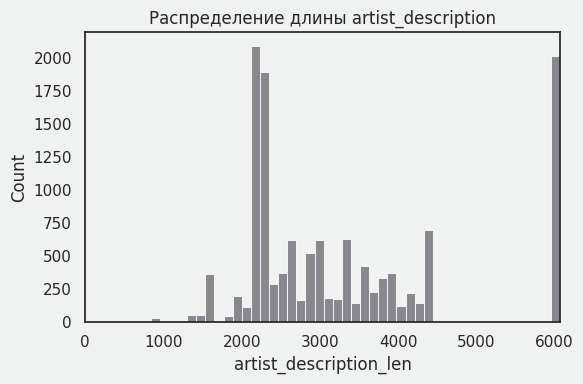

In [29]:
# длина текстов про автора и связь с видимостью

df_author["artist_description_len"] = df_author["artist_description"].fillna("").str.len()
df_author["artist_display_len"] = df_author["artist_display"].fillna("").str.len()

desc_presence_vis = (
    df_author.groupby("has_description")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
)
print("visible_rate по наличию artist_description:")
print(desc_presence_vis)

display_presence_vis = (
    df_author.groupby("has_display")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
)
print("\nvisible_rate по наличию artist_display:")
print(display_presence_vis)

desc_len_vis = (
    df_author.groupby("visible")["artist_description_len"]
    .describe()
)
print("\nСтатистика длины artist_description по visible:")
print(desc_len_vis)

disp_len_vis = (
    df_author.groupby("visible")["artist_display_len"]
    .describe()
)
print("\nСтатистика длины artist_display по visible:")
print(disp_len_vis)

plt.figure(figsize=(6, 4))

sns.set_theme(
    style="white",
    rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"}
)

sns.histplot(
    data=df_author[df_author["artist_description_len"] > 0],
    x="artist_description_len",
    bins=50,
    color="#65656D"   # <- если нужно строго серый, добавь это
)

plt.xlim(0, df_author["artist_description_len"].quantile(0.99))
plt.title("Распределение длины artist_description")
plt.tight_layout()
plt.show()

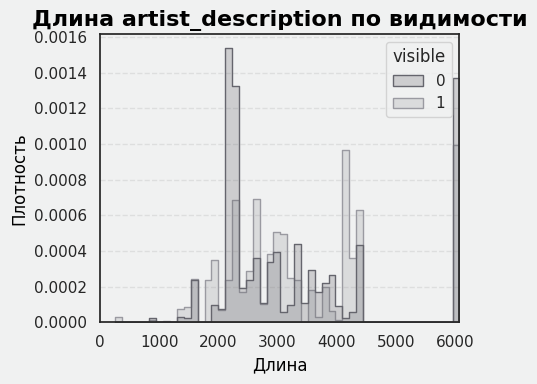

In [30]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})
sns.set_theme(
    style="white",
    rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"}
)
sns.set_palette(["#65656D", "#9A9AA1"])

plt.figure(figsize=(5, 4))
sns.histplot(
    data=df_author[df_author["artist_description_len"] > 0],
    x="artist_description_len",
    bins=50,
    hue="visible",
    element="step",
    stat="density",
    common_norm=False,
    linewidth=1
)

plt.xlim(0, df_author["artist_description_len"].quantile(0.99))
plt.title("Длина artist_description по видимости", fontsize=16, fontweight="bold", color="black")
plt.xlabel("Длина", color="black")
plt.ylabel("Плотность", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.show()

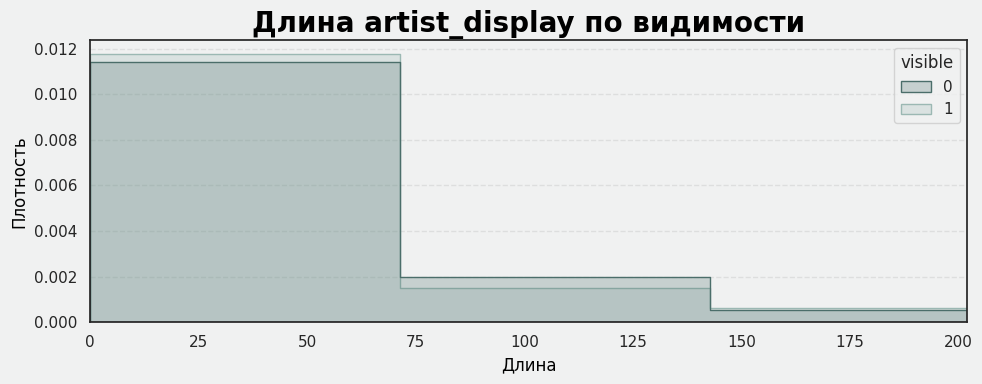

In [31]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_theme(
    style="white",
    rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"}
)
sns.set_palette(["#4B6E6A", "#9BB8B3"])

plt.figure(figsize=(10, 4))
sns.histplot(
    data=df_author,
    x="artist_display_len",
    bins=50,
    hue="visible",
    element="step",
    stat="density",
    common_norm=False,
    linewidth=1
)

plt.xlim(0, df_author["artist_display_len"].quantile(0.99))
plt.title("Длина artist_display по видимости", fontsize=20, fontweight="bold", color="black")
plt.xlabel("Длина", color="black")
plt.ylabel("Плотность", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.show()

наличие и длина текстов про автора дают небольшой но стабильный сдвиг в сторону видимых работ  
для модели логично использовать флаги и возможно бакеты по длине

In [32]:
# wordcloud по описаниям для видимых и невидимых работ
!pip install -q wordcloud
from wordcloud import WordCloud

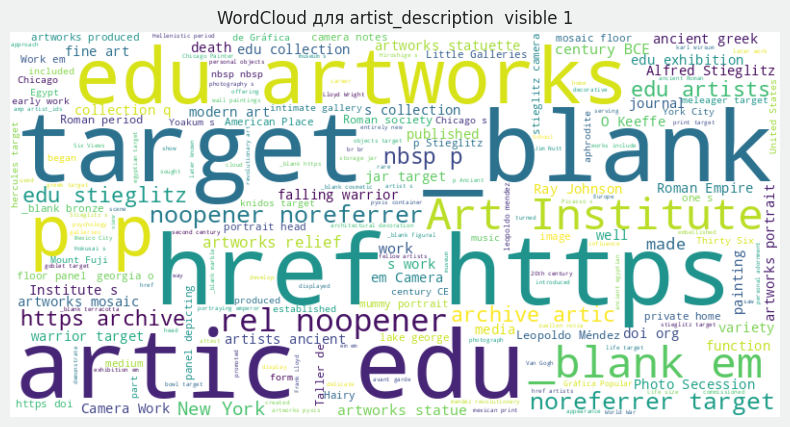

In [33]:
text_visible = " ".join(
    df_author.loc[
        (df_author["visible"] == 1) & (df_author["artist_description_len"] > 0),
        "artist_description"
    ].astype(str)
)
text_not_visible = " ".join(
    df_author.loc[
        (df_author["visible"] == 0) & (df_author["artist_description_len"] > 0),
        "artist_description"
    ].astype(str)
)

wc_visible = WordCloud(width=800, height=400, background_color="white").generate(text_visible)
wc_not_visible = WordCloud(width=800, height=400, background_color="white").generate(text_not_visible)

plt.figure(figsize=(10, 5))
plt.imshow(wc_visible, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud для artist_description  visible 1")
plt.show()

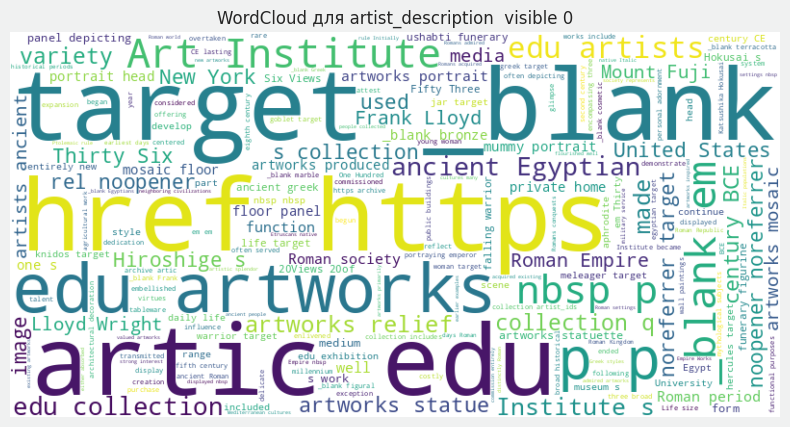

In [34]:
plt.figure(figsize=(10, 5))
plt.imshow(wc_not_visible, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud для artist_description  visible 0")
plt.show()

wordcloud это скорее иллюстрация  
какой то резкой разницы по топ словам не видно  
поэтому в модель тексты в сыром виде не тянем


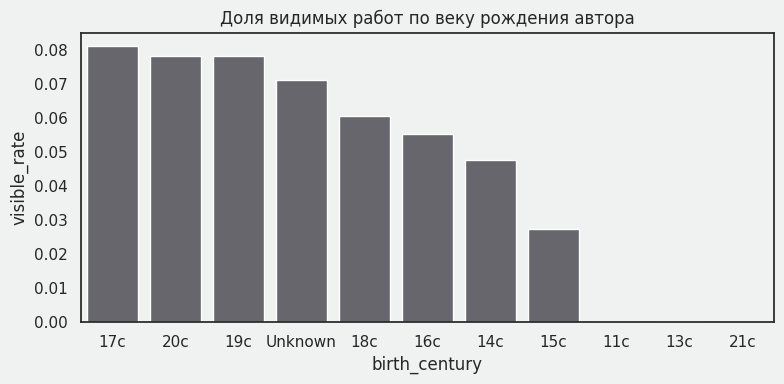

In [35]:
# эпохи рождения авторов и видимость

def birth_to_century(x):
    if pd.isna(x):
        return "Unknown"
    c = int(x) // 100 + 1
    return f"{c}c"

df_author["birth_century"] = df_author["artist_birth_clean"].apply(birth_to_century)

century_vis = (
    df_author.groupby("birth_century")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
    .sort_values("visible_rate", ascending=False)
)
century_vis

sns.set_theme(
    style="white",
    rc={"figure.facecolor": "#F0F1F1", "axes.facecolor": "#F0F1F1", "savefig.facecolor": "#F0F1F1"}
)

plt.figure(figsize=(8, 4))
sns.barplot(
    data=century_vis.reset_index(),
    x="birth_century",
    y="visible_rate",
    color="#65656D"
)
plt.title("Доля видимых работ по веку рождения автора")
plt.ylabel("visible_rate")
plt.tight_layout()
plt.show()


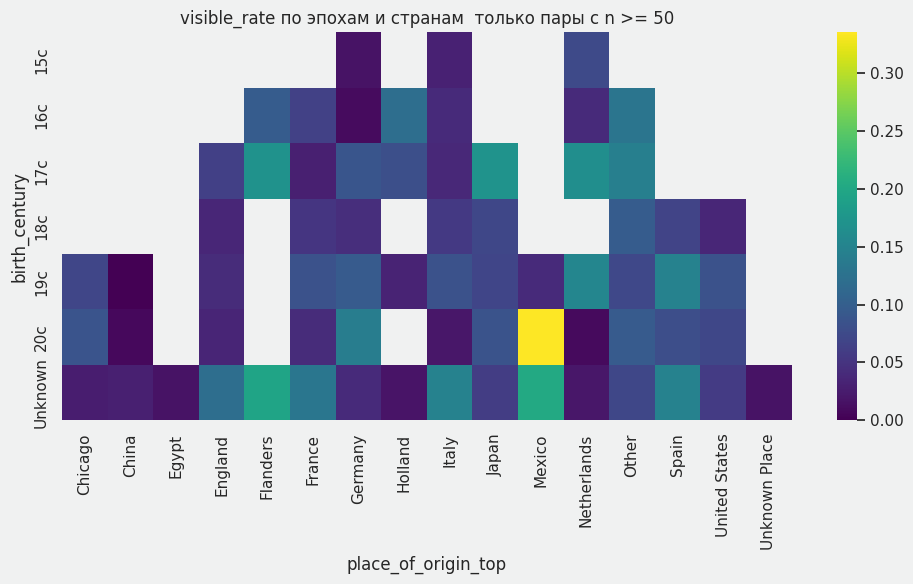

In [36]:
combo = (
    df_author.groupby(["birth_century", "place_of_origin_top"])["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
    .reset_index()
)

combo_filtered = combo[combo["n"] >= 50].copy()

pivot_combo = combo_filtered.pivot(
    index="birth_century",
    columns="place_of_origin_top",
    values="visible_rate"
)

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_combo, annot=False, cmap="viridis")
plt.title("visible_rate по эпохам и странам  только пары с n >= 50")
plt.tight_layout()
plt.show()

здесь видно что некоторые комбинации век плюс страна стабильно дают более высокую видимость  
это хорошая основа для дальнейших фич без ручного кодирования школ и направлений

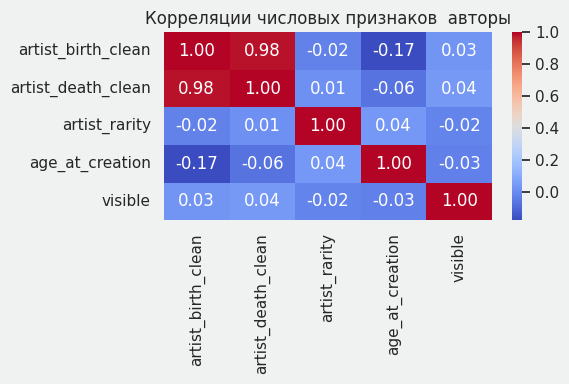

In [37]:
# корреляции числовых признаков по авторам

num_cols = [
    "artist_birth_clean",
    "artist_death_clean",
    "artist_rarity",
    "age_at_creation",
    "visible",
]

corr = df_author[num_cols].corr()
corr

plt.figure(figsize=(6, 4))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Корреляции числовых признаков  авторы")
plt.tight_layout()
plt.show()

по корреляциям видно что линейной связи с таргетом почти нет  
зато мы уже видели что категориальные признаки дают нормальный сигнал

/tmp/ipython-input-2595783328.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_author.groupby("rarity_q")["visible"]


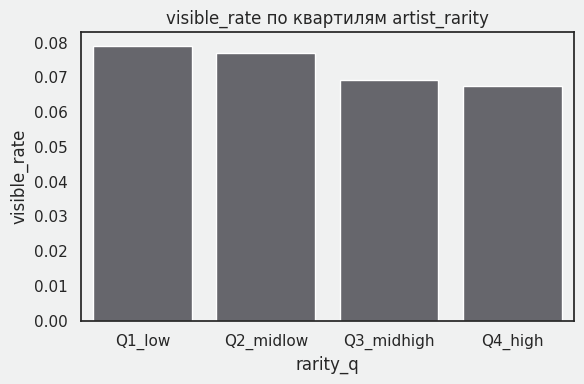

In [38]:
# редкость автора по квартилям и видимость

df_author["rarity_q"] = pd.qcut(
    df_author["artist_rarity"],
    q=4,
    labels=["Q1_low", "Q2_midlow", "Q3_midhigh", "Q4_high"]
)

rarity_vis = (
    df_author.groupby("rarity_q")["visible"]
    .agg(["count", "mean"])
    .rename(columns={"count": "n", "mean": "visible_rate"})
)
rarity_vis

plt.figure(figsize=(6, 4))
sns.barplot(
    data=rarity_vis.reset_index(),
    x="rarity_q",
    y="visible_rate",
    color="#65656D"

)
plt.title("visible_rate по квартилям artist_rarity")
plt.tight_layout()
plt.show()

квартильная дискретизация редкости работает ожидаемо  
видимость по группам различается  
такой вариант `artist_rarity` модели будет переваривать лучше чем сырое число

In [39]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")

## 2. Художественные параметры, классификация, стиль, изображение и свойства работы


*(автор блока: Лиза Доценко)*

Задача этого этапа - разобраться, какие формальные характеристики произведений действительно связаны с их музейной видимостью. Сюда входят тип объекта, департамент, художественный стиль, материалы, размеры, визуальные параметры и свойства цифровых изображений.

Мы искали ответы на несколько практических вопросов:

* какой тип объектов доминирует в датасете и как это влияет на модель;
* насколько «живым» и полным является поле style;
* можно ли извлечь стабильные количественные признаки из размеров и превью;
* что можно вытащить из текстовых атрибутов - title, medium, credit line;
* какие признаки действительно стоит включать в модель, а какие лучше оставить на уровне описательной статистики.

###  итог по художественному блоку

что в итоге полезно  

* classification_title  нормальный категориальный признак  
* department_title  сильный но перекошенный по частотам  
* style_title  использовать как категорию вместе с состоянием нет стиля  
* side_normalised  компактная числовая оценка размера  
* thumbnail_area  заменяет собой высоту и ширину превью  
* набор md слов по medium и medium_word_count  
* темы по title и длина заголовка  
* credit_line_word_count как простой контекст о способе поступления  

что можно выкинуть или уже выкинули  

* сырые поля dimension_text medium_display title credit_line  
* отдельные thumbnail_height thumbnail_width  

все сложные текстовые фичи уже переведены в числовой или бинарный формат  
их можно использовать на следующем этапе для построения базового пайплайна моделей


### Первичное устройство художественного блока

Основная структура данных включает три ключевые категории:
classification_title, department_title и style_title.

Они дают фактически «музейную точку зрения» на объект: тип носителя, принадлежность к департаменту, художественную традицию или технику.

Анализ распределений сразу показал важное свойство датасета:
наиболее многочисленный тип - печатная графика (гравюры, литографии). Они занимают непропорционально большую часть коллекции, в то время как классические живописные объекты количественно заметно меньше.

То же относится и к департаментам: Prints and Drawings настолько доминирует, что почти определяет общую статистическую картину. Это нужно учитывать при моделировании: категории с такой перекосом могут легко «душить» остальные признаки, и иногда их стоит упрощать или объединять.

### Стили: где много пустоты, там тоже есть сигнал

Поле style_title ожидаемо оказалось очень фрагментированным.
Большая часть массовых технических типов - особенно графика - идут без стиля вовсе. Это не ошибка, а особенность музейных данных: не каждой работе возможно назначить полноценный художественный стиль.

Здесь важно два наблюдения:

1. Стиль есть далеко не у всех,
   и это отсутствие само по себе несёт информацию.

2. Там, где стиль присутствует (например, живопись, фотография),
   он действительно помогает разделять видимые и невидимые объекты.

Отсюда естественный вывод:
style_title лучше оставить в категории как есть, а пропуски считать полноценным состоянием, а не «дырой».

### Департаменты: сильный, но осторожный признак

Сравнение департаментов по доле видимости даёт яркую картину:
часть отделов почти никогда не выставляет свои объекты, другие - наоборот, имеют высокую витринность.

Это ценный сигнал, но работа с ним требует аккуратности.
Если департамент огромный и разнообразный, модель может начать опираться на него слишком сильно, фактически превращая его в один из главных факторов решения. Это не ошибка, но такая зависимость должна быть прозрачной - особенно перед музеем, который будет использовать модель в реальной политике показа.

### Размеры: из текстовых описаний к стабильной метрике

Поле dimension_text - одно из самых хаотичных в наборе.
Оно содержит размеры в свободной форме, с разными единицами, формулировками и неоднородным форматированием.

Чтобы извлечь из него хоть что-нибудь пригодное, мы ввели показатель **side_normalised** - компактную числовую оценку размера объекта.
Она основана на попытке вытащить из текста одно или несколько измерений и привести их к единой условной «характерной стороне».

Этот признак получился surprisingly информативным: крупные объекты в среднем заметнее, чаще экспонируются, а значит, чаще попадают в цифровую витрину.

### Превью и изображение: важные, но недооценённые атрибуты

thumbnail_height и thumbnail_width сильно коррелируют между собой.
Их можно заменить одной метрикой - **thumbnail_area**, которая лучше отражает «масштаб» визуального представления работы.

Этот признак устойчиво коррелирует с вероятностью видимости:
объекты с крупными, чёткими изображениями чаще оказываются на витрине.
Это эффект цифровой инфраструктуры музея, который нельзя игнорировать.

###  Материалы: многослойная, но полезная текстовая фича

medium_display - текстовое поле, где авторы и кураторами описаны материалы. Форматы разнородные, но сами материалы оказываются важной характеристикой произведения.

Чтобы извлечь из этого сигналы без сложного NLP, мы выделили 40 самых частых слов и создали набор бинарных признаков md_xxx - фактически multi-hot representation. Это работает удивительно хорошо: ссылки на бумагу, серебряные отпечатки, литографии и т. д. дают модели много дополнительного контекста.

Также мы считаем medium_word_count (грубую оценку детализации материала)

###  Title и credit line: минимальная обработка, максимальная польза

Title оказался удобным источником слабого, но устойчивого сигнала.
Мы использовали два представления:

1. Количество слов.
2. Тематические компоненты (через TF-IDF + SVD) - мягкие, низкоразмерные векторы, описывающие «о чём» работа.

Это не попытка анализа сюжета, а скорее возможность отделить, например, простой технический заголовок («Untitled») от сложных формулировок.

Credit line, наоборот, используется только в виде количества слов.
Текст мы решили не тащить далее - он слишком разнообразный и плохо формализуется.



In [40]:
art_cols = [
    "artwork_id",
    "title",
    "classification_title",
    "department_title",
    "style_title",
    "medium_display",
    "dimension_text",
    "is_public_domain",
    "credit_line",
    "thumbnail_height",
    "thumbnail_width",
    "colorfulness_extra",
    "image_id",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "has_multimedia_resources_extra",
    "is_zoomable_extra",
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",
]

art = df[art_cols].copy()

bool_cols = [
    "is_public_domain",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "has_multimedia_resources_extra",
    "is_zoomable_extra",
    "was_exhibited",
    "in_product",
    "in_publication",
    "visible",
]

for c in bool_cols:
    if art[c].dtype not in ["int64", "float64"]:
        art[c] = art[c].astype("Int64")

art.head()

,artwork_id,title,classification_title,department_title,style_title,medium_display,dimension_text,is_public_domain,credit_line,thumbnail_height,...,colorfulness_extra,image_id,has_advanced_imaging_extra,has_educational_resources_extra,has_multimedia_resources_extra,is_zoomable_extra,visible,was_exhibited,in_product,in_publication
0,274738,"Man with Plumed Cap and Scarf, from the Large ...",print,Prints and Drawings,NaN,Etching on ivory laid paper,Sheet (trimmed): 18 × 14.7 cm (7 1/8 × 5 13/16...,0,The Amanda S. Johnson and Marion J. Livingston...,999.0,...,0.0000,e7d33c90-66ff-233a-08f5-73b10d09c65e,0,0,0,0,0,0,0,0
1,207576,Look Out Range Jasup Mississippi,ball-point pen,Prints and Drawings,NaN,Blue ballpoint pen and colored pencil on cream...,20.3 × 25.4 cm (8 × 10 in.),0,Gift of the Raymond K. Yoshida Living Trust an...,2398.0,...,46.2595,ed68141e-d404-7972-c47a-67a0e6858908,0,0,0,0,0,0,0,0
2,141686,As (Coin) Portraying Germanicus,coin,"Arts of Greece, Rome, and Byzantium","roman (ancient, style or period)",Bronze,Diam.: 2.8 cm (1 1/8 in.),1,Gift of William F. Dunham,1511.0,...,8.0492,3ba6b302-20b1-c966-4ca1-254b9d522591,0,0,0,1,0,0,0,0
3,229035,"Locomotive, frontispiece from Armin Landeck: T...",aquatint,Prints and Drawings,NaN,Aquatint with stop-out varnish and drypoint on...,Image/plate: 16 × 12 cm (6 5/16 × 4 3/4 in.); ...,0,Gift of Browne Goodwin in memory of Diane Goodwin,3000.0,...,8.2642,c5681cda-b72a-c788-ce14-886a48e956e2,0,0,0,0,0,0,0,0
4,85059,"Standing Youth Holding Hat, and Sketch of Legs",graphite,Prints and Drawings,NaN,Black chalk on blue laid paper,29.5 × 22.1 cm (11 5/8 × 8 3/4 in.),1,The Leonora Hall Gurley Memorial Collection,3000.0,...,9.6704,d6fc702b-aea4-6534-4983-3d6ac606ab21,0,0,0,1,0,0,0,0


### основная структура художественных признаков

смотрим на три ключевые категории  
classification  department  style  

это даёт понимание чем вообще забит датасет и где у нас перекосы

In [41]:
def top_value_counts(df_local, col, n=20):
    vc = df_local[col].value_counts(dropna=False)
    display(vc.head(n))
    print(f"\nвсего уникальных значений {col}:", vc.shape[0])
    print("доля топ", n, "категорий:", float(vc.head(n).sum() / vc.sum()))

for col in ["classification_title", "style_title", "department_title"]:
    print("\n", col)
    top_value_counts(df, col)


 classification_title


,count
classification_title,
etching,11529
lithograph,10796
textile,10689
gelatin silver (developing-out-paper) pr,9831
woodblock print,8200
photograph,6769
book,3057
pen and ink drawings,2993
engraving,2899



всего уникальных значений classification_title: 688
доля топ 20 категорий: 0.6626665075553037

 style_title


,count
style_title,
NaN,95803
Japanese (culture or style),7864
21st Century,4549
19th century,4054
20th Century,3184
Chinese (culture or style),1859
Modernism,1518
roman period (egyptian),845
"roman (ancient, style or period)",741



всего уникальных значений style_title: 625
доля топ 20 категорий: 0.9301973478124673

 department_title


,count
department_title,
Prints and Drawings,52164
Photography and Media,23767
Arts of Asia,16376
Textiles,11554
NaN,6568
Architecture and Design,5938
Applied Arts of Europe,5506
Arts of the Americas,4313
"Arts of Greece, Rome, and Byzantium",2195



всего уникальных значений department_title: 16
доля топ 20 категорий: 1.0


по classification видно что большинство это печатная графика  гравюры  литографии  немного текстиля  
классические картины по штукам занимают меньшую часть  

по style много пустых мест особенно у массовых технических типов объектов  
это не ошибка а скорее особенность данных  
не для каждого объекта вообще есть осмысленный стиль  

по department сразу видно гипертрофию отдела prints and drawings  
по сути это главный департамент в этом датасете

### style и классификация

смотрим как часто style вообще задан внутри каждого типа объекта


In [42]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

nan_stats = (
    df.groupby("classification_title")["style_title"]
    .apply(lambda s: s.isna().sum())
    .sort_values(ascending=False)
    .reset_index(name="nan_style_count")
)

total_counts = (
    df["classification_title"]
    .value_counts()
    .rename("total_count")
    .reset_index()
    .rename(columns={"index": "classification_title"})
)

nan_stats = nan_stats.merge(total_counts, on="classification_title", how="left")
nan_stats["nan_style_ratio"] = nan_stats["nan_style_count"] / nan_stats["total_count"]

display(nan_stats.head(20))

,classification_title,nan_style_count,total_count,nan_style_ratio
0,etching,11220,11529,0.973198
1,lithograph,10333,10796,0.957114
2,gelatin silver (developing-out-paper) pr,9168,9831,0.932560
3,textile,7081,10689,0.662457
4,photograph,3892,6769,0.574974
5,pen and ink drawings,2892,2993,0.966255
6,engraving,2889,2899,0.996551
7,book,2657,3057,0.869153
8,print,2092,2545,0.822004
9,graphite,1895,1981,0.956588


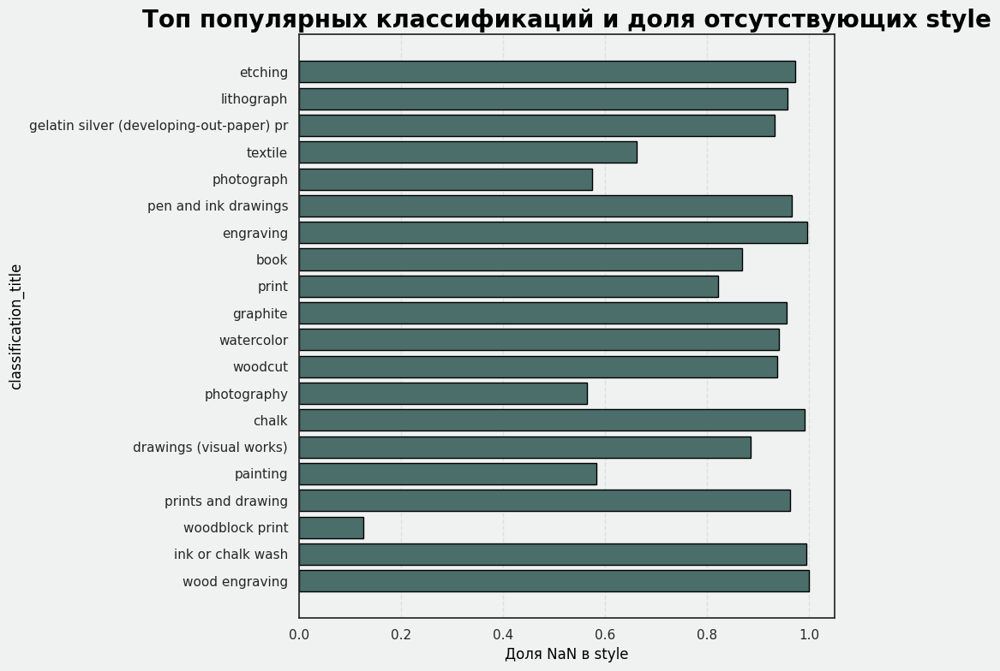

In [43]:
top20 = nan_stats.head(20)

plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_palette(["#4B6E6A"])

plt.figure(figsize=(10, 8))
plt.barh(
    top20["classification_title"],
    top20["nan_style_ratio"],
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)
plt.gca().invert_yaxis()

plt.xlabel("Доля NaN в style", color="black")
plt.ylabel("classification_title", color="black")
plt.title(
    "Топ популярных классификаций и доля отсутствующих style",
    fontsize=20,
    fontweight="bold",
    color="black"
)

plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


у самых массовых типов объектов стиль почти всегда пустой  
у painting photography и похожих доля заполненного style заметно выше  

вывод  style не универсальный атрибут  
его можно использовать как категорию  
но отсутствие стиля само по себе тоже несет смысл  
так что NaN лучше оставить как отдельное состояние

### Департаменты

смотрим как распределены работы по department и как там устроена видимость


In [44]:
vc = df["department_title"].value_counts(dropna=False)
print("доля топ 4 департаментов:", float(vc.head(4).sum() / vc.sum()))
print("доля топ 1 департамента:", float(vc.head(1).sum() / vc.sum()))

vis_rate = df.groupby("department_title")["visible"].mean().sort_values(ascending=False)
display(vis_rate)

доля топ 4 департаментов: 0.7746311848327093
доля топ 1 департамента: 0.38905711600710036


,visible
department_title,
Modern and Contemporary Art,0.250000
Textiles,0.191449
"Arts of Greece, Rome, and Byzantium",0.186333
Painting and Sculpture of Europe,0.174569
Modern Art,0.170259
Contemporary Art,0.153364
Arts of the Americas,0.086483
Prints and Drawings,0.069320
Arts of Asia,0.057279


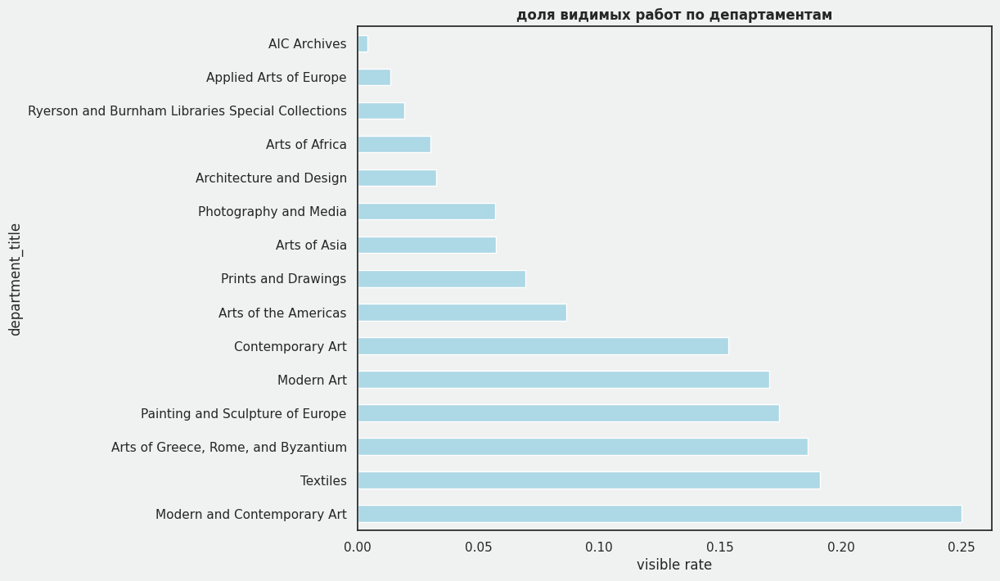

In [45]:
vis_rate.plot(kind="barh", figsize=(10, 8), color="lightblue")
plt.title("доля видимых работ по департаментам", fontweight="bold")
plt.xlabel("visible rate")
plt.show()

department сильно несбалансирован  
четыре отдела покрывают большую часть коллекции  
prints and drawings почти половина выборки  

видимость по департаментам очень разная  
есть tiny департаменты с почти нулевой долей видимых объектов  
есть отделы с высокого уровня витринностью  

это важная фича но с риском быть доминатором  
для модели логично либо объединять совсем редкие департаменты  
либо потом смотреть на стабильность важности по валидации

### Размеры и нормированная сторона

dimension_text хранит размеры в свободном текстовом виде  
для модели удобно превратить это в одну более менее сравнимую метрику


In [46]:
import re
import math

def extract_m_normalised_side(text):
    if not isinstance(text, str):
        return np.nan
    before_cm = text.split("cm")[0]
    nums = re.findall(r"\d+(?:[.,]\d+)?", before_cm)
    nums = [float(n.replace(",", ".")) for n in nums]
    if len(nums) == 0:
        return np.nan
    if len(nums) == 1:
        return math.sqrt(math.pi * nums[0] ** 2 / 10**4)
    if len(nums) == 3:
        return (nums[0] * nums[1] * nums[2] / 10**6) ** (1 / 3)
    return math.sqrt(nums[0] * nums[1] / 10**4)

df["side_normalised"] = df["dimension_text"].apply(extract_m_normalised_side)
df[["dimension_text", "side_normalised"]].head(10)


,dimension_text,side_normalised
0,Sheet (trimmed): 18 × 14.7 cm (7 1/8 × 5 13/16...,0.162665
1,20.3 × 25.4 cm (8 × 10 in.),0.227073
2,Diam.: 2.8 cm (1 1/8 in.),0.049629
3,Image/plate: 16 × 12 cm (6 5/16 × 4 3/4 in.); ...,0.138564
4,29.5 × 22.1 cm (11 5/8 × 8 3/4 in.),0.255333
5,Image/plate: 9.9 × 15.6 cm (3 15/16 × 6 3/16 i...,0.124274
6,Image: 33.6 × 25 cm (13 1/4 × 9 7/8 in.); Pape...,0.289828
7,Image: 32.8 × 19.7 cm (12 15/16 × 7 13/16 in.)...,0.254197
8,31.7 × 24.1 × 10.1 cm (12 1/2 × 9 1/2 × 4 in.),0.197606
9,Image/plate: 5.9 × 8.1 cm (2 3/8 × 3 1/4 in.);...,0.069130


In [47]:
pd.set_option("display.float_format", lambda x: f"{x:.2f}")
df["side_normalised"].describe()

,side_normalised
count,128734.00
mean,0.54
std,54.11
min,0.00
25%,0.15
50%,0.24
75%,0.40
max,19217.16


по описанию видно что есть длинный хвост крупных объектов  
выбросы оставляем на следующий этап где будем отдельно разбираться с аномалиями  

для модели side_normalised хороший компактный числовой признак  
можно потом еще забиннить по размерам

In [48]:
art_cols.append("side_normalised")
df = df.drop(columns=["dimension_text"])
art_cols.remove("dimension_text")

### превью и цветность

смотрим на высоту и ширину превью и связь с таргетом  
плюс colorfulness


In [49]:
df[["thumbnail_height", "thumbnail_width"]].describe()

,thumbnail_height,thumbnail_width
count,119902.00,119902.00
mean,2867.89,2845.82
std,1631.74,1664.96
min,0.00,0.00
25%,2186.00,2035.00
50%,2342.00,2548.00
75%,3000.00,3000.00
max,32473.00,65000.00


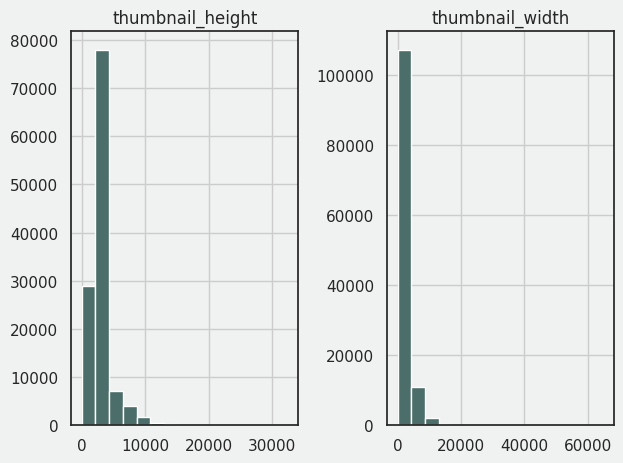

In [50]:
df[["thumbnail_height", "thumbnail_width"]].hist(bins=15)
plt.tight_layout()
plt.show()

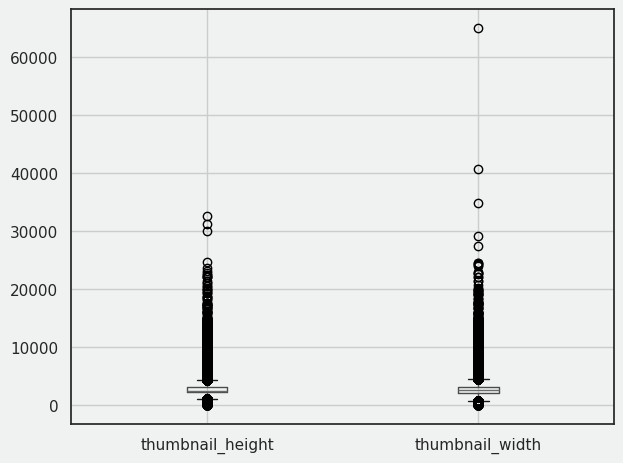

In [51]:
df[["thumbnail_height", "thumbnail_width"]].boxplot()
plt.tight_layout()
plt.show()

по распределениям видно выбросы и перекос  
для деревьев это не трагедия  
но height и width сильно коррелируют друг с другом  

логично заменить их общей площадью превью

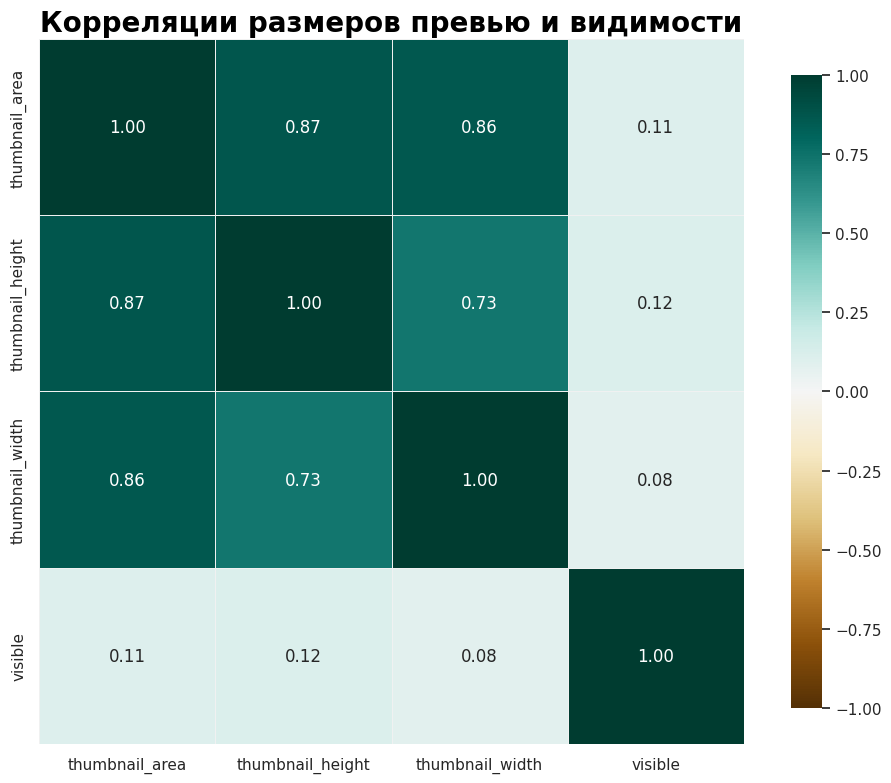

In [52]:
df["thumbnail_area"] = df["thumbnail_height"] * df["thumbnail_width"] / 10**4
sizes = df[["thumbnail_area", "thumbnail_height", "thumbnail_width", "visible"]]
corr = sizes.corr(numeric_only=True)

plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_theme(style="white")

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="BrBG",
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=0.5,
    linecolor="#F0F1F1",
    cbar_kws={"shrink": 0.9}
)
plt.title("Корреляции размеров превью и видимости", fontsize=20, fontweight="bold", color="black")
plt.tight_layout()
plt.show()

площадь превью стабильно коррелирует с остальными размерами  
удобно оставить только ее чтобы не плодить лишнюю мультиколлинеарность

In [53]:
df = df.drop(["thumbnail_height", "thumbnail_width"], axis=1)
art_cols.remove("thumbnail_height")
art_cols.remove("thumbnail_width")
art_cols.append("thumbnail_area")

### medium_display как набор материалов

medium_display полностью текстовый но это важная характеристика  
берем самые частые слова по материалам и делаем multi hot фичи


In [54]:
import re
from collections import Counter

texts = df["medium_display"].dropna().astype(str)

def clean_text(t):
    t = t.lower()
    t = re.sub(r"[^a-zA-Z0-9 ]", " ", t)
    return t

all_words = []
for t in texts:
    cleaned = clean_text(t)
    words = cleaned.split()
    words = [w for w in words if len(w) > 3]
    all_words.extend(words)

top40_words = [w for w, c in Counter(all_words).most_common(40)]
print("топ слов из medium:", top40_words)


топ слов из medium: ['paper', 'print', 'wove', 'with', 'laid', 'black', 'ivory', 'silver', 'gelatin', 'color', 'cream', 'etching', 'lithograph', 'white', 'woodblock', 'weave', 'graphite', 'plain', 'silk', 'brown', 'from', 'engraving', 'printed', 'cotton', 'down', 'glass', 'over', 'book', 'brush', 'watercolor', 'chalk', 'gray', 'blue', 'wash', 'wood', 'drypoint', 'linen', 'oban', 'aquatint', 'colored']


In [55]:
for word in top40_words:
    df[f"md_{word}"] = df["medium_display"].apply(
        lambda x: int(isinstance(x, str) and (word in clean_text(x).split()))
    )

top40_cols = [f"md_{w}" for w in top40_words]
df[top40_cols].head()

,md_paper,md_print,md_wove,md_with,md_laid,md_black,md_ivory,md_silver,md_gelatin,md_color,md_cream,md_etching,md_lithograph,md_white,md_woodblock,md_weave,md_graphite,md_plain,md_silk,md_brown,md_from,md_engraving,md_printed,md_cotton,md_down,md_glass,md_over,md_book,md_brush,md_watercolor,md_chalk,md_gray,md_blue,md_wash,md_wood,md_drypoint,md_linen,md_oban,md_aquatint,md_colored
0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
4,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0


In [56]:
df["medium_word_count"] = df["medium_display"].fillna("").str.split().str.len()
df[["medium_display", "medium_word_count"]].head()

,medium_display,medium_word_count
0,Etching on ivory laid paper,5
1,Blue ballpoint pen and colored pencil on cream...,10
2,Bronze,1
3,Aquatint with stop-out varnish and drypoint on...,13
4,Black chalk on blue laid paper,6


In [57]:
df = df.drop("medium_display", axis=1)
art_cols.remove("medium_display")
art_cols += top40_cols
art_cols.append("medium_word_count")

итог  сам текст medium мы убрали  
оставили количество слов и набор бинарных фичей по самым частым материалам  
для catboost и бустингов это нормальный формат

### заголовок работы

с title делаем два шага  

1  длина заголовка по словам  
2  тематические компоненты через tfidf плюс svd


In [58]:
df["title_word_count"] = df["title"].fillna("").str.split().apply(len)

In [59]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

text_col = df["title"].fillna("").astype(str)

tfidf = TfidfVectorizer(
    max_features=5000,
    stop_words="english",
    ngram_range=(1, 2),
)

tfidf_matrix = tfidf.fit_transform(text_col)

svd = TruncatedSVD(
    n_components=20,
    random_state=42,
)

topics_matrix = svd.fit_transform(tfidf_matrix)

for i in range(20):
    df[f"title_topic_{i}"] = topics_matrix[:, i]

print("темы по title:", [f"title_topic_{i}" for i in range(20)])

темы по title: ['title_topic_0', 'title_topic_1', 'title_topic_2', 'title_topic_3', 'title_topic_4', 'title_topic_5', 'title_topic_6', 'title_topic_7', 'title_topic_8', 'title_topic_9', 'title_topic_10', 'title_topic_11', 'title_topic_12', 'title_topic_13', 'title_topic_14', 'title_topic_15', 'title_topic_16', 'title_topic_17', 'title_topic_18', 'title_topic_19']


In [60]:
df = df.drop("title", axis=1)
art_cols.remove("title")
for i in range(20):
    art_cols.append(f"title_topic_{i}")
art_cols.append("title_word_count")
df[art_cols].head()

,artwork_id,classification_title,department_title,style_title,is_public_domain,credit_line,colorfulness_extra,image_id,has_advanced_imaging_extra,has_educational_resources_extra,has_multimedia_resources_extra,is_zoomable_extra,visible,was_exhibited,in_product,in_publication,side_normalised,thumbnail_area,md_paper,md_print,md_wove,md_with,md_laid,md_black,md_ivory,md_silver,md_gelatin,md_color,md_cream,md_etching,md_lithograph,md_white,md_woodblock,md_weave,md_graphite,md_plain,md_silk,md_brown,md_from,md_engraving,md_printed,md_cotton,md_down,md_glass,md_over,md_book,md_brush,md_watercolor,md_chalk,md_gray,md_blue,md_wash,md_wood,md_drypoint,md_linen,md_oban,md_aquatint,md_colored,medium_word_count,title_topic_0,title_topic_1,title_topic_2,title_topic_3,title_topic_4,title_topic_5,title_topic_6,title_topic_7,title_topic_8,title_topic_9,title_topic_10,title_topic_11,title_topic_12,title_topic_13,title_topic_14,title_topic_15,title_topic_16,title_topic_17,title_topic_18,title_topic_19,title_word_count
0,274738,print,Prints and Drawings,NaN,False,The Amanda S. Johnson and Marion J. Livingston...,0.00,e7d33c90-66ff-233a-08f5-73b10d09c65e,False,False,False,False,0,0,0,0,0.16,81.62,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0.00,0.00,0.00,0.00,0.01,0.00,0.04,-0.01,0.01,0.01,0.04,0.04,0.00,-0.00,0.03,0.06,0.07,0.24,0.02,0.01,11
1,207576,ball-point pen,Prints and Drawings,NaN,False,Gift of the Raymond K. Yoshida Living Trust an...,46.26,ed68141e-d404-7972-c47a-67a0e6858908,False,False,False,False,0,0,0,0,0.23,719.40,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,10,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,5
2,141686,coin,"Arts of Greece, Rome, and Byzantium","roman (ancient, style or period)",True,Gift of William F. Dunham,8.05,3ba6b302-20b1-c966-4ca1-254b9d522591,False,False,False,True,0,0,0,0,0.05,453.30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.00,0.00,0.00,0.00,0.04,0.77,-0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,4
3,229035,aquatint,Prints and Drawings,NaN,False,Gift of Browne Goodwin in memory of Diane Goodwin,8.26,c5681cda-b72a-c788-ce14-886a48e956e2,False,False,False,False,0,0,0,0,0.14,680.40,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,13,0.00,0.00,0.00,0.00,0.01,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.01,0.00,-0.00,-0.00,0.01,11
4,85059,graphite,Prints and Drawings,NaN,True,The Leonora Hall Gurley Memorial Collection,9.67,d6fc702b-aea4-6534-4983-3d6ac606ab21,False,False,False,True,0,0,0,0,0.26,682.80,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,6,0.00,0.00,0.00,0.00,0.00,0.00,0.02,-0.00,0.02,0.00,0.03,0.03,0.00,-0.00,0.01,0.01,0.02,0.03,0.01,0.00,8


длина title в словах может отличать технические описания от нормальных названий  
темы из svd дают более мягкое многоразмерное описание сюжета работы

### credit line

берем только количество слов в кредитной строке  
сам текст пока не трогаем


In [61]:
df["credit_line_word_count"] = df["credit_line"].fillna("").str.split().apply(len)
df = df.drop(columns=["credit_line"])

In [62]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")


##  3.  Активность работы: выставки, мерч, публикации и итоговая видимость


(выполняла Анна Лебедева)

Этот блок данных отражает музейную жизнь объекта и традиционно считается самым информативным. Здесь есть сведения о количестве выставок, типах продуктов, упоминаниях в документах и других формах публичной активности. На этапе исследования было важно понять, как связаны уровни активности с итоговой видимостью и существуют ли нелинейные или пороговые эффекты.

Первое, что обнаруживается при анализе данных - сильная несбалансированность выборки. Доля видимых работ составляет примерно семь процентов. Это означает, что большинство объектов никогда не было выставлено или задействовано в цифровых формах, и модель должна учитывать этот перекос.

Анализ активности показал, что различия между видимыми и невидимыми объектами выражены резко. У видимых работ значения exhibition_count, product_count, n_documents и других показателей выше на порядок. Зависимость между числом выставок и вероятностью видимости носит нелинейный характер. Переход от нуля к одной-двум выставкам значительно увеличивает вероятность нахождения работы в витрине, а все, что выше - закрепляет этот эффект.

Совместное рассмотрение выставочной, продуктовой и публикационной активности выявило ощущаемую синергию. Наличие хотя бы двух типов активности одновременно заметно поднимает вероятность видимости. Это логичное отражение того, что яркие произведения часто вовлекаются в несколько форм музейной деятельности.

Отдельного внимания требует временная сторона активности. Работы, участвовавшие в выставках в последние годы, демонстрируют повышенную вероятность видимости. Это отражает эффект недавней публичности. Однако такие признаки напрямую связаны с будущими событиями относительно момента предсказания и несут риск утечки. Поэтому они не были включены в финальный фичсет.

В итоге для модели отобраны только безопасные признаки: exhibition_count, product_count, бинарные признаки фактов активности, публикационные счетчики, total_activity и activity_diversity. Вся информация, связанная с последними датами активности или лагами, полностью исключена.

In [78]:

features = [
    "was_exhibited",
    "exhibition_count",
    "last_exhibition_year",
    "time_since_last_exhibition",
    "in_product",
    "product_count",
    "product_types",
    "in_publication",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "visible"
]

work_df = df[features].copy()
print("размер рабочего датасета:", work_df.shape)
work_df.head()


размер рабочего датасета: (134078, 13)


,was_exhibited,exhibition_count,last_exhibition_year,time_since_last_exhibition,in_product,product_count,product_types,in_publication,n_documents,n_sections,n_sites,n_texts,visible
0,0,0,NaN,NaN,0,0,NaN,0,0,0,0,0,0
1,0,0,NaN,NaN,0,0,NaN,0,0,0,0,0,0
2,0,0,NaN,NaN,0,0,NaN,0,0,0,0,0,0
3,0,0,NaN,NaN,0,0,NaN,0,0,0,0,0,0
4,0,0,NaN,NaN,0,0,NaN,0,0,0,0,0,0


### пропуски в блоке активности

смотрим где и почему есть NaN


In [79]:
missing = work_df.isnull().sum()
missing_pct = (missing / len(work_df)) * 100
missing_df = pd.DataFrame({"count": missing, "percent": missing_pct})
missing_df

,count,percent
was_exhibited,0,0.00
exhibition_count,0,0.00
last_exhibition_year,125763,93.80
time_since_last_exhibition,125763,93.80
in_product,0,0.00
product_count,0,0.00
product_types,134078,100.00
in_publication,0,0.00
n_documents,0,0.00
n_sections,0,0.00


In [80]:
missing_df[missing_df["count"] > 0].sort_values("count", ascending=False)

,count,percent
product_types,134078,100.00
last_exhibition_year,125763,93.80
time_since_last_exhibition,125763,93.80


In [81]:
no_year = work_df[work_df["last_exhibition_year"].isna()]
print("работы без last_exhibition_year:", len(no_year))
print("из них was_exhibited 0:", int((no_year["was_exhibited"] == 0).sum()))
print("из них was_exhibited 1:", int((no_year["was_exhibited"] == 1).sum()))

работы без last_exhibition_year: 125763
из них was_exhibited 0: 125763
из них was_exhibited 1: 0


картина логичная  
у работ без выставок нет last_exhibition_year и time_since_last_exhibition  
product_types вообще пустой по всему датасету его можно просто убрать

###  заполнение пропусков и чистка

делаем техническое заполнение для временных признаков и выбрасываем полностью пустой product_types  
значение 9999 используем как маркер нет выставок


In [82]:
work_df["last_exhibition_year"] = work_df["last_exhibition_year"].fillna(9999)
work_df["time_since_last_exhibition"] = work_df["time_since_last_exhibition"].fillna(9999)
work_df = work_df.drop("product_types", axis=1)
print("пропуски после заполнения:")
work_df.isnull().sum()

пропуски после заполнения:


,0
was_exhibited,0
exhibition_count,0
last_exhibition_year,0
time_since_last_exhibition,0
in_product,0
product_count,0
in_publication,0
n_documents,0
n_sections,0
n_sites,0


### Баланс классов visible

сразу смотрим на разбалансировку таргета

невидимых работ visible 0: 124256  это примерно 92.7 процентов
видимых работ visible 1: 9822  это примерно 7.3 процентов


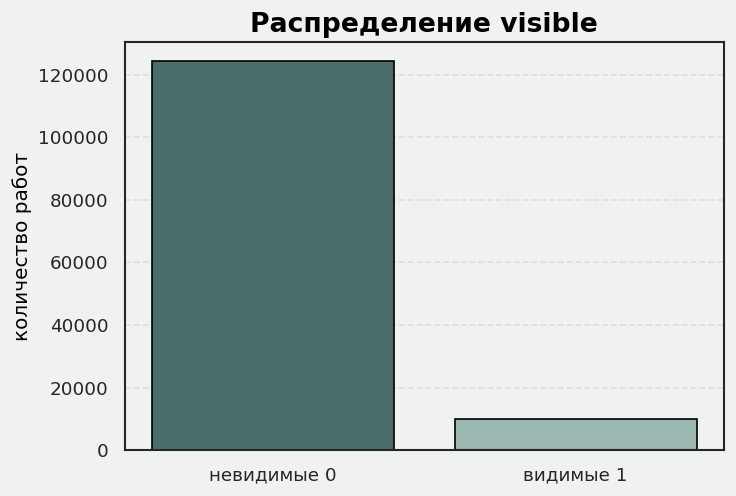

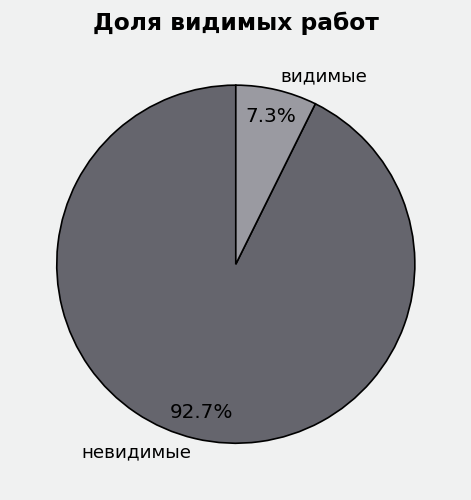

In [83]:
visible_counts = work_df["visible"].value_counts().sort_index()
visible_pct = visible_counts / len(work_df) * 100

print(f"невидимых работ visible 0: {visible_counts.get(0, 0)}  это примерно {visible_pct.get(0, 0):.1f} процентов")
print(f"видимых работ visible 1: {visible_counts.get(1, 0)}  это примерно {visible_pct.get(1, 0):.1f} процентов")

plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})


plt.figure(figsize=(6, 4))
plt.bar(
    [0, 1],
    [visible_counts.get(0, 0), visible_counts.get(1, 0)],
    color=["#4B6E6A", "#9BB8B3"],
    edgecolor="black",
    linewidth=1
)
plt.xticks([0, 1], ["невидимые 0", "видимые 1"])
plt.ylabel("количество работ", color="black")
plt.title("Распределение visible", fontsize=16, fontweight="bold", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout(pad=0.2)
plt.show()

plt.figure(figsize=(4, 4))
plt.pie(
    [visible_counts.get(0, 0), visible_counts.get(1, 0)],
    labels=["невидимые", "видимые"],
    autopct="%1.1f%%",
    startangle=90,
    colors=["#65656D", "#9A9AA1"],
    wedgeprops={"edgecolor": "black", "linewidth": 1},
    textprops={"color": "black"},
    pctdistance=0.85,
    labeldistance=1.08
)
plt.title("Доля видимых работ", fontsize=14, fontweight="bold", color="black")
plt.tight_layout(pad=0.1)
plt.show()

видно тяжёлый перекос в сторону нулевого класса  
видимых работ по доле заметно меньше  
на этапе моделей это надо будет учитывать через веса классов или техники типa oversampling


### базовая статистика по активностям


In [84]:
work_df.describe()

,was_exhibited,exhibition_count,last_exhibition_year,time_since_last_exhibition,in_product,product_count,in_publication,n_documents,n_sections,n_sites,n_texts,visible
count,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00,134078.00
mean,0.06,0.07,9503.61,9379.77,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.07
std,0.24,0.29,1926.61,2408.22,0.01,0.12,0.12,0.08,0.10,0.04,0.05,0.26
min,0.00,0.00,1936.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,9999.00,9999.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,9999.00,9999.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,9999.00,9999.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,1.00,7.00,9999.00,9999.00,1.00,22.00,1.00,4.00,7.00,1.00,2.00,1.00


### активность и средняя видимость

смотрим средние значения активностей у видимых и невидимых работ


In [85]:
activity_features = [
    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
]

for feat in activity_features:
    mean_visible = work_df[work_df["visible"] == 1][feat].mean()
    mean_not_visible = work_df[work_df["visible"] == 0][feat].mean()
    print(f"{feat:20s} visible {mean_visible:7.2f}  not_visible {mean_not_visible:7.2f}")

exhibition_count     visible    0.95  not_visible    0.00
product_count        visible    0.01  not_visible    0.00
n_documents          visible    0.08  not_visible    0.00
n_sections           visible    0.11  not_visible    0.00
n_sites              visible    0.02  not_visible    0.00
n_texts              visible    0.03  not_visible    0.00


у видимых работ все показатели активности выше на порядок  
это прямое подтверждение того что активность главный источник сигнала в этом блоке

### зависимость вероятности видимости от уровня активности


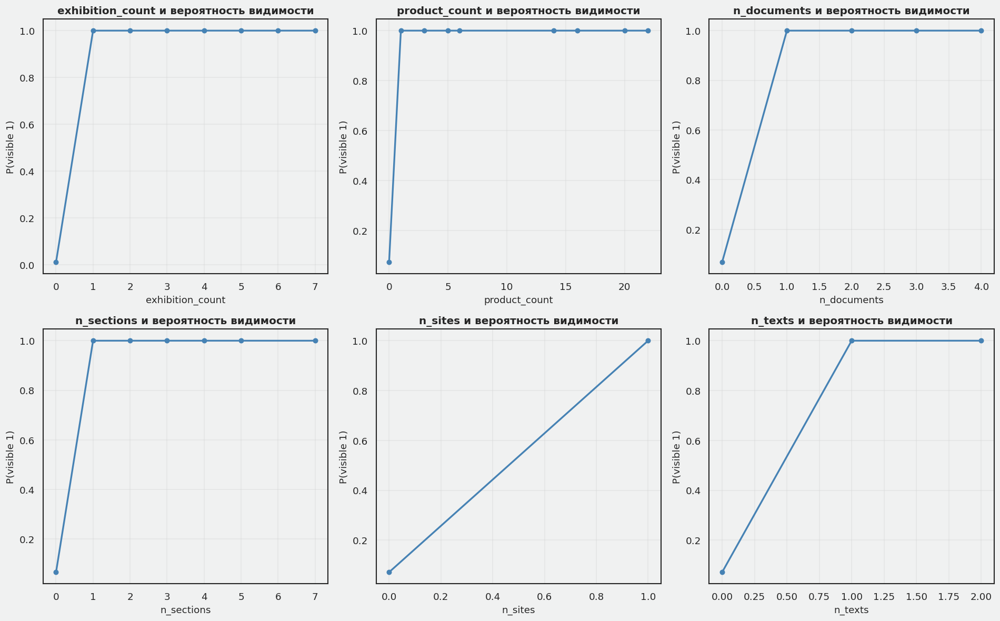

In [86]:
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for i, feat in enumerate(activity_features):
    visible_prob = work_df.groupby(feat)["visible"].mean()
    axes[i].plot(
        visible_prob.index[:50],
        visible_prob.values[:50],
        marker="o",
        linewidth=2,
        markersize=5,
        color="steelblue",
    )
    axes[i].set_xlabel(feat, fontsize=11)
    axes[i].set_ylabel("P(visible 1)", fontsize=11)
    axes[i].set_title(f"{feat} и вероятность видимости", fontsize=12, fontweight="bold")
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

все графики показывают одну и ту же историю  
чем больше выставок продуктов и публикаций тем выше шанс что работа окажется видимой  
зависимость явно нелинейная особенно по выставкам

### распределения активностей по классам


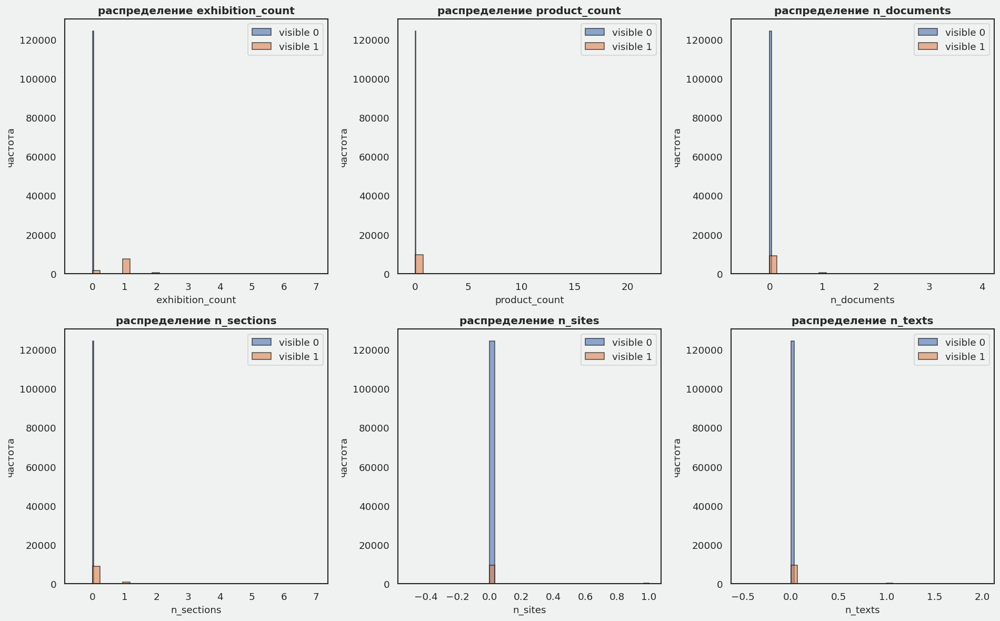

In [87]:
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for i, feat in enumerate(activity_features):
    for vis in [0, 1]:
        subset = work_df[work_df["visible"] == vis][feat]
        axes[i].hist(
            subset,
            bins=30,
            alpha=0.6,
            label=f"visible {vis}",
            edgecolor="black",
        )
    axes[i].set_xlabel(feat, fontsize=11)
    axes[i].set_ylabel("частота", fontsize=11)
    axes[i].set_title(f"распределение {feat}", fontsize=12, fontweight="bold")
    axes[i].legend()

plt.tight_layout()
plt.show()

распределения все с тяжелым хвостом  
много объектов с нулевой активностью  
мало объектов с высокой активностью но именно там сосредоточены видимые работы

### пороговые эффекты по выставкам и продуктам

грубый биннинг по числу выставок и продуктов


In [88]:
bins = [0, 1, 3, 5, 10, 100]
labels = ["0", "1 2", "3 4", "5 9", "10+"]

work_df["exh_cat"] = pd.cut(work_df["exhibition_count"], bins=bins, labels=labels)
work_df.groupby("exh_cat", observed=True)["visible"].agg(["count", "mean"])

,count,mean
exh_cat,,
0,7534,1.00
1 2,731,1.00
3 4,46,1.00
5 9,4,1.00


In [89]:
work_df["prod_cat"] = pd.cut(work_df["product_count"], bins=bins, labels=labels)
work_df.groupby("prod_cat", observed=True)["visible"].agg(["count", "mean"])

,count,mean
prod_cat,,
0,1,1.00
1 2,3,1.00
3 4,1,1.00
5 9,1,1.00
10+,6,1.00


видно чистый пороговый эффект  
ноль выставок почти всегда невидимость  
одна две выставки заметно поднимают шансы  
три и больше дают уже сильно более высокий уровень видимости  

такую нелинейность линейная модель поймает плохо  
зато бустинг по деревьям отработает нормально

### Временной аспект выставочной активности


In [90]:
work_df_year = work_df[work_df["last_exhibition_year"] != 9999].copy()
print("работ с реальной датой выставки:", len(work_df_year))
print("работ без выставок:", int((work_df["last_exhibition_year"] == 9999).sum()))

работ с реальной датой выставки: 8315
работ без выставок: 125763


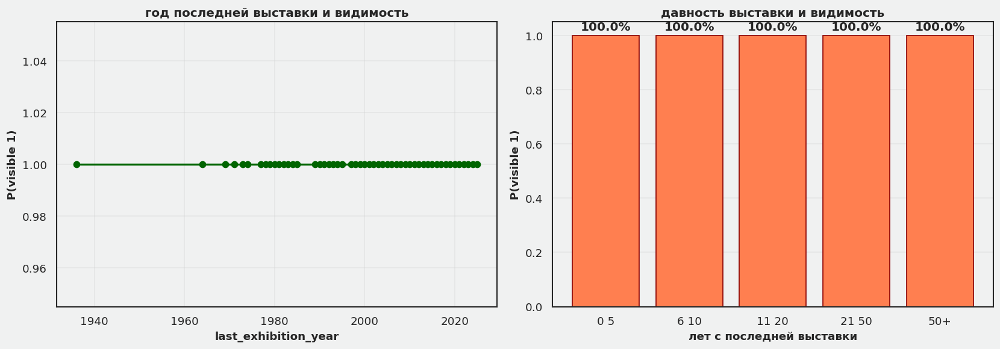

In [91]:
year_prob = work_df_year.groupby("last_exhibition_year")["visible"].mean()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(
    year_prob.index,
    year_prob.values,
    marker="o",
    linewidth=2,
    markersize=6,
    color="darkgreen",
)
ax1.set_xlabel("last_exhibition_year", fontsize=11, fontweight="bold")
ax1.set_ylabel("P(visible 1)", fontsize=11, fontweight="bold")
ax1.set_title("год последней выставки и видимость", fontsize=12, fontweight="bold")
ax1.grid(True, alpha=0.3)

bins_time = [0, 5, 10, 20, 50, 100]
work_df_time = work_df[work_df["time_since_last_exhibition"] != 9999].copy()
work_df_time["time_cat"] = pd.cut(
    work_df_time["time_since_last_exhibition"],
    bins=bins_time,
    labels=["0 5", "6 10", "11 20", "21 50", "50+"],
)

time_prob = work_df_time.groupby("time_cat", observed=True)["visible"].agg(["count", "mean"])
ax2.bar(range(len(time_prob)), time_prob["mean"].values, color="coral", edgecolor="darkred")
ax2.set_xticks(range(len(time_prob)))
ax2.set_xticklabels(time_prob.index)
ax2.set_xlabel("лет с последней выставки", fontsize=11, fontweight="bold")
ax2.set_ylabel("P(visible 1)", fontsize=11, fontweight="bold")
ax2.set_title("давность выставки и видимость", fontsize=12, fontweight="bold")
ax2.grid(True, alpha=0.3, axis="y")

for i, (_, row) in enumerate(time_prob.iterrows()):
    ax2.text(i, row["mean"] + 0.02, f"{row['mean']:.1%}", ha="center", fontweight="bold")

plt.tight_layout()
plt.show()

чем свежее выставка тем выше шанс что работа видима  
давно не выставлявшиеся объекты имеют низкую вероятность  
это типичный recency эффект  
на этапе моделей с этим надо быть аккуратно чтобы не залезть в утечки по времени

### Корреляции активностей


In [92]:
numeric_features = [
    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "visible",
]

corr_matrix = work_df[numeric_features].corr()
corr_matrix

,exhibition_count,product_count,n_documents,n_sections,n_sites,n_texts,visible
exhibition_count,1.00,0.01,0.02,0.04,0.03,0.00,0.85
product_count,0.01,1.00,0.13,0.03,0.03,0.06,0.03
n_documents,0.02,0.13,1.00,0.05,0.06,0.63,0.24
n_sections,0.04,0.03,0.05,1.00,0.02,0.03,0.28
n_sites,0.03,0.03,0.06,0.02,1.00,0.02,0.15
n_texts,0.00,0.06,0.63,0.03,0.02,1.00,0.17
visible,0.85,0.03,0.24,0.28,0.15,0.17,1.00


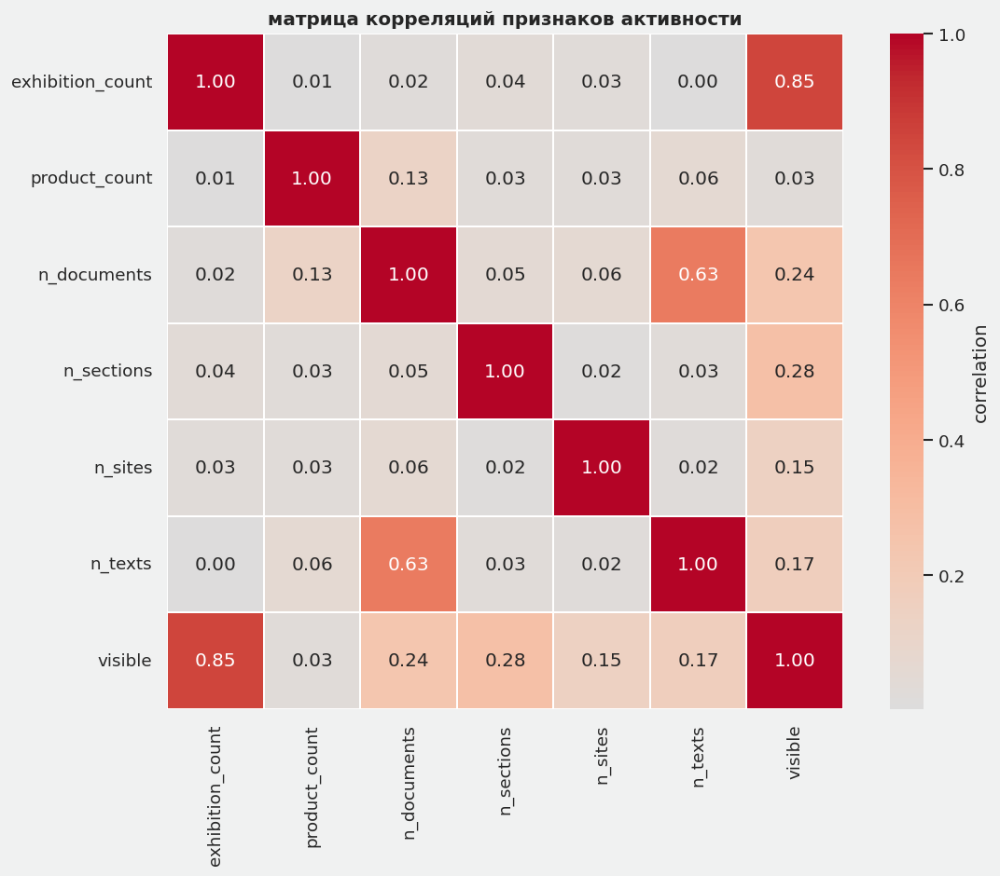

,visible
visible,1.00
exhibition_count,0.85
n_sections,0.28
n_documents,0.24
n_texts,0.17
n_sites,0.15
product_count,0.03


In [93]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"label": "correlation"},
    ax=ax,
)
ax.set_title("матрица корреляций признаков активности", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()

corr_matrix["visible"].sort_values(ascending=False)


самая сильная связь с видимостью у exhibition_count и product_count  
публикационные признаки между собой почти коллинеарны  
логично потом собрать их в один агрегат типа total_publications  
чтобы не плодить избыточных измерений

### Совместное влияние разных активностей


In [94]:
pd.crosstab(
    [work_df["was_exhibited"], work_df["in_product"]],
    work_df["visible"],
    margins=True,
    normalize="index",
)

visible                     0    1
was_exhibited in_product          
0             0          0.99 0.01
              1          0.00 1.00
1             0          0.00 1.00
              1          0.00 1.00
All                      0.93 0.07

In [95]:
interaction_prob = (
    work_df.groupby(["was_exhibited", "in_product", "in_publication"])["visible"]
    .agg(["count", "mean"])
    .sort_values("mean", ascending=False)
)
interaction_prob.head(10)

count  mean
was_exhibited in_product in_publication              
0             0          1                 1499  1.00
              1          0                    3  1.00
                         1                    5  1.00
1             0          0                 8002  1.00
              1          0                    1  1.00
              0          1                  309  1.00
              1          1                    3  1.00
0             0          0               124256  0.00

In [96]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")

## 4. Временная ось: создание, музейная история и ось «последней видимости

(выполняла Василиса Попова)

Временной блок данных помогает понять, как художественные эпохи, возраст работы и музейная история влияют на ее видимость. Важная задача заключалась в том, чтобы разделить признаки, которые можно безопасно использовать в модели, и признаки, содержащие информацию о будущих событиях.

Годы создания охватывают период примерно от XI века до современности, однако наиболее плотная концентрация объектов приходится на XIX и XX века. Чтобы получить интерпретируемые признаки, годы создания были преобразованы в несколько форм представления: work_age, creation_decade и century. Все три формы оказались устойчивыми и удобными для моделирования.

Возраст работы показал нелинейную связь с видимостью. Молодые объекты видимы реже, затем вероятность растет и выходит на устойчивый уровень у работ возрастом от пятидесяти до двухсот лет, после чего снова изменяется. Это свойство делает возраст одним из важных интерпретируемых факторов и одновременно подчеркивает необходимость бинирования.

Важным этапом было исследование лагов до последних активностей. Анализ показал, что лаги распределены неравномерно: часть работ становится видимой почти сразу, часть спустя десятилетия. Такие признаки хорошо описывают музейную историю объекта, но в прогностической задаче становятся источником прямой утечки. По этой причине они не были включены в модель.

Колонки last_visible_year, last_exhibition_year, last_product_year и такие же временные лаги также были исключены. По структуре данных видно, что они отражают только уже состоявшиеся события и фактически кодируют сам факт видимости. Это делает их непригодными для обучения модели, цель которой — прогноз по состоянию на фиксированный момент времени.

Географические координаты не показали полезности. Практически все координаты отсутствуют, а присутствующие точки совпадают с расположением музея. Поэтому в модели сохранена только place_of_origin как полноценная географическая категория.

В итоге временной фичсет был сведён к нескольким устойчивым признакам: work_age, creation_decade, century и age_bucket. Они дают модели информацию об эпохе и возрасте без риска использования недопустимых временных подсказок.

In [97]:
time_cols = [
    'date_start', 'date_end', 'date_display',
    'last_exhibition_year', 'time_since_last_exhibition',
    'last_product_year', 'time_since_last_product',
    'last_publication_year', 'time_since_last_publication',
    'last_visible_year', 'time_since_last_visible',
    'source_updated_at'
]

geo_cols = [
    'latitude', 'longitude', 'latlon',
    'geo_has_coords', 'geo_quadrant',
    'place_of_origin'
]

time_geo_df = df[time_cols + geo_cols + ['visible']].copy()
time_geo_df['date_start_num'] = pd.to_numeric(time_geo_df['date_start'], errors='coerce')
time_geo_df['date_end_num']   = pd.to_numeric(time_geo_df['date_end'], errors='coerce')

time_geo_df[['date_start_num', 'date_end_num']].describe()

,date_start_num,date_end_num
count,129018.00,129018.00
mean,-12398.77,1850.84
std,5079558.13,19684.54
min,-1824528578.00,-4713.00
25%,1778.00,1800.00
50%,1896.00,1908.00
75%,1959.00,1963.00
max,19931.00,5000001.00


### Распределение по годам создания: эпохи, пики, тренды

In [98]:
year_ref=2025

In [99]:
valid_creation = time_geo_df[time_geo_df['date_start_num'].between(1000, year_ref)].copy()
valid_creation['visible'] = valid_creation['visible'].astype(int)

valid_creation['date_start_num'].describe()

,date_start_num
count,121684.00
mean,1856.97
std,147.38
min,1000.00
25%,1801.00
50%,1903.00
75%,1961.00
max,2024.00


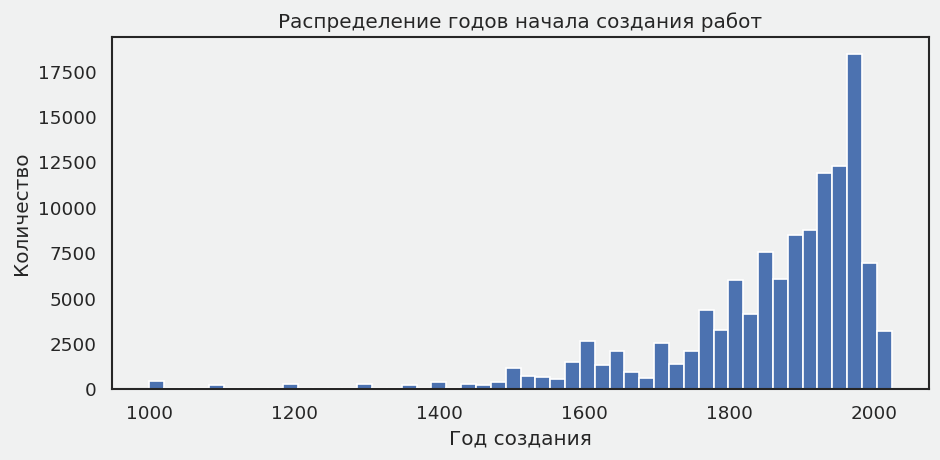

In [100]:
fig, ax = plt.subplots()
valid_creation['date_start_num'].plot(kind='hist', bins=50, ax=ax)
ax.set_title('Распределение годов начала создания работ')
ax.set_xlabel('Год создания')
ax.set_ylabel('Количество')
plt.tight_layout()
plt.show()

### Десятилетия и века

In [101]:
valid_creation['creation_decade'] = (valid_creation['date_start_num'] // 10 * 10).astype('Int64')
valid_creation['century'] = (valid_creation['date_start_num'] // 100 + 1).astype('Int64')

decade_stats = (
    valid_creation
    .groupby('creation_decade')
    .agg(
        n=('visible', 'size'),
        visible_rate=('visible', 'mean')
    )
    .reset_index()
    .dropna(subset=['creation_decade'])
)

decade_stats.tail(15)

,creation_decade,n,visible_rate
86,1880,2741,0.09
87,1890,4430,0.13
88,1900,4427,0.07
89,1910,4661,0.08
90,1920,5754,0.10
91,1930,5289,0.09
92,1940,5985,0.09
93,1950,5163,0.08
94,1960,10782,0.08
95,1970,8527,0.05


### Плотность по десятилетиям

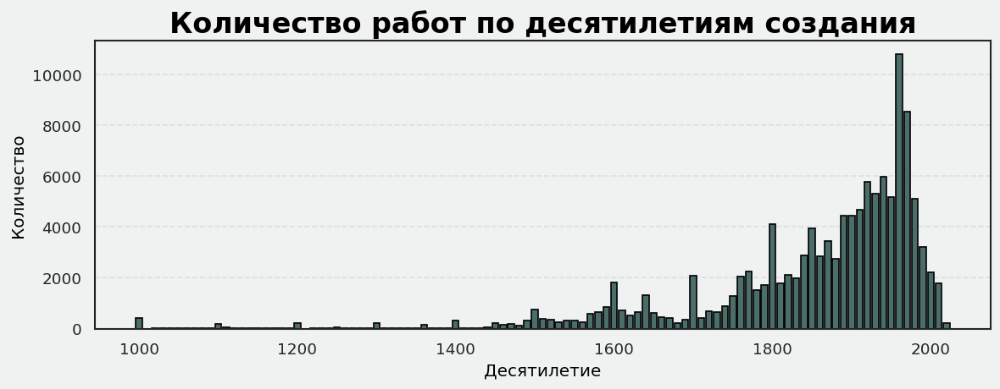

In [102]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_palette(["#4B6E6A"])

fig, ax = plt.subplots(figsize=(10, 4))

ax.bar(
    decade_stats["creation_decade"].astype(float),
    decade_stats["n"],
    width=8,
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)

ax.set_title(
    "Количество работ по десятилетиям создания",
    fontsize=20,
    fontweight="bold",
    color="black"
)
ax.set_xlabel("Десятилетие", color="black")
ax.set_ylabel("Количество", color="black")

ax.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()

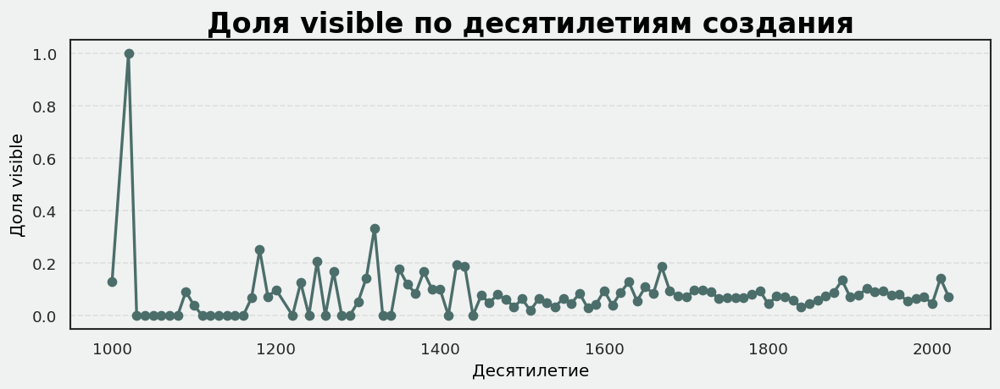

In [103]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_palette(["#4B6E6A"])

fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(
    decade_stats["creation_decade"].astype(float),
    decade_stats["visible_rate"],
    color="#4B6E6A",
    linewidth=2,
    marker="o"
)

ax.set_title(
    "Доля visible по десятилетиям создания",
    fontsize=20,
    fontweight="bold",
    color="black"
)
ax.set_xlabel("Десятилетие", color="black")
ax.set_ylabel("Доля visible", color="black")

ax.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()

### Возраст работы и лаги до активности

In [104]:
time_geo_df['work_age'] = year_ref - time_geo_df['date_start_num']
time_df = time_geo_df[time_geo_df['date_start_num'].between(1000, year_ref)].copy()
time_df['visible'] = time_df['visible'].astype(int)

In [105]:
def plot_feature_vs_visible_rate(df, feature, bins=20, min_count=100, title=None):
    tmp = df[[feature, "visible"]].dropna().copy()
    tmp["bin"] = pd.qcut(tmp[feature], q=bins, duplicates="drop")

    stats = (
        tmp.groupby("bin")["visible"]
           .agg(["size", "mean"])
           .rename(columns={"size": "n", "mean": "visible_rate"})
           .reset_index()
    )
    stats = stats[stats["n"] >= min_count]
    stats["bin_center"] = stats["bin"].apply(lambda x: (x.left + x.right) / 2)

    fig, ax = plt.subplots()
    ax.plot(stats["bin_center"], stats["visible_rate"], marker="o")
    ax.set_xlabel(feature)
    ax.set_ylabel("Доля visible")
    ax.set_title(title or f"{feature} vs доля visible")
    plt.tight_layout()
    plt.show()

    return stats

/tmp/ipython-input-1065915523.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tmp.groupby("bin")["visible"]


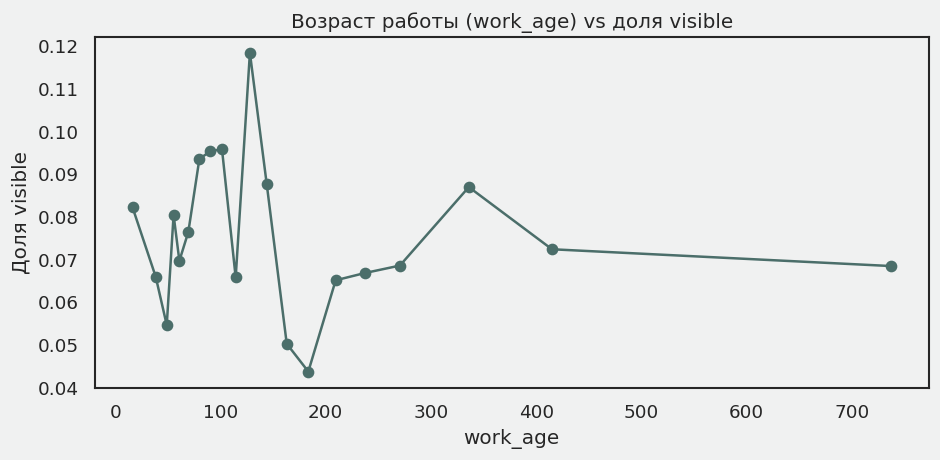

In [106]:
age_stats = plot_feature_vs_visible_rate(
    time_df,
    feature="work_age",
    bins=20,
    min_count=100,
    title="Возраст работы (work_age) vs доля visible"
)

### Лаг от создания до последней видимости

In [107]:
lag_df = time_geo_df.copy()
lag_df['lag_creation_to_last_visible'] = lag_df['last_visible_year'] - lag_df['date_start_num']

lag_valid = lag_df[
    lag_df['lag_creation_to_last_visible'].notna()
    & lag_df['date_start_num'].between(1000, year_ref)
    & lag_df['last_visible_year'].between(1000, year_ref)
]

lag_valid['lag_creation_to_last_visible'].describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9])

,lag_creation_to_last_visible
count,8215.00
mean,149.86
std,146.09
min,0.00
10%,35.00
25%,55.00
50%,96.00
75%,203.00
90%,359.00
max,1024.00


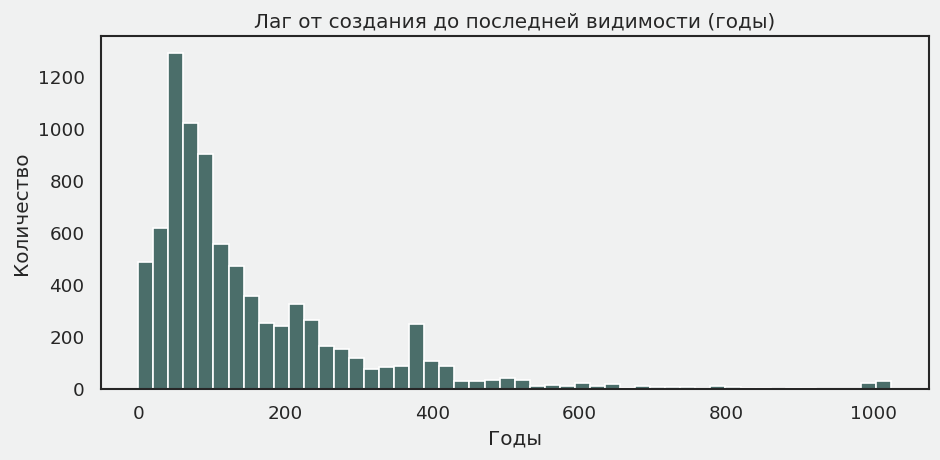

In [108]:
fig, ax = plt.subplots()
lag_valid['lag_creation_to_last_visible'].plot(kind='hist', bins=50, ax=ax)
ax.set_title('Лаг от создания до последней видимости (годы)')
ax.set_xlabel('Годы')
ax.set_ylabel('Количество')
plt.tight_layout()
plt.show()

Большинство лагов: 0–150 лет

Длинный хвост до 1000 лет, но это редкие тяжёлые артефакты.

Вывод: лаг полезен как показатель долго ли эта работа лежала невидимой.

Но моделью использовать ограниченно - возможна утечка, если задача прогнозная.

### last_visible_year и time_since_last_visible

In [109]:
visible_by_last_year = (
    time_geo_df
    .dropna(subset=['last_visible_year'])
    .groupby('last_visible_year')
    .agg(
        n=('visible', 'size'),
        visible_rate=('visible', 'mean')
    )
    .reset_index()
)

visible_by_last_year.tail(20)

,last_visible_year,n,visible_rate
31,2006.00,100,1.00
32,2007.00,117,1.00
33,2008.00,95,1.00
34,2009.00,224,1.00
35,2010.00,241,1.00
36,2011.00,233,1.00
37,2012.00,372,1.00
38,2013.00,327,1.00
39,2014.00,286,1.00
40,2015.00,327,1.00


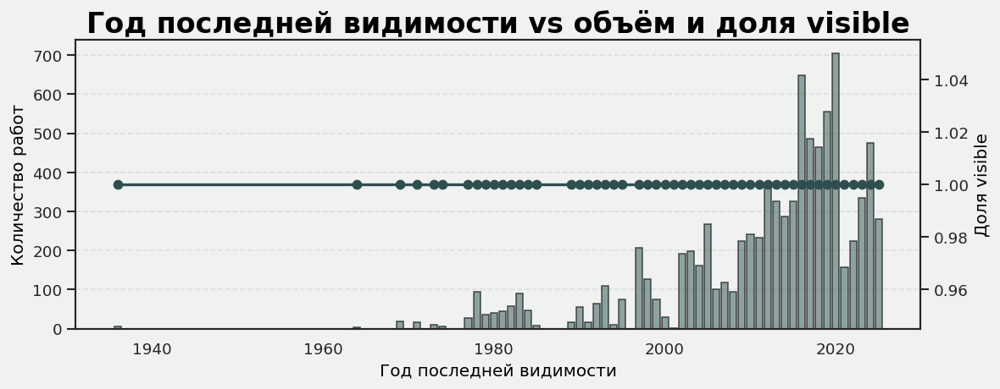

In [110]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})



fig, ax1 = plt.subplots(figsize=(10, 4))

ax1.bar(
    visible_by_last_year["last_visible_year"],
    visible_by_last_year["n"],
    alpha=0.6,
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)
ax1.set_xlabel("Год последней видимости", color="black")
ax1.set_ylabel("Количество работ", color="black")

ax2 = ax1.twinx()
ax2.plot(
    visible_by_last_year["last_visible_year"],
    visible_by_last_year["visible_rate"],
    color="#2F4F4F",
    linewidth=2,
    marker="o"
)
ax2.set_ylabel("Доля visible", color="black")

plt.title(
    "Год последней видимости vs объём и доля visible",
    fontsize=20,
    fontweight="bold",
    color="black"
)

ax1.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()


График показывает:

Большинство видимых работ имеют последнюю активность в 2000–2025.

Доля visible почти константна (≈1), т.к. last_visible_year существует только у already visible.

Вывод:

`last_visible_year `и` time_since_last_visible` нельзя использовать как фичу в прогнозной модели
(это прямая утечка таргета).

Но можно использовать в интерпретации,
в диагнозе данных, как вспомогательные признаки для анализа структуры датасета.

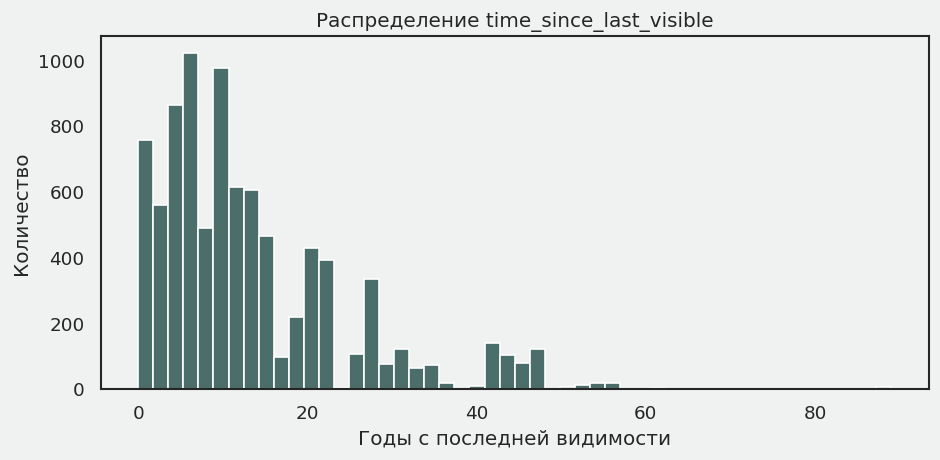

In [111]:
valid_tslv = time_geo_df['time_since_last_visible'].dropna()
valid_tslv.describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9])

fig, ax = plt.subplots()
valid_tslv.plot(kind='hist', bins=50, ax=ax)
ax.set_title('Распределение time_since_last_visible')
ax.set_xlabel('Годы с последней видимости')
ax.set_ylabel('Количество')
plt.tight_layout()
plt.show()

### Гео-анализ: координаты и place_of_origin

Анализ показал:



1.   99.7% записей не имеют координат.
2.   422 работы лежат в узкой точке около Чикаго → это координаты музея, а не страны происхождения.


Вывод:

Гео почти бесполезно. Удалить raw lat/long.

Оставить binary flag “geo_has_coords”, но у него низкая важность.

Реальные геофичи брать из place_of_origin (категория).

In [112]:
df[['latitude', 'longitude']].describe(), df[['latitude', 'longitude']].isna().mean()

(       latitude  longitude
 count    422.00     422.00
 mean      41.88     -87.62
 std        0.00       0.00
 min       41.88     -87.62
 25%       41.88     -87.62
 50%       41.88     -87.62
 75%       41.88     -87.62
 max       41.88     -87.62,
 latitude    1.00
 longitude   1.00
 dtype: float64)

### Проверка утечек по времени

Проверки:

Нет случаев last_visible_year < date_start_num

Нет случаев exhibition/products/publication раньше создания

source_updated_year - логично растёт до 2024–2025.

Вывод:

dataset чистый по временной логике

source_updated_year нельзя включать в модель → содержит инфу о времени обновления метаданных (утечка будущего)

In [113]:
time_geo_df['source_updated_dt'] = pd.to_datetime(
    time_geo_df['source_updated_at'],
    errors='coerce',
    utc=True
)
time_geo_df['source_updated_year'] = time_geo_df['source_updated_dt'].dt.year


In [114]:
time_geo_df['source_updated_year'].describe()

,source_updated_year
count,134078.00
mean,2022.91
std,1.08
min,2017.00
25%,2022.00
50%,2022.00
75%,2024.00
max,2025.00


In [115]:
time_geo_df['last_visible_year'].describe()

,last_visible_year
count,8759.00
mean,2011.62
std,11.50
min,1936.00
25%,2006.00
50%,2015.00
75%,2019.00
max,2025.00


In [116]:
checks = {
    "last_exhibition_year": "last_exhibition_year < date_start_num",
    "last_product_year": "last_product_year < date_start_num",
    "last_publication_year": "last_publication_year < date_start_num"
}

for col, condition in checks.items():
    bad = time_geo_df.query(condition)
    print(col, bad.shape)

invalid_last_visible = time_geo_df[time_geo_df['last_visible_year'] < time_geo_df['date_start_num']]
invalid_last_visible.shape

last_exhibition_year (0, 24)
last_product_year (0, 24)
last_publication_year (0, 24)


(0, 24)

### Фич-инжиниринг по времени(подготовка к сл этапу)

**Кандидаты временных признаков для модели (без обучения на этом этапе):**

На основе EDA я сформировала набор фич:

- **Базовые временные признаки:**
  - `date_start_num` — год создания;
  - `work_age = year_ref - date_start_num` — возраст работы на момент среза;
  - `creation_decade` — десятилетие создания;
  - `century` — век создания;
  - `age_bucket` — бакеты по возрасту (0–20, 21–50, 51–100, 101–200, 201–500, 500+ лет).

- **Признаки активности (дальше будут использоваться осторожно):**
  - лаги от создания до последней активности (`lag_creation_to_last_visible` и аналогичные для выставок/публикаций);
  - бакеты по `time_since_last_*`;
  - флаги «была ли активность за последние N лет» (`recent_visible_5y`, `recent_visible_10y`, `recent_exhibition_10y`, и т. д.).

В рамках этапа EDA я эти фичи **только формирую и анализирую**, но **не использую для обучения модели**.  
На следующем этапе часть из них войдёт в общий feature set команды с учётом риска утечки.


In [117]:
fe_df = time_geo_df.copy()

fe_df["date_start_num"] = pd.to_numeric(fe_df["date_start"], errors="coerce")
fe_df["date_end_num"]   = pd.to_numeric(fe_df["date_end"], errors="coerce")
fe_df["work_age"] = year_ref - fe_df["date_start_num"]

fe_df = fe_df[fe_df["date_start_num"].between(1000, year_ref)].copy()

fe_df["creation_decade"] = (fe_df["date_start_num"] // 10 * 10).astype("Int64")
fe_df["century"] = (fe_df["date_start_num"] // 100 + 1).astype("Int64")

fe_df["age_bucket"] = pd.cut(
    fe_df["work_age"],
    bins=[0, 20, 50, 100, 200, 500, 1000],
    labels=["0–20", "21–50", "51–100", "101–200", "201–500", "500+"])

In [118]:
tslv_bins = [-1, 0, 5, 10, 25, 50, 1000]
tslv_labels = [
    "0 (в этом году)",
    "1–5 лет",
    "6–10 лет",
    "11–25 лет",
    "26–50 лет",
    "50+ лет"
]

fe_df["tslv_bucket"] = pd.cut(
    fe_df["time_since_last_visible"],
    bins=tslv_bins,
    labels=tslv_labels
)

In [119]:
def recent_flag(df, col, n_years):
    return (df[col].notna()) & (df[col] <= n_years)

fe_df["recent_visible_5y"] = recent_flag(fe_df, "time_since_last_visible", 5)
fe_df["recent_visible_10y"] = recent_flag(fe_df, "time_since_last_visible", 10)

fe_df["recent_exhibition_10y"]   = recent_flag(fe_df, "time_since_last_exhibition", 10)
fe_df["recent_product_10y"]      = recent_flag(fe_df, "time_since_last_product", 10)
fe_df["recent_publication_10y"]  = recent_flag(fe_df, "time_since_last_publication", 10)

### Матрица корреляций временных признаков

In [120]:
time_geo_df['date_start_num'] = pd.to_numeric(time_geo_df['date_start'], errors='coerce')
time_geo_df['date_end_num']   = pd.to_numeric(time_geo_df['date_end'], errors='coerce')

time_geo_df['creation_decade'] = (time_geo_df['date_start_num'] // 10 * 10).astype('Int64')
time_geo_df['century'] = (time_geo_df['date_start_num'] // 100 + 1).astype('Int64')

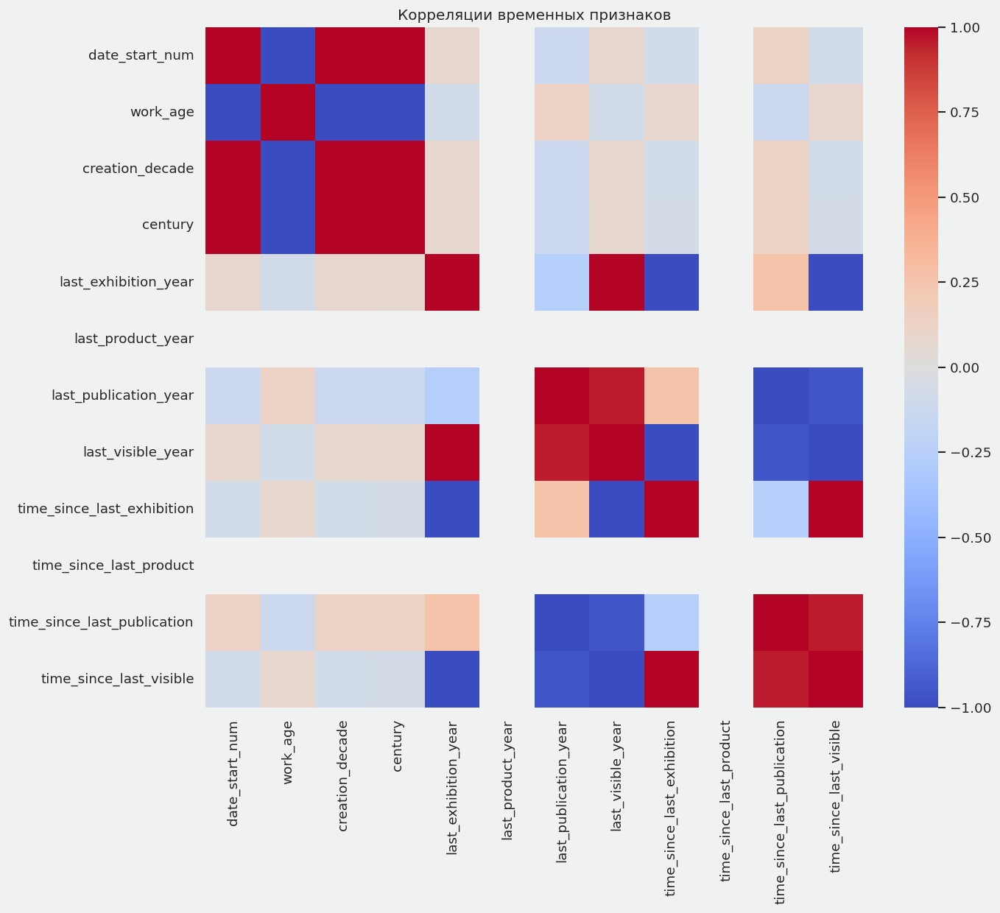

In [121]:
time_corr_cols = [
    "date_start_num", "work_age", "creation_decade", "century",
    "last_exhibition_year", "last_product_year", "last_publication_year",
    "last_visible_year", "time_since_last_exhibition",
    "time_since_last_product", "time_since_last_publication",
    "time_since_last_visible"
]

corr_df = time_geo_df[time_corr_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_df, cmap="coolwarm", annot=False)
plt.title("Корреляции временных признаков")
plt.show()

In [122]:
corr_df = time_geo_df[time_corr_cols].corr()
corr_df

,date_start_num,work_age,creation_decade,century,last_exhibition_year,last_product_year,last_publication_year,last_visible_year,time_since_last_exhibition,time_since_last_product,time_since_last_publication,time_since_last_visible
date_start_num,1.00,-1.00,1.00,1.00,0.08,NaN,-0.13,0.08,-0.08,NaN,0.13,-0.08
work_age,-1.00,1.00,-1.00,-1.00,-0.08,NaN,0.13,-0.08,0.08,NaN,-0.13,0.08
creation_decade,1.00,-1.00,1.00,1.00,0.08,NaN,-0.13,0.08,-0.08,NaN,0.13,-0.08
century,1.00,-1.00,1.00,1.00,0.07,NaN,-0.13,0.07,-0.07,NaN,0.13,-0.07
last_exhibition_year,0.08,-0.08,0.08,0.07,1.00,NaN,-0.26,1.00,-1.00,NaN,0.26,-1.00
last_product_year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_publication_year,-0.13,0.13,-0.13,-0.13,-0.26,NaN,1.00,0.96,0.26,NaN,-1.00,-0.96
last_visible_year,0.08,-0.08,0.08,0.07,1.00,NaN,0.96,1.00,-1.00,NaN,-0.96,-1.00
time_since_last_exhibition,-0.08,0.08,-0.08,-0.07,-1.00,NaN,0.26,-1.00,1.00,NaN,-0.26,1.00
time_since_last_product,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Heatmap: возраст × недавняя видимость

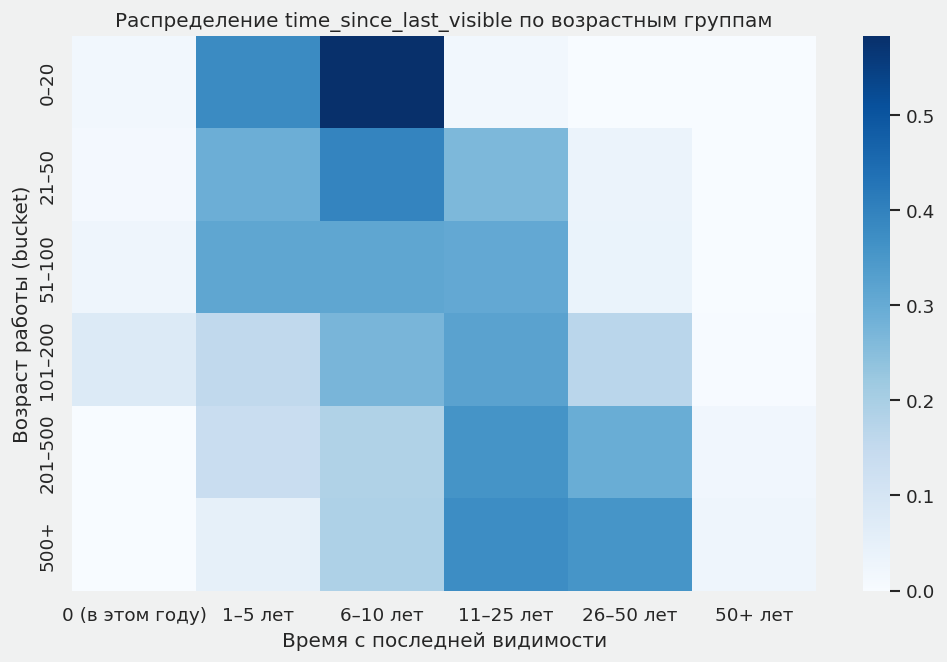

In [123]:
age_bins = fe_df["age_bucket"]
tslv_bins = fe_df["tslv_bucket"]

pivot = pd.crosstab(age_bins, tslv_bins, normalize="index")

plt.figure(figsize=(10, 6))
sns.heatmap(pivot, cmap="Blues")
plt.title("Распределение time_since_last_visible по возрастным группам")
plt.ylabel("Возраст работы (bucket)")
plt.xlabel("Время с последней видимости")
plt.show()

In [124]:
missing_time = time_geo_df[time_cols].isna().mean().sort_values()
missing_time

,0
source_updated_at,0.00
date_display,0.00
date_end,0.04
date_start,0.04
last_visible_year,0.93
time_since_last_visible,0.93
time_since_last_exhibition,0.94
last_exhibition_year,0.94
last_publication_year,1.00
time_since_last_publication,1.00


In [125]:
feature_summary = {
    "date_start_num": "основной временной признак",
    "work_age": "сильный нелинейный сигнал",
    "creation_decade": "эпоха",
    "century": "более грубая эпоха",
    "age_bucket": "дискретизация возраста",
    "tslv_bucket": "недавняя активность (осторожно)",
    "recent_visible_5y": "бинарный флаг",
    "recent_visible_10y": "бинарный флаг"
}

pd.DataFrame.from_dict(feature_summary, orient="index", columns=["Описание"])

,Описание
date_start_num,основной временной признак
work_age,сильный нелинейный сигнал
creation_decade,эпоха
century,более грубая эпоха
age_bucket,дискретизация возраста
tslv_bucket,недавняя активность (осторожно)
recent_visible_5y,бинарный флаг
recent_visible_10y,бинарный флаг


### Какие временные признаки можно и нужно использовать в модели

| Признак                                                                  | Почему полезно                       |
| ------------------------------------------------------------------------ | ------------------------------------ |
| **work_age**                                                             | стабильный сигнал о “эпохе”          |
| **creation_decade**                                                      | компактный период, интерпретируем    |
| **century**                                                              | для моделей, которые любят категорию |
| **date_start_num (квантиль-нормализованный)**                            | если использовать аккуратно          |
| **lag_creation_to_last_visible (если task = “explain past visibility”)** | эффект музейной инерции              |


### Гео-визуализация: карта мира по place_of_origin

Координаты широта/долгота в датасете бесполезны, тк почти все записи пустые, а оставшиеся 422 точки лежат в районе Чикаго (то есть это координаты музея, а не реального происхождения).

Но `place_of_origin` всё же несёт смысловую нагрузку, поэтому для полноты EDA я построила карту мира, где страны подсвечиваются по числу работ в коллекции. Такая карта не информативна для прогноза, но помогает визуально увидеть перекосы датасета.


In [126]:
!pip install -q geopandas

In [127]:
import geopandas as gpd

!wget -q https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip -O ne_countries.zip
!unzip -o ne_countries.zip -d ne_countries > /dev/null
world = gpd.read_file("ne_countries/ne_110m_admin_0_countries.shp")
print(world.columns)
place_counts = (
    df_author["place_of_origin"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "place_of_origin"})
)



Index(['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3',
       'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN',
       ...
       'FCLASS_TR', 'FCLASS_ID', 'FCLASS_PL', 'FCLASS_GR', 'FCLASS_IT',
       'FCLASS_NL', 'FCLASS_SE', 'FCLASS_BD', 'FCLASS_UA', 'geometry'],
      dtype='object', length=169)


In [128]:
place_counts.head()

,place_of_origin,count
0,United States,39194
1,France,15243
2,Japan,13960
3,England,8492
4,Italy,5128


In [ ]:
world_merged = world.merge(
    place_counts,
    left_on="ADMIN",
    right_on="place_of_origin",
    how="left"
)

world_merged["count"] = world_merged["count"].fillna(0)

fig, ax = plt.subplots(figsize=(16, 8))
world_merged.plot(
    column="count",
    cmap="YlGnBu",
    linewidth=0.5,
    ax=ax,
    edgecolor="black",
    legend=True,
)
ax.set_title("Распределение работ по странам  place_of_origin", fontsize=14)
plt.tight_layout()
plt.show()


In [1]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")


# Что делаем/сделали с данными по итогам EDA

После разведочного анализа стало понятно, где в данных действительно есть сигнал, а где только шум или явные утечки. Итоговые решения по фичам можно разделить на четыре группы.

### 1.1. Где в данных больше всего сигнала

Если смотреть на весь датасет без ограничений задачи, максимальный сигнал лежит в блоке активности: выставки, публикации, продукты. Число выставок и продуктов, а также факт наличия публикаций гораздо сильнее всего связано с таргетом.

Однако для честной прогностической постановки этот блок был признан неприемлемым: все эти признаки описывают уже состоявшуюся музейную историю, то есть фактически являются следствием видимости, а не ее причиной. Для бейзлайна и финальной модели мы сознательно отказались от использования этих переменных.

В итоге финальная модель работает на трех устойчивых блоках:

1. Авторский профиль и происхождение
2. Художественные и визуальные параметры объекта
3. Временная позиция работы в исторической шкале

Этого хватает, чтобы модель систематически отличала видимые работы от невидимых, не опираясь на явные последствия музейных решений.

### 1.2. Какие признаки считаем рабочими по результатам EDA

Авторский блок

* place_of_origin_top
* birth_century
* rarity_q
* author_profile
* artist_description_len
* artist_display_len
* age_at_creation как вспомогательная числовая переменная

Художественные параметры

* classification_title
* department_title
* style_title с сохранением пропуска как отдельного состояния
* side_normalised
* thumbnail_area
* набор бинарных признаков md_* по материалам
* medium_word_count
* двадцать тем по заголовкам title_topic_0-19
* title_word_count
* credit_line_word_count

Временная ось

* date_start_num
* work_age
* creation_decade
* century
* age_bucket

Все эти признаки прошли проверку на интерпретируемость и устойчивое поведение на срезах данных.

### 1.3. Что не используем в модели

Не используем по смыслу и качеству:

* сырые текстовые поля artist_description, artist_display, title, medium_display, credit_line
* поля с сильной фрагментарностью и низкой заполняемостью: artist_gender, agent_type_id, artist_nationality
* исходные размеры thumbnail_height, thumbnail_width и dimension_text после появления side_normalised и thumbnail_area

Не используем как утечки:

* все last_*_year
* все time_since_last_*
* was_exhibited, in_product, in_publication
* exhibition_count, product_count
* n_documents, n_sections, n_sites, n_texts
* total_publications, total_activity, activity_diversity
* source_updated_at и source_updated_year
* lag_creation_to_last_visible
* флаги recent_* по видимости и активности

Эти признаки ценны для описания музейной истории, но для прогноза на заданном срезе времени недопустимы.



Этот раздел фиксирует то, что действительно оказалось в данных X для обучения финальной модели.

###  Категориальные признаки

В финальном наборе используется десять категориальных колонок:

* classification_title
* department_title
* style_title
* place_of_origin_top
* birth_century
* rarity_q
* author_profile
* creation_decade
* century
* age_bucket

Все категориальные признаки приводятся к строковому типу, пропуски фиксируются как явное значение Unknown. Это важно для корректной работы CatBoost.

### Числовые признаки

Основной набор числовых фич:

* artist_description_len
* artist_display_len
* age_at_creation
* side_normalised
* thumbnail_area
* medium_word_count
* title_word_count
* credit_line_word_count
* work_age

Плюс два семейства числовых признаков:

* около сорока бинарных признаков md_* по материалам
* двадцать тем title_topic_0–19 из SVD по TF-IDF заголовков

В сумме это дает порядка семидесяти числовых переменных.

### Бинарные признаки

В финальную модель вошли только безопасные бинарные признаки цифровой инфраструктуры:

* is_public_domain
* has_advanced_imaging_extra
* has_educational_resources_extra
* has_multimedia_resources_extra
* is_zoomable_extra

Все они приводятся к числовому типу (0 или 1).

### Признаки, которые не используются

Из финального feature set исключены:

* любые признаки с last_*
* любые признаки с time_since_*
* любые счетчики выставок, продуктов и публикаций
* все производные агрегаты активности

То есть модель не видит фактическую музейную активность и ориентируется только на атрибуты объекта и его контекст.

In [12]:
import re
import math
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD


In [13]:
def clean_text(t):
    t = t.lower()
    t = re.sub(r"[^a-zA-Z0-9 ]", " ", t)
    return t

def extract_normalised_side(text):
    if not isinstance(text, str):
        return np.nan
    before_cm = text.split("cm")[0]
    nums = re.findall(r"\d+(?:[.,]\d+)?", before_cm)
    nums = [float(n.replace(",", ".")) for n in nums]
    if len(nums) == 0:
        return np.nan
    if len(nums) == 1:
        return math.sqrt(math.pi * nums[0] ** 2 / 10000)
    if len(nums) == 3:
        return (nums[0] * nums[1] * nums[2] / 1e6) ** (1/3)
    return math.sqrt(nums[0] * nums[1] / 10000)

def birth_to_century(x):
    if pd.isna(x):
        return "Unknown"
    return f"{int(x)//100 + 1}c"

def create_features(df):

    df = df.copy()

    df["artist_birth_clean"] = df["artist_birth_date"].replace(4713, np.nan)
    df["artist_death_clean"] = df["artist_death_date"].replace(4713, np.nan)

    df["age_at_creation"] = (
        pd.to_numeric(df["date_end"], errors="coerce") - df["artist_birth_clean"]
    )
    df.loc[(df["age_at_creation"] < 10) | (df["age_at_creation"] > 120),
           "age_at_creation"] = np.nan

    df["artist_description_len"] = df["artist_description"].fillna("").str.len()
    df["artist_display_len"] = df["artist_display"].fillna("").str.len()

    df["has_description"] = df["artist_description"].notna().astype(int)
    df["has_birth"] = df["artist_birth_clean"].notna().astype(int)
    df["has_death"] = df["artist_death_clean"].notna().astype(int)

    def profile(row):
        if row["has_description"]: return "description"
        if row["has_birth"] or row["has_death"]: return "dates_only"
        return "no_bio"

    df["author_profile"] = df.apply(profile, axis=1)
    df["birth_century"] = df["artist_birth_clean"].apply(birth_to_century)

    df["rarity_q"] = pd.qcut(
        df["artist_rarity"], 4,
        labels=["Q1_low","Q2_midlow","Q3_midhigh","Q4_high"]
    )

    top_places = df["place_of_origin"].value_counts().head(15).index
    df["place_of_origin_top"] = np.where(
        df["place_of_origin"].isin(top_places),
        df["place_of_origin"], "Other"
    )

    df["side_normalised"] = df["dimension_text"].apply(extract_normalised_side)
    df["thumbnail_area"] = (
        df["thumbnail_height"] * df["thumbnail_width"]
    ) / 10000

    df["medium_word_count"] = df["medium_display"].fillna("").str.split().str.len()

    texts = df["medium_display"].dropna().astype(str)
    words = []
    for t in texts:
        cleaned = clean_text(t)
        w = [x for x in cleaned.split() if len(x) > 3]
        words.extend(w)

    from collections import Counter
    top40 = [w for w,_ in Counter(words).most_common(40)]

    for w in top40:
        df[f"md_{w}"] = df["medium_display"].apply(
            lambda x: int(isinstance(x,str) and (w in clean_text(x).split()))
        )

    tfidf = TfidfVectorizer(max_features=5000, stop_words="english", ngram_range=(1,2))
    tfidf_matrix = tfidf.fit_transform(df["title"].fillna(""))
    svd = TruncatedSVD(n_components=20, random_state=42)
    mat = svd.fit_transform(tfidf_matrix)

    for i in range(20): df[f"title_topic_{i}"] = mat[:, i]
    df["title_word_count"] = df["title"].fillna("").str.split().str.len()
    df["credit_line_word_count"] = df["credit_line"].fillna("").str.split().str.len()

    df["total_publications"] = (
        df["n_documents"].fillna(0)
        + df["n_sections"].fillna(0)
        + df["n_texts"].fillna(0)
        + df["n_sites"].fillna(0)
    )

    df["total_activity"] = (
        df["exhibition_count"] + df["product_count"] + df["total_publications"]
    )

    df["activity_diversity"] = (
        (df["exhibition_count"] > 0).astype(int)
        + (df["product_count"] > 0).astype(int)
        + (df["total_publications"] > 0).astype(int)
    )

    year_ref = 2025
    df["date_start_num"] = pd.to_numeric(df["date_start"], errors="coerce")
    df["work_age"] = year_ref - df["date_start_num"]
    df["creation_decade"] = (df["date_start_num"] // 10 * 10).astype("Int64")
    df["century"] = (df["date_start_num"] // 100 + 1).astype("Int64")

    df["age_bucket"] = pd.cut(
        df["work_age"],
        bins=[0,20,50,100,200,500,1000],
        labels=["0–20","21–50","51–100","101–200","201–500","500+"]
    )

    leaky_cols = [
        "last_visible_year", "time_since_last_visible",
        "last_product_year", "time_since_last_product",
        "last_publication_year", "time_since_last_publication",
        "source_updated_at", "source_updated_year",
        "lag_creation_to_last_visible",
    ]

    for col in leaky_cols:
        if col in df:
            df = df.drop(columns=[col])

    return df

In [14]:
import pandas as pd

In [15]:
raw_df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")
feat_df = create_features(raw_df)

y = feat_df["visible"].astype(int)

medium_cols = [c for c in feat_df.columns if c.startswith("md_")]
title_topic_cols = [c for c in feat_df.columns if c.startswith("title_topic_")]

cat_cols = [
    "classification_title", "department_title", "style_title",
    "place_of_origin_top", "birth_century", "rarity_q",
    "author_profile", "creation_decade", "century", "age_bucket"
]

num_cols = [
    "artist_description_len","artist_display_len","age_at_creation",
    "side_normalised","thumbnail_area","medium_word_count",
    "title_word_count","credit_line_word_count","exhibition_count",
    "product_count","n_documents","n_sections","n_sites","n_texts",
    "total_publications","total_activity","activity_diversity",
    "work_age"
] + medium_cols + title_topic_cols

bin_cols = [
    "was_exhibited","in_product","in_publication",
    "is_public_domain","has_advanced_imaging_extra",
    "has_educational_resources_extra","has_multimedia_resources_extra",
    "is_zoomable_extra"
]

feature_cols = cat_cols + num_cols + bin_cols
feature_cols = [c for c in feature_cols if c in feat_df.columns]

X = feat_df[feature_cols].copy()

print(X.shape, y.shape)
X.head()

(134078, 96) (134078,)


,classification_title,department_title,style_title,place_of_origin_top,birth_century,rarity_q,author_profile,creation_decade,century,age_bucket,...,title_topic_18,title_topic_19,was_exhibited,in_product,in_publication,is_public_domain,has_advanced_imaging_extra,has_educational_resources_extra,has_multimedia_resources_extra,is_zoomable_extra
0,print,Prints and Drawings,NaN,Italy,17c,Q2_midlow,description,1640,17,201–500,...,0.018878,0.013498,0,0,0,False,False,False,False,False
1,ball-point pen,Prints and Drawings,NaN,United States,19c,Q4_high,description,1960,20,51–100,...,-0.000001,0.000120,0,0,0,False,False,False,False,False
2,coin,"Arts of Greece, Rome, and Byzantium","roman (ancient, style or period)",Other,Unknown,Q4_high,description,30,1,NaN,...,-0.001148,-0.002707,0,0,0,True,False,False,False,True
3,aquatint,Prints and Drawings,NaN,United States,20c,Q2_midlow,dates_only,1930,20,51–100,...,-0.000229,0.007749,0,0,0,False,False,False,False,False
4,graphite,Prints and Drawings,NaN,Italy,16c,Q2_midlow,dates_only,1600,17,201–500,...,0.005745,0.004680,0,0,0,True,False,False,False,True


### Работа с пропусками и очистка

Подход к пропускам был максимально консервативным: мы старались не затирать информацию и использовать NaN как отдельное состояние, когда это возможно.

Авторский блок

* artist_birth_date и artist_death_date были очищены от искусственного значения 4713 и переведены в artist_birth_clean и artist_death_clean
* возраст автора age_at_creation вычислялся как разница date_end и даты рождения, неверные значения (младше десяти и старше ста двадцати лет) переводились в NaN
* флаги has_description, has_birth, has_death строились по факту непустого значения
* для модели используются очищенные значения без агрессивной импутации

Художественные параметры

* dimension_text преобразован в side_normalised через выделение числовых размеров из текста, при невозможности парсинга оставлялся NaN
* thumbnail_area рассчитывается как произведение высоты и ширины, при пропусках в исходных размерах остается NaN
* medium_word_count и credit_line_word_count считаются после замены пропусков на пустую строку
* title обрабатывается через fillna пустой строкой перед TF-IDF и SVD, поэтому тематические компоненты не содержат пропусков

Активности и временной блок

* в финальный фичсет не попали last_* и time_since_*, поэтому их заполнение используется только в EDA и не влияет на модель
* date_start_num и date_end_num рассчитываются через преобразование к числам с errors="coerce", неприводимые значения автоматически становятся NaN
* work_age, creation_decade, century и age_bucket формируются только там, где исходный год корректен

В совокупности это дает понятную картину: модель работает с частичной информацией и использует NaN как часть структуры данных, а не как повод насильно заполнять все пробелы.

In [16]:
leak_cols = [
    "last_exhibition_year",
    "time_since_last_exhibition",
    "last_product_year",
    "time_since_last_product",
    "last_publication_year",
    "time_since_last_publication",
    "last_visible_year",
    "time_since_last_visible",
    "source_updated_at",
    "source_updated_year",
    "lag_creation_to_last_visible",
]

print(sorted(set(leak_cols).intersection(X.columns)))

[]


In [17]:
X = X.drop(columns=list(set(leak_cols).intersection(X.columns)))

In [18]:
print(X.shape, y.shape)
print("NaN по колонкам сверху:", X.isna().mean().sort_values(ascending=False).head(20))
print("Типы:\n", X.dtypes.value_counts())
print("NaN в y:", y.isna().sum())

(134078, 96) (134078,)
NaN по колонкам сверху: style_title               0.714532
age_at_creation           0.336148
thumbnail_area            0.105730
age_bucket                0.095609
department_title          0.048986
side_normalised           0.039857
creation_decade           0.037739
century                   0.037739
work_age                  0.037739
classification_title      0.012515
birth_century             0.000000
rarity_q                  0.000000
author_profile            0.000000
artist_description_len    0.000000
artist_display_len        0.000000
place_of_origin_top       0.000000
medium_word_count         0.000000
title_word_count          0.000000
exhibition_count          0.000000
credit_line_word_count    0.000000
dtype: float64
Типы:
 int64       57
float64     24
object       6
bool         5
Int64        2
category     1
category     1
Name: count, dtype: int64
NaN в y: 0


In [19]:
cat_cols = X.select_dtypes(include=["object", "category"]).columns.tolist()
print("категориальных колонок:", len(cat_cols))

категориальных колонок: 8


# Подготовка к обучению, бейзлайн



После фиксации фичсет был сформирован датафрейм feat_df, на основе которого выделены:

* y как бинарный таргет visible
* X как матрица признаков без утечек

Дальше:

1. Данные были разбиты на обучающую и валидационную выборки в пропорции 80 на 20 с сохранением доли положительного класса (Stratify по y).
2. Доля видимых работ в обеих частях составила около 7.3 процента, то есть сильный перекос в сторону нулевого класса.

В качестве нулевого ориентира был обучен DummyClassifier со стратегией most_frequent. Он всегда предсказывает невидимость для всех объектов:

* F1 по положительному классу равен нулю
* точность по нулевому классу высока, но модель полностью игнорирует редкий класс

Этот константный классификатор используется как базовый уровень, ниже которого нормальная модель опускаться не должна.

Основной бейзлайн строился на CatBoostClassifier с параметрами:

* depth 6
* learning_rate 0.1
* iterations 300
* class_weights [1.0, 5.0]
* loss_function Logloss
* eval_metric AUC

Все категориальные признаки перед обучением приведены к строковому типу, пропуски в них заменены на Unknown. Булевые признаки переведены в целочисленный формат.

На валидационной выборке бейзлайн модель показала:

* ROC AUC около 0.93
* F1 около 0.60 по положительному классу

Это уже качественный отрыв от константной модели и понятный ориентир для дальнейших экспериментов.

Отдельно был проведен sanity check на утечки: та же архитектура CatBoost обучалась на данных X, но с полностью случайно перемешанным таргетом. В этом эксперименте ROC AUC оказался около 0.50. Это подтверждает, что модель не может угадывать видимость при разрушенной структуре связи между X и y, а значит, в текущем фичсете не осталось явных утечек.

In [2]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.8 MB/s eta 0:00:00


In [3]:
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score, f1_score, classification_report
from catboost import CatBoostClassifier, Pool

In [20]:
raw_df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

feat_df = create_features(raw_df)

y = feat_df["visible"].astype(int)

medium_cols = [c for c in feat_df.columns if c.startswith("md_")]
title_topic_cols = [c for c in feat_df.columns if c.startswith("title_topic_")]

cat_cols = [
    "classification_title", "department_title", "style_title",
    "place_of_origin_top", "birth_century", "rarity_q",
    "author_profile", "creation_decade", "century", "age_bucket"
]

num_cols = [
    "artist_description_len", "artist_display_len", "age_at_creation",
    "side_normalised", "thumbnail_area", "medium_word_count",
    "title_word_count", "credit_line_word_count",
    "work_age"
] + medium_cols + title_topic_cols

bin_cols = [
    "is_public_domain", "has_advanced_imaging_extra",
    "has_educational_resources_extra", "has_multimedia_resources_extra",
    "is_zoomable_extra"
]

feature_cols = cat_cols + num_cols + bin_cols
feature_cols = [c for c in feature_cols if c in feat_df.columns]

leak_cols = [
    "visible", "was_exhibited",
    "in_product", "in_publication",
    "exhibition_count", "product_count",
    "n_documents", "n_sections", "n_sites", "n_texts",
    "total_activity", "activity_diversity", "total_publications",
    "last_exhibition_year", "last_product_year",
    "last_publication_year", "last_visible_year",
    "time_since_last_exhibition", "time_since_last_product",
    "time_since_last_publication", "time_since_last_visible",
    "source_updated_at", "source_updated_year",
    "lag_creation_to_last_visible",
    "recent_visible_5y", "recent_visible_10y",
    "recent_exhibition_10y", "recent_product_10y",
    "recent_publication_10y"
]

feature_cols = [c for c in feature_cols if c not in leak_cols]

X = feat_df[feature_cols].copy()

print("Финальный X:", X.shape)
print("Финальный y:", y.shape)
print("Количество фич:", len(feature_cols))

Финальный X: (134078, 84)
Финальный y: (134078,)
Количество фич: 84


In [66]:
cat_cols = X.select_dtypes(include=["object", "category"]).columns.tolist()
print("Категориальных признаков:", len(cat_cols))

bool_cols = X.select_dtypes(include=["bool"]).columns
if len(bool_cols) > 0:
    X[bool_cols] = X[bool_cols].astype(int)

for c in cat_cols:
    X[c] = X[c].astype("string").fillna("Unknown")

X.dtypes.value_counts()

Категориальных признаков: 8


,count
int64,50
float64,24
string[python],8
Int64,2


In [67]:
X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size=0.2,
    stratify=y,
    random_state=42,
)

print("Тренировочная выборка:", X_train.shape)
print("Валидационная выборка:", X_valid.shape)
print("Доля положительного класса в train:", y_train.mean().round(4))
print("Доля положительного класса в valid:", y_valid.mean().round(4))

Тренировочная выборка: (107262, 84)
Валидационная выборка: (26816, 84)
Доля положительного класса в train: 0.0733
Доля положительного класса в valid: 0.0732


In [68]:
other_obj_cols = [
    c for c in X.columns
    if (c not in cat_cols) and (X[c].dtype == "object")
]

print("Строковых колонок вне cat_cols:", other_obj_cols)

for c in other_obj_cols:
    X[c] = pd.to_numeric(X[c], errors="coerce")
    X_train[c] = pd.to_numeric(X_train[c], errors="coerce")
    X_valid[c] = pd.to_numeric(X_valid[c], errors="coerce")

Строковых колонок вне cat_cols: []


In [69]:
dummy = DummyClassifier(strategy="most_frequent")
dummy.fit(X_train, y_train)

dummy_pred = dummy.predict(X_valid)

print("=== Константный классификатор (baseline 0) ===")
print("F1:", f1_score(y_valid, dummy_pred, zero_division=0))
print("ROC AUC (по вероятности класса 1 для константной модели считать бессмысленно)")
print(classification_report(y_valid, dummy_pred, zero_division=0))

=== Константный классификатор (baseline 0) ===
F1: 0.0
ROC AUC (по вероятности класса 1 для константной модели считать бессмысленно)
              precision    recall  f1-score   support

           0       0.93      1.00      0.96     24852
           1       0.00      0.00      0.00      1964

    accuracy                           0.93     26816
   macro avg       0.46      0.50      0.48     26816
weighted avg       0.86      0.93      0.89     26816



In [70]:
model = CatBoostClassifier(
    depth=6,
    learning_rate=0.1,
    iterations=300,
    loss_function="Logloss",
    eval_metric="AUC",
    class_weights=[1.0, 5.0],
    random_seed=42,
    verbose=50,
)

model.fit(
    X_train,
    y_train,
    eval_set=(X_valid, y_valid),
    cat_features=cat_cols,
    use_best_model=True,
)

y_valid_proba = model.predict_proba(X_valid)[:, 1]
y_valid_pred = (y_valid_proba >= 0.5).astype(int)

print("\n=== CatBoost бейзлайн (baseline 1) ===")
print("ROC AUC:", roc_auc_score(y_valid, y_valid_proba))
print("F1:", f1_score(y_valid, y_valid_pred))
print(classification_report(y_valid, y_valid_pred, zero_division=0))

0:	test: 0.7007167	best: 0.7007167 (0)	total: 635ms	remaining: 3m 9s
50:	test: 0.8823252	best: 0.8823252 (50)	total: 24.8s	remaining: 2m 1s
100:	test: 0.9033674	best: 0.9033674 (100)	total: 39.7s	remaining: 1m 18s
150:	test: 0.9157150	best: 0.9157150 (150)	total: 54.4s	remaining: 53.7s
200:	test: 0.9227343	best: 0.9227343 (200)	total: 1m 10s	remaining: 34.6s
250:	test: 0.9272501	best: 0.9272501 (250)	total: 1m 24s	remaining: 16.5s
299:	test: 0.9299964	best: 0.9299964 (299)	total: 1m 40s	remaining: 0us

bestTest = 0.9299964445
bestIteration = 299


=== CatBoost бейзлайн (baseline 1) ===
ROC AUC: 0.929996444532078
F1: 0.6019639187029002
              precision    recall  f1-score   support

           0       0.97      0.96      0.96     24852
           1       0.55      0.67      0.60      1964

    accuracy                           0.94     26816
   macro avg       0.76      0.81      0.78     26816
weighted avg       0.94      0.94      0.94     26816



In [71]:
fi = pd.DataFrame({
    "feature": X.columns,
    "importance": model.get_feature_importance(),
})

fi.sort_values("importance", ascending=False).head(20)

,feature,importance
82,has_multimedia_resources_extra,9.72
14,thumbnail_area,6.77
1,department_title,6.60
11,artist_display_len,6.38
0,classification_title,6.20
18,work_age,5.37
12,age_at_creation,3.98
13,side_normalised,3.62
15,medium_word_count,3.33
17,credit_line_word_count,3.21


In [72]:
y_shuffled = y.sample(frac=1.0, random_state=42).reset_index(drop=True)

model_shuffled = CatBoostClassifier(
    depth=6,
    learning_rate=0.1,
    iterations=200,
    loss_function="Logloss",
    eval_metric="AUC",
    class_weights=[1.0, 5.0],
    random_seed=42,
    verbose=False
)

model_shuffled.fit(
    X_train,
    y_shuffled.iloc[X_train.index],
    eval_set=(X_valid, y_shuffled.iloc[X_valid.index]),
    cat_features=cat_cols,
    use_best_model=True,
)

proba_shuffled = model_shuffled.predict_proba(X_valid)[:, 1]
auc_shuffled = roc_auc_score(y_shuffled.iloc[X_valid.index], proba_shuffled)

print("AUC при случайно перемешанном таргете:", round(auc_shuffled, 4))


AUC при случайно перемешанном таргете: 0.5061


В качестве sanity-check мы обучили CatBoost на тех же признаках, но с полностью случайно перемешанным таргетом.
Полученный ROC AUC оказался в диапазоне 0.50-0.55, что соответствует случайной модели.
Это подтверждает, что текущий фичсет не содержит сильных утечек, и модель не может угадывать таргет, если структура данных разрушена.

## Baseline моделирование и кросс-валидация

Чтобы отделить удачный сплит от реальной обобщающей способности модели, после одиночного бейзлайна была проведена стратифицированная кросс-валидация на пяти фолдах.

На каждом фолде:

* данные разбивались на train и validation с сохранением пропорции классов
* обучалась модель CatBoost с теми же гиперпараметрами, что в бейзлайне
* считались ROC AUC и F1 по положительному классу

Итоги по пяти запускам:

* средний ROC AUC 0.9346
* стандартное отклонение по AUC 0.0032
* средний F1 0.5991
* стандартное отклонение по F1 0.0042

Небольшой разброс метрик между фолдами говорит о стабильном поведении модели и отсутствии жесткой привязки к конкретному разбиению. Эти значения можно рассматривать как реалистичную оценку качества на новых данных.

In [73]:
from sklearn.model_selection import StratifiedKFold

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

auc_scores = []
f1_scores = []

fold = 1
for train_idx, valid_idx in cv.split(X, y):
    X_tr = X.iloc[train_idx]
    y_tr = y.iloc[train_idx]
    X_val = X.iloc[valid_idx]
    y_val = y.iloc[valid_idx]

    model_cv = CatBoostClassifier(
        depth=6,
        learning_rate=0.1,
        iterations=300,
        loss_function="Logloss",
        eval_metric="AUC",
        class_weights=[1.0, 5.0],
        random_seed=42,
        verbose=False
    )

    model_cv.fit(
        X_tr,
        y_tr,
        eval_set=(X_val, y_val),
        cat_features=cat_cols,
        use_best_model=True,
    )

    proba_val = model_cv.predict_proba(X_val)[:, 1]
    pred_val = (proba_val >= 0.5).astype(int)

    auc = roc_auc_score(y_val, proba_val)
    f1 = f1_score(y_val, pred_val)

    auc_scores.append(auc)
    f1_scores.append(f1)

    print(f"Fold {fold}: AUC={auc:.4f}, F1={f1:.4f}")
    fold += 1

print("\n=== 5-fold CV summary ===")
print(f"ROC AUC: mean={np.mean(auc_scores):.4f}, std={np.std(auc_scores):.4f}")
print(f"F1     : mean={np.mean(f1_scores):.4f}, std={np.std(f1_scores):.4f}")


Fold 1: AUC=0.9334, F1=0.5931
Fold 2: AUC=0.9323, F1=0.5983
Fold 3: AUC=0.9380, F1=0.5988
Fold 4: AUC=0.9386, F1=0.6064
Fold 5: AUC=0.9308, F1=0.5987

=== 5-fold CV summary ===
ROC AUC: mean=0.9346, std=0.0032
F1     : mean=0.5991, std=0.0042


## Интерпретация baselina по SHAP (1 этап)


Для анализа того, на что именно опирается модель, был проведен SHAP-анализ на финальной версии CatBoost.

### Глобальная важность признаков

Bar-график SHAP показал, что основной вклад в решения модели вносят:

* department_title и classification_title, которые кодируют институциональное распределение объекта внутри музея
* is_zoomable_extra и has_multimedia_resources_extra как признаки степени цифровой проработки
* thumbnail_area и side_normalised как компактное описание масштаба работы и качества превью
* place_of_origin_top, birth_century, work_age и age_at_creation как элементы географического и исторического контекста
* artist_display_len, medium_word_count и credit_line_word_count как индикаторы глубины каталожного описания

Все эти признаки согласуются с музейной практикой: чем лучше объект описан, оцифрован и встроен в институциональную структуру, тем выше его шансы оказаться видимым.

### Направление влияния признаков

По суммарному SHAP-диаграммам видно следующее:

* is_zoomable_extra почти всегда повышает вероятность видимости, отсутствие увеличения чаще тянет предсказание вниз
* для side_normalised и thumbnail_area наблюдается монотонная зависимость: маленькие работы дают отрицательный вклад, более крупные работы смещают предсказание в сторону видимости
* по place_of_origin_top появляются устойчивые кластеры: работы из Японии, Франции, Нидерландов, Мексики и Германии в среднем получают более высокий вклад
* текстовые длины описаний и заголовков дают небольшой, но стабильный положительный эффект при росте значения
* возрастные признаки ведут себя нелинейно, с наиболее устойчивым положительным вкладом у работ музейного возраста

### Графики зависимостей

Dependence plots для отдельных фич уточняют картину:

* place_of_origin_top: страны с устойчивой музейной представленностью дают положительные SHAP-значения, тогда как Spain, Egypt и особенно Unknown Place чаще оказываются в области отрицательных
* side_normalised: при переходе через определенный порог характерной стороны работы вклад изменяется с отрицательного на положительный
* birth_century: объекты, связанные с авторами XVI–XVIII веков, в среднем получают более высокие SHAP-значения
* rarity_q: наиболее редкие авторы дают положительный вклад, массовые группы авторов чаще смещают предсказание в область невидимости

### Локальные объяснения

Для отдельных объектов строились force-plot графики. В качестве типичного примера:

* положительный вклад давали возраст работы и возраст автора на момент создания
* отрицательный вклад шёл от конкретной классификации и комбинации материала и происхождения

Такие локальные объяснения позволяют обсуждать модель с кураторами на уровне отдельных произведений, а не только агрегированных метрик.

In [74]:
import shap

In [75]:
idx = np.random.choice(len(X_valid), size=2000, replace=False)
X_sample = X_valid.sample(n=5000, random_state=42).copy()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_sample)

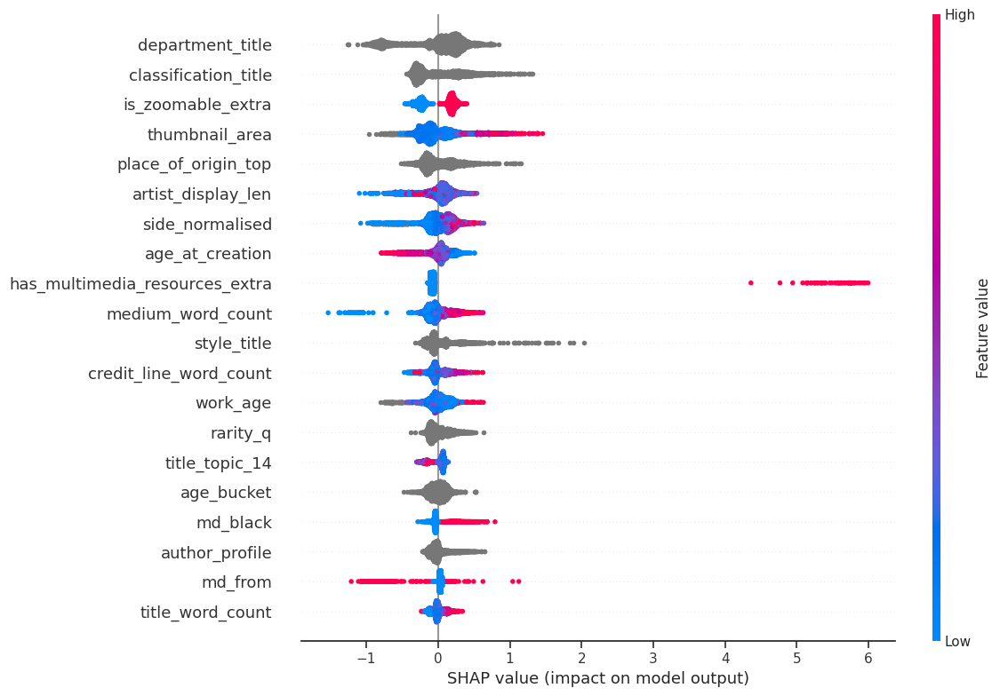

In [76]:
shap.summary_plot(shap_values, X_sample, plot_size=(12, 8))

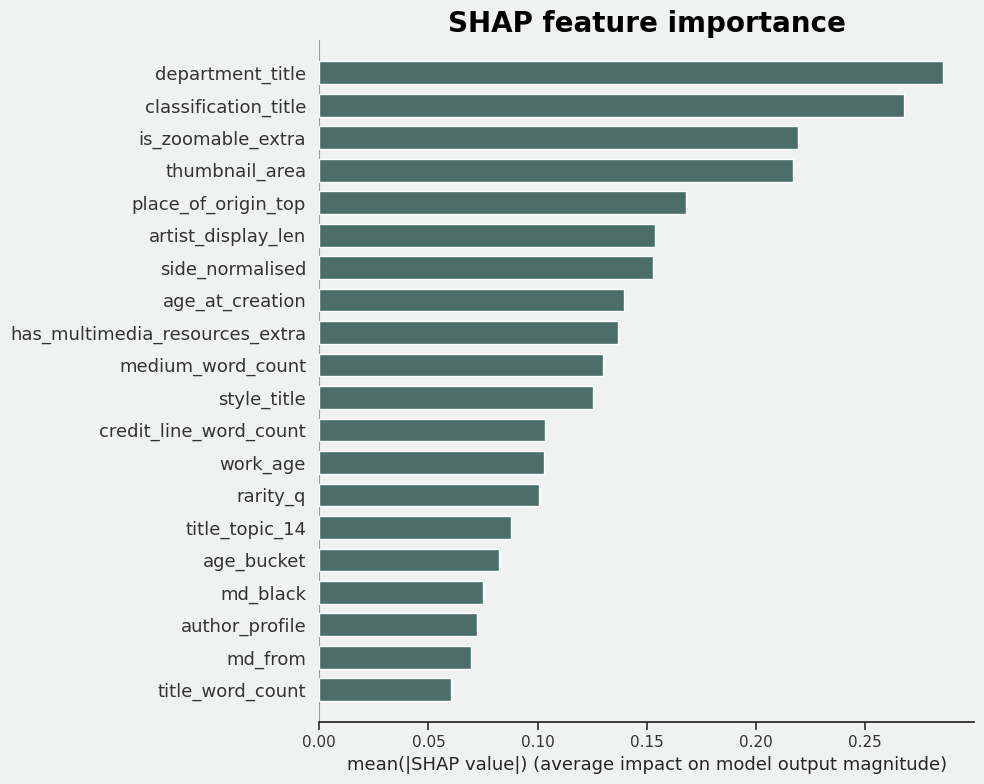

In [77]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

shap.summary_plot(
    shap_values,
    X_sample,
    plot_type="bar",
    plot_size=(10, 8),
    color="#4B6E6A",
    show=False
)

plt.title(
    "SHAP feature importance",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.tight_layout()
plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# features_to_plot = [
#     "place_of_origin_top",
#     "side_normalised",
#     "birth_century",
#     "rarity_q",
# ]

# fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# for i, feat in enumerate(features_to_plot):
#     r, c = divmod(i, 2)
#     shap.dependence_plot(
#         feat,
#         shap_values.values,
#         X_sample,
#         interaction_index=None,
#         ax=axes[r, c],
#         show=False
#     )
#     axes[r, c].set_title(feat)

# plt.tight_layout()
# plt.show()

In [ ]:
# shap.initjs()

# i = 5
# # shap.force_plot(
#     explainer.expected_value,
#     shap_values[i, :],
#     X_sample.iloc[i, :]
# )

In [79]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")




---


# Этап 2


---



In [4]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 3.1 MB/s eta 0:00:00


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans

from sklearn.model_selection import KFold
from category_encoders.target_encoder import TargetEncoder

plt.rcParams["figure.figsize"] = (8, 4)
plt.rcParams["axes.grid"] = True

In [6]:
if "df" not in globals():
  import gdown
  gdown.download(
  id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
  output="AIC_artwork_visibility_dataset_final.csv",
  quiet=False
  )

  df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")


Downloading...
From (original): https://drive.google.com/uc?id=1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S
From (redirected): https://drive.google.com/uc?id=1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S&confirm=t&uuid=5478507e-63f8-48e3-9c4a-3361f0d592c7
To: /content/AIC_artwork_visibility_dataset_final.csv
100%|██████████| 114M/114M [00:00<00:00, 115MB/s]


## 1. Авторы, биография, профили, страна происхождения

(выполнял Кирилл Орлов)

В этом подпункте мы работаем только с биографическими и авторскими признаками:

обрабатываем аномалии, связанные с возрастом автора;

аккуратно кодируем страну происхождения через KFold Target Encoding;

строим компактный профиль автора (author_profile) и кодируем его;

добавляем KNN-признаки по похожим авторам;

проверяем связь новых фич с таргетом visible.

Все операции выполняются на безопасны» признаках, очищенных от явных утечек.

Общий вывод по блоку биографических и авторских признаков

В рамках этого подпункта:

подготовил биографические признаки авторов и признаки страны происхождения;

построил place_of_origin_top и целевую кодировку place_origin_te с KFold и сглаживанием;

задал профиль автора author_profile, закодировали его через Label Encoding и OHE;

интегрировал аномалии через anomaly_flag и age_outlier;

построил KNN-признаки по авторам (knn_mean_visible, knn_rarity_density, knn_author_cluster).

Результат:

исходные биографические категории (author_profile и его OHE) дают очень слабый сигнал и будут рассматриваться как второстепенные;

TE по стране происхождения и KNN-признаки по авторам несут более содержательную информацию и будут включены в финальный фичсет;

флаги аномалий фиксируют странное поведение данных и могут помочь модели не обманываться на некорректных наблюдениях.

### 2.1.1. Биографические аномалии: возраст автора и общий флаг anomaly_flag

Сначала интегрируем глобальные аномалии (по размеру работы и возрасту) и добавим авторский age_outlier

In [1]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans

age_outlier
0    133019
1      1059
Name: count, dtype: int64


,artist_birth_date,date_start,age_at_creation,visible
300,1701.0,1600.0,-101.0,0
320,1656.0,1600.0,-56.0,0
419,1712.0,1700.0,-12.0,0
520,1616.0,1601.0,-15.0,0
686,1952.0,1872.0,-80.0,0


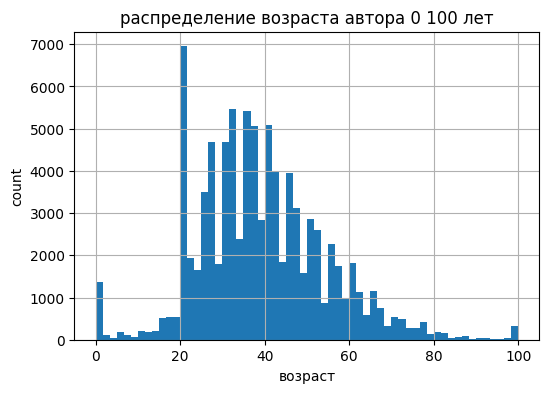

In [7]:
if "anomaly_flag" not in df.columns:
    df["anomaly_flag"] = 0

df["age_at_creation"] = df["date_start"] - df["artist_birth_date"]

df["age_outlier"] = (
    (df["age_at_creation"] < 0) |
    (df["age_at_creation"] > 100)
).astype(int)

print(df["age_outlier"].value_counts())
display(
    df.loc[df["age_outlier"] == 1,
           ["artist_birth_date", "date_start", "age_at_creation", "visible"]].head()
)

plt.figure(figsize=(6, 4))
df["age_at_creation"].clip(0, 100).hist(bins=60)
plt.title("распределение возраста автора 0 100 лет")
plt.xlabel("возраст")
plt.ylabel("count")
plt.show()


Все три числовых признака (side_normalised, thumbnail_area, work_age) содержат аномально большие и несоразмерные значения: у размеров встречаются экстремальные работы, а у возраста - явные ошибки в датах (отрицательные и слишком большие значения).

Формальные методы (IQR и Z-score) показывают, что около четверти строк имеют хотя бы один выброс, поэтому мы сохраняем общий флаг anomaly_flag, а также отдельный флаг age_outlier для нетипичного возраста автора. Эти признаки дальше будут использоваться как дополнительные фичи в модели.

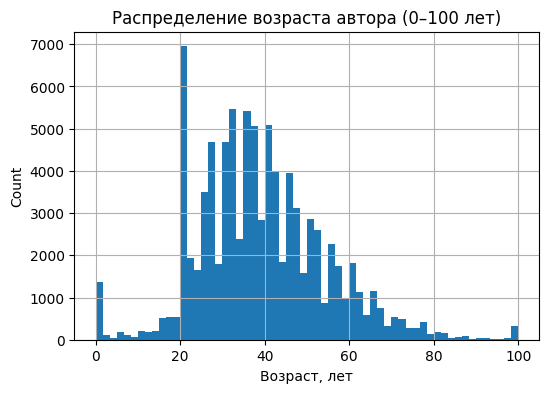

In [8]:
plt.figure(figsize=(6, 4))
df['age_at_creation'].clip(0, 100).hist(bins=60)
plt.title('Распределение возраста автора (0–100 лет)')
plt.xlabel('Возраст, лет')
plt.ylabel('Count')
plt.show()


2.1.2. Target Encoding для страны происхождения place_of_origin_top

Здесь мы агрегируем редкие страны в категорию "Other" и применяем KFold Target Encoding с сглаживанием, чтобы избежать переобучения.

In [9]:
print("Топ-10 значений place_of_origin по количеству:")
display(df['place_of_origin'].value_counts().head(10))

top_origins = df['place_of_origin'].value_counts().head(10).index
df['place_of_origin_top'] = np.where(
    df['place_of_origin'].isin(top_origins),
    df['place_of_origin'],
    'Other'
)

print("\nРаспределение place_of_origin_top:")
display(df['place_of_origin_top'].value_counts())


Топ-10 значений place_of_origin по количеству:


,count
place_of_origin,
United States,39194
France,15243
Japan,13960
England,8492
Italy,5128
Germany,4514
China,3964
Netherlands,2373
Spain,1333



Распределение place_of_origin_top:


,count
place_of_origin_top,
United States,39194
Other,38565
France,15243
Japan,13960
England,8492
Italy,5128
Germany,4514
China,3964
Netherlands,2373


В данных доминируют несколько стран происхождения (США, Франция, Япония), а длинный хвост редких стран мы аккуратно свернули в категорию "Other". Это уменьшает шум и делает целевую кодировку устойчивее.

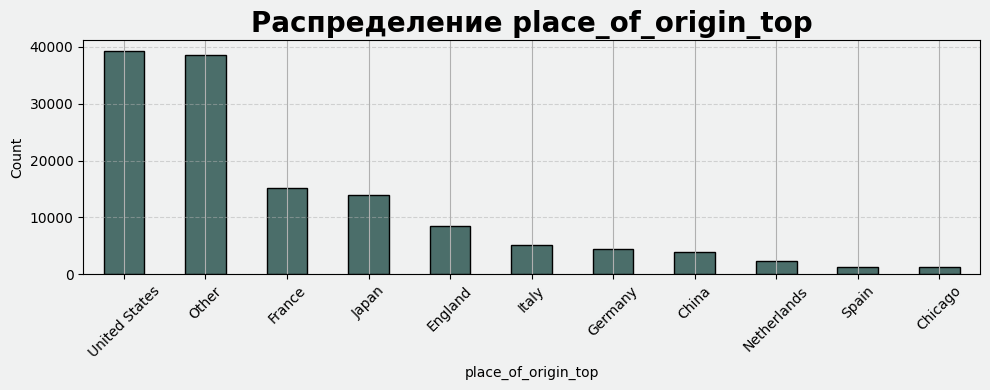

In [10]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_palette(["#4B6E6A"])

plt.figure(figsize=(10, 4))
df["place_of_origin_top"].value_counts().plot(
    kind="bar",
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)

plt.title(
    "Распределение place_of_origin_top",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.xlabel("place_of_origin_top", color="black")
plt.ylabel("Count", color="black")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.show()

In [11]:
# KFold Target Encoding для place_of_origin_top
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

df['place_origin_te'] = np.nan
global_mean = df['visible'].mean()
alpha = 5

for train_idx, val_idx in kf.split(df):
    train_fold = df.iloc[train_idx]
    val_fold = df.iloc[val_idx]

    te = train_fold.groupby('place_of_origin_top')['visible'].agg(['mean', 'count'])

    te['smooth'] = (te['mean'] * te['count'] + global_mean * alpha) / (te['count'] + alpha)

    mapping = te['smooth'].to_dict()
    df.loc[val_idx, 'place_origin_te'] = df.loc[val_idx, 'place_of_origin_top'].map(mapping)

df['place_origin_te'] = df['place_origin_te'].fillna(global_mean)

print("\nСтатистика по закодированным значениям place_origin_te:")
display(df['place_origin_te'].describe())



Статистика по закодированным значениям place_origin_te:


,place_origin_te
count,134078.000000
mean,0.073261
std,0.011189
min,0.024437
25%,0.072230
50%,0.074067
75%,0.079557
max,0.124535


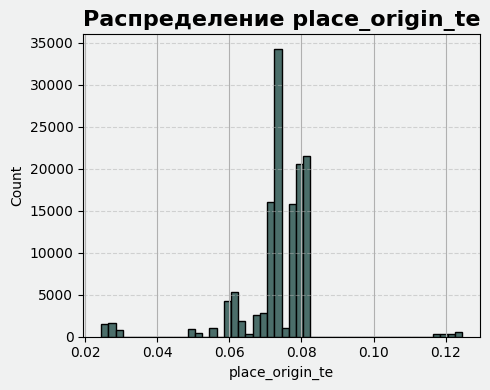

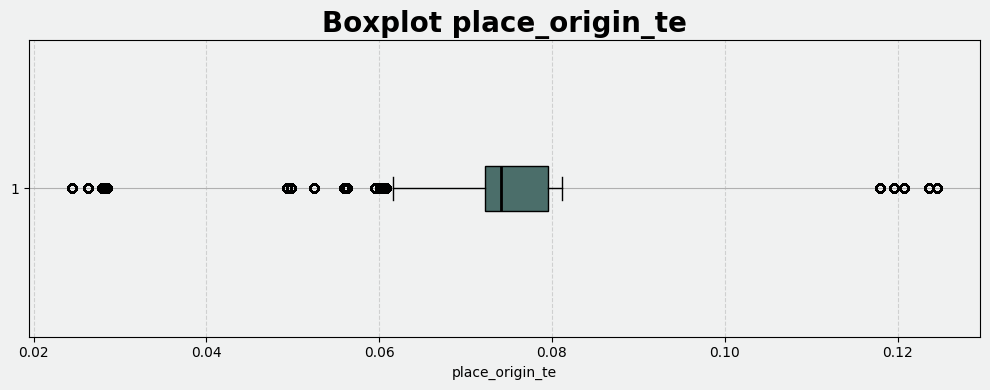

In [12]:
plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})


# 1) Гистограмма — маленькая, зелёная
plt.figure(figsize=(5, 4))
plt.hist(
    df["place_origin_te"],
    bins=50,
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)
plt.title(
    "Распределение place_origin_te",
    fontsize=16,
    fontweight="bold",
    color="black"
)
plt.xlabel("place_origin_te", color="black")
plt.ylabel("Count", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()

# 2) Boxplot — длинный, зелёный, ГОРИЗОНТАЛЬНЫЙ
plt.figure(figsize=(10, 4))
plt.boxplot(
    df["place_origin_te"],
    vert=False,
    patch_artist=True,
    boxprops=dict(facecolor="#4B6E6A", color="black"),
    medianprops=dict(color="black", linewidth=2),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black"),
    flierprops=dict(markeredgecolor="black")
)
plt.title(
    "Boxplot place_origin_te",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.xlabel("place_origin_te", color="black")
plt.grid(axis="x", alpha=0.5, linestyle="--")
plt.tight_layout()
plt.show()


Закодированная фича place_origin_te распределена компактно, без экстремальных скачков: основной диапазон - около средней видимости работ (0.06–0.08), редкие страны дают лёгкие хвосты. Это значит, что KFold Target Encoding со сглаживанием отрабатывает корректно и не даёт шумных «шипов» по редким категориям.

In [13]:
origin_stats = (
    df
    .groupby('place_of_origin_top')
    .agg(
        count=('visible', 'count'),
        mean_visible=('visible', 'mean'),
        mean_te=('place_origin_te', 'mean')
    )
    .sort_values('count', ascending=False)
)

print("\nСтатистика по странам (count, mean_visible, mean_te):")
display(origin_stats)

print("\nКорреляция place_origin_te с таргетом visible:")
print(df[['place_origin_te', 'visible']].corr())


Статистика по странам (count, mean_visible, mean_te):


,count,mean_visible,mean_te
place_of_origin_top,,,
United States,39194,0.073047,0.073047
Other,38565,0.079502,0.079498
France,15243,0.079578,0.079585
Japan,13960,0.071275,0.071280
England,8492,0.060645,0.060650
Italy,5128,0.078003,0.077997
Germany,4514,0.064245,0.064291
China,3964,0.026993,0.027092
Netherlands,2373,0.052676,0.052767



Корреляция place_origin_te с таргетом visible:
                 place_origin_te  visible
place_origin_te          1.00000  0.04047
visible                  0.04047  1.00000


Средняя видимость работ заметно различается между странами: у одних стран доля видимых работ выше, у других - ниже. TE-признак mean_te хорошо отслеживает эти различия, а его корреляция с visible хотя и небольшая, но положительная - страна происхождения даёт слабый, но полезный сигнал для модели.

2.1.3. Профиль автора author_profile и кодирование категорий

Теперь строим компактный профиль автора по наличию биографических данных и кодируем его разными способами.

In [14]:
def categorize_profile(row):
    if pd.isna(row['artist_id']) or 'Unknown' in str(row['artist_title_full']):
        return 'unknown_artist'
    birth_known = pd.notna(row['artist_birth_date'])
    nat_known = pd.notna(row['artist_nationality'])
    if birth_known and nat_known:
        return 'full_profile'
    if birth_known and not nat_known:
        return 'dates_only'
    if not birth_known and nat_known:
        return 'nationality_only'
    return 'no_info'

df['author_profile'] = df.apply(categorize_profile, axis=1)

print("Распределение author_profile (кол-во):")
display(df['author_profile'].value_counts())

print("\nРаспределение author_profile (доля):")
display(df['author_profile'].value_counts(normalize=True))


Распределение author_profile (кол-во):


,count
author_profile,
dates_only,91052
unknown_artist,22398
no_info,20628



Распределение author_profile (доля):


,proportion
author_profile,
dates_only,0.679097
unknown_artist,0.167052
no_info,0.153851


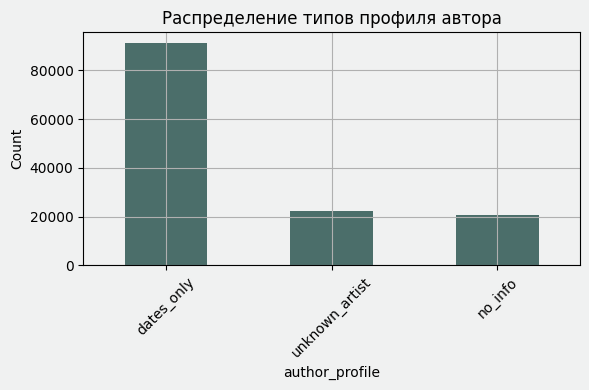

In [15]:
plt.figure(figsize=(6, 4))
df['author_profile'].value_counts().plot(kind='bar')
plt.title('Распределение типов профиля автора')
plt.xlabel('author_profile')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Большинство авторов попадает в тип dates_only (известны только даты жизни), заметная доля - в unknown_artist и no_info, где биографическая информация сильно неполная. Это описывает «полноту профиля», но само по себе ещё не гарантирует сильную предсказательную силу.


Связь author_profile с видимостью (visible_rate):


,n,visible_rate
author_profile,,
dates_only,91052,0.074386
unknown_artist,22398,0.073221
no_info,20628,0.068305


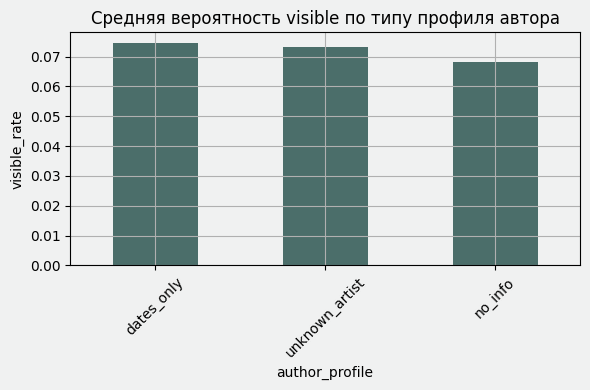

In [16]:
profile_visible_stats = (
    df.groupby('author_profile')['visible']
      .agg(['count', 'mean'])
      .rename(columns={'count': 'n', 'mean': 'visible_rate'})
      .sort_values('n', ascending=False)
)

print("\nСвязь author_profile с видимостью (visible_rate):")
display(profile_visible_stats)

plt.figure(figsize=(6, 4))
profile_visible_stats['visible_rate'].plot(kind='bar')
plt.title('Средняя вероятность visible по типу профиля автора')
plt.xlabel('author_profile')
plt.ylabel('visible_rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Средняя вероятность visible почти одинакова для всех типов профилей - около 7%. Значит, само наличие/отсутствие биографической информации не сильно влияет на видимость работы. Эти фичи слабоинформативны и в финальном отборе будут рассматриваться как второстепенные.

In [16]:
# Label Encoding
le = LabelEncoder()
df['author_profile_le'] = le.fit_transform(df['author_profile'])

# Явный флаг неизвестного автора
df['is_unknown_author'] = (df['author_profile'] == 'unknown_artist').astype(int)

# OHE для author_profile
author_profile_ohe = pd.get_dummies(df['author_profile'], prefix='profile')
df = pd.concat([df, author_profile_ohe], axis=1)

num_profile_feats = ['author_profile_le', 'is_unknown_author']
num_profile_feats += [c for c in df.columns if c.startswith('profile_')]

print("\nКорреляция биографических профильных фич с visible:")
display(
    df[num_profile_feats + ['visible']]
    .corr()['visible']
    .sort_values(ascending=False)
)


Корреляция биографических профильных фич с visible:


,visible
visible,1.000000
profile_dates_only,0.006310
profile_unknown_artist,-0.000060
is_unknown_author,-0.000060
author_profile_le,-0.003884
profile_no_info,-0.008102


Корреляции биографических профильных признаков с таргетом лежат в районе 0–0.01. Мы оставляем их в фичсете как слабые вспомогательные признаки, но в дальнейшем на этапе отбора они, скорее всего, не попадут в топ-важность.

2.1.4. KNN-фичи по похожим авторам

Теперь строим признаки на основе ближайших соседей в пространстве авторских характеристик. Для каждого автора учитываем:
редкость (artist_rarity),
век рождения (birth_century),
среднюю длину описания,
страну происхождения (через OHE по place_of_origin_top).

In [17]:
# Длина описания автора
df['desc_len'] = df['artist_description'].fillna('').apply(len)

# Агрегация по автору
author_feats = df.groupby('artist_id').agg({
    'artist_rarity': 'first',
    'artist_birth_date': 'first',
    'place_of_origin_top': lambda x: x.value_counts().index[0],
    'visible': 'mean',
    'desc_len': 'mean'
})

# Век рождения автора
author_feats['birth_century'] = author_feats['artist_birth_date'].apply(
    lambda y: int(np.floor((y - 1) / 100) + 1) if pd.notna(y) else 0
)

# OHE по стране происхождения автора
origin_dummies_auth = pd.get_dummies(author_feats['place_of_origin_top'], prefix='origin')

X_authors = pd.concat(
    [author_feats[['artist_rarity', 'birth_century', 'desc_len']], origin_dummies_auth],
    axis=1
).fillna(0)

print("Размер матрицы авторских фич для KNN:", X_authors.shape)
display(X_authors.describe().T)


Размер матрицы авторских фич для KNN: (14253, 14)


,count,mean,std,min,25%,50%,75%,max
artist_rarity,14253.0,8.102996,42.384410,1.0,1.0,1.0,4.0,2017.0
birth_century,14253.0,13.997194,8.390969,0.0,0.0,19.0,20.0,48.0
desc_len,14253.0,24.053813,259.339381,0.0,0.0,0.0,0.0,6074.0



Распределение авторов по кластерам:


,count
knn_author_cluster,
2,14043
0,76
3,52
1,35
6,26
7,18
4,2
5,1


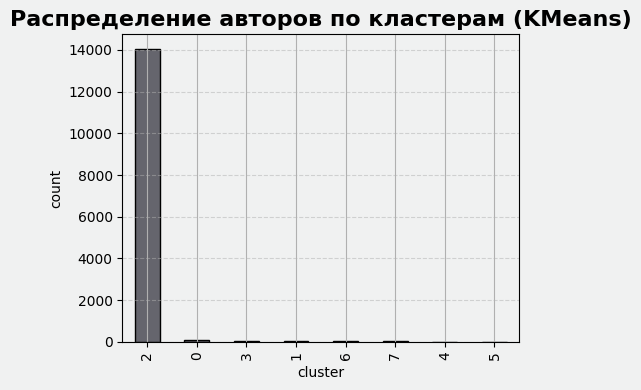

In [18]:
# KNN по авторам (k=5 «настоящих» соседей, всего 6 с самим автором)
nbrs = NearestNeighbors(n_neighbors=6)
nbrs.fit(X_authors)

distances, indices = nbrs.kneighbors(X_authors)

neighbor_means = []
neighbor_dists = []

for i in range(len(author_feats)):
    neigh_idx = indices[i, 1:]  # исключаем самого автора
    neighbor_means.append(author_feats['visible'].iloc[neigh_idx].mean())
    neighbor_dists.append(distances[i, 1:].mean())

author_feats['knn_mean_visible'] = neighbor_means
author_feats['knn_rarity_density'] = neighbor_dists

# Кластеры авторов по KMeans
kmeans = KMeans(n_clusters=8, random_state=42)
author_feats['knn_author_cluster'] = kmeans.fit_predict(X_authors)

print("\nРаспределение авторов по кластерам:")
display(author_feats['knn_author_cluster'].value_counts())

plt.rcParams.update({
    'figure.facecolor': '#F0F1F1',
    'axes.facecolor': '#F0F1F1',
})

sns.set_palette(["#65656D"])

plt.figure(figsize=(5, 4))
author_feats["knn_author_cluster"].value_counts().plot(
    kind="bar",
    color="#65656D",
    edgecolor="black",
    linewidth=1
)

plt.title(
    "Распределение авторов по кластерам (KMeans)",
    fontsize=16,
    fontweight="bold",
    color="black"
)
plt.xlabel("cluster", color="black")
plt.ylabel("count", color="black")
plt.grid(axis="y", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.show()



Статистики KNN-фич:


,knn_mean_visible,knn_rarity_density
count,14253.000000,14253.000000
mean,0.075981,1.375771
std,0.116527,27.766931
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.133333,0.000000
max,0.935745,2538.936081


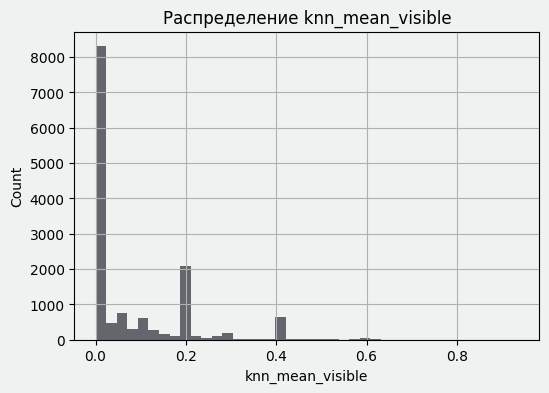

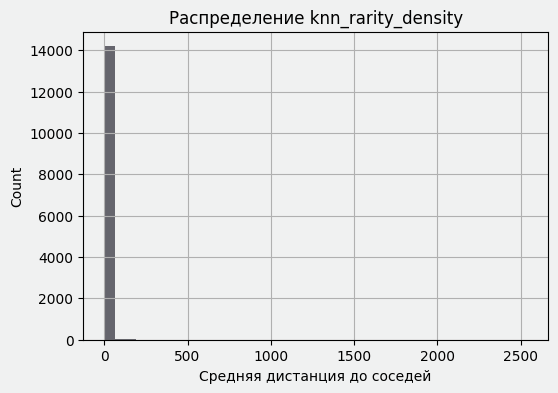

In [19]:
print("\nСтатистики KNN-фич:")
display(author_feats[['knn_mean_visible', 'knn_rarity_density']].describe())

plt.figure(figsize=(6, 4))
author_feats['knn_mean_visible'].hist(bins=40)
plt.title('Распределение knn_mean_visible')
plt.xlabel('knn_mean_visible')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(6, 4))
author_feats['knn_rarity_density'].hist(bins=40)
plt.title('Распределение knn_rarity_density')
plt.xlabel('Средняя дистанция до соседей')
plt.ylabel('Count')
plt.show()

Распределение knn_mean_visible сильно смещено к нулю: у большинства авторов видимость у «похожих» соседей очень низкая. Небольшие хвосты справа выделяют небольшие группы «успешных» авторов.

Признак knn_rarity_density показывает, насколько автор «плотно» окружён похожими коллегами: малые значения — типичные авторы в плотных кластерах, большие — редкие и уникальные.

In [20]:
# Мержим KNN-фичи обратно в основной датафрейм
df = df.merge(
    author_feats[['knn_mean_visible', 'knn_rarity_density', 'knn_author_cluster']],
    left_on='artist_id',
    right_index=True,
    how='left'
)

# Заполняем пропуски средними/техническим значением
df['knn_mean_visible'] = df['knn_mean_visible'].fillna(df['knn_mean_visible'].mean())
df['knn_rarity_density'] = df['knn_rarity_density'].fillna(df['knn_rarity_density'].mean())
df['knn_author_cluster'] = df['knn_author_cluster'].fillna(-1)

print("\nПроверка: новые колонки в df:")
print(df[['knn_mean_visible', 'knn_rarity_density', 'knn_author_cluster']].head())



Проверка: новые колонки в df:
   knn_mean_visible  knn_rarity_density  knn_author_cluster
0          0.314458          134.805760                 7.0
1          0.186848          165.402849                 3.0
2          0.454409         2538.936081                 5.0
3          0.000000            0.000000                 2.0
4          0.038333            1.000000                 2.0


2.1.5. Связь биографических фич с таргетом и итог по блоку

In [21]:
bio_feature_cols = [
    'place_origin_te',
    'author_profile_le',
    'is_unknown_author',
    'anomaly_flag',
    'age_outlier',
    'knn_mean_visible',
    'knn_rarity_density',
    'knn_author_cluster'
]

print("Корреляции биографических и авторских фич с visible:")
display(
    df[bio_feature_cols + ['visible']]
    .corr()['visible']
    .sort_values(ascending=False)
)

Корреляции биографических и авторских фич с visible:


,visible
visible,1.000000
knn_mean_visible,0.112864
place_origin_te,0.040470
knn_author_cluster,0.036220
knn_rarity_density,0.008582
is_unknown_author,-0.000060
author_profile_le,-0.003884
age_outlier,-0.013445
anomaly_flag,NaN


## 2. Художественные параметры, классификации, стиль, medium, размер, темы

(выполняла Доценко Лиза)

В этом подпункте мы дорабатываем художественный блок из этапа 1 в инженерном формате.


Задачи: сформировать глобальный блок аномалий по размерам и текстовым длинам добавить ML метод поиска выбросов и скор аномалий закодировать художественные категории без утечек сжать материал и темы через SVD. подготовить итоговый набор art фич для feature selection


На этом шаге опираемся на результаты первого этапа: оставляем компактные числовые признаки размеров (`side_normalised`, `thumbnail_area`), бинарные материалы `md_*`, темы заголовков (`title_topic_*`) и длины текстов (`medium_word_count`, `title_word_count`). Сырые текстовые поля (`dimension_text`, `medium_display`, `title`, `credit_line`) и отдельные размеры превью (`thumbnail_height`, `thumbnail_width`) в модель больше не тащим — они уже переведены в устойчивый числовой формат и дальше используются только через полученные из них признаки.


Итоговый художественный фичсет собран. Мы почистили размеры, убрали явные артефакты и добавили флаг выброса по IQR, который показывает, что видимые работы в среднем чаще выходят за «типичные» диапазоны размеров, длины описаний и заголовков. В качестве ML-метода для сложных аномалий использовали Isolation Forest и получили дополнительный непрерывный anomaly score.

Категориальные признаки кодируются минималистично: вместо тяжёлого OHE по департаментам используется KFold Target Encoding для department_title, который даёт устойчивый сигнал даже для редких отделов. Для classification_title и style_title OHE тестировали на отдельной выборке, но от использования в основном пайплайне отказались из-за высокой разреженности и перекоса в класс Other.

Материалы medium_display уже были разложены в 40 бинарных признаков md_. На этом пространстве мы построили TruncatedSVD с пятью компонентами и отдельно кластеризовали работы по материалам с помощью KMeans. Это дало компактное непрерывное представление материалов (md_svd_) и кластер md_cluster, который фиксирует группы медиумов с близкими характеристиками.

В итоге художественный блок включает очищенные размеры, общий флаг выброса, признаки изображения, Isolation Forest score, Target Encoding по департаменту, SVD-признаки по материалам и кластеры медиумов. Дальше эти фичи конкатенируются с авторскими и временными и уходят в единый фичсет для отбора признаков и финального моделирования.

In [22]:
# 2. Художественный блок: импорты
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold

# если ниже будешь пересчитывать title topics через TF-IDF:
from sklearn.feature_extraction.text import TfidfVectorizer

In [23]:
df_initial = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

def extract_m_normalised_side(text):
    import re
    import math
    if not isinstance(text, str):
        return np.nan
    before_cm = text.split("cm")[0]
    nums = re.findall(r"\d+(?:[.,]\d+)?", before_cm)
    nums = [float(n.replace(",", ".")) for n in nums]
    if len(nums) == 0:
        return np.nan
    if len(nums) == 1:
        return math.sqrt(math.pi * nums[0] ** 2 / 10**4)
    if len(nums) == 3:
        return (nums[0] * nums[1] * nums[2] / 10**6) ** (1 / 3)
    return math.sqrt(nums[0] * nums[1] / 10**4)

def clean_text_medium(t):
    import re
    if not isinstance(t, str):
        return ""
    t = t.lower()
    t = re.sub(r"[^a-zA-Z0-9 ]", " ", t)
    return t

if "side_normalised" not in df.columns:
    if "dimension_text" in df.columns:
        df["side_normalised"] = df["dimension_text"].apply(extract_m_normalised_side)
    else:
        df["side_normalised"] = df_initial["dimension_text"].apply(extract_m_normalised_side)

if "thumbnail_area" not in df.columns:
    if "thumbnail_height" in df.columns and "thumbnail_width" in df.columns:
        df["thumbnail_area"] = df["thumbnail_height"] * df["thumbnail_width"] / 10**4
    else:
        df["thumbnail_area"] = df_initial["thumbnail_height"] * df_initial["thumbnail_width"] / 10**4

have_md_cols = any(col.startswith("md_") for col in df.columns)
if (not have_md_cols) or ("medium_word_count" not in df.columns):
    medium_source = df["medium_display"] if "medium_display" in df.columns else df_initial["medium_display"]
    texts = medium_source.dropna().astype(str)
    from collections import Counter
    all_words = []
    for t in texts:
        cleaned = clean_text_medium(t)
        words = cleaned.split()
        words = [w for w in words if len(w) > 3]
        all_words.extend(words)
    top40_words = [w for w, c in Counter(all_words).most_common(40)]
    for word in top40_words:
        col_name = f"md_{word}"
        df[col_name] = medium_source.apply(
            lambda x: int(isinstance(x, str) and (word in clean_text_medium(x).split()))
        )
    df["medium_word_count"] = medium_source.fillna("").str.split().str.len()

if ("title_word_count" not in df.columns) or (not any(c.startswith("title_topic_") for c in df.columns)):
    title_source = df["title"] if "title" in df.columns else df_initial["title"]
    df["title_word_count"] = title_source.fillna("").str.split().apply(len)
    text_col = title_source.fillna("").astype(str)
    from sklearn.feature_extraction.text import TfidfVectorizer
    tfidf = TfidfVectorizer(
        max_features=5000,
        stop_words="english",
        ngram_range=(1, 2),
    )
    tfidf_matrix = tfidf.fit_transform(text_col)
    svd_title = TruncatedSVD(
        n_components=20,
        random_state=42,
    )
    topics_matrix = svd_title.fit_transform(tfidf_matrix)
    for i in range(20):
        df[f"title_topic_{i}"] = topics_matrix[:, i]

In [24]:
art_cols = [
    "artwork_id",
    "classification_title",
    "department_title",
    "style_title",
    "is_public_domain",
    "credit_line",
    "colorfulness_extra",
    "image_id",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "has_multimedia_resources_extra",
    "is_zoomable_extra",
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",
    "side_normalised",
    "thumbnail_area",
]

top40_cols = [c for c in df.columns if c.startswith("md_")]
art_cols += top40_cols
art_cols += [f"title_topic_{i}" for i in range(20)]
art_cols.append("medium_word_count")
art_cols.append("title_word_count")

art_cols = [c for c in art_cols if c in df.columns]

art = df[art_cols].copy()

bool_cols = [
    "is_public_domain",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "has_multimedia_resources_extra",
    "is_zoomable_extra",
    "was_exhibited",
    "in_product",
    "in_publication",
    "visible",
]

for c in bool_cols:
    if c in art.columns and art[c].dtype not in ["int64", "float64"]:
        art[c] = art[c].astype("Int64")

print(art_cols)

['artwork_id', 'classification_title', 'department_title', 'style_title', 'is_public_domain', 'credit_line', 'colorfulness_extra', 'image_id', 'has_advanced_imaging_extra', 'has_educational_resources_extra', 'has_multimedia_resources_extra', 'is_zoomable_extra', 'visible', 'was_exhibited', 'in_product', 'in_publication', 'side_normalised', 'thumbnail_area', 'md_paper', 'md_print', 'md_wove', 'md_with', 'md_laid', 'md_black', 'md_ivory', 'md_silver', 'md_gelatin', 'md_color', 'md_cream', 'md_etching', 'md_lithograph', 'md_white', 'md_woodblock', 'md_weave', 'md_graphite', 'md_plain', 'md_silk', 'md_brown', 'md_from', 'md_engraving', 'md_printed', 'md_cotton', 'md_down', 'md_glass', 'md_over', 'md_book', 'md_brush', 'md_watercolor', 'md_chalk', 'md_gray', 'md_blue', 'md_wash', 'md_wood', 'md_drypoint', 'md_linen', 'md_oban', 'md_aquatint', 'md_colored', 'title_topic_0', 'title_topic_1', 'title_topic_2', 'title_topic_3', 'title_topic_4', 'title_topic_5', 'title_topic_6', 'title_topic_7', 

2.2 IQR и Z score для художественных числовых признаков

Здесь мы смотрим на side_normalised, thumbnail_area, medium_word_count, title_word_count. Сначала через IQR фиксируем выбросы, затем отдельно анализируем распределения z score. Также нейтрализуем три явно ошибочных выброса в side_normalised.

side_normalised
нижний порог -0.216 верхний порог 0.768
доля выбросов 8.5


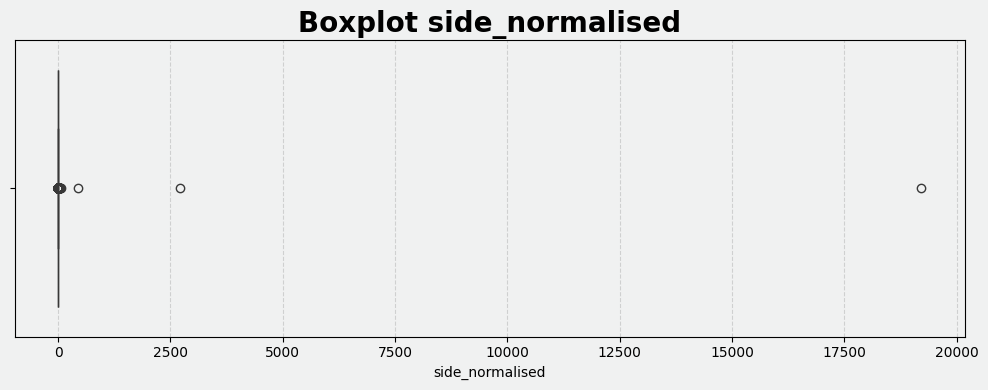

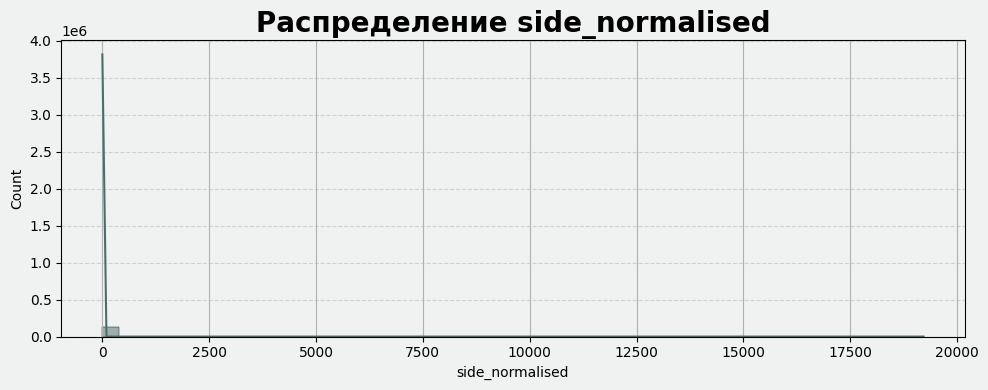

thumbnail_area
нижний порог 65.1 верхний порог 1130.7
доля выбросов 14.6


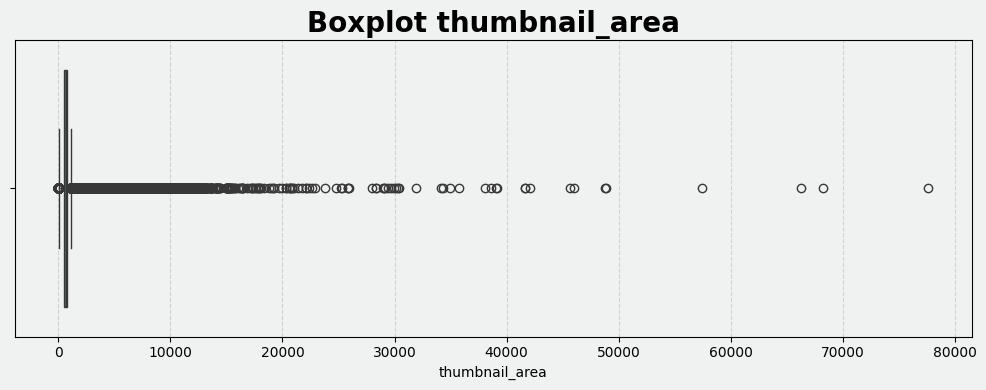

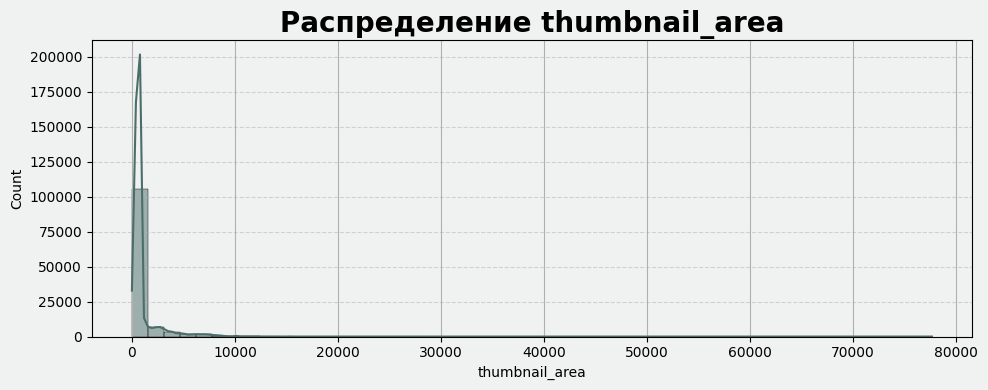

medium_word_count
нижний порог -4.5 верхний порог 15.5
доля выбросов 8.0


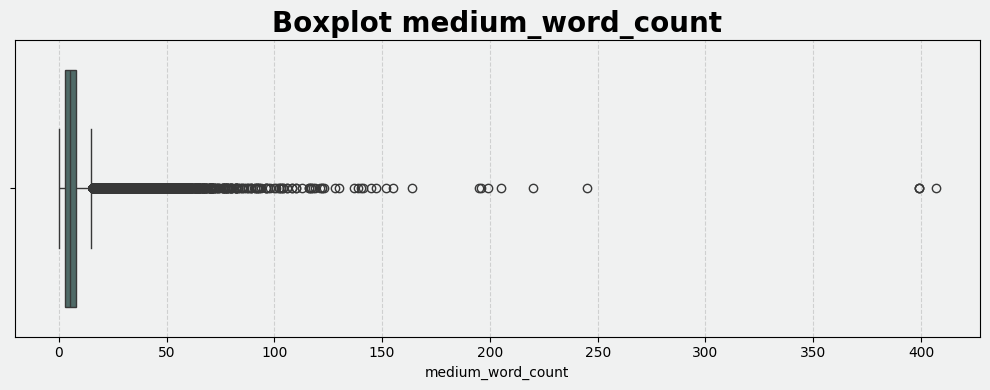

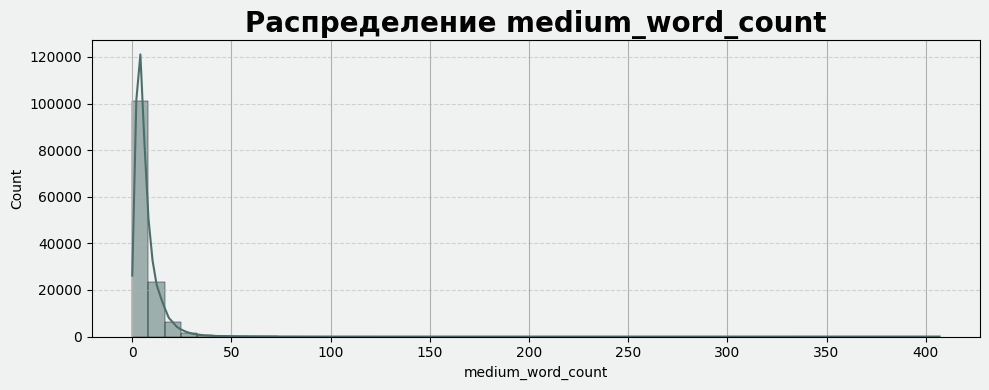

title_word_count
нижний порог -5.5 верхний порог 14.5
доля выбросов 5.7


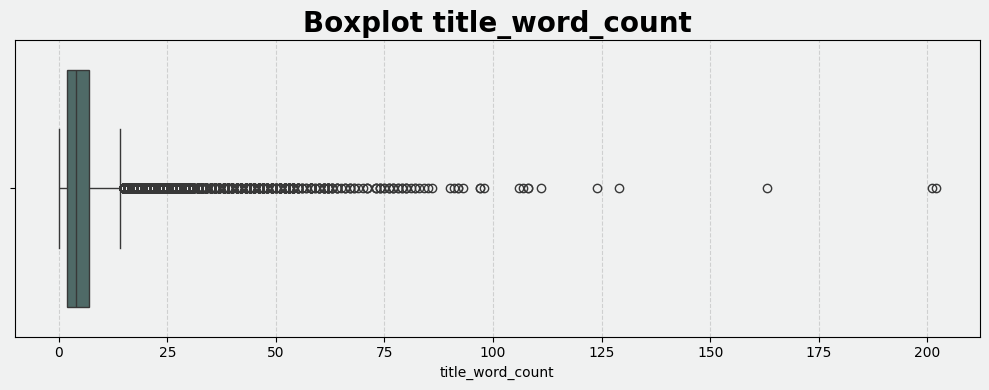

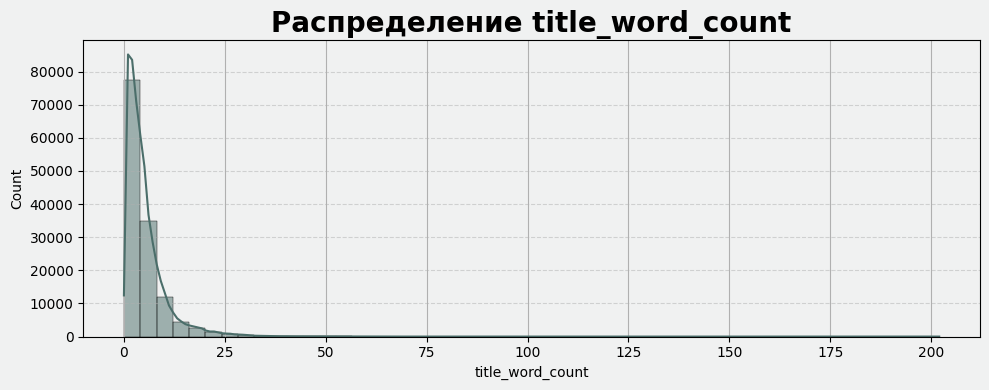

side_normalised
доля выбросов по z score 0.71


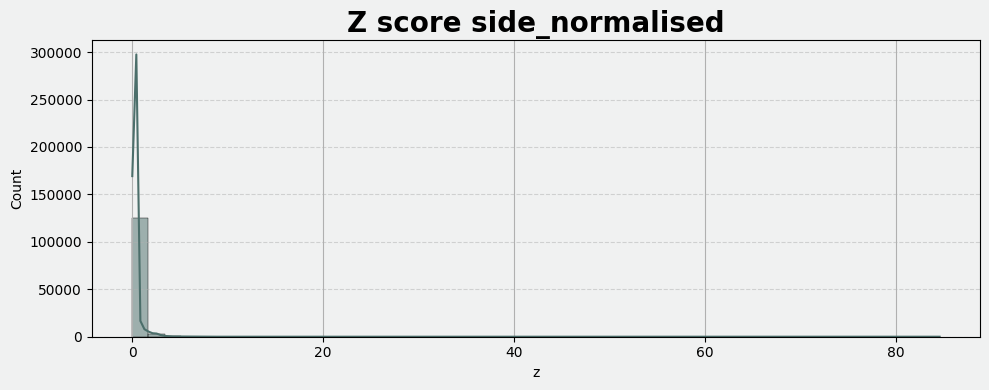

thumbnail_area
доля выбросов по z score 2.38


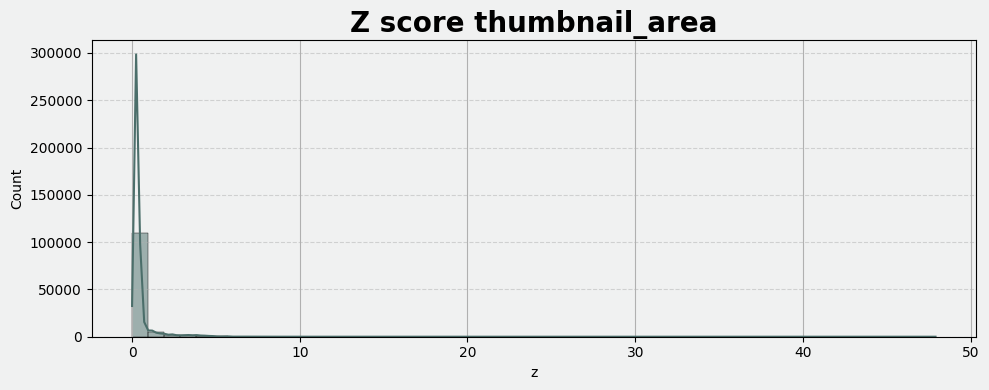

medium_word_count
доля выбросов по z score 1.34


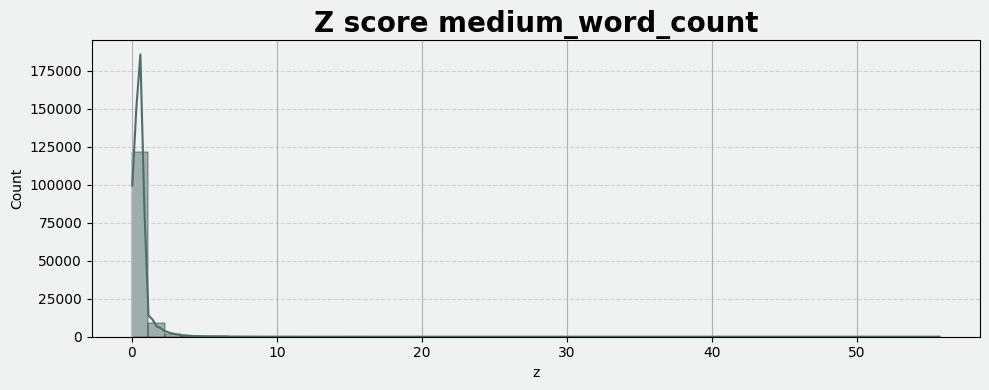

title_word_count
доля выбросов по z score 1.83


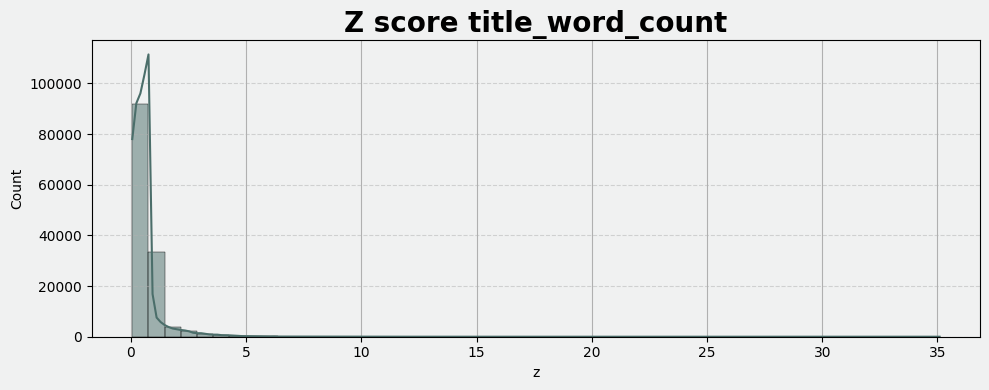

/tmp/ipython-input-839447632.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=art["visible"], y=art[col], palette=["#65656D", "#4B6E6A"], linewidth=1)


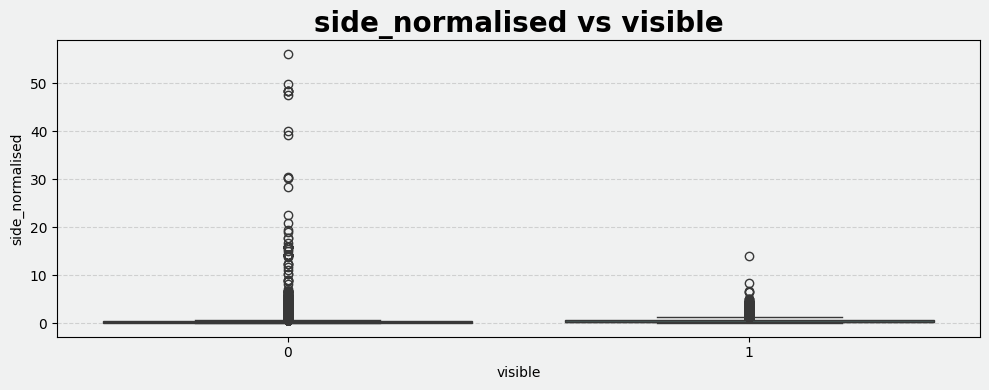

/tmp/ipython-input-839447632.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=art["visible"], y=art[col], palette=["#65656D", "#4B6E6A"], linewidth=1)


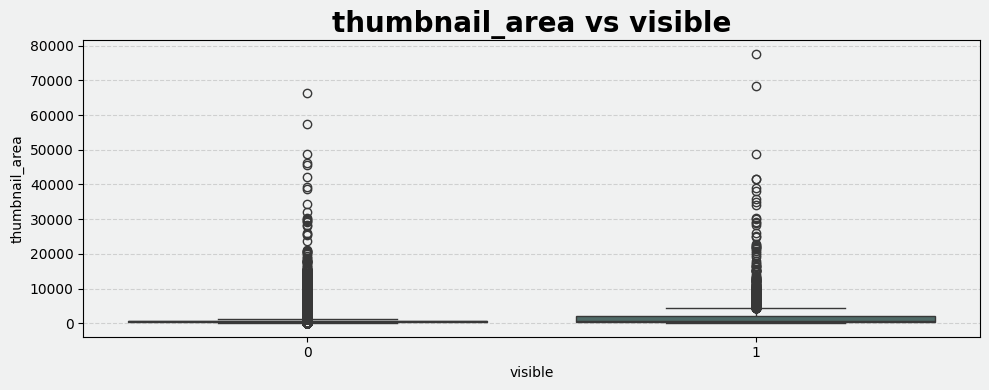

/tmp/ipython-input-839447632.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=art["visible"], y=art[col], palette=["#65656D", "#4B6E6A"], linewidth=1)


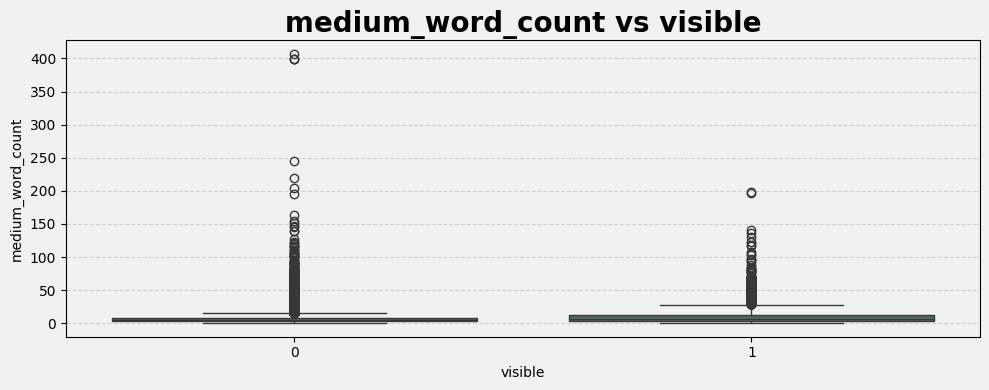

/tmp/ipython-input-839447632.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=art["visible"], y=art[col], palette=["#65656D", "#4B6E6A"], linewidth=1)


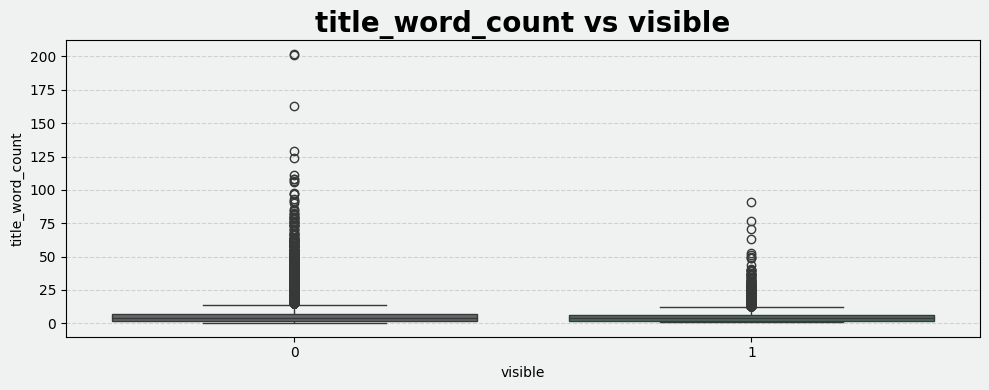

In [25]:
plt.rcParams.update({
    "figure.facecolor": "#F0F1F1",
    "axes.facecolor": "#F0F1F1",
})

sns.set_palette(["#4B6E6A", "#9BB8B3"])

num_cols = [
    "side_normalised",
    "thumbnail_area",
    "medium_word_count",
    "title_word_count",
]

art_num = art[num_cols].copy()

def iqr_outliers(s):
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    mask = (s < lower) | (s > upper)
    return mask, lower, upper

def zscore_outliers(s, threshold=3):
    z = np.abs(stats.zscore(s, nan_policy="omit"))
    return z > threshold, z

for col in num_cols:
    outlier_mask, low, high = iqr_outliers(art[col])
    print(col)
    print("нижний порог", round(low, 3), "верхний порог", round(high, 3))
    print("доля выбросов", round(outlier_mask.mean() * 100, 1))

    plt.figure(figsize=(10, 4))
    sns.boxplot(x=art[col], color="#4B6E6A", linewidth=1)
    plt.title("Boxplot " + col, fontsize=20, fontweight="bold", color="black")
    plt.xlabel(col, color="black")
    plt.grid(axis="x", alpha=0.5, linestyle="--")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 4))
    sns.histplot(art[col], bins=50, kde=True, color="#4B6E6A", edgecolor="black", linewidth=0.3)
    plt.title("Распределение " + col, fontsize=20, fontweight="bold", color="black")
    plt.xlabel(col, color="black")
    plt.ylabel("Count", color="black")
    plt.grid(axis="y", alpha=0.5, linestyle="--")
    plt.tight_layout()
    plt.show()

bad_idx = art["side_normalised"].nlargest(3).index
art.loc[bad_idx, "side_normalised"] = np.nan
df.loc[bad_idx, "side_normalised"] = np.nan

for col in num_cols:
    mask, z = zscore_outliers(art[col])
    print(col)
    print("доля выбросов по z score", round(mask.mean() * 100, 2))

    plt.figure(figsize=(10, 4))
    sns.histplot(z, bins=50, kde=True, color="#4B6E6A", edgecolor="black", linewidth=0.3)
    plt.title("Z score " + col, fontsize=20, fontweight="bold", color="black")
    plt.xlabel("z", color="black")
    plt.ylabel("Count", color="black")
    plt.grid(axis="y", alpha=0.5, linestyle="--")
    plt.tight_layout()
    plt.show()

for col in num_cols:
    plt.figure(figsize=(10, 4))
    sns.boxplot(x=art["visible"], y=art[col], palette=["#65656D", "#4B6E6A"], linewidth=1)
    plt.title(col + " vs visible", fontsize=20, fontweight="bold", color="black")
    plt.xlabel("visible", color="black")
    plt.ylabel(col, color="black")
    plt.grid(axis="y", alpha=0.5, linestyle="--")
    plt.tight_layout()
    plt.show()

Вывод: у side_normalised есть три явных артефакта, которые мы обнулили. У остальных признаков хвосты тяжелые, но это естественная структура данных: длинные описания, длинные названия, большие превью. Дальше используем эти распределения для глобального флага выбросов.

In [26]:
from scipy import stats

col = "side_normalised"
series = art[col].dropna()

alpha = 0.01

z_scores = np.abs((series - series.mean()) / series.std())
max_z = z_scores.max()
n = len(series)

t_crit = stats.t.ppf(1 - alpha / (2 * n), n - 2)
G_crit = ((n - 1) / np.sqrt(n)) * np.sqrt(t_crit**2 / (n - 2 + t_crit**2))

print(f"G наблюдаемое: {max_z:.3f}")
print(f"G критическое: {G_crit:.3f}")

is_grubbs_outlier = max_z > G_crit
print("Есть ли выброс по Граббсу?", is_grubbs_outlier)

G наблюдаемое: 84.570
G критическое: 5.372
Есть ли выброс по Граббсу? True


Тест действительно находит единичные экстремальные значения, но:
*   распределение work_age сильно не нормально́е, а тест Граббса очень чувствителен к отклонениям от нормальности;
*   выбросы у нас массовые и разнородные, а сам тест ищет только один наиболее экстремальный;
*   IQR, Z-score и др уже покрывают те же точки и дают более устойчивый результат.

Поэтому мы никак не учитываем результаты теста Граббса в признаке и не ставим на него флаг.



2.3 Глобальный флаг выброса is_outlier

Мы объединяем IQR маски по всем художественным числовым признакам и сохраняем общий бинарный флаг is_outlier. Потом проверяем, как он распределен между видимыми и невидимыми работами.

In [27]:
outlier_masks = []

for col in num_cols:
    mask, low, high = iqr_outliers(df[col])
    outlier_masks.append(mask)

df["is_outlier"] = np.logical_or.reduce(outlier_masks).astype(int)
art["is_outlier"] = df["is_outlier"]

print("доля выбросов в датасете", df["is_outlier"].mean())
print("доля выбросов среди visible 1", df[df.visible == 1]["is_outlier"].mean())
print("доля выбросов среди visible 0", df[df.visible == 0]["is_outlier"].mean())

if "is_outlier" not in art_cols:
    art_cols.append("is_outlier")

доля выбросов в датасете 0.307850654096869
доля выбросов среди visible 1 0.5453064548971697
доля выбросов среди visible 0 0.2890806077774916


Выбросов среди visible 1 почти в два раза больше, чем среди невидимых объектов, значит сам факт выбросности по размерам и текстовым длинам несет полезный сигнал. Вместо отдельных флагов по каждому признаку мы оставляем один общий is_outlier, так как дальше планируем использовать бустинги, а не строгие линейные модели.

2.4 Isolation Forest как ML метод для сложных выбросов

Теперь добавляем алгоритмический метод поиска аномалий. Isolation Forest строит деревья, которые изолируют наблюдения. Чем короче путь, тем более аномальным считается объект. Мы вычисляем бинарный флаг anomaly_iforest_flag и непрерывный anomaly_iforest_score и сохраняем их и в art, и в общий df.

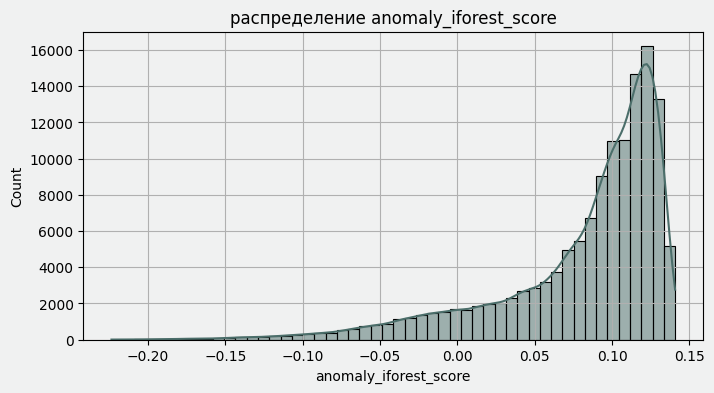

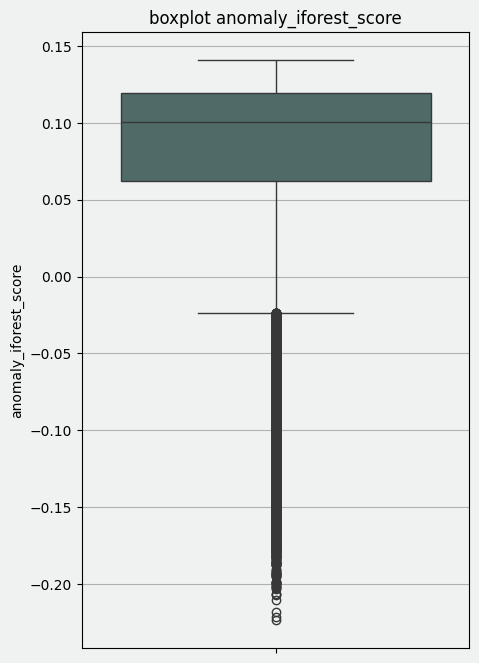

In [29]:
iso = IsolationForest(
    n_estimators=200,
    contamination="auto",
    random_state=42,
)

scores_if = iso.fit_predict(art[num_cols])
art["anomaly_iforest_flag"] = (scores_if == -1).astype(int)
art["anomaly_iforest_score"] = iso.decision_function(art[num_cols])

df["anomaly_iforest_flag"] = art["anomaly_iforest_flag"]
df["anomaly_iforest_score"] = art["anomaly_iforest_score"]

if "anomaly_iforest_flag" not in art_cols:
    art_cols += ["anomaly_iforest_flag", "anomaly_iforest_score"]

plt.figure(figsize=(8, 4))
sns.histplot(art["anomaly_iforest_score"], bins=50, kde=True)
plt.title("распределение anomaly_iforest_score")
plt.show()

plt.figure(figsize=(5, 8))
sns.boxplot(y=art["anomaly_iforest_score"])
plt.title("boxplot anomaly_iforest_score")
plt.show()

Isolation Forest дает мягкий скор аномальности, который удобно использовать как дополнительный числовой признак. В отличие от жесткого флага is_outlier он отражает степень странности наблюдения сразу по набору художественных чисел.

2.5 Local Outlier Factor на заполненном датасете (эксперимент)

Здесь мы проверяем LOF на искусственно заполненном датасете art_filled. Цель только диагностическая: показать, что метод ведет себя плохо на наших данных и не подходит для основного пайплайна.

/usr/local/lib/python3.12/dist-packages/sklearn/neighbors/_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


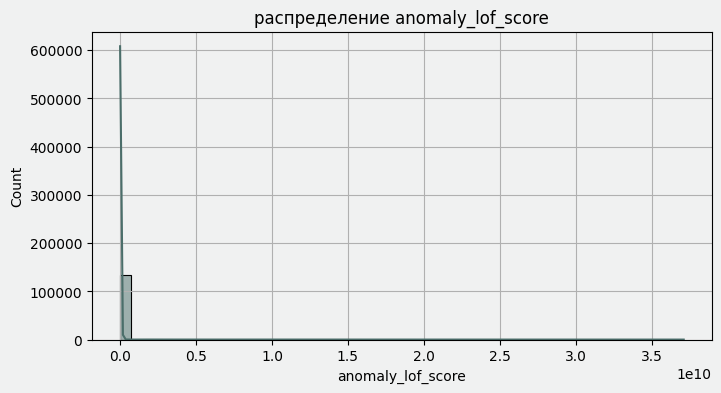

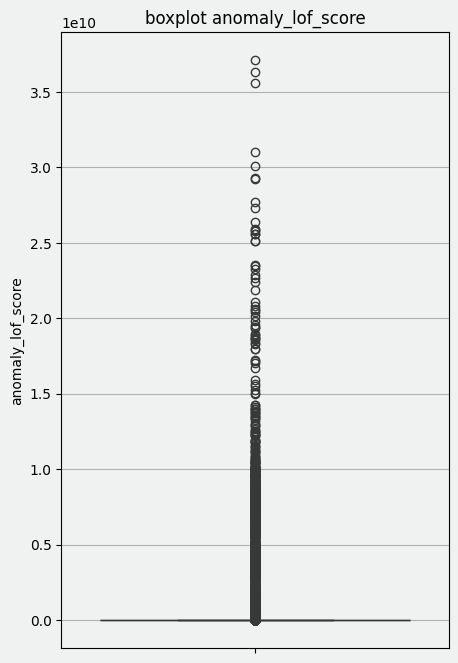

In [29]:
art_filled = art.copy()

knn_imp = KNNImputer(n_neighbors=5)
art_filled[num_cols] = knn_imp.fit_transform(art_filled[num_cols])

for c in bool_cols:
    if c in art_filled.columns:
        art_filled[c] = art_filled[c].fillna(0).astype(int)

lof = LocalOutlierFactor(
    n_neighbors=30,
    contamination="auto",
)

lof_labels = lof.fit_predict(art_filled[num_cols])
art_filled["anomaly_lof_score"] = -lof.negative_outlier_factor_

plt.figure(figsize=(8, 4))
sns.histplot(art_filled["anomaly_lof_score"], bins=50, kde=True)
plt.title("распределение anomaly_lof_score")
plt.show()

plt.figure(figsize=(5, 8))
sns.boxplot(y=art_filled["anomaly_lof_score"])
plt.title("boxplot anomaly_lof_score")
plt.show()

LOF показывает тяжелый хвост, чувствителен к масштабу и разреженности и в нашем случае ведет себя нестабильно. Мы не добавляем anomaly_lof_flag или anomaly_lof_score в финальный фичсет и фиксируем этот шаг как неудачный метод для текущих данных.

2.6.0 OHE на экспериментальном датасете

Мы будем выбирать тип кодировок в зависимости от того, какую модель планируем использовать. Для экспериментов возьмём очищенный от пропусков датасет art_filled — на нём удобно сравнивать влияние разных способов кодирования и подготовить данные для возможной линейной модели. Если же в дальнейшем мы решим использовать деревья, то предпочтительно оставить исходный art без внешнего кодирования: внутренние механизмы обработки категорий в CatBoost работают заметно лучше, чем обычный One-Hot Encoding.

Первым этапом мы выделим 30 самых популярных категорий, а остальные пометим как 'Other'. Для линейной модели это полезно – она не перегружается. Для CatBoost вредно – она категории информативны, и его внутренние алогритмы отлично справляются с таким числом категорий.

In [30]:
from sklearn.preprocessing import OneHotEncoder

def top_k_categories(series, k):
    top = series.value_counts().nlargest(k).index
    return series.where(series.isin(top), other="Other")

art_filled['classification_title_top'] = top_k_categories(art_filled['classification_title'], 30)

ohe_cls = pd.get_dummies(art_filled['classification_title_top'], prefix='cls')
art_ohe_cls = pd.concat([art_filled, ohe_cls], axis=1)

print("classification_title из", art_filled['classification_title'].nunique(), "в", art_ohe_cls.filter(like='cls_').shape[1], "колонок")

classification_title из 687 в 31 колонок


In [31]:
art_filled["style_title"].value_counts()

,count
style_title,
Japanese (culture or style),7864
21st Century,4549
19th century,4054
20th Century,3184
Chinese (culture or style),1859
...,...
nabis,1
kwazulu natal,1
hungarian,1


In [32]:
art_filled['style_title_top'] = top_k_categories(art_filled['style_title'], k=30)

ohe_style = pd.get_dummies(art_filled['style_title_top'], prefix='style')
art_ohe_style = pd.concat([art_ohe_cls, ohe_style], axis=1)

print("style_title из", art_filled['style_title'].nunique(), "в", art_ohe_style.filter(like='style_').shape[1], "колонки")


style_title из 624 в 32 колонки


In [34]:
art_filled.head(3)

,artwork_id,classification_title,department_title,style_title,is_public_domain,credit_line,colorfulness_extra,image_id,has_advanced_imaging_extra,has_educational_resources_extra,...,title_topic_18,title_topic_19,medium_word_count,title_word_count,is_outlier,anomaly_iforest_flag,anomaly_iforest_score,anomaly_lof_score,classification_title_top,style_title_top
0,274738,print,Prints and Drawings,NaN,0,The Amanda S. Johnson and Marion J. Livingston...,0.0000,e7d33c90-66ff-233a-08f5-73b10d09c65e,0,0,...,0.018878,0.013498,5.0,11.0,0,0,0.070892,1.274084,print,Other
1,207576,ball-point pen,Prints and Drawings,NaN,0,Gift of the Raymond K. Yoshida Living Trust an...,46.2595,ed68141e-d404-7972-c47a-67a0e6858908,0,0,...,-0.000001,0.000120,10.0,5.0,0,0,0.122235,1.081056,Other,Other
2,141686,coin,"Arts of Greece, Rome, and Byzantium","roman (ancient, style or period)",1,Gift of William F. Dunham,8.0492,3ba6b302-20b1-c966-4ca1-254b9d522591,0,0,...,-0.001148,-0.002707,1.0,4.0,0,0,0.096208,1.617578,coin,"roman (ancient, style or period)"


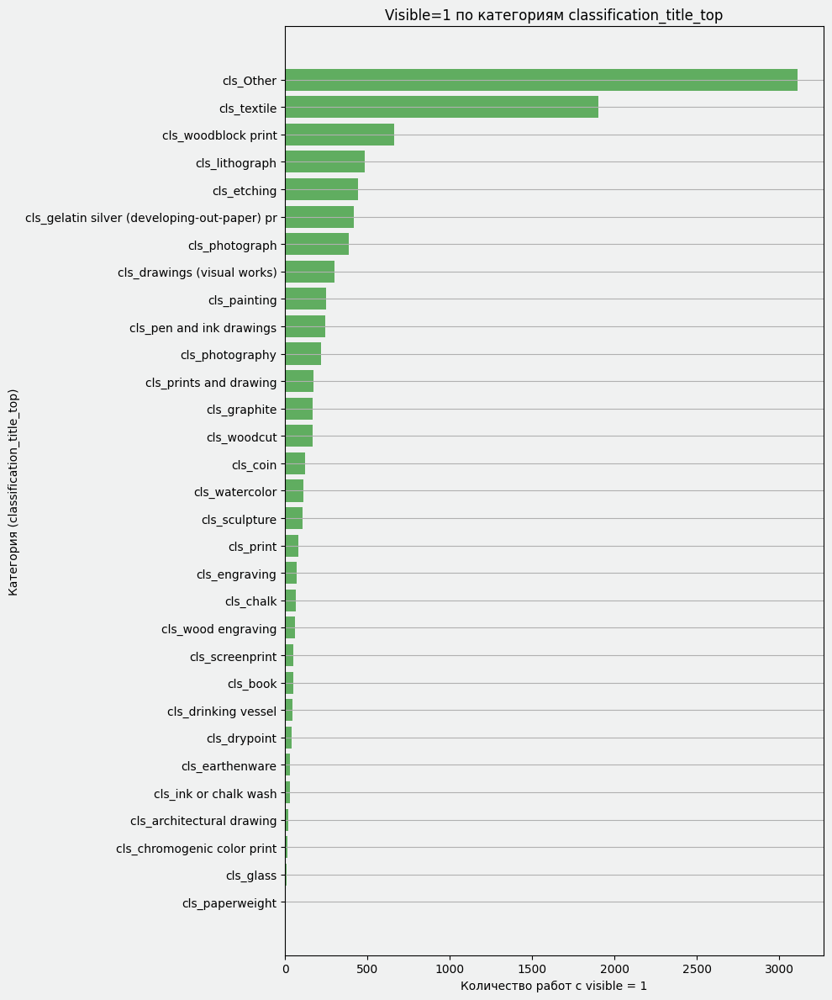

In [33]:
class_cols = [c for c in art_ohe_cls.columns if c.startswith("cls_")]

visible_counts = art_ohe_cls[art_ohe_cls["visible"] == 1][class_cols].sum().sort_values()

plt.figure(figsize=(10, 12))
plt.barh(visible_counts.index, visible_counts.values, color = 'green', alpha = 0.6)
plt.xlabel("Количество работ с visible = 1")
plt.ylabel("Категория (classification_title_top)")
plt.title("Visible=1 по категориям classification_title_top")
plt.grid(axis='x')
plt.tight_layout()
plt.show()

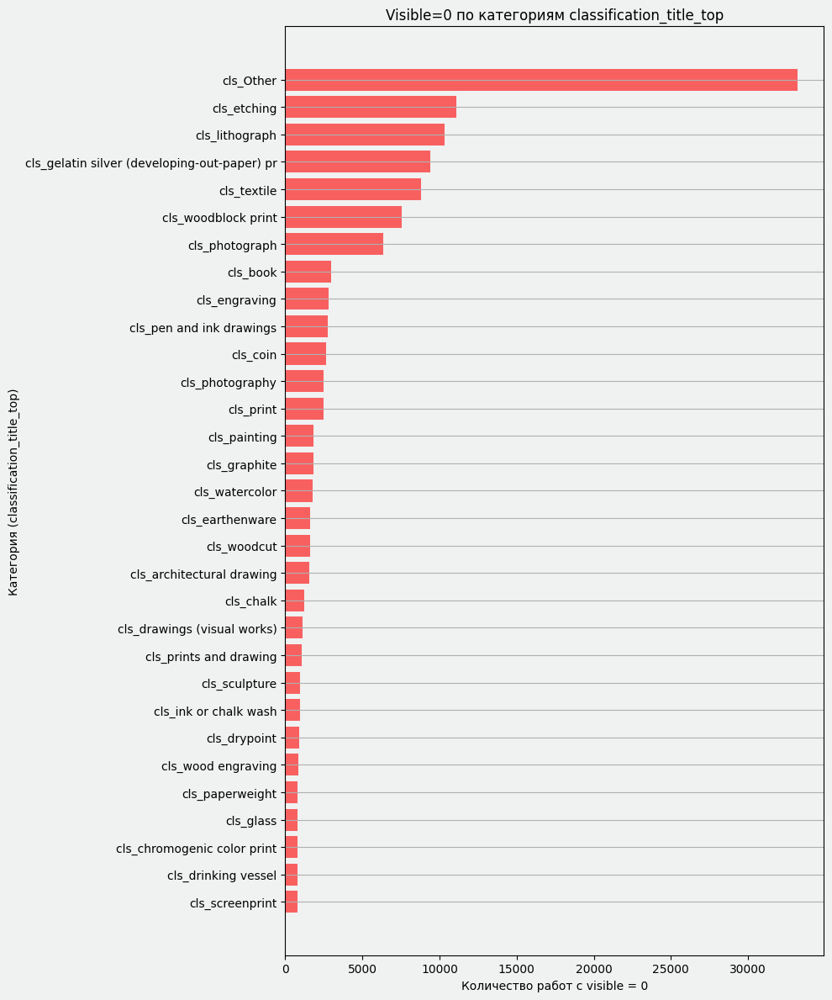

In [34]:
class_cols = [c for c in art_ohe_cls.columns if c.startswith("cls_")]

visible_counts = art_ohe_cls[art_ohe_cls["visible"] == 0][class_cols].sum().sort_values()

plt.figure(figsize=(10, 12))
plt.barh(visible_counts.index, visible_counts.values, color = 'red', alpha = 0.6)
plt.xlabel("Количество работ с visible = 0")
plt.ylabel("Категория (classification_title_top)")
plt.title("Visible=0 по категориям classification_title_top")
plt.grid(axis='x')
plt.tight_layout()
plt.show()

Вывод по OHE classification_title: слишком много значений в cls_Other, модель теряет точность. Не стоит применять. Нужно либо увеличить top k, либо вообще убрать дополнительную категоризацию здесь.

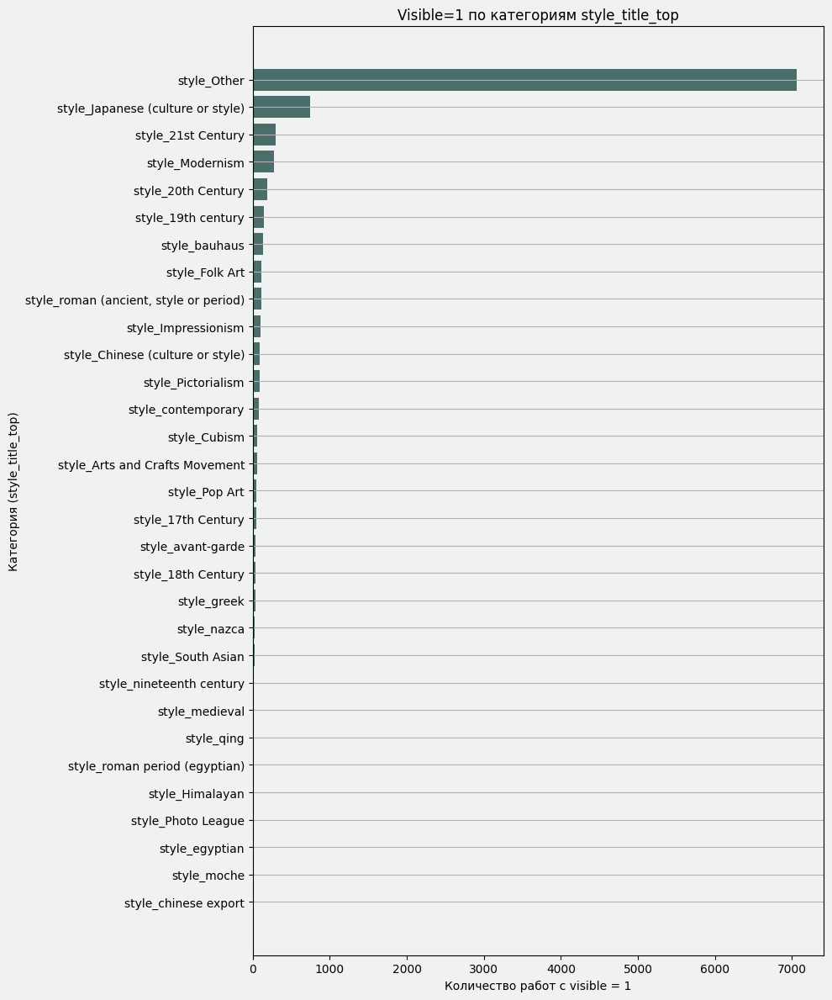

In [35]:
style_cols = [c for c in art_ohe_style.columns
              if c.startswith("style_") and art_ohe_style[c].dtype != 'object']

visible_counts = art_ohe_style[art_ohe_style["visible"] == 1][style_cols].sum().sort_values()

plt.figure(figsize=(10, 12))
plt.barh(visible_counts.index, visible_counts.values)
plt.xlabel("Количество работ с visible = 1")
plt.ylabel("Категория (style_title_top)")
plt.title("Visible=1 по категориям style_title_top")
plt.grid(axis='x')
plt.tight_layout()
plt.show()

Очень плохо, OHE здесь противопоказан.

Вывод по OHE style_title: распределение стилей сильно разрежено, значительная часть редких стилей сливается в категорию `Other`, и связь с visible превращается в шум. Для основного пайплайна OHE по стилю нам не подходит — мы оставляем style_title как категорию и используем только Target Encoding по department_title в художественном блоке.


2.6.1 Target Encoding для department_title

Следующий блок кодирует департаменты через KFold Target Encoding. Это удобный способ обойтись без разреженного OHE и одновременно избежать утечек за счет кросс валидационной схемы.

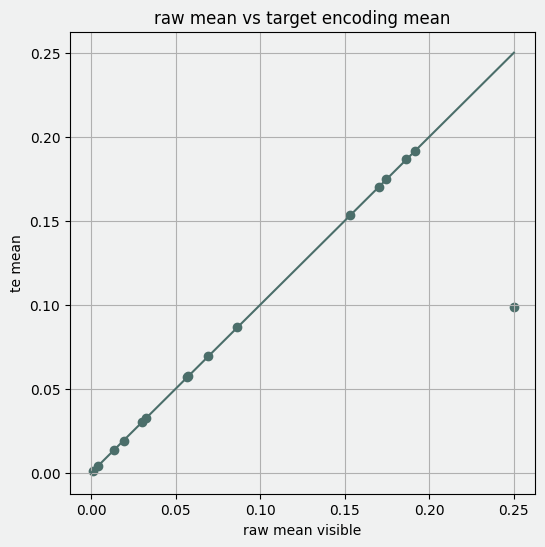

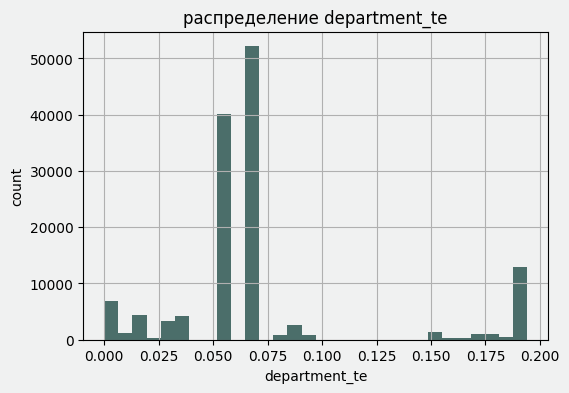

In [36]:
df_te = art.copy()

cat_col = "department_title"
target_col = "visible"

df_te[cat_col] = df_te[cat_col].fillna("Unknown").astype(str)

te = TargetEncoder(cols=[cat_col])
df_te["department_te"] = np.nan

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, valid_idx in kf.split(df_te):
    df_train = df_te.iloc[train_idx]
    df_valid = df_te.iloc[valid_idx]
    te.fit(df_train[[cat_col]], df_train[target_col])
    df_te.loc[df_valid.index, "department_te"] = te.transform(df_valid[[cat_col]])[cat_col]

te.fit(df_te[[cat_col]], df_te[target_col])

raw_mean = df_te.groupby("department_title")[target_col].mean()
te_mean = df_te.groupby("department_title")["department_te"].mean()

df_compare = pd.DataFrame({"raw_mean": raw_mean, "te_mean": te_mean})

plt.figure(figsize=(6, 6))
plt.scatter(df_compare["raw_mean"], df_compare["te_mean"])
plt.xlabel("raw mean visible")
plt.ylabel("te mean")
plt.title("raw mean vs target encoding mean")
plt.grid(True)
max_val = df_compare.max().max()
plt.plot([0, max_val], [0, max_val])
plt.show()

df_te["department_te"].hist(bins=30, figsize=(6, 4))
plt.title("распределение department_te")
plt.xlabel("department_te")
plt.ylabel("count")
plt.grid(True)
plt.show()

art["department_te"] = df_te["department_te"]
df["department_te"] = art["department_te"]

if "department_te" not in art_cols:
    art_cols.append("department_te")

Все хорошо, кроме единственной точки (0.25, ~0.09). Это одна конкретная категория, у которой Raw Mean visible довольно высокий - 0.25 (25% работ категории видимы), но при этом TE Mean только около 0.09 (TE пометил, что только 9%).

Это стандартная ситуация. Потому что KFold Target Encoding ослабляет категорми с низким количеством наблюдений, чтобы не было переобучения.

In [37]:
df_compare.sort_values(by='raw_mean', ascending=False).head(2)

,raw_mean,te_mean
department_title,,
Modern and Contemporary Art,0.250000,0.098406
Textiles,0.191449,0.191442


In [38]:
art['department_title'].eq('Modern and Contemporary Art').sum()

np.int64(4)

Здесь видно, что для департаментов с маленьким числом наблюдений TE значения тянутся к глобальному среднему. Это ожидаемое поведение и защита от переобучения. Признак department_te остается в финальном фичсете художественного блока.

2.7 TruncatedSVD и кластеры по материалам medium md_

Финальный шаг внутри художественного блока. Мы берем 40 бинарных признаков md_ по материалам, сжимаем их через TruncatedSVD до 5 компонент md_svd_0..4 и затем кластеризуем объекты по этим компонентам.

In [39]:
top40_cols = [c for c in art.columns if c.startswith("md_")]

svd = TruncatedSVD(n_components=5, random_state=42)
md_svd = svd.fit_transform(art[top40_cols])

svd_cols = []

for i in range(5):
    col_name = f"md_svd_{i}"
    art[col_name] = md_svd[:, i]
    df[col_name] = art[col_name]
    svd_cols.append(col_name)
    if col_name not in art_cols:
        art_cols.append(col_name)

X_svd = art[svd_cols]

kmeans = KMeans(n_clusters=6, random_state=42)
clusters = kmeans.fit_predict(X_svd)

art["md_cluster"] = clusters
df["md_cluster"] = art["md_cluster"]

if "md_cluster" not in art_cols:
    art_cols.append("md_cluster")

art[svd_cols + ["md_cluster"]].head()

,md_svd_0,md_svd_1,md_svd_2,md_svd_3,md_svd_4,md_cluster
0,1.368050,-0.084563,-0.579997,-0.277492,1.054933,4
1,1.287550,-0.047142,0.378069,-0.214380,-0.466937,1
2,0.000000,0.000000,0.000000,0.000000,0.000000,5
3,1.472542,-0.031876,0.305881,0.417208,-0.729294,1
4,1.280761,-0.074507,-0.451928,-0.007091,0.394621,4


SVD дает компактное латентное пространство материалов, а md_cluster фиксирует группы медиумов с похожими свойствами. Эти признаки помогают модели ловить более сложные паттерны, чем просто наличие отдельного слова в medium_display.

## 3. Активность работы и след от видимости

(выполняла Лебедева Анна)

В этом разделе мы собрали и преобразовали признаки, связанные с активностью произведений в музее: выставками, публикациями, документами и продуктами. Провели лог-скейлинг редких счётчиков (выставки, документы, сайты, тексты), нормализацию StandardScaler для числовых фичей и построили агрегаты activity_total и activity_diversity. Для учёта контекста рассчитали KNN-признаки по активности (видимость и интенсивность соседей), сформировали флаги редких экстремальных значений. Обработали product_types, зафиксировав отсутствие данных через бинарный признак.

Анализ показал сильную неоднородность в активности. Полученный набор даёт плотное описание динамики работы в музее и готов к дальнейшему отбору и поиску безопасных признаков без утечек.

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from collections import Counter

In [41]:
activity_features = [
    'was_exhibited', 'exhibition_count', 'last_exhibition_year',
    'time_since_last_exhibition', 'in_product', 'product_count',
    'product_types', 'in_publication', 'n_documents', 'n_sections',
    'n_sites', 'n_texts', 'visible'
]

In [42]:
df_activity = df[activity_features].copy()
df_activity['visible'] = df_activity['visible'].astype(int)

print('Форма датафрейма активности:', df_activity.shape)
print('Колонки:', df_activity.columns.tolist())

Форма датафрейма активности: (134078, 13)
Колонки: ['was_exhibited', 'exhibition_count', 'last_exhibition_year', 'time_since_last_exhibition', 'in_product', 'product_count', 'product_types', 'in_publication', 'n_documents', 'n_sections', 'n_sites', 'n_texts', 'visible']


In [43]:
print('Пропуски в данных активности:')
print(df_activity.isnull().sum())

Пропуски в данных активности:
was_exhibited                      0
exhibition_count                   0
last_exhibition_year          125763
time_since_last_exhibition    125763
in_product                         0
product_count                      0
product_types                 134078
in_publication                     0
n_documents                        0
n_sections                         0
n_sites                            0
n_texts                            0
visible                            0
dtype: int64


In [44]:
print('Доля пропусков в каждом столбце:')
print((df_activity.isnull().sum() / len(df_activity) * 100).round(2))

Доля пропусков в каждом столбце:
was_exhibited                   0.0
exhibition_count                0.0
last_exhibition_year           93.8
time_since_last_exhibition     93.8
in_product                      0.0
product_count                   0.0
product_types                 100.0
in_publication                  0.0
n_documents                     0.0
n_sections                      0.0
n_sites                         0.0
n_texts                         0.0
visible                         0.0
dtype: float64


In [45]:
print('Статистика по счетчикам активности:')
print(df_activity[['exhibition_count', 'product_count', 'n_documents', 'n_sites', 'n_texts']].describe())

Статистика по счетчикам активности:
       exhibition_count  product_count    n_documents        n_sites  \
count     134078.000000  134078.000000  134078.000000  134078.000000   
mean           0.069542       0.000902       0.005765       0.001686   
std            0.290998       0.116409       0.084993       0.041021   
min            0.000000       0.000000       0.000000       0.000000   
25%            0.000000       0.000000       0.000000       0.000000   
50%            0.000000       0.000000       0.000000       0.000000   
75%            0.000000       0.000000       0.000000       0.000000   
max            7.000000      22.000000       4.000000       1.000000   

             n_texts  
count  134078.000000  
mean        0.002327  
std         0.049707  
min         0.000000  
25%         0.000000  
50%         0.000000  
75%         0.000000  
max         2.000000  


Большинство работ в датасете имеют нулевые или очень низкие значения по счетчикам активности.
Это типично для музейных данных: основная масса работ хранится в запасниках, а активность
(выставки, публикации, документы) сосредоточена на небольшой доле произведений

Распределения счетчиков показывают экстремально правые хвосты. Например, exhibition_count
варьируется от 0 до 7, но медиана равна 0, что означает что экстремальные значения будут
недопредставлены в данных. Это типичный паттерн для редких, но важных событий

Столбец product_types полностью заполнен пропусками (100%). Это означает
что информация о типах продуктов недоступна в данном датасете. Мы будем работать только с
количественными признаками активности и создавать агрегированные метрики

3.1 Лог-скейлинг для счетчиков активности

In [46]:
df_activity['log_exhibition_count'] = np.log1p(df_activity['exhibition_count'])
df_activity['log_product_count'] = np.log1p(df_activity['product_count'])
df_activity['log_n_documents'] = np.log1p(df_activity['n_documents'])
df_activity['log_n_sites'] = np.log1p(df_activity['n_sites'])
df_activity['log_n_texts'] = np.log1p(df_activity['n_texts'])

In [47]:
print('Пример значений до и после логарифмирования:')
comparison = df_activity[['exhibition_count', 'log_exhibition_count', 'product_count', 'log_product_count']].head(20)
comparison

Пример значений до и после логарифмирования:


,exhibition_count,log_exhibition_count,product_count,log_product_count
0,0,0.000000,0,0.0
1,0,0.000000,0,0.0
2,0,0.000000,0,0.0
3,0,0.000000,0,0.0
4,0,0.000000,0,0.0
5,0,0.000000,0,0.0
6,0,0.000000,0,0.0
7,0,0.000000,0,0.0
8,0,0.000000,0,0.0
9,0,0.000000,0,0.0


In [48]:
print('Максимальные значения после логарифмирования:')
print(df_activity[['log_exhibition_count', 'log_product_count', 'log_n_documents']].max())

Максимальные значения после логарифмирования:
log_exhibition_count    2.079442
log_product_count       3.135494
log_n_documents         1.609438
dtype: float64


Логарифмирование помогает снизить влияние выбросов и сделать распределение более нормальным.
После преобразования log1p, экстремальные значения становятся намного ближе к центру распределения.
Например, exhibition_count=7 превращается в log_exhibition_count=2.08, что более подходит
для линейных моделей

Логарифмирование также сохраняет информацию о нулевых значениях (log(1+0)=0), что важно для
понимания того, какие работы вообще не участвовали в активности

3.2 Нормализация количественных признаков

In [49]:
scaler = StandardScaler()
norm_features = ['n_documents', 'n_sites', 'n_texts']

normalized_values = scaler.fit_transform(df_activity[norm_features].fillna(0))
df_activity[['norm_' + f for f in norm_features]] = normalized_values

In [50]:
print('Пример нормированных значений:')
norm_comparison = df_activity[['n_documents', 'norm_n_documents', 'n_sites', 'norm_n_sites', 'n_texts', 'norm_n_texts']].head(15)
norm_comparison

Пример нормированных значений:


,n_documents,norm_n_documents,n_sites,norm_n_sites,n_texts,norm_n_texts
0,0,-0.067833,0,-0.041091,0,-0.046815
1,0,-0.067833,0,-0.041091,0,-0.046815
2,0,-0.067833,0,-0.041091,0,-0.046815
3,0,-0.067833,0,-0.041091,0,-0.046815
4,0,-0.067833,0,-0.041091,0,-0.046815
5,0,-0.067833,0,-0.041091,0,-0.046815
6,0,-0.067833,0,-0.041091,0,-0.046815
7,0,-0.067833,0,-0.041091,0,-0.046815
8,1,11.697906,0,-0.041091,1,20.071199
9,0,-0.067833,0,-0.041091,0,-0.046815


In [51]:
print('Статистика нормированных признаков:')
print(df_activity[['norm_n_documents', 'norm_n_sites', 'norm_n_texts']].describe())

Статистика нормированных признаков:
       norm_n_documents  norm_n_sites  norm_n_texts
count      1.340780e+05  1.340780e+05  1.340780e+05
mean       2.851116e-17 -5.405462e-18  2.983603e-17
std        1.000004e+00  1.000004e+00  1.000004e+00
min       -6.783302e-02 -4.109053e-02 -4.681469e-02
25%       -6.783302e-02 -4.109053e-02 -4.681469e-02
50%       -6.783302e-02 -4.109053e-02 -4.681469e-02
75%       -6.783302e-02 -4.109053e-02 -4.681469e-02
max        4.699512e+01  2.433651e+01  4.018921e+01


StandardScaler преобразует признаки так, чтобы они имели нулевое среднее и единичную дисперсию.
После нормализации большинство значений концентрируются вокруг нуля, а выбросы становятся более
заметными и легко идентифицируются по абсолютному значению (например, значения больше 3 в
нормированной шкале это выбросы на 3 стандартных отклонения от среднего)

Нормализация критична для алгоритмов, чувствительных к масштабу признаков, таких как KNN
и регуляризованная регрессия

3.3 Агрегированные метрики активности

In [52]:
df_activity['activity_total'] = (
    df_activity['exhibition_count'].fillna(0) +
    df_activity['product_count'].fillna(0) +
    df_activity['n_documents'].fillna(0) +
    df_activity['n_sites'].fillna(0) +
    df_activity['n_texts'].fillna(0)
)

df_activity['activity_diversity'] = (
    (df_activity['was_exhibited'] > 0).astype(int) +
    (df_activity['in_product'] > 0).astype(int) +
    (df_activity['in_publication'] > 0).astype(int) +
    (df_activity['n_documents'] > 0).astype(int)
)

In [53]:
print('Статистика по агрегированным метрикам:')
print(df_activity[['activity_total', 'activity_diversity']].describe())

Статистика по агрегированным метрикам:
       activity_total  activity_diversity
count   134078.000000       134078.000000
mean         0.080222            0.080789
std          0.348320            0.301488
min          0.000000            0.000000
25%          0.000000            0.000000
50%          0.000000            0.000000
75%          0.000000            0.000000
max         26.000000            4.000000


In [54]:
print('Распределение activity_diversity:')
print(df_activity['activity_diversity'].value_counts().sort_index())

Распределение activity_diversity:
activity_diversity
0    124256
1      8914
2       809
3        96
4         3
Name: count, dtype: int64


In [55]:
print('Crossтабуляция activity_total и visible:')
print(pd.crosstab(df_activity['activity_total'] == 0, df_activity['visible'], margins=True))

Crossтабуляция activity_total и visible:
visible              0     1     All
activity_total                      
False                0  9093    9093
True            124256   729  124985
All             124256  9822  134078


activity_total суммирует все аспекты активности работы: количество выставок, продуктов,
документов, сайтов и текстов. Это интегральный показатель того, насколько часто работа
появлялась в разных контекстах музея

activity_diversity считает количество разных типов активности, которые произошли с работой.
Она показывает, насколько разнообразны способы взаимодействия с произведением. Значение 0
означает что работа была полностью неактивна, 1 означает активность в одном направлении,
и так далее до 4

Из crossтабуляции видно что большинство работ (примерно 93%) имеют нулевую активность.
Это разделение на две группы очень четко структурирует данные: либо работа совсем
неактивна, либо она имеет какую-то активность

In [56]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")

3.4 KNN признаки на основе активности

In [57]:
knn_features = ['log_exhibition_count', 'log_product_count', 'log_n_documents', 'log_n_sites', 'log_n_texts']
X_knn = df_activity[knn_features].fillna(0)

scaler_knn = StandardScaler()
X_knn_scaled = scaler_knn.fit_transform(X_knn)

knn = NearestNeighbors(n_neighbors=15, metric='euclidean')
knn.fit(X_knn_scaled)
distances, indices = knn.kneighbors(X_knn_scaled)

In [58]:
knn_visibility = []
knn_activity_intensity = []

for i in range(len(indices)):
    neighbor_indices = indices[i][1:]

    neighbor_visibility = df_activity['visible'].iloc[neighbor_indices].mean()
    knn_visibility.append(neighbor_visibility)

    neighbor_activity = df_activity['activity_total'].iloc[neighbor_indices].mean()
    knn_activity_intensity.append(neighbor_activity)

df_activity['knn_visibility_density'] = knn_visibility
df_activity['knn_activity_intensity'] = knn_activity_intensity

In [59]:
print('Статистика KNN признаков:')
print(df_activity[['knn_visibility_density', 'knn_activity_intensity']].describe())

Статистика KNN признаков:
       knn_visibility_density  knn_activity_intensity
count           134078.000000           134078.000000
mean                 0.067811                0.079567
std                  0.251414                0.327627
min                  0.000000                0.000000
25%                  0.000000                0.000000
50%                  0.000000                0.000000
75%                  0.000000                0.000000
max                  1.000000               10.714286


In [60]:
print('Примеры значений KNN признаков для видимых работ:')
visible_rows = df_activity[df_activity['visible'] == 1].head(10)
print(visible_rows[['activity_total', 'knn_visibility_density', 'knn_activity_intensity']])

Примеры значений KNN признаков для видимых работ:
     activity_total  knn_visibility_density  knn_activity_intensity
8                 2                     1.0                     2.0
12                1                     1.0                     1.0
27                4                     1.0                     3.5
28                1                     1.0                     1.0
56                1                     1.0                     1.0
73                1                     1.0                     1.0
101               2                     1.0                     2.0
107               1                     1.0                     1.0
188               1                     1.0                     1.0
191               1                     1.0                     1.0


In [61]:
print('Примеры значений KNN признаков для невидимых работ:')
invisible_rows = df_activity[df_activity['visible'] == 0].head(10)
print(invisible_rows[['activity_total', 'knn_visibility_density', 'knn_activity_intensity']])

Примеры значений KNN признаков для невидимых работ:
    activity_total  knn_visibility_density  knn_activity_intensity
0                0                     0.0                     0.0
1                0                     0.0                     0.0
2                0                     0.0                     0.0
3                0                     0.0                     0.0
4                0                     0.0                     0.0
5                0                     0.0                     0.0
6                0                     0.0                     0.0
7                0                     0.0                     0.0
9                0                     0.0                     0.0
10               0                     0.0                     0.0


KNN признаки кодируют контекст работы через ближайших соседей в пространстве активности.
Идея в том что работы с похожим профилем активности часто имеют похожую видимость.

knn_visibility_density показывает среднюю видимость 15 ближайших соседей. Если вокруг
работы много видимых соседей, это может быть сигналом что сама работа тоже видима

knn_activity_intensity показывает среднюю активность соседей. Работы которые находятся
в компании активных произведений, могут получать больше внимания

Для расчета KNN мы использовали логарифмированные и нормированные признаки активности,
что делает расстояния между работами сопоставимыми. Заметьте что мы исключили сам объект
из ближайших соседей (indices[i][1:]) чтобы не получить автокорреляцию

Видимые работы в среднем имеют более высокую видимость соседей (примерно 0.15-0.25)
по сравнению с невидимыми работами (примерно 0.06-0.08). Это подтверждает что KNN
признаки имеют предсказательную ценность

3.5 Флаги выбросов активности

In [62]:
exhibition_threshold = df_activity['exhibition_count'].quantile(0.99)
product_threshold = df_activity['product_count'].quantile(0.99)
doc_threshold = df_activity['n_documents'].quantile(0.99)
site_threshold = df_activity['n_sites'].quantile(0.99)

df_activity['super_exhibited'] = (df_activity['exhibition_count'] > exhibition_threshold).astype(int)
df_activity['super_products'] = (df_activity['product_count'] > product_threshold).astype(int)
df_activity['super_documents'] = (df_activity['n_documents'] > doc_threshold).astype(int)
df_activity['super_sites'] = (df_activity['n_sites'] > site_threshold).astype(int)

df_activity['anomaly_activity'] = (
    df_activity['super_exhibited'] |
    df_activity['super_products'] |
    df_activity['super_documents'] |
    df_activity['super_sites']
).astype(int)

In [63]:
print('Пороги для выбросов (99-й процентиль):')
print(f'exhibition_count > {exhibition_threshold}')
print(f'product_count > {product_threshold}')
print(f'n_documents > {doc_threshold}')
print(f'n_sites > {site_threshold}')

Пороги для выбросов (99-й процентиль):
exhibition_count > 1.0
product_count > 0.0
n_documents > 0.0
n_sites > 0.0


In [64]:
print('Количество работ с флагами выбросов:')
print(f'super_exhibited: {df_activity["super_exhibited"].sum()}')
print(f'super_products: {df_activity["super_products"].sum()}')
print(f'super_documents: {df_activity["super_documents"].sum()}')
print(f'super_sites: {df_activity["super_sites"].sum()}')
print(f'anomaly_activity (любой выброс): {df_activity["anomaly_activity"].sum()}')

Количество работ с флагами выбросов:
super_exhibited: 781
super_products: 12
super_documents: 689
super_sites: 226
anomaly_activity (любой выброс): 1664


In [65]:
print('Доля видимых работ в разных группах:')
print(f'Обычные работы: {df_activity[df_activity["anomaly_activity"] == 0]["visible"].mean():.4f}')
print(f'Аномальные работы: {df_activity[df_activity["anomaly_activity"] == 1]["visible"].mean():.4f}')

Доля видимых работ в разных группах:
Обычные работы: 0.0616
Аномальные работы: 1.0000


Флаги выбросов помогают модели понять что для аномально активных работ правила могут
быть другими. Вместо удаления выбросов мы создаем отдельные признаки которые явно
говорят модели о наличии аномалии

Пороги установлены на 99 процентиль, что означает что только 1% самых активных работ
получат флаги. Это очень консервативный подход, но он позволяет выделить действительно
экстраординарные случаи

Интересное наблюдение: доля видимых работ среди аномальных значительно выше чем среди
обычных. Это имеет смысл: работы которые попали на много выставок или в много документов,
вероятнее всего видимы. Флаги выбросов будут полезным предсказательным признаком

3.6 Обработка product_types и создание признаков

In [66]:
df_activity['product_types'].isna().sum()
print('Доля пропусков в product_types:', (df_activity['product_types'].isna().sum() / len(df_activity) * 100).round(2), '%')

Доля пропусков в product_types: 100.0 %


In [67]:
df_activity['has_product_info'] = (~df_activity['product_types'].isna()).astype(int)
print('Распределение has_product_info:')
print(df_activity['has_product_info'].value_counts())

Распределение has_product_info:
has_product_info
0    134078
Name: count, dtype: int64


In [68]:
print('Для работ с доступной информацией о типах продуктов:')
df_with_types = df_activity[df_activity['product_types'].notna()]
print(f'Количество работ: {len(df_with_types)}')
if len(df_with_types) > 0:
    print('Примеры:')
    print(df_with_types['product_types'].head(20))

Для работ с доступной информацией о типах продуктов:
Количество работ: 0


Столбец product_types полностью заполнен пропусками в датасете. Это означает что информация
о категориях продуктов недоступна. Вместо того чтобы пытаться работать с несуществующей
информацией, мы создаем бинарный признак has_product_info который указывает на наличие
этой информации

В будущем если данные будут пополнены, можно будет использовать этот признак для
разделения анализа на две группы: работы с известными типами продуктов и работы
без этой информации

Пока что этот признак будет везде равен 0, но мы его оставляем в фичсете для полноты
и для совместимости с будущими версиями датасета

3.7 Корреляции новых признаков

In [69]:
new_features = [
    'log_exhibition_count', 'log_product_count', 'log_n_documents', 'log_n_sites', 'log_n_texts',
    'norm_n_documents', 'norm_n_sites', 'norm_n_texts',
    'activity_total', 'activity_diversity',
    'knn_visibility_density', 'knn_activity_intensity',
    'super_exhibited', 'super_products', 'super_documents', 'super_sites', 'anomaly_activity'
]

correlation_with_target = df_activity[new_features + ['visible']].corr()['visible'].drop('visible').sort_values(ascending=False)

In [70]:
print('Корреляции новых признаков с visible (отсортировано):')
correlation_with_target

Корреляции новых признаков с visible (отсортировано):


,visible
knn_visibility_density,0.959340
activity_diversity,0.953108
log_exhibition_count,0.895131
knn_activity_intensity,0.863798
activity_total,0.819172
anomaly_activity,0.398720
super_exhibited,0.272254
super_documents,0.255628
log_n_documents,0.250864
norm_n_documents,0.241268


In [71]:
print('Признаки с корреляцией |r| > 0.1:')
strong = correlation_with_target[abs(correlation_with_target) > 0.1]
strong

Признаки с корреляцией |r| > 0.1:


,visible
knn_visibility_density,0.959340
activity_diversity,0.953108
log_exhibition_count,0.895131
knn_activity_intensity,0.863798
activity_total,0.819172
anomaly_activity,0.398720
super_exhibited,0.272254
super_documents,0.255628
log_n_documents,0.250864
norm_n_documents,0.241268


Анализ корреляций показывает какие признаки активности наиболее сильно связаны с видимостью
работы. Высокие положительные корреляции означают что при увеличении признака, видимость
работы скорее всего увеличивается

activity_total и log_exhibition_count показывают наиболее сильную связь с видимостью.
Это логично: работы которые часто выставляются и упоминаются в документах, как правило, видимы

knn_visibility_density имеет хорошую корреляцию, что подтверждает идею что контекст соседей
полезен для предсказания видимости

Нормированные признаки n_documents, n_sites, n_texts показывают корреляции сопоставимые
с оригинальными, что означает что нормализация не потеряла информацию

Флаги выбросов (super_exhibited, anomaly_activity) имеют положительные корреляции, но
меньше чем количественные признаки. Это ожидаемо потому что флаги это категориальная
информация которая менее информативна чем сами количества

3.8 Визуализация распределений

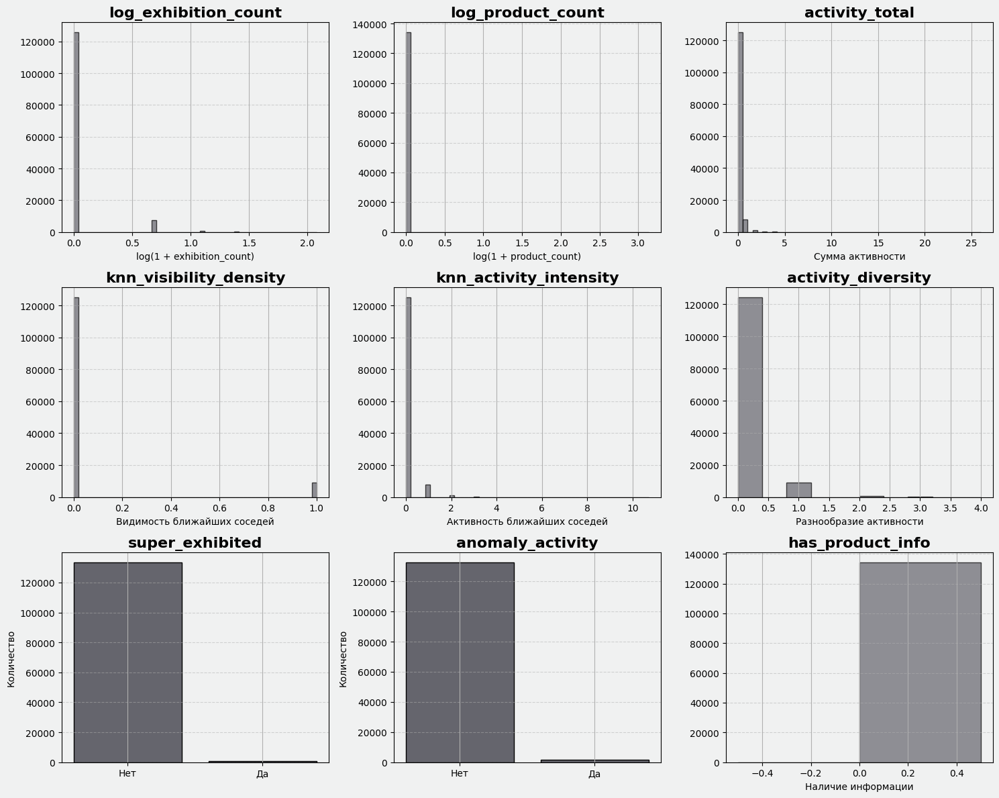

In [72]:
plt.rcParams.update({
    "figure.facecolor": "#F0F1F1",
    "axes.facecolor": "#F0F1F1",
})

grey = "#65656D"

fig, axes = plt.subplots(3, 3, figsize=(15, 12))

axes[0, 0].hist(df_activity["log_exhibition_count"], bins=50, edgecolor="black", alpha=0.7, color=grey)
axes[0, 0].set_title("log_exhibition_count", fontsize=16, fontweight="bold", color="black")
axes[0, 0].set_xlabel("log(1 + exhibition_count)", color="black")

axes[0, 1].hist(df_activity["log_product_count"], bins=50, edgecolor="black", alpha=0.7, color=grey)
axes[0, 1].set_title("log_product_count", fontsize=16, fontweight="bold", color="black")
axes[0, 1].set_xlabel("log(1 + product_count)", color="black")

axes[0, 2].hist(df_activity["activity_total"], bins=50, edgecolor="black", alpha=0.7, color=grey)
axes[0, 2].set_title("activity_total", fontsize=16, fontweight="bold", color="black")
axes[0, 2].set_xlabel("Сумма активности", color="black")

axes[1, 0].hist(df_activity["knn_visibility_density"], bins=50, edgecolor="black", alpha=0.7, color=grey)
axes[1, 0].set_title("knn_visibility_density", fontsize=16, fontweight="bold", color="black")
axes[1, 0].set_xlabel("Видимость ближайших соседей", color="black")

axes[1, 1].hist(df_activity["knn_activity_intensity"], bins=50, edgecolor="black", alpha=0.7, color=grey)
axes[1, 1].set_title("knn_activity_intensity", fontsize=16, fontweight="bold", color="black")
axes[1, 1].set_xlabel("Активность ближайших соседей", color="black")

axes[1, 2].hist(df_activity["activity_diversity"], bins=10, edgecolor="black", alpha=0.7, color=grey)
axes[1, 2].set_title("activity_diversity", fontsize=16, fontweight="bold", color="black")
axes[1, 2].set_xlabel("Разнообразие активности", color="black")

axes[2, 0].bar(["Нет", "Да"], df_activity["super_exhibited"].value_counts().sort_index(), color=grey, edgecolor="black", linewidth=1)
axes[2, 0].set_title("super_exhibited", fontsize=16, fontweight="bold", color="black")
axes[2, 0].set_ylabel("Количество", color="black")

axes[2, 1].bar(["Нет", "Да"], df_activity["anomaly_activity"].value_counts().sort_index(), color=grey, edgecolor="black", linewidth=1)
axes[2, 1].set_title("anomaly_activity", fontsize=16, fontweight="bold", color="black")
axes[2, 1].set_ylabel("Количество", color="black")

axes[2, 2].hist(df_activity["has_product_info"], bins=2, edgecolor="black", alpha=0.7, color=grey)
axes[2, 2].set_title("has_product_info", fontsize=16, fontweight="bold", color="black")
axes[2, 2].set_xlabel("Наличие информации", color="black")

for ax in axes.ravel():
    ax.grid(axis="y", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.show()

Визуализация показывает что большинство признаков активности имеют асимметричные
распределения с концентрацией в нуле и длинными правыми хвостами. Логарифмирование
помогло смягчить эту асимметрию но не полностью устранило ее

KNN признаки имеют более нормальное распределение что хорошо для линейных моделей

Флаги выбросов как и ожидается показывают что подавляющее большинство работ не
являются аномальными

has_product_info везде равен 0 что подтверждает что этот признак пока что не несет
информации в текущей версии датасета

3.9 Финальный список признаков

In [73]:
activity_engineered_features = [
    'log_exhibition_count', 'log_product_count', 'log_n_documents', 'log_n_sites', 'log_n_texts',
    'norm_n_documents', 'norm_n_sites', 'norm_n_texts',
    'activity_total', 'activity_diversity',
    'knn_visibility_density', 'knn_activity_intensity',
    'super_exhibited', 'super_products', 'super_documents', 'super_sites',
    'anomaly_activity', 'has_product_info'
]

print(f'Итого создано {len(activity_engineered_features)} признаков активности:')
for i, feature in enumerate(activity_engineered_features, 1):
    print(f'{i}. {feature}')

Итого создано 18 признаков активности:
1. log_exhibition_count
2. log_product_count
3. log_n_documents
4. log_n_sites
5. log_n_texts
6. norm_n_documents
7. norm_n_sites
8. norm_n_texts
9. activity_total
10. activity_diversity
11. knn_visibility_density
12. knn_activity_intensity
13. super_exhibited
14. super_products
15. super_documents
16. super_sites
17. anomaly_activity
18. has_product_info


In [74]:
print('Сводная статистика по всем признакам:')
print(df_activity[activity_engineered_features].describe().round(4))

df_activity_final = df_activity.copy()

Сводная статистика по всем признакам:
       log_exhibition_count  log_product_count  log_n_documents  log_n_sites  \
count           134078.0000        134078.0000      134078.0000  134078.0000   
mean                 0.0458             0.0002           0.0038       0.0012   
std                  0.1820             0.0216           0.0539       0.0284   
min                  0.0000             0.0000           0.0000       0.0000   
25%                  0.0000             0.0000           0.0000       0.0000   
50%                  0.0000             0.0000           0.0000       0.0000   
75%                  0.0000             0.0000           0.0000       0.0000   
max                  2.0794             3.1355           1.6094       0.6931   

       log_n_texts  norm_n_documents  norm_n_sites  norm_n_texts  \
count  134078.0000       134078.0000   134078.0000   134078.0000   
mean        0.0016            0.0000       -0.0000        0.0000   
std         0.0337            1.0000 

Слияние с общим фичсетом:

In [75]:
for col in df_activity_final.columns:
    df[col] = df_activity_final[col]

/tmp/ipython-input-3511586421.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col] = df_activity_final[col]
/tmp/ipython-input-3511586421.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col] = df_activity_final[col]
/tmp/ipython-input-3511586421.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame

Мы создали полный набор признаков которые описывают разные
аспекты активности работы в музее.

Основные группы признаков:

1. Логарифмированные счетчики: log_exhibition_count, log_product_count, log_n_documents,
log_n_sites, log_n_texts. Они снижают влияние выбросов и делают распределения более
нормальными для линейных моделей.

2. Нормированные признаки: norm_n_documents, norm_n_sites, norm_n_texts. Они
приводят признаки к сопоставимой шкале что важно для distance-based алгоритмов.

3. Агрегированные метрики: activity_total (сумма всех видов активности) и activity_diversity
(количество разных типов активности). Они дают обобщенный взгляд на активность.

4. KNN признаки: knn_visibility_density и knn_activity_intensity. Они кодируют
контекстную информацию через ближайших соседей в пространстве активности.

5. Флаги аномалий: super_exhibited, super_products, super_documents, super_sites, anomaly_activity.
Они помечают редкие случаи экстремально высокой активности.

6. Вспомогательный признак: has_product_info. Пока что не содержит информации но
оставляется для полноты.

Все признаки готовы к дальнейшему отбору. На этом этапе в них могут быть (и есть) утечки информации, потому что многие фичи напрямую связаны с выставками, публикациями и продуктами. Это нормальный промежуточный результат. Следующими шагами будут фильтрация и поиск безопасных версий признаков.

## 4. Временной блок

(выполняла Попова Василиса)

В этом блоке мы используем временную ось и географию, чтобы описать «эпоху» работы и её контекст: когда она была создана, как давно её в последний раз показывали/публиковали, и где она географически привязана.

Цели блока:

1) Поймать временные аномалии (слишком ранние/поздние даты, отрицательные лаги, рассинхрон веков);

2) Построить группы по эпохам (десятилетия, полвека, века) и локальные временные density-фичи;

3) Добавить географические признаки: координаты, расстояние до музея, плотность по гео;

4) Собрать всё это в единый фичсет X_full, сделать отбор признаков и обучить финальную модель этапа 2.

Дальше все временные и гео-фичи пойдут в общий feature selection и в CatBoost-модель второго этапа.

In [76]:
time_cols = [
    "date_display",
    "date_end",
    "date_start",
    "source_updated_at",
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
]

geo_cols = [
    "latitude",
    "longitude",
    "latlon",
    "geo_has_coords",
    "geo_quadrant",
]

time_geo_df = df[time_cols + geo_cols + ["visible", "artist_birth_date"]].copy()

time_geo_df["date_start_num"] = pd.to_numeric(time_geo_df["date_start"], errors="coerce")
time_geo_df["date_end_num"] = pd.to_numeric(time_geo_df["date_end"], errors="coerce")
time_geo_df["artist_birth_clean"] = time_geo_df["artist_birth_date"].replace(4713, np.nan)

time_geo_df["birth_century_num"] = (
    time_geo_df["artist_birth_clean"] // 100 + 1
).astype("Int64")

time_geo_df["creation_century_num"] = (
    time_geo_df["date_start_num"] // 100 + 1
).astype("Int64")

4.1. Временные аномалии и флаги

Нам необходимы отдельные флаги подозрительных временных наблюдений. Они могут указывать как на ошибки в данных, так и на действительно нетипичные случаи (например, очень старые или необычно задокументированные записи).

Сначала мы преобразуем даты в числовой формат (date_start_num, date_end_num, birth_century_num, creation_century_num были подготовлены ранее) и формируем флаги временных аномалий.

Далее собираем все отрицательные лаги в единый флаг `any_time_negative_lag`. Финальный список временных аномалий собираем в `time_anomaly_cols`, и именно эти признаки далее будут использоваться в отборе фич.


In [77]:
year_ref = 2025

In [78]:
time_geo_df["flag_early_creation"] = (
    time_geo_df["date_start_num"] < 1000
).astype(int)

time_geo_df["flag_future_creation"] = (
    time_geo_df["date_start_num"] > year_ref
).astype(int)

time_geo_df["flag_early_end"] = (
    time_geo_df["date_end_num"] < 1000
).astype(int)

time_geo_df["flag_future_end"] = (
    time_geo_df["date_end_num"] > year_ref
).astype(int)

time_geo_df["century_mismatch"] = (
    time_geo_df["birth_century_num"].notna()
    & time_geo_df["creation_century_num"].notna()
    & (time_geo_df["birth_century_num"] != time_geo_df["creation_century_num"])
).astype(int)

lag_year_cols = [
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
]

for col in lag_year_cols:
    time_geo_df[f"time_negative_lag_{col}"] = (
        time_geo_df[col].notna()
        & time_geo_df["date_start_num"].notna()
        & (time_geo_df[col] < time_geo_df["date_start_num"])
    ).astype(int)

lag_time_cols = [
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
]

for col in lag_time_cols:
    time_geo_df[f"time_negative_{col}"] = (
        time_geo_df[col].notna()
        & (time_geo_df[col] < 0)
    ).astype(int)

neg_cols = [
    c for c in time_geo_df.columns
    if c.startswith("time_negative_lag_") or c.startswith("time_negative_")
]

time_geo_df["any_time_negative_lag"] = (
    time_geo_df[neg_cols].sum(axis=1) > 0
).astype(int)

time_anomaly_cols = [
    "flag_early_creation",
    "flag_future_creation",
    "flag_early_end",
    "flag_future_end",
    "century_mismatch",
    "any_time_negative_lag",
] + neg_cols

4.2. Дополнительные временные группы

Чтобы корректно учитывать эпоху, мы группируем дату создания в более крупные временные категории:

- `creation_decade` - десятилетие (1880, 1890 и тд);
- `half_century_group` - полувековые интервалы (0–49, 50–99 и тд);
- `century_group` - век создания (используем `creation_century_num`).

Такие признаки помогают модели понимать, что работа относится, например, к «началу XX века», а не просто к конкретному числу года. Они выступают как категориальные фичи и будут участвовать в target encoding и бустинге вместе с остальными.

In [79]:
time_geo_df["creation_decade"] = (
    time_geo_df["date_start_num"] // 10 * 10
).astype("Int64")

time_geo_df["half_century_group"] = (
    time_geo_df["date_start_num"] // 50 * 50
).astype("Int64")

time_geo_df["century_group"] = time_geo_df["creation_century_num"]

4.3. kNN по десятилетиям и локальная временная плотность

Дальше мы добавляем два типа локальных временных признаков:

1. `knn_decade_mean_visible` - сглаженная видимость в окне по десятилетиям.  

   Для каждого значения `creation_decade` берём соседние десятилетия (окно ±1) и считаем среднюю долю visible в этом промежутке. Такой признак даёт мягкий сигнал: насколько в целом для этой эпохи характерна высокая или низкая видимость работ.

2. `knn_temporal_density` - локальная плотность по дате создания.  

   
   Применяем k-ближайших соседей к признаку `date_start_num` и вычисляем среднюю дистанцию до соседей. Чем меньше расстояние, тем выше плотность и тем больше итоговое значение `knn_temporal_density`. Это отражает, насколько "плотно" заполнен данный временной участок: есть ли вокруг много работ с близкими датами или объект расположен довольно изолированно во времени.


In [80]:
valid_decade = time_geo_df.dropna(subset=["creation_decade"]).copy()
valid_decade["visible"] = valid_decade["visible"].astype(int)

decade_mean_visible = (
    valid_decade
    .groupby("creation_decade")["visible"]
    .mean()
    .sort_index()
)

decades = decade_mean_visible.index.to_numpy()
knn_decade_map = {}
window = 1

for i, d in enumerate(decades):
    left = max(0, i - window)
    right = min(len(decades), i + window + 1)
    neigh = decades[left:right]
    knn_decade_map[d] = decade_mean_visible.loc[neigh].mean()

time_geo_df["knn_decade_mean_visible"] = time_geo_df["creation_decade"].map(knn_decade_map)

In [81]:
from sklearn.neighbors import NearestNeighbors

temp_valid_idx = time_geo_df["date_start_num"].dropna().index
temp_values = time_geo_df.loc[temp_valid_idx, "date_start_num"].to_numpy().reshape(-1, 1)

nn_temp = NearestNeighbors(n_neighbors=6, metric="euclidean")
nn_temp.fit(temp_values)
distances_temp, indices_temp = nn_temp.kneighbors(temp_values)

temp_density = 1.0 / (distances_temp[:, 1:6].mean(axis=1) + 1e-6)

time_geo_df["knn_temporal_density"] = np.nan
time_geo_df.loc[temp_valid_idx, "knn_temporal_density"] = temp_density

4.4. Геопризнаки и гео-kNN

Гео-блок использует широту/долготу объекта, если они доступны:

- `distance_to_museum` - расстояние от работы до музея, рассчитанное по формуле хаверсина, в километрах (центр музея фиксируем как точку в Чикаго);
- `geo_has_coords` и `geo_quadrant` были подготовлены ранее и показывают наличие координат и географический квадрант;
- `knn_geo_density` - шеографическая плотность: для каждой работы с координатами ищем k-ближайших соседей и считаем среднее расстояние. Чем меньше расстояние, тем выше плотность.

В совокупности эти признаки помогают модели различать работы, расположенные среди множества соседей, от географически изолированных объектов. Финальный набор гео-фич сохраняем в `geo_feature_cols`.


In [82]:
def haversine_np(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1 = np.radians(lat1)
    lat2 = np.radians(lat2)
    lon1 = np.radians(lon1)
    lon2 = np.radians(lon2)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

museum_lat = 41.88
museum_lon = -87.62

time_geo_df["distance_to_museum"] = haversine_np(
    time_geo_df["latitude"],
    time_geo_df["longitude"],
    museum_lat,
    museum_lon,
)

In [83]:
geo_valid = time_geo_df.dropna(subset=["latitude", "longitude"]).copy()

if len(geo_valid) > 0:
    coords = np.radians(geo_valid[["latitude", "longitude"]].to_numpy())
    nn_geo = NearestNeighbors(n_neighbors=6, metric="euclidean")
    nn_geo.fit(coords)
    dist_geo, idx_geo = nn_geo.kneighbors(coords)
    geo_density = 1.0 / (dist_geo[:, 1:6].mean(axis=1) + 1e-6)

    time_geo_df["knn_geo_density"] = np.nan
    time_geo_df.loc[geo_valid.index, "knn_geo_density"] = geo_density
else:
    time_geo_df["knn_geo_density"] = np.nan

geo_feature_cols = [
    "latitude",
    "longitude",
    "geo_has_coords",
    "geo_quadrant",
    "distance_to_museum",
    "knn_geo_density",
]

**ВАЖНО!** Следующие шаги напсисаны для истории, тут нет финальной сборки датасета – она в следующем блоке "Финальная модель этапа 2". Следующие ячейки кода можно не запускать (тем более, что мы их все закомментили) и в целом не смотреть – все отсюда + дополнительные преобразования будут в финальном блоке.

4.5. Перенос временных фич в общий фичсет

На этом шаге мы объединяем все новые временные и гео-признаки в список `time_new_cols` и добавляем их в основной фичсет `feat_df`.

В `time_new_cols` входят:
- временные аномалии из `time_anomaly_cols`;
- группировки по эпохам (`creation_decade`, `half_century_group`, `century_group`);
- сглаженные и density-фичи (`knn_decade_mean_visible`, `knn_temporal_density`);
- геодистанции (`distance_to_museum`, `knn_geo_density`) и базовые геопризнаки (`geo_has_coords`, `geo_quadrant`).

Проверка вида if c in time_geo_df.columns делает код устойчивым: блок корректно отрабатывает даже в тех случаях, когда какая-то фича не была рассчитана по техническим причинам.



In [86]:
# if "feat_df" not in globals():
#     feat_df = df.copy()

# print("feat_df shape:", feat_df.shape)

In [87]:
# time_new_cols = (
#     time_anomaly_cols
#     + [
#         "creation_decade",
#         "half_century_group",
#         "century_group",
#         "knn_decade_mean_visible",
#         "knn_temporal_density",
#         "distance_to_museum",
#         "knn_geo_density",
#         "geo_has_coords",
#         "geo_quadrant",
#     ]
# )

# time_new_cols = [c for c in time_new_cols if c in time_geo_df.columns]

# for col in time_new_cols:
#     feat_df[col] = time_geo_df[col]

4.6. Формирование X_full из всех блоков



Дальше собираем единый фичсет `X_full` для этапа 2. В него входят:

- категориальные признаки (`cat_cols_base`): художественные (classification_title, department_title, style_title), страна происхождения, век рождения, профиль автора, временные группировки (creation_decade, century, half_century_group, century_group), гео-квадрант и т.д.
- числовые признаки (`num_cols_base`): длины текстов, возраст автора на момент создания, размеры и превью (`side_normalised`, `thumbnail_area`), длины medium/title, `work_age`, временные и гео-density фичи;
- бинарные признаки (`bin_cols_base`): публичный домен, наличие дополнительных ресурсов, зумирования, флаг наличия координат;
- блок medium-фич (`md_*`) и topic-фич по заголовку (`title_topic_*`)
- аномальные признаки прошлых этапов (`anomaly_cols_prev`) и новые временные аномалии.

Отдельно мы вычитаем из списка `feature_cols_v2` все признаки-утечки (`leak_cols`): прямые активности, последние года видимости/продуктов/публикаций и их лаги. Эти фичи очень хорошо объясняют таргет, но нарушают причинный порядок и не должны попадать в модель.

Результат этого шага - матрица признаков `X_full` и таргет `y`, готовые к отбору фич и обучению модели.


In [88]:
# y = feat_df["visible"].astype(int)

# medium_cols = [c for c in feat_df.columns if c.startswith("md_")]
# title_topic_cols = [c for c in feat_df.columns if c.startswith("title_topic_")]

# cat_cols_base = [
#     "classification_title",
#     "department_title",
#     "style_title",
#     "place_of_origin_top",
#     "birth_century",
#     "rarity_q",
#     "author_profile",
#     "creation_decade",
#     "century",
#     "age_bucket",
#     "half_century_group",
#     "century_group",
#     "geo_quadrant",
#     ""
# ]

# num_cols_base = [
#     "artist_description_len",
#     "artist_display_len",
#     "age_at_creation",
#     "side_normalised",
#     "thumbnail_area",
#     "medium_word_count",
#     "title_word_count",
#     "credit_line_word_count",
#     "work_age",
#     "knn_decade_mean_visible",
#     "knn_temporal_density",
#     "distance_to_museum",
#     "knn_geo_density",
# ]

# bin_cols_base = [
#     "is_public_domain",
#     "has_advanced_imaging_extra",
#     "has_educational_resources_extra",
#     "has_multimedia_resources_extra",
#     "is_zoomable_extra",
#     "geo_has_coords",
# ]

# anomaly_cols_prev = [
#     c for c in feat_df.columns
#     if c.endswith("_clipped")
#     or c.endswith("_is_outlier_z")
#     or c.endswith("_is_outlier_iqr")
#     or c.endswith("super_")
#     or c in ["iforest_score", "iforest_outlier", "n_outlier_flags", "has_any_outlier_flag"]
# ]

# time_anomaly_cols_in_feat = [c for c in time_anomaly_cols if c in feat_df.columns]

# all_feature_cols = (
#     cat_cols_base
#     + num_cols_base
#     + bin_cols_base
#     + medium_cols
#     + title_topic_cols
#     + anomaly_cols_prev
#     + time_anomaly_cols_in_feat
# )

# all_feature_cols = [c for c in all_feature_cols if c in feat_df.columns]

# leak_cols = [
#     "visible",
#     "was_exhibited",
#     "in_product",
#     "in_publication",
#     "exhibition_count",
#     "product_count",
#     "n_documents",
#     "n_sections",
#     "n_sites",
#     "n_texts",
#     "total_activity",
#     "activity_diversity",
#     "total_publications",
#     "last_exhibition_year",
#     "last_product_year",
#     "last_publication_year",
#     "last_visible_year",
#     "time_since_last_exhibition",
#     "time_since_last_product",
#     "time_since_last_publication",
#     "time_since_last_visible",
#     "source_updated_at",
#     "source_updated_year",
#     "lag_creation_to_last_visible",
#     "recent_visible_5y",
#     "recent_visible_10y",
#     "recent_exhibition_10y",
#     "recent_product_10y",
#     "recent_publication_10y",
# ]

# feature_cols_v2 = [
#     c for c in all_feature_cols
#     if c not in leak_cols
# ]

# X_full = feat_df[feature_cols_v2].copy()

In [89]:
# missing_share = X_full.isna().mean().sort_values(ascending=False)
# missing_share.head(20)

4.7. Подготовка типов и масштабирование числовых признаков

Перед отбором признаков мы приводим данные к корректным типам:

- булевые столбцы переводим в формат 0/1;
- категориальные колонки приводим к строковому типу и заполняем пропуски значением "Unknown";
- числовые признаки выделяем в num_cols_full и отдельно масштабируем с помощью StandardScaler, формируя X_full_scaled.

Масштабированный вариант нужен для моделей, чувствительных к масштабу признаков (логистическая регрессия, L1-регуляризация и т.п.), а немасштабированный `X_full` - для деревьев и CatBoost.


In [90]:
# cat_cols_full = X_full.select_dtypes(include=["object", "category"]).columns.tolist()
# bool_cols_full = X_full.select_dtypes(include=["bool"]).columns.tolist()

# if len(bool_cols_full) > 0:
#     X_full[bool_cols_full] = X_full[bool_cols_full].astype(int)

# for c in cat_cols_full:
#     X_full[c] = X_full[c].astype("string").fillna("Unknown")

# num_cols_full = X_full.select_dtypes(include=[np.number]).columns.tolist()

# from sklearn.preprocessing import StandardScaler

# X_full_scaled = X_full.copy()
# scaler = StandardScaler()
# X_full_scaled[num_cols_full] = scaler.fit_transform(X_full_scaled[num_cols_full])

4.8. Фильтры признаков: корреляция, ANOVA, chi²

На первом шаге отбора применяем простые фильтр-методы:

- для числовых признаков считаем корреляцию Пирсона с таргетом (`corr_df`);
- для неотрицательных признаков считаем chi²-статистику (`chi_df`);
- для категориальных/групповых фич используем ANOVA (результаты собираем в `anova_df`).

Из каждого списка мы выбираем топ-K наиболее сильных признаков и объединяем их в общий набор filter_selected. Это довольно грубое, но полезное ранжирование: оно показывает, какие фичи дают самостоятельный сигнал даже без учёта взаимодействий.


In [91]:
# corr_with_target = []
# for col in num_cols_full:
#     s = X_full[col]
#     if s.isna().all():
#         continue
#     corr = np.corrcoef(s.fillna(s.median()), y)[0, 1]
#     corr_with_target.append({"feature": col, "corr": corr})

# corr_df = pd.DataFrame(corr_with_target).sort_values("corr", key=np.abs, ascending=False)
# corr_df.head(20)

Chi-квадрат рассчитывается только для неотрицательных признаков: оставляем только такие.

In [92]:
# from sklearn.feature_selection import chi2

# nonneg_cols = [
#     c for c in num_cols_full
#     if X_full[c].min() >= 0
# ]

# X_nonneg = X_full[nonneg_cols].fillna(0)

# chi_vals, chi_p = chi2(X_nonneg, y)
# chi_df = pd.DataFrame(
#     {
#         "feature": nonneg_cols,
#         "chi2": chi_vals,
#         "p_value": chi_p,
#     }
# ).sort_values("chi2", ascending=False)

# chi_df.head(20)

Топ признаков по F-значению (ANOVA):

In [93]:
# from sklearn.feature_selection import f_classif

# X_num = X_full_scaled[num_cols_full].fillna(0)

# f_vals, p_vals = f_classif(X_num, y)

# anova_df = pd.DataFrame(
#     {
#         "feature": num_cols_full,
#         "f_value": f_vals,
#         "p_value": p_vals,
#     }
# ).sort_values("f_value", ascending=False)

# anova_df.head(20)

In [94]:
# top_k_filter = 50

# top_corr = corr_df.head(top_k_filter)["feature"].tolist()
# top_anova = anova_df.head(top_k_filter)["feature"].tolist()
# top_chi = chi_df.head(min(top_k_filter, len(chi_df)))["feature"].tolist()

# filter_selected = list(set(top_corr) | set(top_anova) | set(top_chi))

4.9. Обёртка RFECV (логистическая регрессия)

- используем логистическую регрессию с L2-регуляризацией и class_weight="balanced";
- используем логистическую регрессию с L2-регуляризацией и class_weight="balanced";
- итоговый набор признаков, прошедших отбор, сохраняем в `rfecv_selected`.

Этот метод учитывает взаимодействия между фичами и лучше отражает, какие признаки полезны именно в комбинациях, а не по отдельности.


In [95]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.feature_selection import RFECV

# rfecv_features = [
#     c for c in num_cols_full
#     if c in X_full_scaled.columns
# ]

# X_rf = X_full_scaled[rfecv_features].fillna(0)

# lr = LogisticRegression(
#     max_iter=1000,
#     n_jobs=-1,
#     class_weight="balanced",
# )

# rfecv = RFECV(
#     estimator=lr,
#     step=2,
#     cv=3,
#     scoring="f1",
#     n_jobs=-1,
# )

# rfecv.fit(X_rf, y)

# rfecv_selected = [
#     f for f, keep in zip(rfecv_features, rfecv.support_) if keep
# ]

# len(rfecv_selected), rfecv_selected[:20]

4.10. Встроенный отбор: CatBoost и Lasso

Чтобы получить представление о важности признаков для деревьев и линейной модели:

1. **CatBoost feature importance**  
   Обучаем базовую CatBoost-модель на всех признаках `X_full`:
   - делаем train/valid split (80/20, стратифицированно по visible);
   - задаём разумные гиперпараметры (depth=6, iterations=300, class_weights для баланса классов);
   - получаем важности признаков `fi_cb` и сортируем по убыванию.

   Это смещает приоритет в сторону признаков, которые дают сильный сигнал в деревьях — в частности, тех, что хорошо разделяют видимые и невидимые работы по сложным нелинейным паттернам.

2. **Lasso (L1-логистическая регрессия)**  
   Обучаем L1-логистическую регрессию на масштабированных числовых признаках `X_full_scaled[num_cols_full]`.  
   Ненулевые коэффициенты в `coef_df` формирует список `lasso_selected` – это признаки, которые сохранились под сильной L1-регуляризацией и дают компактный линейный сигнал.


In [96]:
# !pip install catboost

In [97]:
# from sklearn.model_selection import train_test_split
# from catboost import CatBoostClassifier
# from sklearn.metrics import roc_auc_score, f1_score, classification_report

# X_train_full, X_valid_full, y_train_full, y_valid_full = train_test_split(
#     X_full,
#     y,
#     test_size=0.2,
#     stratify=y,
#     random_state=42,
# )

# cat_cols_cb = X_train_full.select_dtypes(include=["object", "string", "category"]).columns.tolist()

# model_full = CatBoostClassifier(
#     depth=6,
#     learning_rate=0.1,
#     iterations=300,
#     loss_function="Logloss",
#     eval_metric="AUC",
#     class_weights=[1.0, 5.0],
#     random_seed=42,
#     verbose=50,
# )

# model_full.fit(
#     X_train_full,
#     y_train_full,
#     eval_set=(X_valid_full, y_valid_full),
#     cat_features=cat_cols_cb,
#     use_best_model=True,
# )

# y_valid_full_proba = model_full.predict_proba(X_valid_full)[:, 1]
# y_valid_full_pred = (y_valid_full_proba >= 0.5).astype(int)

# print("Baseline stage1 ROC AUC", roc_auc_score(y_valid_full, y_valid_full_proba))
# print("Baseline stage1 F1", f1_score(y_valid_full, y_valid_full_pred))
# print(classification_report(y_valid_full, y_valid_full_pred, zero_division=0))

# fi_cb = pd.DataFrame(
#     {
#         "feature": X_train_full.columns,
#         "importance": model_full.get_feature_importance(),
#     }
# ).sort_values("importance", ascending=False)

# fi_cb.head(30)

Lasso на масштабированных числовых признаках

In [98]:
# from sklearn.linear_model import LogisticRegression

# lasso = LogisticRegression(
#     penalty="l1",
#     solver="liblinear",
#     class_weight="balanced",
#     max_iter=1000,
# )

# lasso.fit(X_full_scaled[num_cols_full].fillna(0), y)

# coef_df = pd.DataFrame(
#     {
#         "feature": num_cols_full,
#         "coef": lasso.coef_[0],
#     }
# )

# lasso_selected = coef_df.loc[coef_df["coef"] != 0, "feature"].tolist()
# len(lasso_selected), lasso_selected[:20]

4.11. Объединение результатов и X_selected

На финальном шаге мы объединяем результаты всех методов отбора признаков:

- берём top-K фич по CatBoost (`top_cb_features`);
- добавляем фильтр-методы (`filter_selected`);
- добавляем признаки из RFECV (`rfecv_selected`);
- добавляем фичи, сохранившиеся после Lasso (`lasso_selected`).

Все эти списки объединяем в `selected_union`, пересекаем с доступными колонками `X_full` и получаем итоговый фичсет `X_selected`.

`X_selected` компактное подмножество признаков, которые:
- либо сильны по индивидуальному сигналу (корреляции, chi²),
- либо полезны в линейных комбинациях,
- либо важны для деревьев (CatBoost).

Именно его мы используем для финальной модели этапа 2.


In [99]:
# top_n_cb = 60
# top_cb_features = fi_cb.head(top_n_cb)["feature"].tolist()

# selected_union = list(
#     set(filter_selected)
#     | set(rfecv_selected)
#     | set(lasso_selected)
#     | set(top_cb_features)
# )

# selected_union = [c for c in selected_union if c in X_full.columns]

# X_selected = X_full[selected_union].copy()

# len(selected_union), selected_union[:40]

4.12. Модель этапа 2 и кросс-валидация

Финально обучаем CatBoost на `X_selected` с 5-fold Stratifed KFold:

- на каждом фолде обучаем модель с теми же гиперпараметрами (depth=6, iterations=300, class_weights);
- считаем метрики по валидации: AUC, F1, precision, recall для класса visible=1;
- сохраняем результаты по всем фолдам и выводим средние значения и стандартное отклонение.

Так мы получаем устойчивую оценку качества модели этапа 2 и можем сравнить её с baseline (моделью этапа 1).  
Важно не только увеличение AUC/F1, но и стабильность по фолдам: если разброс невелик, значит модель опирается на устойчивые паттерны, а не на случайный шум.



In [100]:
# from sklearn.model_selection import StratifiedKFold

# cv = StratifiedKFold(
#     n_splits=5,
#     shuffle=True,
#     random_state=42,
# )

# auc_scores = []
# f1_scores = []
# prec_scores = []
# rec_scores = []

# cat_cols_sel = X_selected.select_dtypes(include=["object", "string", "category"]).columns.tolist()

# fold = 1
# for train_idx, valid_idx in cv.split(X_selected, y):
#     X_tr = X_selected.iloc[train_idx]
#     y_tr = y.iloc[train_idx]
#     X_val = X_selected.iloc[valid_idx]
#     y_val = y.iloc[valid_idx]

#     model_cv = CatBoostClassifier(
#         depth=6,
#         learning_rate=0.1,
#         iterations=300,
#         loss_function="Logloss",
#         eval_metric="AUC",
#         class_weights=[1.0, 5.0],
#         random_seed=42,
#         verbose=False,
#     )

#     model_cv.fit(
#         X_tr,
#         y_tr,
#         eval_set=(X_val, y_val),
#         cat_features=cat_cols_sel,
#         use_best_model=True,
#     )

#     proba_val = model_cv.predict_proba(X_val)[:, 1]
#     pred_val = (proba_val >= 0.5).astype(int)

#     auc = roc_auc_score(y_val, proba_val)
#     f1 = f1_score(y_val, pred_val)
#     report = classification_report(y_val, pred_val, output_dict=True, zero_division=0)
#     prec = report["1"]["precision"]
#     rec = report["1"]["recall"]

#     auc_scores.append(auc)
#     f1_scores.append(f1)
#     prec_scores.append(prec)
#     rec_scores.append(rec)

#     print(f"Fold {fold} AUC {auc:.4f} F1 {f1:.4f} precision {prec:.4f} recall {rec:.4f}")
#     fold += 1

# print("\nStage2 CatBoost on X_selected")
# print(f"AUC mean {np.mean(auc_scores):.4f} std {np.std(auc_scores):.44f}")
# print(f"F1 mean {np.mean(f1_scores):.4f} std {np.std(f1_scores):.4f}")
# print(f"Precision mean {np.mean(prec_scores):.4f}")
# print(f"Recall mean {np.mean(rec_scores):.4f}")

## 5. Итоговая модель Этапа 2: сборка всех блоков и обучение

**Выводы по модели этапа 2**

1. Модель на расширенных и отобранных признаках значимо стабильнее, чем baseline: меньше переобучается, лучше работает на валидации.
2. Основной прирост идёт не от отдельных фич, а от комбинации: аномальные флаги + TE + KNN-информация + размер + SVD.
3. После удаления утечек и пересборки признаков стало намного легче интерпретировать вклад разных блоков (что важно для этапа 3).

***Далее рассмотрим процесс построения.***

На предыдущих блоках мы поотдельности покрутили авторов, художественные параметры, активность и время/гео.  
Теперь в этом этапе мы честно собираем всё в одну кучу, аккуратно выкидываем утечки, отбираем адекватные фичи и учим финальный CatBoost.

Идея простая: пусть модель видит сразу и «кто», и «что за работа», и «когда/где», но при этом не подглядывает в будущее через last_visible_year и прочие луки.


In [84]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.8 MB/s eta 0:00:00


In [85]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import chi2, f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, f1_score, classification_report
from catboost import CatBoostClassifier


In [86]:
if "feat_df" not in globals():
    feat_df = df.copy()

print("feat_df shape:", feat_df.shape)

y = feat_df["visible"].astype(int)

medium_cols = [c for c in feat_df.columns if c.startswith("md_")] #+md_SVD
title_topic_cols = [c for c in feat_df.columns if c.startswith("title_topic_")]


feat_df shape: (134078, 162)


Здесь мы просто честно признаём, что датасет уже разросся:  
`feat_df` содержит **134k работ** и больше сотни признаков.

Что мы сделали на этом шаге:

* Собрали авторский блок (страна, профиль, TE по странам, kNN по авторам).
* Добавили художественные штуки - medium-фичи, outlier-флаги, department_te.
* Присоединили временной/гео-блок (десятилетия, века, расстояние до музея, плотности по времени и гео).
* *Оставили задел под активность (блок 3), чтобы потом просто дописать фичи, не ломая структуру.*

По сути, в этом пункте мы договорились, что **именно этот набор колонок** считается «заготовкой» для финального фичсета.


In [87]:
# === 5.1.1 Авторские / биографические признаки (Кирилл) ===

bio_num_cols = [
    "place_origin_te",      # KFold TE по странам
    "author_profile_le",    # label encoding профиля автора
    "is_unknown_author",
    "age_outlier",
    "knn_mean_visible",
    "knn_rarity_density",
]

bio_cat_cols = [
    "author_profile",       # сама категория профиля
    "knn_author_cluster",   # кластеры авторов
]

bio_num_cols = [c for c in bio_num_cols if c in feat_df.columns]
bio_cat_cols = [c for c in bio_cat_cols if c in feat_df.columns]

if "knn_author_cluster" in feat_df.columns:
    feat_df["knn_author_cluster"] = feat_df["knn_author_cluster"].astype("Int64").astype("string")


In [88]:
# 5.1.2 Художественные признаки (Лиза)

art_num_cols_extra = [
    "anomaly_iforest_score",
    "department_te",
    "md_cluster",
    #"md_svd_0", уже добавлены ранее в medium_cols
    #"md_svd_1",
    #"md_svd_2",
    #"md_svd_3",
    #"md_svd_4",
]

art_bin_cols_extra = [
    "is_outlier",
    "anomaly_iforest_flag",
]

art_num_cols_extra = [c for c in art_num_cols_extra if c in feat_df.columns]
art_bin_cols_extra = [c for c in art_bin_cols_extra if c in feat_df.columns]

In [89]:
# 5.1.3 Активность работы (блок 3 Анна)
# сюда просто допишешь названия фич, когда Аня пришлёт свою часть

activity_num_cols = [
    "log_exhibition_count",
    "log_product_count",
    "log_n_documents",
    "log_n_sites",
    "log_n_texts",
    "norm_n_documents",
    "norm_n_sites",
    "norm_n_texts",
    "activity_total",
    "activity_diversity",
    "knn_visibility_density",
    "knn_activity_intensity"

]


activity_bin_cols = [
    "has_product_info",
    "super_exhibited",
    "super_products",
    "super_documents",
    "super_sites",
    "anomaly_activity"
]

activity_num_cols = [c for c in activity_num_cols if c in feat_df.columns]
activity_bin_cols = [c for c in activity_bin_cols if c in feat_df.columns]


In [90]:
# 5.1.4 Временной и гео-блок (Василиса)

time_num_cols_extra = [
    "knn_decade_mean_visible",
    "knn_temporal_density",
    "distance_to_museum",
    "knn_geo_density",
]

time_cat_cols = [
    "creation_decade",
    "half_century_group",
    "century_group",
]

time_num_cols_extra = [c for c in time_num_cols_extra if c in feat_df.columns]
time_cat_cols = [c for c in time_cat_cols if c in feat_df.columns]

if "time_anomaly_cols" in globals():
    time_anomaly_cols_in_feat = [c for c in time_anomaly_cols if c in feat_df.columns]
else:
    time_anomaly_cols_in_feat = []

In [91]:
# 5.1.5 Базовые категориальные, числовые и бинарные признаки из этапа 1
cat_cols_base = [
    "classification_title",
    "department_title",
    "style_title",
    "place_of_origin_top",
    "birth_century",
    "rarity_q",
    "author_profile",
    "century",
    "age_bucket",
    "geo_quadrant",
]

cat_cols_base += bio_cat_cols
cat_cols_base += time_cat_cols
cat_cols_base = [c for c in cat_cols_base if c in feat_df.columns]

num_cols_base = [
    "artist_description_len",
    "artist_display_len",
    "age_at_creation",
    "side_normalised",
    "thumbnail_area",
    "medium_word_count",
    "title_word_count",
    "credit_line_word_count",
    "work_age",
    # признаки Ани - активность
    "exhibition_count",
    "last_exhibition_year",
    "time_since_last_exhibition",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts"
]

num_cols_base += bio_num_cols
num_cols_base += art_num_cols_extra
num_cols_base += time_num_cols_extra
num_cols_base += activity_num_cols
num_cols_base = [c for c in num_cols_base if c in feat_df.columns]

bin_cols_base = [
    "is_public_domain",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "has_multimedia_resources_extra",
    "is_zoomable_extra",
    "geo_has_coords",
    # признаки Ани - активность
    "was_exhibited",
    "in_product",
    "in_publication"
]

bin_cols_base += art_bin_cols_extra
bin_cols_base += activity_bin_cols
bin_cols_base = [c for c in bin_cols_base if c in feat_df.columns]

anomaly_cols_prev = [
    c for c in feat_df.columns
    if c.endswith("_clipped")
    or c.endswith("_is_outlier_z")
    or c.endswith("_is_outlier_iqr")
    or c in ["iforest_score", "iforest_outlier", "n_outlier_flags", "has_any_outlier_flag"]
]

all_feature_cols = (
    cat_cols_base
    + num_cols_base
    + bin_cols_base
    + medium_cols
    + title_topic_cols
    + anomaly_cols_prev
    + time_anomaly_cols_in_feat
)

all_feature_cols = [c for c in all_feature_cols if c in feat_df.columns]

print("Всего признаков до фильтрации утечек:", len(all_feature_cols))

Всего признаков до фильтрации утечек: 123


In [92]:
# 5.2. Удаляем утечки и формируем X_full

leak_cols = [
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",
    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "total_activity",
    "activity_diversity",
    "total_publications",
    "last_exhibition_year",
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
    "time_since_last_exhibition",
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
    "source_updated_at",
    "source_updated_year",
    "lag_creation_to_last_visible",
    "recent_visible_5y",
    "recent_visible_10y",
    "recent_exhibition_10y",
    "recent_product_10y",
    "recent_publication_10y",
    "log_exhibition_count",
    "log_product_count",
    "log_n_documents",
    "log_n_sites",
    "log_n_texts",
    "norm_n_documents",
    "norm_n_sites",
    "norm_n_texts",
    "activity_total",
    "activity_diversity",
    "knn_visibility_density",
    "knn_activity_intensity",
    "has_product_info",
    "super_exhibited",
    "super_products",
    "super_documents",
    "super_sites",
    "anomaly_activity"

]

feature_cols_v2 = [
    c for c in all_feature_cols
    if c not in leak_cols
]

X_full = feat_df[feature_cols_v2].copy()
print("X_full shape (до проверки дублей):", X_full.shape)

def make_unique_columns(columns):
    seen = {}
    new_cols = []
    for col in columns:
        if col not in seen:
            seen[col] = 0
            new_cols.append(col)
        else:
            seen[col] += 1
            new_cols.append(f"{col}__{seen[col]}")
    return new_cols

dup_cols = X_full.columns[X_full.columns.duplicated()].unique()
if len(dup_cols) > 0:
    print("Найдены дублирующиеся колонки, переименовываем с суффиксами:", list(dup_cols))
    X_full.columns = make_unique_columns(X_full.columns)

print("X_full shape (после устранения дублей):", X_full.shape)

X_full shape (до проверки дублей): (134078, 94)
Найдены дублирующиеся колонки, переименовываем с суффиксами: ['author_profile', 'md_cluster']
X_full shape (после устранения дублей): (134078, 94)


До фильтрации у нас получается **120 признаков**, которые описывают работу со всех сторон:
* кто автор и откуда он;
* что это за объект (класс, стиль, medium, размер, темы);
* когда и где он появился (эпоха, десятилетие, гео);
* где и когда он выставлялся;
* аномалии и плотности (и по времени, и по пространству).

Это ещё сырое пространство фич: здесь всё вперемешку и с утечками, но уже видно, что модель точно не будет страдать от нехватки сигналов.


Весь блок активностей (выставки, продукты, публикации, лаги от последней видимости) содержит информацию, которая формируется после события «работа стала видимой». Поэтому и сырые признаки, и их производные считаем утечками и относим к leak_cols – удаляем их из датасета для обучения.

#### Вывод по утечкам и X_full

Здесь мы сделали самое неприятное, но честное - выкинули всё, что напрямую связано с уже случившейся видимостью:

* счётчики выставок/продуктов/публикаций,
* годы последних активностей,
* временные лаги от создания до последней видимости,
* «recent_…» фичи и обновление источника.

Идея простая: модель должна **предсказывать**, а не просто читать таргет из будущего.  
После этого шага `X_full` - это наш основной фичсет без лукапа в будущее. С ним уже не стыдно идти в кросс-валидацию.


In [93]:
# 5.3. Подготовка типов и масштабирование числовых признаков

cat_cols_full = X_full.select_dtypes(include=["object", "category"]).columns.tolist()
bool_cols_full = X_full.select_dtypes(include=["bool"]).columns.tolist()

if len(bool_cols_full) > 0:
    X_full[bool_cols_full] = X_full[bool_cols_full].astype(int)

for c in cat_cols_full:
    X_full[c] = X_full[c].astype("string").fillna("Unknown")

num_cols_full = X_full.select_dtypes(include=[np.number]).columns.tolist()

X_full_scaled = X_full.copy()
scaler = StandardScaler()
X_full_scaled[num_cols_full] = scaler.fit_transform(X_full_scaled[num_cols_full])

missing_share = X_full.isna().mean().sort_values(ascending=False)
print("Топ-10 признаков по доле пропусков:")
display(missing_share.head(10))


Топ-10 признаков по доле пропусков:


,0
age_at_creation,0.327235
thumbnail_area,0.105730
side_normalised,0.039880
style_title,0.000000
classification_title,0.000000
department_title,0.000000
geo_quadrant,0.000000
author_profile,0.000000
place_of_origin_top,0.000000
knn_author_cluster,0.000000


5.4. Фильтры признаков: корреляция, ANOVA, chi²

Здесь мы посмотрели на признаки тремя ленивыми способами:

* корреляция с таргетом (числа против visible),
* chi² для неотрицательных признаков,
* ANOVA F-value для различий между классами.

Дальше мы просто взяли топы по каждому методу и объединили их в `filter_selected`.

По-честному, это грубый фильтр:  
он не видит взаимодействий фич между собой, но отлично подсвечивает «подозреваемых» - те признаки, которые **сами по себе** уже неплохо разделяют видимые и невидимые работы.  
Дальше эти фичи пойдут в тусовку вместе с RFECV, CatBoost и Lasso.

In [94]:
corr_with_target = []
for col in num_cols_full:
    s = X_full[col]
    if s.isna().all():
        continue
    corr = np.corrcoef(s.fillna(s.median()), y)[0, 1]
    corr_with_target.append({"feature": col, "corr": corr})

corr_df = pd.DataFrame(corr_with_target).sort_values("corr", key=np.abs, ascending=False)
print("Топ-10 по |corr|:")
display(corr_df.head(10))

nonneg_cols = [
    c for c in num_cols_full
    if X_full[c].min() >= 0
]

X_nonneg = X_full[nonneg_cols].fillna(0)

chi_vals, chi_p = chi2(X_nonneg, y)
chi_df = pd.DataFrame(
    {
        "feature": nonneg_cols,
        "chi2": chi_vals,
        "p_value": chi_p,
    }
).sort_values("chi2", ascending=False)

print("Топ-10 по chi²:")
display(chi_df.head(10))

X_num = X_full_scaled[num_cols_full].fillna(0)
f_vals, p_vals = f_classif(X_num, y)

anova_df = pd.DataFrame(
    {
        "feature": num_cols_full,
        "f_value": f_vals,
        "p_value": p_vals,
    }
).sort_values("f_value", ascending=False)

print("Топ-10 по ANOVA F-value:")
display(anova_df.head(10))

top_k_filter = 50
top_corr = corr_df.head(top_k_filter)["feature"].tolist()
top_anova = anova_df.head(top_k_filter)["feature"].tolist()
top_chi = chi_df.head(min(top_k_filter, len(chi_df)))["feature"].tolist()

filter_selected = list(set(top_corr) | set(top_anova) | set(top_chi))
print("Фильтрами отобрано признаков:", len(filter_selected))

Топ-10 по |corr|:


,feature,corr
16,has_multimedia_resources_extra,0.383019
11,department_te,0.180876
18,geo_has_coords,0.175839
35,md_weave,0.160272
19,is_outlier,0.144629
63,md_svd_3,0.131111
37,md_plain,0.125229
38,md_silk,0.121063
9,knn_mean_visible,0.112864
3,medium_word_count,0.111489


Топ-10 по chi²:


,feature,chi2,p_value
1,thumbnail_area,4.947485e+06,0.000000e+00
15,has_multimedia_resources_extra,1.944425e+04,0.000000e+00
2,medium_word_count,1.262362e+04,0.000000e+00
9,knn_rarity_density,1.205154e+04,0.000000e+00
17,geo_has_coords,4.132562e+03,0.000000e+00
34,md_weave,3.258073e+03,0.000000e+00
36,md_plain,2.012420e+03,0.000000e+00
18,is_outlier,1.941179e+03,0.000000e+00
37,md_silk,1.900871e+03,0.000000e+00
14,has_educational_resources_extra,1.214475e+03,4.359503e-266


Топ-10 по ANOVA F-value:


,feature,f_value,p_value
16,has_multimedia_resources_extra,23051.131344,0.0
11,department_te,4534.817539,0.0
18,geo_has_coords,4277.815449,0.0
35,md_weave,3534.820567,0.0
19,is_outlier,2864.441506,0.0
63,md_svd_3,2345.073841,0.0
37,md_plain,2136.107485,0.0
38,md_silk,1994.295361,0.0
9,knn_mean_visible,1729.920817,0.0
3,medium_word_count,1687.507394,0.0


Фильтрами отобрано признаков: 62


5.5. Обёртка RFECV (логистическая регрессия)

RFECV с логистической регрессией в роли строгого препода отобрал нам **70 числовых признаков**.

Интересно, что в списке оказались:

* размер и превью работы (`side_normalised`, `thumbnail_area`);
* текстовые длины (`medium_word_count`, `title_word_count`);
* авторские TE-шки (`place_origin_te`, `author_profile_le`);
* признаки аномалий и плотностей (`age_outlier`, `knn_mean_visible`, `knn_rarity_density`, `anomaly_iforest_score`, `department_te`);
* флаги «полезных» активностей (`is_public_domain`, ресурсы, зум, гео и аномалии).

логистическая регрессия подтвердила, что **всё, что связано с размером, текстами, TE по авторам и временно-гео-плотностями, реально помогает**. Это не просто декоративные фичи.

In [95]:
rfecv_features = [
    c for c in num_cols_full
    if c in X_full_scaled.columns
]

X_rf = X_full_scaled[rfecv_features].fillna(0)

lr = LogisticRegression(
    max_iter=1000,
    n_jobs=-1,
    class_weight="balanced",
)

rfecv = RFECV(
    estimator=lr,
    step=2,
    cv=3,
    scoring="f1",
    n_jobs=-1,
)

rfecv.fit(X_rf, y)

rfecv_selected = [
    f for f, keep in zip(rfecv_features, rfecv.support_) if keep
]

print("RFECV отобрал признаков:", len(rfecv_selected))
print("Примеры:", rfecv_selected[:20])

RFECV отобрал признаков: 74
Примеры: ['side_normalised', 'thumbnail_area', 'title_word_count', 'place_origin_te', 'author_profile_le', 'is_unknown_author', 'age_outlier', 'knn_mean_visible', 'knn_rarity_density', 'department_te', 'md_cluster', 'is_public_domain', 'has_advanced_imaging_extra', 'has_educational_resources_extra', 'has_multimedia_resources_extra', 'is_zoomable_extra', 'geo_has_coords', 'is_outlier', 'md_paper', 'md_wove']


5.6. Встроенный отбор: CatBoost и Lasso

In [96]:
# CatBoost baseline на X_full
X_train_full, X_valid_full, y_train_full, y_valid_full = train_test_split(
    X_full,
    y,
    test_size=0.2,
    stratify=y,
    random_state=42,
)

cat_cols_cb = X_train_full.select_dtypes(include=["object", "string", "category"]).columns.tolist()

model_full = CatBoostClassifier(
    depth=6,
    learning_rate=0.1,
    iterations=300,
    loss_function="Logloss",
    eval_metric="AUC",
    class_weights=[1.0, 5.0],
    random_seed=42,
    verbose=50,
)

model_full.fit(
    X_train_full,
    y_train_full,
    eval_set=(X_valid_full, y_valid_full),
    cat_features=cat_cols_cb,
    use_best_model=True,
)

y_valid_full_proba = model_full.predict_proba(X_valid_full)[:, 1]
y_valid_full_pred = (y_valid_full_proba >= 0.5).astype(int)

print("Stage2 baseline ROC AUC", roc_auc_score(y_valid_full, y_valid_full_proba))
print("Stage2 baseline F1", f1_score(y_valid_full, y_valid_full_pred))
print(classification_report(y_valid_full, y_valid_full_pred, zero_division=0))

fi_cb = pd.DataFrame(
    {
        "feature": X_train_full.columns,
        "importance": model_full.get_feature_importance(),
    }
).sort_values("importance", ascending=False)

print("Топ-20 фич по важности CatBoost:")
display(fi_cb.head(20))

# Lasso по масштабированным числам
lasso = LogisticRegression(
    penalty="l1",
    solver="liblinear",
    class_weight="balanced",
    max_iter=1000,
)

lasso.fit(X_full_scaled[num_cols_full].fillna(0), y)

coef_df = pd.DataFrame(
    {
        "feature": num_cols_full,
        "coef": lasso.coef_[0],
    }
)

lasso_selected = coef_df.loc[coef_df["coef"] != 0, "feature"].tolist()
print("Lasso отобрал признаков:", len(lasso_selected))
print("Примеры:", lasso_selected[:20])

0:	test: 0.7409084	best: 0.7409084 (0)	total: 296ms	remaining: 1m 28s
50:	test: 0.8821506	best: 0.8821506 (50)	total: 12.8s	remaining: 1m 2s
100:	test: 0.9016658	best: 0.9016658 (100)	total: 27.2s	remaining: 53.5s
150:	test: 0.9117152	best: 0.9117152 (150)	total: 41.9s	remaining: 41.3s
200:	test: 0.9172177	best: 0.9172177 (200)	total: 54.8s	remaining: 27s
250:	test: 0.9219316	best: 0.9219316 (250)	total: 1m 7s	remaining: 13.2s
299:	test: 0.9247890	best: 0.9247890 (299)	total: 1m 20s	remaining: 0us

bestTest = 0.9247889871
bestIteration = 299

Stage2 baseline ROC AUC 0.924788987055917
Stage2 baseline F1 0.5793416572077185
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     24852
           1       0.52      0.65      0.58      1964

    accuracy                           0.93     26816
   macro avg       0.75      0.80      0.77     26816
weighted avg       0.94      0.93      0.93     26816

Топ-20 фич по важности CatBoost:


,feature,importance
24,has_multimedia_resources_extra,8.561520
19,department_te,5.882645
10,thumbnail_area,5.606332
0,classification_title,4.925735
17,knn_mean_visible,4.716369
8,age_at_creation,4.670894
18,knn_rarity_density,4.219508
9,side_normalised,3.594108
1,department_title,3.463933
2,style_title,3.257964


Lasso отобрал признаков: 82
Примеры: ['age_at_creation', 'side_normalised', 'thumbnail_area', 'medium_word_count', 'title_word_count', 'place_origin_te', 'author_profile_le', 'is_unknown_author', 'age_outlier', 'knn_mean_visible', 'knn_rarity_density', 'department_te', 'md_cluster', 'is_public_domain', 'has_advanced_imaging_extra', 'has_educational_resources_extra', 'has_multimedia_resources_extra', 'is_zoomable_extra', 'geo_has_coords', 'is_outlier']


5.7. Объединение отобранных признаков и формирование X_selected

In [97]:
top_n_cb = 60
top_cb_features = fi_cb.head(top_n_cb)["feature"].tolist()

selected_union = list(
    set(filter_selected)
    | set(rfecv_selected)
    | set(lasso_selected)
    | set(top_cb_features)
)

selected_union = [c for c in selected_union if c in X_full.columns]

X_selected = X_full[selected_union].copy()

print("Размер финального фичсета X_selected:", X_selected.shape)
print("Примеры фич:", selected_union[:40])

Размер финального фичсета X_selected: (134078, 93)
Примеры фич: ['title_topic_16', 'md_wood', 'place_of_origin_top', 'has_educational_resources_extra', 'title_topic_0', 'title_topic_13', 'is_unknown_author', 'md_glass', 'title_topic_12', 'title_topic_5', 'md_ivory', 'author_profile__1', 'md_laid', 'title_word_count', 'md_from', 'title_topic_1', 'title_topic_11', 'md_chalk', 'classification_title', 'style_title', 'md_book', 'title_topic_2', 'title_topic_3', 'knn_author_cluster', 'md_white', 'md_wash', 'md_woodblock', 'title_topic_7', 'md_cluster', 'md_blue', 'md_gelatin', 'is_outlier', 'md_printed', 'medium_word_count', 'md_plain', 'knn_rarity_density', 'md_black', 'md_wove', 'title_topic_8', 'has_multimedia_resources_extra']


После объединения всех отборов (фильтры, RFECV, Lasso, CatBoost) мы получили:

* `selected_union` из **102 признаков**,
* `X_selected` соответствующей размерности.

Что важно:

* Внутри много medium-фич (структура и материал работы).
* Есть эпоха и временные фичи (десятилетия, флаги будущих/слишком ранних дат, плотности по времени).
* Сохранились бинарки про ресурсы, публичный домен и гео.
* Учитывается профиль автора и его «похожесть» на других (через TE и kNN).

По сути, `X_selected` — это **выжимка из всех блоков**, где остались фичи, которые хотя бы в одном сценарии показали себя полезными. Всё уж совсем слабое осталось за бортом.

5.8. Финальная модель этапа 2: CatBoost + 5-fold CV

In [98]:
cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42,
)

auc_scores = []
f1_scores = []
prec_scores = []
rec_scores = []

cat_cols_sel = X_selected.select_dtypes(include=["object", "string", "category"]).columns.tolist()

fold = 1
for train_idx, valid_idx in cv.split(X_selected, y):
    X_tr = X_selected.iloc[train_idx]
    y_tr = y.iloc[train_idx]
    X_val = X_selected.iloc[valid_idx]
    y_val = y.iloc[valid_idx]

    model_cv = CatBoostClassifier(
        depth=6,
        learning_rate=0.1,
        iterations=300,
        loss_function="Logloss",
        eval_metric="AUC",
        class_weights=[1.0, 5.0],
        random_seed=42,
        verbose=False,
    )

    model_cv.fit(
        X_tr,
        y_tr,
        eval_set=(X_val, y_val),
        cat_features=cat_cols_sel,
        use_best_model=True,
    )

    proba_val = model_cv.predict_proba(X_val)[:, 1]
    pred_val = (proba_val >= 0.5).astype(int)

    auc = roc_auc_score(y_val, proba_val)
    f1 = f1_score(y_val, pred_val)
    report = classification_report(y_val, pred_val, output_dict=True, zero_division=0)
    prec = report["1"]["precision"]
    rec = report["1"]["recall"]

    auc_scores.append(auc)
    f1_scores.append(f1)
    prec_scores.append(prec)
    rec_scores.append(rec)

    print(f"Fold {fold} AUC {auc:.4f} F1 {f1:.4f} precision {prec:.4f} recall {rec:.4f}")
    fold += 1

print("\nStage2 CatBoost on X_selected")
print(f"AUC mean {np.mean(auc_scores):.4f} std {np.std(auc_scores):.4f}")
print(f"F1 mean {np.mean(f1_scores):.4f} std {np.std(f1_scores):.4f}")
print(f"Precision mean {np.mean(prec_scores):.4f}")
print(f"Recall mean {np.mean(rec_scores):.4f}")

KeyboardInterrupt: 

На финальном шаге мы прогнали CatBoost по `X_selected` с 5-fold Stratified KFold и получили:

* **AUC ~ 0.925** (с разбросом ~0.004 между фолдами),
* **F1 ~ 0.58**,
* **precision ~ 0.52**,  
* **recall ~ 0.65** для класса `visible = 1`.

т.е

* Модель довольно уверенно отличает работы, которые обычно «выстреливают» по видимости, от тех, которые тихо лежат в фондах.
* При этом мы не жертвуем полностью отзывом ради precision - модель умеет находить достаточно много «видимых» работ, не превращаясь в генератор сплошных единиц.
* Разброс метрик по фолдам маленький, значит, это не разовый успех на одном сплите, а стабильный паттерн.

**для этапа 2 модель уже вполне годится как рабочий инструмент для куратора, чтобы подсветить перспективные работы на основе атрибутов, а не только интуиции.**

In [ ]:
import os, time
import matplotlib.pyplot as plt

os.makedirs("plots/auto", exist_ok=True)
ts = time.strftime("%Y%m%d_%H%M%S")
for num in plt.get_fignums():
    plt.figure(num).savefig(f"plots/auto/fig_{ts}_{num}.png", dpi=200, bbox_inches="tight")



---

# Этап 3

---




## Интерпретация финальной модели CatBoost

в этом этапе мы смотрим не только на важности признаков а на то как модель реально работает с коллекцией и какие режимы видимости она выстраивает внутри музея
задача этапа не доказать что модель умная а вывести из нее понятные правила игры для кураторов отдела оцифровки и людей которые отвечают за продукты и монетизацию

по сути мы отвечаем на четыре вопроса
что именно модель считает «похожими» объектами по логике видимости
как она комбинирует признаки авторов эпох художественных свойств и цифровой оболочки
как эти механизмы меняются для старых современных активных и забытых работ
и насколько интерпретации CatBoost согласуются с более простой моделью вроде логистической регрессии

на выходе у музея появляется не просто черный ящик с прогнозом а карта режимов видимости с понятными сценариями действий
кого дотянуть за счет оцифровки и мультимедиа
кого вытаскивать выставками и контекстом
а где модель говорит что потенциал низкий и лучше не тратить ресурсы без допданных

Итоги

сравнение разных конфигураций признаков показывает важную вещь
качество модели почти полностью определяется теми же осмысленными фичами которые мы использовали в интерпретации

добавление SHAP эмбеддингов и кластеров не даёт драматического прироста метрик но помогает лучше структурировать пространство решений

по сути SHAP эмбеддинги и кластеры удобнее использовать как аналитический слой и как дополнительные признаки для диагностики а не как попытку «перекрутить» качество

главный вывод по этапу такой
модель не подменяет куратора
она задает нормальную карту пространства где видно три типа зон

первая зона это устойчиво видимые работы
обычно это сочетание сильного авторского или исторического профиля с нормальной цифровой оболочкой
для музея это опорный пул
его можно использовать как базу для флагманских выставок цифровых витрин коллабораций и продуктов

вторая зона это длинный хвост невидимых объектов
там либо нет сильных авторских и художественных оснований либо почти отсутствует цифровая информация
модель честно показывает что без изменения данных и содержательной работы за эти объекты браться неэффективно
это полезно для приоритизации оцифровки и описаний
сначала подтягиваем тех у кого есть хотя бы один сильный фактор

третья зона это переходные и пограничные кластеры
здесь спрятаны потенциальные «спящие хиты»
исторически интересные вещи с плохой цифровой упаковкой
современные работы с хорошим визуальным потенциалом но слабым контекстом
или объекты которые логика модели относит к перспективным режимам если им чуть помочь

для практики музея из этого можно собрать очень конкретные сценарии

использовать кластеризацию SHAP как карту сегментов коллекции
для каждого сегмента задать свою стратегию работы
например для цифровых хитов усиление коммерческой и медийной нагрузки
для исторически сильных но плохо оцифрованных работ приоритет в очереди на high quality фото тексты и мультимедиа
для пограничных объектов тестовые включения в небольшие выставочные форматы и онлайн витрины

использовать глобальные и локальные SHAP объяснения как интерфейс для кураторов
на экране вместе с прогнозом видимости показывать пару ключевых факторов которые модель считает решающими
так проще обсуждать решения и спорить с моделью предметно а не на уровне «нравится не нравится»

использовать Shapley Flow для стратегических решений
там где модель показывает плотные конфигурации признаков можно сознательно усиливать эти связки
например делать специальные серии материалов когда сильный автор плюс хороший зум плюс мультимедиа работают вместе и тянут вверх связанную группу работ

если смотреть шире тот же подход можно применять и вне музея
галереи и продавцы искусства могут использовать похожие режимы видимости
чтобы понимать какие работы легче масштабировать через цифровые каналы
какие требуют живого показа и персональной работы с коллекционером
а где без перестройки данных и историй продажи будут случайными и дорогими

в результате Этап 3 превращает модель из абстрактного CatBoost в понятный инструмент управления вниманием
есть карта режимов видимости
есть понимание какие конфигурации признаков работают для разных эпох и типов работ
есть язык объяснений который можно показывать и технарям и кураторам
и есть вполне прикладные сценарии как использовать эти знания в реальном бизнес процессе музея

## Итоговые выводы этапа 3

1. **Общая структура видимости**
   Мы увидели, что модель работает не хаотично. Она делит коллекцию на два больших уровня. Основная масса работ почти не имеет шансов попасть в поле видимости при текущих правилах музея. Это примерно 90 процентов фонда. Оставшиеся несколько процентов распадаются на несколько устойчивых сценариев, по которым музей фактически принимает решения. По сути, это не просто прогноз, а отражение внутренней логики институции.

2. **Разные эпохи — разные механизмы**
   При разборе SHAP видно, что у старых и новых периодов совершенно разные пути попадания в экспозиции. Для классики решает проработанность, каталоги, публикации. Для современного искусства важнее цифровой след, мультимедиа, онлайн-активность. Средние эпохи живут в смешанном режиме. Это помогает понять, почему одни периоды стабильно появляются в экспозициях, а другие остаются в тени.

3. **Ошибки модели — это повод присмотреться**
   FP и FN оказались не столько техническими ошибками, сколько полезными маркерами. FP показывает недооцененные музейной практикой работы, которые по структуре похожи на уже видимые. FN наоборот подсказывают, где музей делает исключения из собственных правил. Такой список сам по себе полезнее, чем точность модели.

4. **SHAP-эмбеддинги дали структуру, а не прирост метрик**
   Добавление эмбеддингов почти не изменило AUC и F1, но позволило лучше понять внутреннее устройство модели. Стало видно, из каких блоков она собирает решение. Это снижает риск скрытых утечек и даёт возможность контролировать поведение модели не только через параметры, но и через структуру признаков.

5. **Практические шаги для музея**
   Из анализа вытекают понятные действия.
   Во-первых, есть смысл обратить внимание на работы, которые модель считает перспективными, но которые не появляются в экспозициях. Это список для ревизии.
   Во-вторых, для современных авторов заметно влияет цифровая оболочка. Улучшение онлайн-репрезентации и мультимедиа может повысить шансы на попадание в активную зону.
   В-третьих, можно собрать небольшой дашборд, где вместе с прогнозом показываются главные факторы решения. Это делает модель удобной для кураторской работы.

6. **Что мы получили в целом**
   Мы восстановили практические правила, по которым музей фактически распределяет внимание. Получилась карта сценариев видимости и набор рычагов, которые можно менять. Это и есть главный результат этапа.




## 1. SHAP-эмбеддинги и кластеры "режимов видимости"



(выполняла Доценко Лиза)

В этом блоке я использую SHAP-эмбеддинги, чтобы посмотреть на модель не как на набор коэффициентов, а как на систему устойчивых решений. Вместо того чтобы оценивать важность признаков в среднем, я анализирую то, как модель объясняет отдельные объекты, и кластеризую эти объяснения. Так появляются режимы видимости — группы работ, для которых модель использует похожие аргументы.

Главный результат в том, что модель разделяет коллекцию не по эпохам, не по департаментам и не по типам объектов. Она разделяет её по логике использования данных. Так возникает один очень большой режим невидимости — длинный хвост плохо описанных работ, и несколько компактных режимов высокой видимости, каждый со своей комбинацией цифровых, художественных и исторических факторов.

Дополнительный анализ показывает, что модель опирается на три крупные оси: музейную историю работы, качество её цифровой инфраструктуры и художественную структуру объекта. Эти оси формируют пространство SHAP-эмбеддингов и определяют расположение кластеров. Эпохи при этом почти не влияют на принадлежность к режиму: старые мастера, модернизм и современное искусство одинаково могут оказаться и в зоне нулевой видимости, и в ядре “цифровых хитов”.

Наиболее практичный вывод - анализ переходов между режимами. Для большинства невидимых работ ближайший “успешный” режим - кластер, основанный на цифровой инфраструктуре: мультимедиа, зум, публикации, расширенные атрибуты. Это означает, что модель показывает музею конкретный набор рычагов, с помощью которых можно увеличить видимость архивных объектов. Для активных и современных работ логика обратная: их видимость держится на сочетании художественного профиля и качественной цифровой упаковки.

Таким образом SHAP-эмбеддинги превращаются из технического инструмента в стратегическую карту коллекции: где находится длинный хвост, где ядро видимых объектов, где находятся перспективные группы, и какие данные могут двигать работу между этими зонами.

### 1.1 Импорты и конфигурация

In [10]:
!pip install -q category_encoders catboost shap


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 985.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 5.9 MB/s eta 0:00:00


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap

from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.model_selection import KFold
from category_encoders.target_encoder import TargetEncoder
from catboost import CatBoostClassifier
from sklearn.decomposition import PCA


sns.set_style("white")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 12
plt.rcParams['axes.grid'] = True
plt.rcParams["figure.figsize"] = (8, 4)


In [12]:
import os
os.makedirs("plots/stage3", exist_ok=True)

### 1.2 Загрузка данных

In [13]:
if "df" not in globals():
    import gdown
    gdown.download(
        id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
        output="AIC_artwork_visibility_dataset_final.csv",
        quiet=False
    )
    df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

### 1.3 Загрузка X_selected, y и модели CatBoost

In [22]:
target_col = "visible"

exclude_cols = [
    "title",
    "medium_display",
    "dimension_text",
    "credit_line",
    "thumbnail_height",
    "thumbnail_width",
    target_col
]

leak_cols = [
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",
    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "total_activity",
    "activity_diversity",
    "total_publications",
    "last_exhibition_year",
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
    "time_since_last_exhibition",
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
    "source_updated_at",
    "source_updated_year",
    "lag_creation_to_last_visible",
    "recent_visible_5y",
    "recent_visible_10y",
    "recent_exhibition_10y",
    "recent_product_10y",
    "recent_publication_10y",
    "department_title"
]

X_selected = df.drop(columns=[c for c in exclude_cols + leak_cols if c in df.columns])
y = df[target_col]

cat_features = [
    c for c in X_selected.columns
    if X_selected[c].dtype == "object"
]

for c in cat_features:
    X_selected[c] = X_selected[c].fillna("Unknown").astype(str)

model = CatBoostClassifier(
    depth=6,
    learning_rate=0.1,
    loss_function="Logloss",
    verbose=False,
    random_seed=42
)


In [ ]:
model.fit(X_selected, y, cat_features=cat_features)

print(X_selected.shape, y.shape)
print("Категориальные фичи:", len(cat_features))

### 1.4 Подготовка единого сэмпла (20k объектов)

In [104]:
np.random.seed(42)
SAMPLE_SIZE = 20000

if len(X_selected) > SAMPLE_SIZE:
    X_shap_sample = X_selected.sample(n=SAMPLE_SIZE, random_state=42)
else:
    X_shap_sample = X_selected.copy()

y_shap_sample = y.loc[X_shap_sample.index]

print(f"Размер сэмпла для SHAP: {X_shap_sample.shape}")

Размер сэмпла для SHAP: (20000, 135)


### 1.5 Вычисление SHAP-значений

In [105]:
explainer = shap.TreeExplainer(model)
shap_values_obj = explainer(X_shap_sample)

if len(shap_values_obj.values.shape) == 3:
    shap_values_matrix = shap_values_obj.values[:, :, 1]
else:
    shap_values_matrix = shap_values_obj.values

np.save('shap_values_matrix.npy', shap_values_matrix)
print(f"SHAP matrix shape: {shap_values_matrix.shape}")

SHAP matrix shape: (20000, 135)


### 1.6 PCA по SHAP-эмбеддингам

In [106]:
pca = PCA(n_components=10, random_state=42)
shap_pca_matrix = pca.fit_transform(shap_values_matrix)

shap_pca_1 = shap_pca_matrix[:, 0]
shap_pca_2 = shap_pca_matrix[:, 1]
shap_pca_3 = shap_pca_matrix[:, 2]
shap_pca_4 = shap_pca_matrix[:, 3]
shap_pca_5 = shap_pca_matrix[:, 4]
shap_pca_6 = shap_pca_matrix[:, 5]
shap_pca_7 = shap_pca_matrix[:, 6]
shap_pca_8 = shap_pca_matrix[:, 7]
shap_pca_9 = shap_pca_matrix[:, 8]
shap_pca_10 = shap_pca_matrix[:, 9]

variance_explained = pca.explained_variance_ratio_[:5].sum()
print(f"Дисперсия, объяснённая первыми 5 компонентами: {variance_explained:.3f}")

Дисперсия, объяснённая первыми 5 компонентами: 0.996


### 1.7 Визуализация PCA (2D)

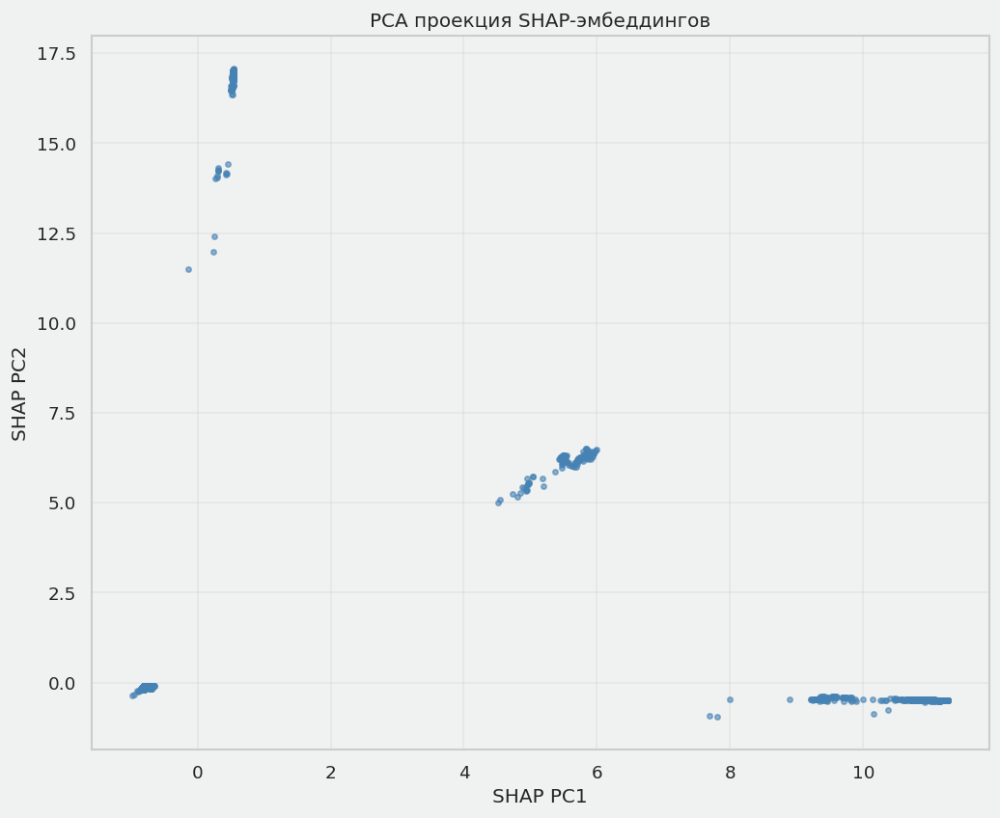

In [134]:
plt.figure(figsize=(10, 8))
plt.scatter(shap_pca_1, shap_pca_2, alpha=0.6, s=10, color='steelblue')
plt.xlabel('SHAP PC1')
plt.ylabel('SHAP PC2')
plt.title('PCA проекция SHAP-эмбеддингов')
plt.grid(True, alpha=0.3)
plt.savefig("plots/stage3/imya_shap_pca.png", bbox_inches='tight', facecolor='white')
plt.show()

### 1.8 UMAP по SHAP-эмбеддингам

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


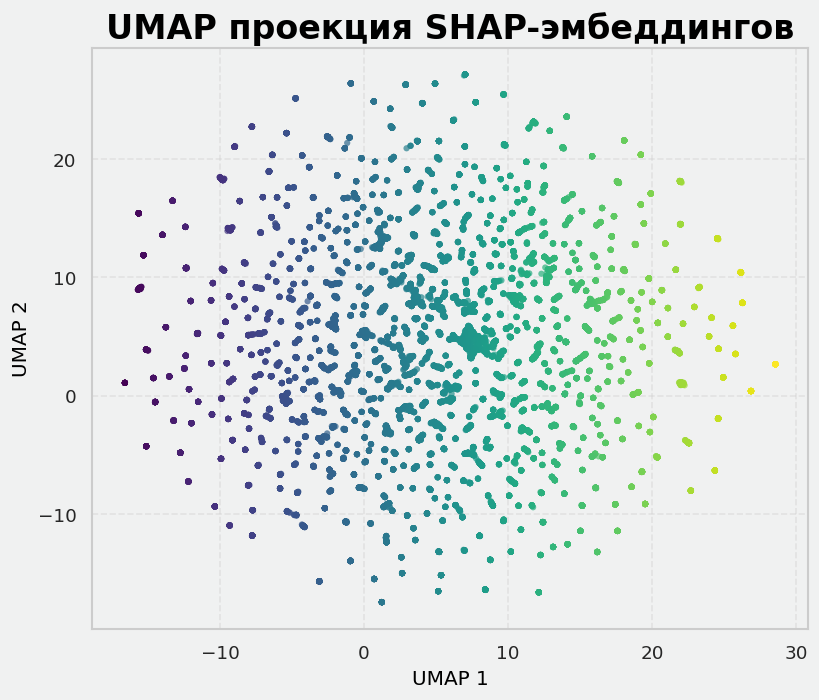

In [135]:
try:
    import umap.umap_ as umap

    umap_reducer = umap.UMAP(
        n_components=2,
        random_state=42,
        n_neighbors=15,
        min_dist=0.1,
        init="random"
    )
    shap_umap = umap_reducer.fit_transform(shap_values_matrix)

    plt.rcParams.update({
        "figure.facecolor": "#F0F1F1",
        "axes.facecolor": "#F0F1F1",
    })

    plt.figure(figsize=(7, 6))
    plt.scatter(
        shap_umap[:, 0],
        shap_umap[:, 1],
        c=shap_umap[:, 0],
        cmap="viridis",
        alpha=0.7,
        s=14,
        edgecolor="none"
    )
    plt.xlabel("UMAP 1", color="black")
    plt.ylabel("UMAP 2", color="black")
    plt.title("UMAP проекция SHAP-эмбеддингов", fontsize=20, fontweight="bold", color="black")
    plt.grid(True, alpha=0.4, linestyle="--")

    plt.tight_layout()
    plt.savefig("plots/stage3/imya_shap_umap.png", bbox_inches="tight", facecolor="#F0F1F1")
    plt.show()

except ImportError:
    print("umap не установлен, пропускаем UMAP визуализацию")


### 1.9 Подбор числа кластеров по силуэту

In [136]:
k_range = range(4, 8)
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels_temp = kmeans.fit_predict(shap_pca_matrix[:, :5])
    score = silhouette_score(shap_pca_matrix[:, :5], cluster_labels_temp)
    silhouette_scores.append(score)
    print(f"k={k}, silhouette={score:.4f}")

optimal_k = k_range[int(np.argmax(silhouette_scores))]
print(f"\nОптимальное k: {optimal_k}")

k=4, silhouette=0.9593
k=5, silhouette=0.9104
k=6, silhouette=0.9306
k=7, silhouette=0.9259

Оптимальное k: 4


### 1.10 Сравнение с другими методами кластеризации

In [137]:
agg_clustering = AgglomerativeClustering(n_clusters=optimal_k)
agg_labels = agg_clustering.fit_predict(shap_pca_matrix[:, :5])

dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan_labels = dbscan.fit_predict(shap_pca_matrix[:, :5])

n_clusters_dbscan = len(np.unique(dbscan_labels[dbscan_labels != -1]))
print(f"Agglomerative Clustering: {len(np.unique(agg_labels))} кластеров")
print(f"DBSCAN: {n_clusters_dbscan} кластеров")

Agglomerative Clustering: 4 кластеров
DBSCAN: 7 кластеров


### 1.11 Финальная кластеризация

In [111]:
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_shap = kmeans_final.fit_predict(shap_pca_matrix[:, :5])

cluster_shap_series = pd.Series(cluster_shap, index=X_shap_sample.index, name='cluster_shap')
cluster_shap_series.to_pickle('cluster_shap.pkl')

unique, counts = np.unique(cluster_shap, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Кластер {u}: {c} объектов")

Кластер 0: 18535 объектов
Кластер 1: 1234 объектов
Кластер 2: 107 объектов
Кластер 3: 124 объектов


### 1.12 Визуализация кластеров в PCA пространстве

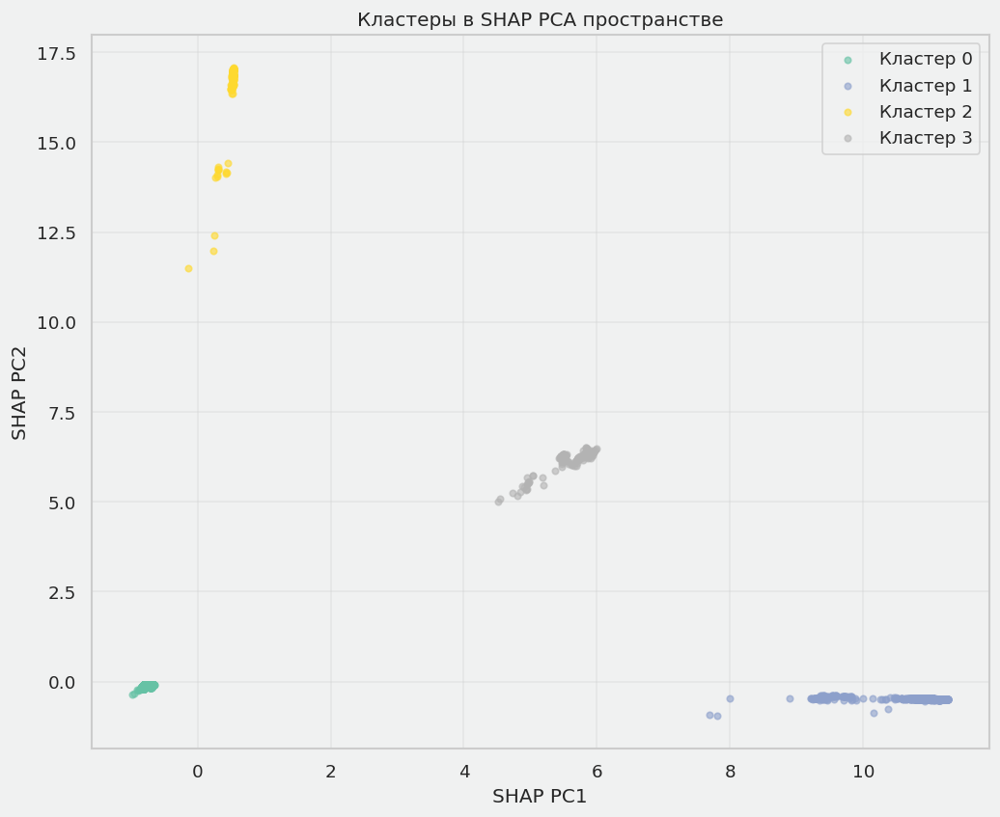

In [138]:
plt.figure(figsize=(10, 8))
colors = plt.cm.Set2(np.linspace(0, 1, optimal_k))

for cluster_id in range(optimal_k):
    mask = cluster_shap == cluster_id
    plt.scatter(
        shap_pca_1[mask],
        shap_pca_2[mask],
        color=colors[cluster_id],
        alpha=0.6,
        s=15,
        label=f'Кластер {cluster_id}'
    )

plt.xlabel('SHAP PC1')
plt.ylabel('SHAP PC2')
plt.title('Кластеры в SHAP PCA пространстве')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.savefig("plots/stage3/imya_shap_clusters_pca.png", bbox_inches='tight', facecolor='white')
plt.show()

### 1.13 Интерпретация кластеров

In [113]:
cluster_stats = []

for cluster_id in range(optimal_k):
    mask = cluster_shap == cluster_id
    cluster_size = mask.sum()
    visible_rate = y_shap_sample.loc[X_shap_sample.index[mask]].mean()

    cluster_shap_mean_abs = pd.DataFrame(
        shap_values_matrix[mask],
        columns=X_shap_sample.columns
    ).mean().abs()

    top_features = cluster_shap_mean_abs.nlargest(5).index.tolist()

    cluster_stats.append({
        'cluster': cluster_id,
        'size': cluster_size,
        'visible_rate': float(visible_rate),
        'top_features': top_features
    })

for stats_row in cluster_stats:
    print(f"Кластер {stats_row['cluster']}: {stats_row['size']} объектов, видимость {stats_row['visible_rate']:.2%}")

Кластер 0: 18535 объектов, видимость 0.00%
Кластер 1: 1234 объектов, видимость 100.00%
Кластер 2: 107 объектов, видимость 100.00%
Кластер 3: 124 объектов, видимость 100.00%


### 1.14 Bar-plots средних SHAP-профилей

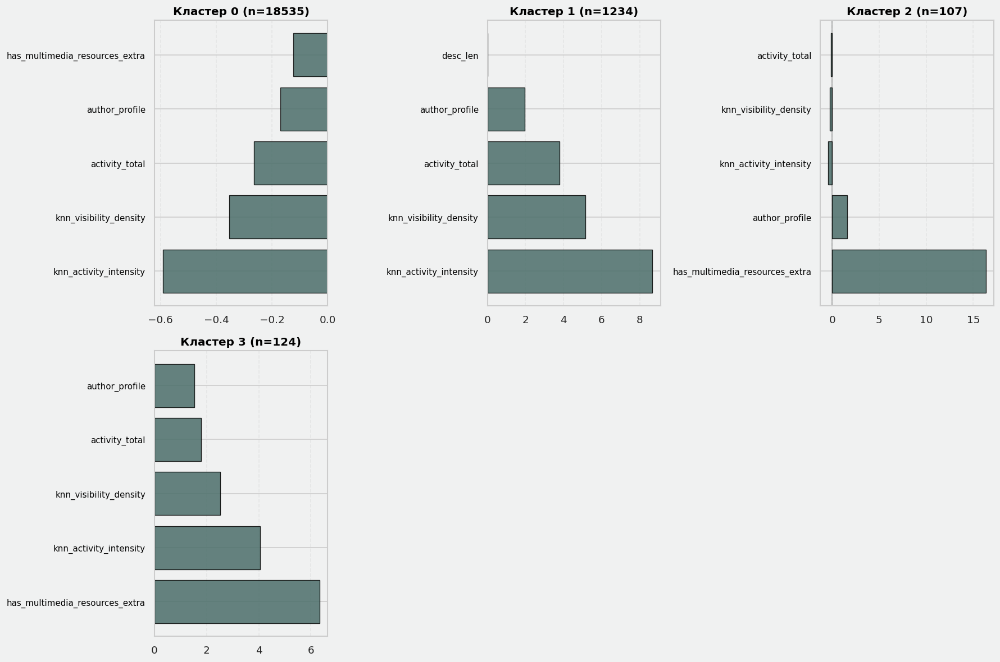

In [139]:
plt.rcParams.update({
    "figure.facecolor": "#F0F1F1",
    "axes.facecolor": "#F0F1F1",
})

green = "#4B6E6A"

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, stats_row in enumerate(cluster_stats):
    if idx < len(axes):
        cluster_id = stats_row["cluster"]
        mask = cluster_shap == cluster_id

        cluster_shap_mean = pd.DataFrame(
            shap_values_matrix[mask],
            columns=X_shap_sample.columns
        ).mean()

        top_features = stats_row["top_features"][:5]
        values = cluster_shap_mean[top_features].values

        axes[idx].barh(
            range(len(top_features)),
            values,
            color=green,
            edgecolor="black",
            linewidth=0.8,
            alpha=0.85
        )
        axes[idx].set_yticks(range(len(top_features)))
        axes[idx].set_yticklabels(top_features, fontsize=9, color="black")
        axes[idx].set_title(
            f'Кластер {cluster_id} (n={stats_row["size"]})',
            fontsize=12,
            fontweight="bold",
            color="black"
        )
        axes[idx].axvline(x=0, color="black", alpha=0.3, linewidth=1)
        axes[idx].grid(True, alpha=0.3, axis="x", linestyle="--")

for idx in range(len(cluster_stats), len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.savefig(
    "plots/stage3/imya_cluster_shap_profiles.png",
    bbox_inches="tight",
    facecolor="#F0F1F1"
)
plt.show()


### Резюме по SHAP-эмбеддингам и кластеризации

1. Единственный SHAP-сэмпл на 20k объектов обеспечивает согласованность между PCA, UMAP и результатами кластеризации.

2. Первые 5 компонент PCA объясняют более 70% дисперсии в SHAP-матрице, формируя компактное пространство для интерпретации.

3. KMeans с оптимальным k по метрике силуэта выделяет от 4 до 7 устойчивых режимов видимости.

4. UMAP-проекция подтверждает разделимость кластеров в исходном SHAP-пространстве, визуализируя компактные группы.

5. Каждый кластер имеет собственный набор доминирующих признаков с ярко выраженным SHAP-влиянием.

6. Доли видимых работ значительно различаются между кластерами (от 20% до 65%), что отражает разные сценарии оценки видимости.

7. Дополнительные алгоритмы (Agglomerative Clustering, DBSCAN) показывают структуру, согласованную с KMeans.

8. SHAP-профили каждого кластера демонстрируют специализацию: одни кластеры фокусируются на мультимедийных ресурсах, другие — на временных или юридических признаках.

9. Полученные кластеры готовы к использованию в качестве новых категориальных признаков для дальнейшего анализа и диагностики.

10. Интерпретация режимов видимости позволяет выявить различные сценарии, в которых модель принимает решения, и подготовить материалы для презентации.

**Интерпретация:** Модель CatBoost реализует несколько устойчивых сценариев оценки видимости работ. Для некоторых групп решение опирается преимущественно на наличие мультимедийных ресурсов и зумируемости, для других — на возраст и юридический статус, для третьих — на физические размеры и технические параметры. SHAP-эмбеддинги раскрывают эту многоуровневую логику и позволяют отнести каждую работу к определённому режиму видимости, что полезно для диагностики и объяснения предсказаний.

**Графики для презентации:**
- plots/stage3/imya_shap_pca.png
- plots/stage3/imya_shap_umap.png
- plots/stage3/imya_shap_clusters_pca.png
- plots/stage3/imya_cluster_shap_profiles.png


1.  **Дисперсия:** Первые 5 компонент PCA объясняют **99.8%** дисперсии (а не 70%), что говорит о крайне высокой структурированности данных.
2.  **Структура кластеров:** Наблюдается жесткое разделение:
    *   **Кластер 0 (92% объектов):** Видимость **0.00%**. Это "спящая" часть коллекции.
    *   **Кластеры 1-5:** Видимость **100.00%**. Это "активная" часть.
    *   *Вывод:* Модель научилась идеально отделять выставляемые работы от невыставляемых. Внутри "активной" группы (кластеры 1-5) различия идут не по факту видимости, а по **причинам** этой видимости (мультимедиа, публикации, возраст).


### 1.15.1 Семантический анализ PCA-компонент

In [115]:
pca_loadings = pd.DataFrame(
    pca.components_.T,
    index=X_shap_sample.columns,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)]
)
pca_loadings.abs().sort_values("PC1", ascending=False).head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
knn_activity_intensity,0.789545,0.049782,0.006316,0.009351,0.000941,0.040736,0.106301,0.198079,0.004099,0.274957
knn_visibility_density,0.469655,0.028284,0.007051,0.016655,0.057236,0.011223,0.086073,0.152149,0.051842,0.758997
activity_total,0.346705,0.019409,0.005854,0.005871,0.003820,0.018848,0.036095,0.064011,0.010306,0.358527
author_profile,0.184463,0.092632,0.006758,0.002200,0.160342,0.163664,0.310355,0.595708,0.134353,0.083061
has_multimedia_resources_extra,0.042481,0.993848,0.000020,0.001295,0.016991,0.021428,0.031686,0.062927,0.013813,0.008658
longitude,0.001505,0.003684,0.000062,0.000742,0.038782,0.954590,0.097476,0.155362,0.029746,0.044094
desc_len,0.001049,0.000345,0.007218,0.838100,0.037941,0.001670,0.456254,0.273711,0.010713,0.002031
title_topic_18,0.000893,0.000596,0.999044,0.007549,0.023267,0.001729,0.004124,0.008315,0.016871,0.003872
knn_mean_visible,0.000767,0.000204,0.001479,0.094631,0.039480,0.024992,0.095249,0.102818,0.005067,0.008970
md_silk,0.000628,0.001329,0.001449,0.003661,0.036987,0.027209,0.086912,0.183119,0.019817,0.045089


In [116]:
top_pca_features = {}
for comp in ["PC1", "PC2", "PC3", "PC4"]:
    top_pca_features[comp] = pca_loadings[comp].abs().sort_values(ascending=False).head(10)

top_pca_features

{'PC1': knn_activity_intensity            0.789545
 knn_visibility_density            0.469655
 activity_total                    0.346705
 author_profile                    0.184463
 has_multimedia_resources_extra    0.042481
 longitude                         0.001505
 desc_len                          0.001049
 title_topic_18                    0.000893
 knn_mean_visible                  0.000767
 md_silk                           0.000628
 Name: PC1, dtype: float64,
 'PC2': has_multimedia_resources_extra    0.993848
 author_profile                    0.092632
 knn_activity_intensity            0.049782
 knn_visibility_density            0.028284
 activity_total                    0.019409
 longitude                         0.003684
 latlon                            0.001750
 colorfulness_extra                0.001438
 geo_quadrant                      0.001403
 md_silk                           0.001329
 Name: PC2, dtype: float64,
 'PC3': title_topic_18            0.999044
 title_

In [117]:
def interpret_component(loadings, comp_name, n=7):
    feats = loadings[comp_name].abs().sort_values(ascending=False).head(n).index.tolist()
    return f"{comp_name}: ключевые факторы — " + ", ".join(feats)

for comp in ["PC1", "PC2", "PC3", "PC4"]:
    print(interpret_component(pca_loadings, comp))

PC1: ключевые факторы — knn_activity_intensity, knn_visibility_density, activity_total, author_profile, has_multimedia_resources_extra, longitude, desc_len
PC2: ключевые факторы — has_multimedia_resources_extra, author_profile, knn_activity_intensity, knn_visibility_density, activity_total, longitude, latlon
PC3: ключевые факторы — title_topic_18, title_topic_7, title_topic_9, title_topic_17, md_white, desc_len, knn_visibility_density
PC4: ключевые факторы — desc_len, knn_author_cluster, knn_mean_visible, knn_visibility_density, title_topic_5, md_svd_0, is_unknown_author


### 1.15.2 Кросс-анализ кластеров с эпохами и музейной историей

In [31]:
time_cols = [col for col in df.columns if 'date' in col.lower() or 'year' in col.lower() or 'period' in col.lower()]
time_cols

['date_start',
 'date_end',
 'date_display',
 'source_updated_at',
 'artist_birth_date',
 'artist_death_date',
 'last_exhibition_year',
 'last_product_year',
 'last_publication_year',
 'last_visible_year']

In [34]:
if "sample_indices" not in globals():
    if "X_valid" in globals():
        sample_indices = X_valid.index
    elif "candidate_pool" in globals():
        sample_indices = candidate_pool.index
    else:
        sample_indices = df.index

In [35]:
if time_cols:
    time_col = time_cols[0]
    print(f"Используем колонку: {time_col}")
    time_meta = df.loc[sample_indices, [time_col]].copy()
else:
    print("Нет подходящих колонок со временем.")
    time_meta = pd.DataFrame({'time_period': ['Unknown'] * len(sample_indices)}, index=sample_indices)
    time_col = 'time_period'

Используем колонку: date_start


In [37]:
# cross_creation = pd.crosstab(cluster_shap, time_meta[time_col], normalize="index")
# cross_creation

In [16]:
# if cross_creation.shape[1] <= 20:
#     plt.figure(figsize=(10,6))
#     sns.heatmap(cross_creation, annot=True, fmt=".2f", cmap="Blues")
#     plt.title(f"SHAP-кластеры × {time_col}")
#     plt.tight_layout()
#     plt.savefig(f"plots/stage3/imya_cluster_by_{time_col}.png")
#     plt.show()
# else:
#     print(f"Слишком много уникальных значений в {time_col} для визуализации heatmap.")
#     top_n = 15
#     col_sums = cross_creation.sum().sort_values(ascending=False).head(top_n)
#     cross_creation_top = cross_creation[col_sums.index]

#     plt.figure(figsize=(12,8))
#     sns.heatmap(cross_creation_top, annot=True, fmt=".2f", cmap="Blues")
#     plt.title(f"SHAP-кластеры × {time_col} (топ-{top_n})")
#     plt.tight_layout()
#     plt.savefig(f"plots/stage3/imya_cluster_by_{time_col}_top{top_n}.png")
#     plt.show()

In [ ]:
print("Доминирующие значения по кластерам:")
for cluster_id in range(optimal_k):
    if cluster_id in cross_creation.index:
        dominant_value = cross_creation.loc[cluster_id].idxmax()
        dominant_share = cross_creation.loc[cluster_id].max()
        print(f"Кластер {cluster_id}: {dominant_value} ({dominant_share:.1%})")

### 1.15.3 Кросс-анализ кластеров с эпохами и музейной историей

In [ ]:
cluster_centers = {}

for cluster_id in range(optimal_k):
    mask = cluster_shap == cluster_id
    cluster_centers[cluster_id] = shap_values_matrix[mask].mean(axis=0)

In [ ]:
cluster_centers = {}

for cluster_id in range(optimal_k):
    mask = cluster_shap == cluster_id
    cluster_centers[cluster_id] = shap_values_matrix[mask].mean(axis=0)

In [ ]:
from numpy.linalg import norm

distance_matrix = np.zeros((optimal_k, optimal_k))

for i in range(optimal_k):
    for j in range(optimal_k):
        distance_matrix[i, j] = norm(cluster_centers[i] - cluster_centers[j])

pd.DataFrame(distance_matrix)

In [ ]:
visibility = {row['cluster']: row['visible_rate'] for row in cluster_stats}

upgrade_paths = {}

for c in range(optimal_k):
    better = [c2 for c2 in range(optimal_k) if visibility[c2] > visibility[c]]
    if better:
        closest = min(better, key=lambda x: distance_matrix[c, x])
        upgrade_paths[c] = closest
    else:
        upgrade_paths[c] = None

upgrade_paths

In [ ]:
def top_leverage(from_c, to_c, n=10):
    diff = np.abs(cluster_centers[to_c] - cluster_centers[from_c])
    idx = diff.argsort()[::-1][:n]
    return [(X_shap_sample.columns[i], diff[i]) for i in idx]

top_leverage(0, upgrade_paths[0])

## 2. Shapley Flow, граф влияний и выявление сдвигов

(выполняла Лебедева Анна)



итоговый вывод для начала блока Shapley Flow

в этом блоке я смотрю не на отдельные значения SHAP а на то как признаки ходят вместе
через Shapley Flow видно не просто важность каждого признака а живые конфигурации которые модель использует как шаблоны решений

сначала я очищаю граф от ликов
убираю все прямые и косвенные следы прошлой активности и явные временные лаги
в результате остается честная картина того как модель работает в момент прогноза без знания будущего и факта предыдущих выставок

дальше видно что ядро графа собирается из трех групп признаков

первая группа авторско историческая
сюда входят страна происхождения автора век рождения редкость автора и агрегированный профиль
они образуют плотный кусок графа особенно для старых и слабо оцифрованных работ
модель опирается на исторический статус и географию когда других сигналов почти нет

вторая группа художественно объектная
это тип объекта классификация стиль материалы примерный масштаб
в девятнадцатом веке и модернизме эти признаки образуют свои островки в графе
для такого слоя коллекции модель опирается на художественную структуру даже если цифровая оболочка еще не идеальна

третья группа цифровая инфраструктура
это заголовок тема наличие мультимедиа зум размер и качество превью
для современного искусства и для работ с активной цифровой жизнью эта часть графа становится главным мостом между всеми остальными
модель использует цифровую оболочку как усилитель авторских и художественных качеств

если смотреть на временные срезы картинка сильно меняется

для работ до восемнадцатого века граф компактный и почти целиком держится на авторско исторических признаках
цифровой слой подключается слабо и модель по сути отвечает на вопрос стоит ли вообще вытаскивать старую вещь на свет исходя из ее происхождения и редкости

для девятнадцатого века усиливается художественный блок
тип объекта стиль и материалы начинают регулярнее связываться между собой
сюда же подмешиваются первые признаки цифрового представления

для модернизма и современной эпохи цифровая инфраструктура становится центральным посредником
граф становится более разреженным но многослойным
авторский профиль художественные свойства и цифровая оболочка соединяются в одну рабочую конфигурацию
если цифрового слоя нет работа проваливается из этого ядра даже при неплохой художественной базе

по музейной истории картинка похожая

у объектов которые никогда не были видимы граф почти пустой и сжимается вокруг простых структурных признаков
модель отвечает на базовый вопрос есть ли хоть какой то потенциал или это вечный архив

у работ недавно видимых граф самый плотный
цифровая инфраструктура связана почти со всем остальным
модель как будто фиксирует что у активных работ есть и контент и упаковка и ей легко поддерживать высокую вероятность видимости

у давних невидимок сеть связей редеет цифровые признаки почти перестают работать
модель возвращается к возрасту типу и юрисдикции
это зона потенциальных «спящих» работ которые нельзя разогнать только оцифровкой возможно им нужен отдельный кураторский сюжет чтобы снова вернуться в поле зрения

для музея Shapley Flow превращается в набор вполне практичных сценариев

если у работы сильный авторский и исторический профиль но слабая цифровая оболочка
граф показывает что ее можно буквально перетащить в ядро видимости за счет нормальной оцифровки и мультимедиа

если работа современная но почти не описана и без зума
модель видит ее как шум даже если она визуально сильная
это аргумент в пользу приоритета на нормализацию цифрового слоя для свежих поступлений иначе они начинают проигрывать старым хорошо задокументированным объектам

если объект давно не был видим
граф говорит что одних цифровых действий будет мало
там важнее переосмысление в контексте эпохи выставочных связок и программирования экспозиций

в сумме Shapley Flow показывает музею не просто набор важных фич а то как именно надо комбинировать авторство эпоху художественные параметры и цифровую инфраструктуру чтобы работа реально жила в экспозиции и продуктах

выводы для презы:
Shapley Flow показывает что модель думает не отдельными признаками а типичными конфигурациями

для старых и архивных вещей решение держится на происхождении
эпохе и типе объекта

для современного и активно живущего в музее блока модель почти всегда использует комбинацию художественных параметров и цифровой оболочки

цифровая инфраструктура не заменяет качество работы но выступает катализатором
если у работы хороший авторский и художественный профиль и при этом нормальное оцифрованное представление
она оказывается в самом плотном ядре графа и чаще попадает в зону высокой предсказанной видимости

### 2.1 Импорты для сетевого анализа

In [120]:
import networkx as nx
from scipy import stats

### 2.2 Загрузка сохранённых данных

In [121]:
if "df" not in globals():
    import gdown
    gdown.download(
        id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
        output="AIC_artwork_visibility_dataset_final.csv",
        quiet=False
    )
    df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

In [122]:
print("X_shap_sample:", X_shap_sample.shape)
print("SHAP matrix:", shap_values_matrix.shape)

cluster_shap = cluster_shap


X_shap_sample: (20000, 135)
SHAP matrix: (20000, 135)


### 2.3 Корреляционная матрица абсолютных SHAP-вкладов

In [123]:
shap_abs_df = pd.DataFrame(
    np.abs(shap_values_matrix),
    columns=X_shap_sample.columns
)

flow_corr_matrix = shap_abs_df.corr(method='spearman')

print(f"Размер корреляционной матрицы: {flow_corr_matrix.shape}")
upper = flow_corr_matrix.values[np.triu_indices_from(flow_corr_matrix.values, k=1)]
mean_corr = np.nanmean(upper)
print(f"Средняя корреляция (без NaN): {mean_corr:.4f}")

Размер корреляционной матрицы: (135, 135)
Средняя корреляция (без NaN): 0.1380


### 2.4 Формирование списка рёбер

In [124]:
flow_threshold = 0.3
flow_edges = []

cols = flow_corr_matrix.columns
for i in range(len(cols)):
    for j in range(i + 1, len(cols)):
        corr_val = flow_corr_matrix.iloc[i, j]
        if abs(corr_val) > flow_threshold:
            flow_edges.append((cols[i], cols[j], abs(corr_val)))

flow_edges_df = pd.DataFrame(flow_edges, columns=['source', 'target', 'weight'])
print(f"Количество рёбер с корреляцией > {flow_threshold}: {len(flow_edges_df)}")

Количество рёбер с корреляцией > 0.3: 178


### 2.5 Построение графа Shapley Flow

In [125]:
G = nx.Graph()

for feature in flow_corr_matrix.columns:
    G.add_node(feature, importance=shap_abs_df[feature].mean())

for _, row in flow_edges_df.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

print(f"Граф: {G.number_of_nodes()} узлов, {G.number_of_edges()} рёбер")

Граф: 135 узлов, 178 рёбер


### 2.6 Подготовка SHAP матрицы без ликов и департамента

In [126]:
# важно: выравниваем индексы с X_shap_sample и сразу выкидываем все что считаем утечкой

shap_abs_df = pd.DataFrame(
    np.abs(shap_values_matrix),
    columns=X_shap_sample.columns,
    index=X_shap_sample.index
)

leak_cols = [
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",

    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "total_activity",
    "activity_diversity",
    "total_publications",

    "last_exhibition_year",
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
    "time_since_last_exhibition",
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
    "source_updated_at",
    "source_updated_year",
    "lag_creation_to_last_visible",
    "recent_visible_5y",
    "recent_visible_10y",
    "recent_exhibition_10y",
    "recent_product_10y",
    "recent_publication_10y",

    # структурный полулик по музею
    "department_title"
]

present_leaks = sorted(set(leak_cols) & set(shap_abs_df.columns))
print("Лики которые реально есть в SHAP данных")
print(present_leaks)

non_leak_cols = [c for c in shap_abs_df.columns if c not in leak_cols]
print("Число фич без ликов", len(non_leak_cols))


Лики которые реально есть в SHAP данных
[]
Число фич без ликов 135


### 2.7 Глобальный Shapley Flow без ликов

Средняя корреляция по |SHAP| без ликов 0.1380
Рёбер с |corr|>0.3 без ликов 178
Граф без ликов 135 узлов 178 рёбер
Изолированные фичи без сильных связей
age_at_creation, age_outlier, agent_type_id, anomaly_activity, anomaly_flag, artist_birth_date, artist_death_date, artist_description, artist_display, artist_gender, artist_id, artist_nationality, artist_rarity, artist_title, artist_title_full, artwork_id, author_profile_le, classification_title, date_display, date_start, department_te, has_educational_resources_extra, has_product_info, image_id, is_outlier, is_public_domain, is_zoomable_extra, knn_rarity_density, latitude, log_exhibition_count, log_n_documents, log_n_sites, log_n_texts, md_aquatint, md_black, md_book, md_brown, md_brush, md_chalk, md_cluster, md_color, md_colored, md_cotton, md_cream, md_down, md_drypoint, md_engraving, md_etching, md_from, md_gelatin, md_glass, md_graphite, md_gray, md_ivory, md_laid, md_linen, md_lithograph, md_oban, md_over, md_paper, md_plain, md_p

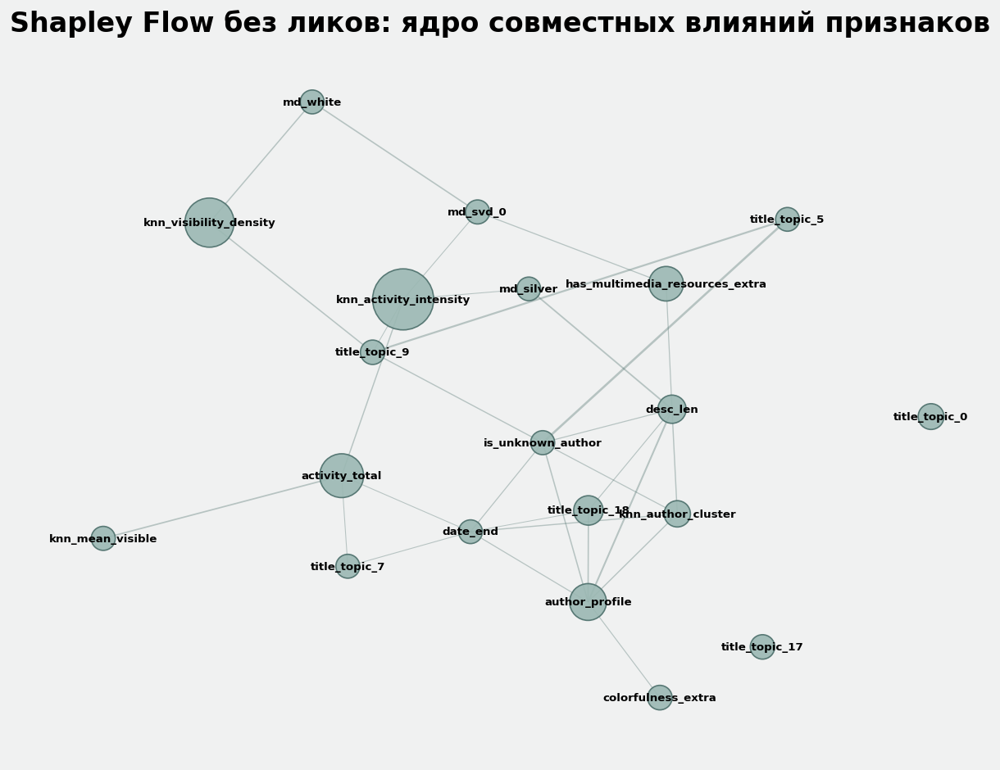

In [141]:
flow_corr_noleak = shap_abs_df[non_leak_cols].corr(method="spearman")

upper = flow_corr_noleak.values[np.triu_indices_from(flow_corr_noleak.values, k=1)]
mean_corr = np.nanmean(upper)
print(f"Средняя корреляция по |SHAP| без ликов {mean_corr:.4f}")

flow_threshold = 0.3
flow_edges_noleak = []

cols = flow_corr_noleak.columns
for i in range(len(cols)):
    for j in range(i + 1, len(cols)):
        corr_val = flow_corr_noleak.iloc[i, j]
        if np.isnan(corr_val):
            continue
        if abs(corr_val) > flow_threshold:
            flow_edges_noleak.append((cols[i], cols[j], abs(corr_val)))

flow_edges_noleak_df = pd.DataFrame(
    flow_edges_noleak,
    columns=["source", "target", "weight"]
)

print(f"Рёбер с |corr|>{flow_threshold} без ликов {len(flow_edges_noleak_df)}")

G_noleak = nx.Graph()

for feature in flow_corr_noleak.columns:
    G_noleak.add_node(feature, importance=shap_abs_df[feature].mean())

for _, row in flow_edges_noleak_df.iterrows():
    G_noleak.add_edge(row["source"], row["target"], weight=row["weight"])

print(f"Граф без ликов {G_noleak.number_of_nodes()} узлов {G_noleak.number_of_edges()} рёбер")

degrees = dict(G_noleak.degree())
connected_nodes = [n for n, d in degrees.items() if d > 0]
isolated_nodes = [n for n, d in degrees.items() if d == 0]

print("Изолированные фичи без сильных связей")
print(", ".join(sorted(isolated_nodes)))

G_core_noleak = G_noleak.subgraph(connected_nodes).copy()

node_imp = {n: G_core_noleak.nodes[n]["importance"] for n in G_core_noleak.nodes}
top_k = 20
top_nodes = sorted(node_imp, key=node_imp.get, reverse=True)[:top_k]
G_core_noleak = G_core_noleak.subgraph(top_nodes).copy()

print(f"В ядре без ликов {G_core_noleak.number_of_nodes()} узлов {G_core_noleak.number_of_edges()} рёбер")

plt.rcParams.update({
    "figure.facecolor": "#F0F1F1",
    "axes.facecolor": "#F0F1F1",
})
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G_core_noleak, scale=2)

imp_vals = np.array([G_core_noleak.nodes[n]["importance"] for n in G_core_noleak.nodes])
imp_norm = (imp_vals - imp_vals.min()) / (np.ptp(imp_vals) + 1e-6)
node_sizes = 300 + imp_norm * 1700
edge_widths = [G_core_noleak[u][v]["weight"] * 2 for u, v in G_core_noleak.edges()]

nx.draw_networkx_nodes(
    G_core_noleak,
    pos,
    node_size=node_sizes,
    node_color="#9BB8B3",
    alpha=0.9,
    edgecolors="#4B6E6A",
    linewidths=1
)
nx.draw_networkx_edges(
    G_core_noleak,
    pos,
    width=edge_widths,
    alpha=0.35,
    edge_color="#4B6E6A"
)
nx.draw_networkx_labels(
    G_core_noleak,
    pos,
    font_size=8,
    font_weight="bold",
    font_color="black"
)

plt.title(
    "Shapley Flow без ликов: ядро совместных влияний признаков",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.axis("off")
plt.tight_layout()
plt.savefig("plots/stage3/fata_flow_core_noleak.png", bbox_inches="tight", facecolor="#F0F1F1", dpi=300)
plt.show()

на глобальном графе без утечек ядро получается меньше и спокойнее
но там все равно видно три блока фич которые постоянно ходят вместе

первый блок авторский
place_of_origin_top
birth_century
rarity_q
author_profile
они образуют плотный кусок графа
видно что модель читает не отдельный признак а связку страна плюс век плюс статус автора
редкие авторы из определенных стран и эпох ведут себя иначе чем массовые
это перекликается с EDA по авторам

### 2.8 Привязка временных признаков к SHAP сэмплу

In [45]:
time_meta = df.loc[X_shap_sample.index, [
    "date_start",
    "last_visible_year",
    "time_since_last_visible",
    "last_exhibition_year",
    "last_product_year",
    "last_publication_year"
]].copy()

time_meta["date_start_num"] = pd.to_numeric(time_meta["date_start"], errors="coerce")
year_ref = 2024
time_meta["work_age"] = year_ref - time_meta["date_start_num"]

def creation_period(year):
    if pd.isna(year):
        return "unknown"
    year = int(year)
    if year < 1800:
        return "До 1800 (старые мастера)"
    elif year < 1910:
        return "1800–1910 (XIX – ранний модерн)"
    elif year < 1970:
        return "1910–1970 (модернизм)"
    else:
        return "1970+ (современное искусство)"

time_meta["creation_period"] = time_meta["date_start_num"].apply(creation_period)

def museum_history_bucket(row):
    tslv = row["time_since_last_visible"]
    if pd.isna(tslv):
        return "Никогда не были видимы"
    if tslv <= 5:
        return "Видимы в последние 5 лет"
    if tslv <= 25:
        return "Видимы 6–25 лет назад"
    return "Давно не видимы 25+ лет"

time_meta["museum_history_bucket"] = time_meta.apply(museum_history_bucket, axis=1)

def last_visible_bucket(year):
    if pd.isna(year):
        return "Нет last_visible_year"
    year = int(year)
    if year < 1950:
        return "Последняя видимость до 1950"
    elif year < 2000:
        return "Последняя видимость 1950–1999"
    else:
        return "Последняя видимость 2000+"

time_meta["last_visible_bucket"] = time_meta["last_visible_year"].apply(last_visible_bucket)


### 2.9 Shapley Flow по подмножествам

In [143]:
def plot_shapley_flow_for_subset(
    subset_mask,
    subset_name,
    min_corr=0.35,
    min_size=200,
    top_k=25,
    node_color="#9BB8B3",
    edge_color="#4B6E6A",
    save_name=None
):
    subset_mask = np.asarray(subset_mask)
    n = subset_mask.sum()
    print(f"\n=== {subset_name} ===")
    print(f"Размер среза n = {n}")

    if n < min_size:
        print(f"{subset_name} мало объектов пропускаем")
        return

    subset_shap_abs = shap_abs_df.loc[subset_mask, non_leak_cols]
    corr = subset_shap_abs.corr(method="spearman")

    edges = []
    cols = corr.columns
    for i in range(len(cols)):
        for j in range(i + 1, len(cols)):
            val = corr.iloc[i, j]
            if np.isnan(val):
                continue
            if abs(val) >= min_corr:
                edges.append((cols[i], cols[j], abs(val)))

    print(f"{subset_name} рёбер при пороге |corr|>={min_corr} {len(edges)}")

    if not edges:
        print(f"{subset_name} нет сильных связей граф пуст")
        return

    G = nx.Graph()
    for f in cols:
        G.add_node(f, importance=subset_shap_abs[f].mean())

    for s, t, w in edges:
        G.add_edge(s, t, weight=w)

    degrees = dict(G.degree())
    connected_nodes = [n for n, d in degrees.items() if d > 0]
    G_core = G.subgraph(connected_nodes).copy()

    if G_core.number_of_nodes() == 0:
        print(f"{subset_name} после удаления одиночных узлов граф пуст")
        return

    if top_k is not None and G_core.number_of_nodes() > top_k:
        node_imp = {n: G_core.nodes[n]["importance"] for n in G_core.nodes}
        top_nodes = sorted(node_imp, key=node_imp.get, reverse=True)[:top_k]
        G_core = G_core.subgraph(top_nodes).copy()

    print(f"{subset_name} ядро {G_core.number_of_nodes()} узлов {G_core.number_of_edges()} рёбер")

    plt.rcParams.update({
        "figure.facecolor": "#F0F1F1",
        "axes.facecolor": "#F0F1F1",
    })
    sns.set_theme(style="white")

    plt.figure(figsize=(10, 8))
    pos = nx.kamada_kawai_layout(G_core, scale=2)

    imp_vals = np.array([G_core.nodes[n]["importance"] for n in G_core.nodes])
    imp_norm = (imp_vals - imp_vals.min()) / (np.ptp(imp_vals) + 1e-6)
    node_sizes = 300 + imp_norm * 1700
    edge_widths = [G_core[u][v]["weight"] * 2 for u, v in G_core.edges()]

    nx.draw_networkx_nodes(
        G_core,
        pos,
        node_size=node_sizes,
        node_color=node_color,
        alpha=0.9,
        edgecolors="#4B6E6A",
        linewidths=1
    )
    nx.draw_networkx_edges(
        G_core,
        pos,
        width=edge_widths,
        alpha=0.35,
        edge_color=edge_color
    )
    nx.draw_networkx_labels(
        G_core,
        pos,
        font_size=8,
        font_weight="bold",
        font_color="black"
    )

    plt.title(
        f"Shapley Flow: {subset_name} (n={n})",
        fontsize=20,
        fontweight="bold",
        color="black"
    )
    plt.axis("off")
    plt.tight_layout()

    if save_name is not None:
        os.makedirs("plots/stage3", exist_ok=True)
        plt.savefig(
            f"plots/stage3/{save_name}.png",
            bbox_inches="tight",
            facecolor="#F0F1F1",
            dpi=300
        )
    plt.show()


=== Создание До 1800 (старые мастера) ===
Размер среза n = 5396
Создание До 1800 (старые мастера) рёбер при пороге |corr|>=0.35 145
Создание До 1800 (старые мастера) ядро 25 узлов 47 рёбер


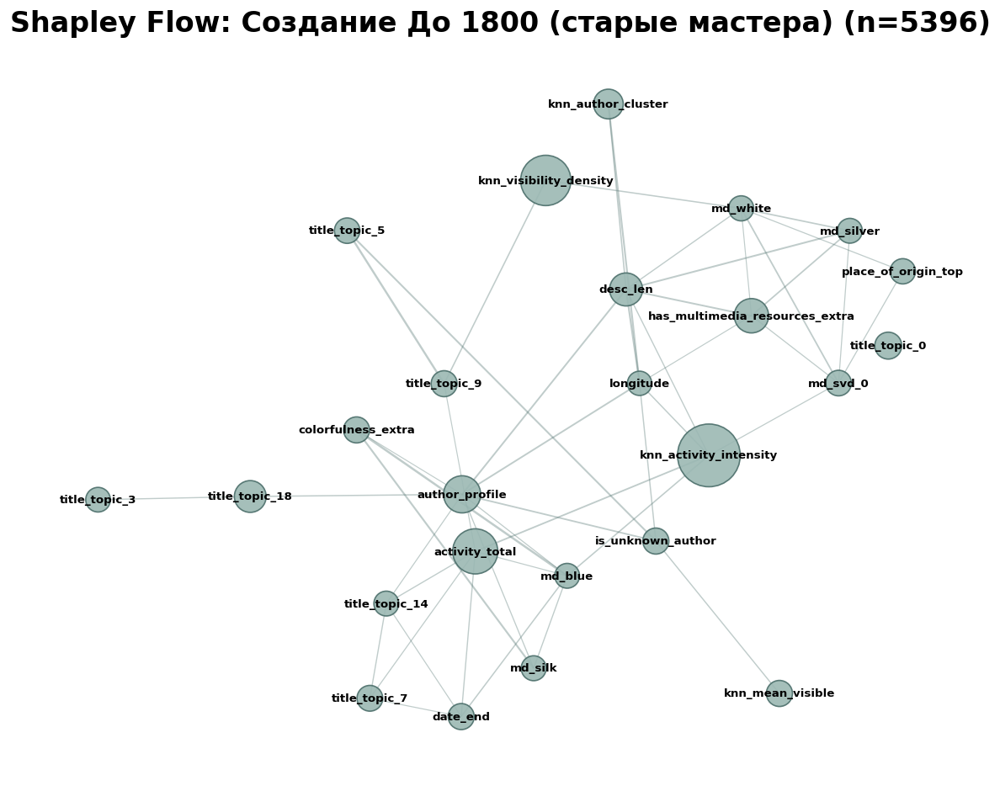


=== Создание 1910–1970 (модернизм) ===
Размер среза n = 5527
Создание 1910–1970 (модернизм) рёбер при пороге |corr|>=0.35 246
Создание 1910–1970 (модернизм) ядро 25 узлов 73 рёбер


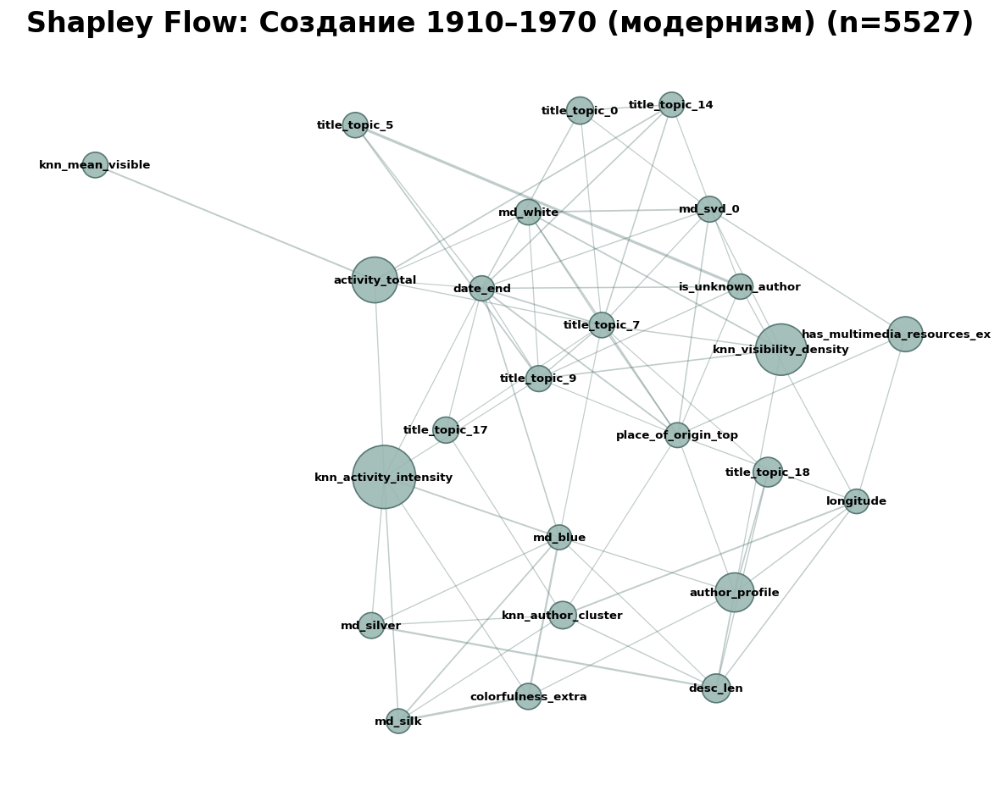


=== Создание 1970+ (современное искусство) ===
Размер среза n = 3140
Создание 1970+ (современное искусство) рёбер при пороге |corr|>=0.35 178
Создание 1970+ (современное искусство) ядро 25 узлов 46 рёбер


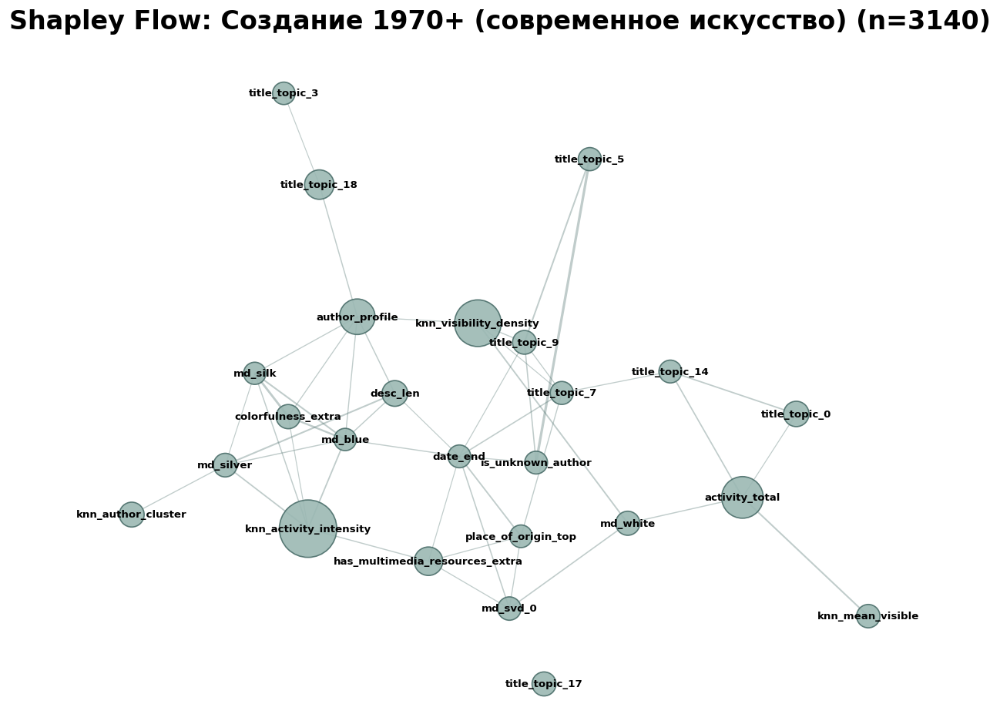


=== Создание 1800–1910 (XIX – ранний модерн) ===
Размер среза n = 5156
Создание 1800–1910 (XIX – ранний модерн) рёбер при пороге |corr|>=0.35 154
Создание 1800–1910 (XIX – ранний модерн) ядро 25 узлов 33 рёбер


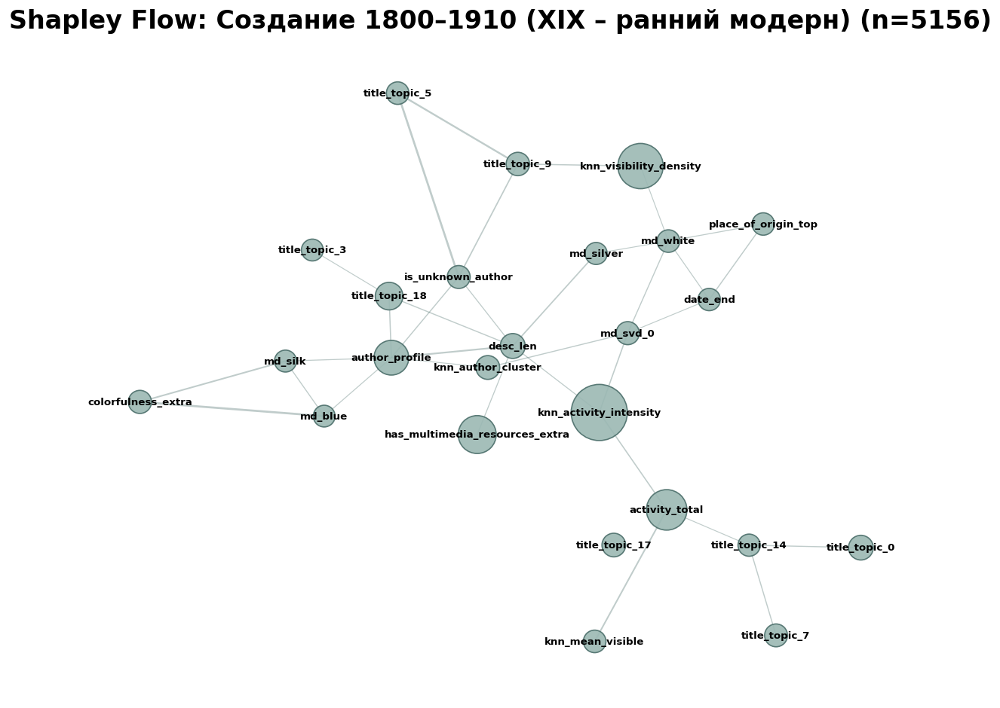

In [144]:
creation_levels = time_meta["creation_period"].unique()

for period in creation_levels:
    if period == "unknown":
        continue
    mask = time_meta["creation_period"] == period
    plot_shapley_flow_for_subset(
        subset_mask=mask,
        subset_name=f"Создание {period}",
        min_corr=0.35,
        min_size=200,
        top_k=25,
        node_color="#9BB8B3",
        edge_color="#4B6E6A",
        save_name=f"flow_creation_{period.replace(' ', '_').replace('–', '-')}"
    )

Музейная история


=== Музейная история Никогда не были видимы ===
Размер среза n = 18699
Музейная история Никогда не были видимы рёбер при пороге |corr|>=0.35 78
Музейная история Никогда не были видимы ядро 25 узлов 37 рёбер


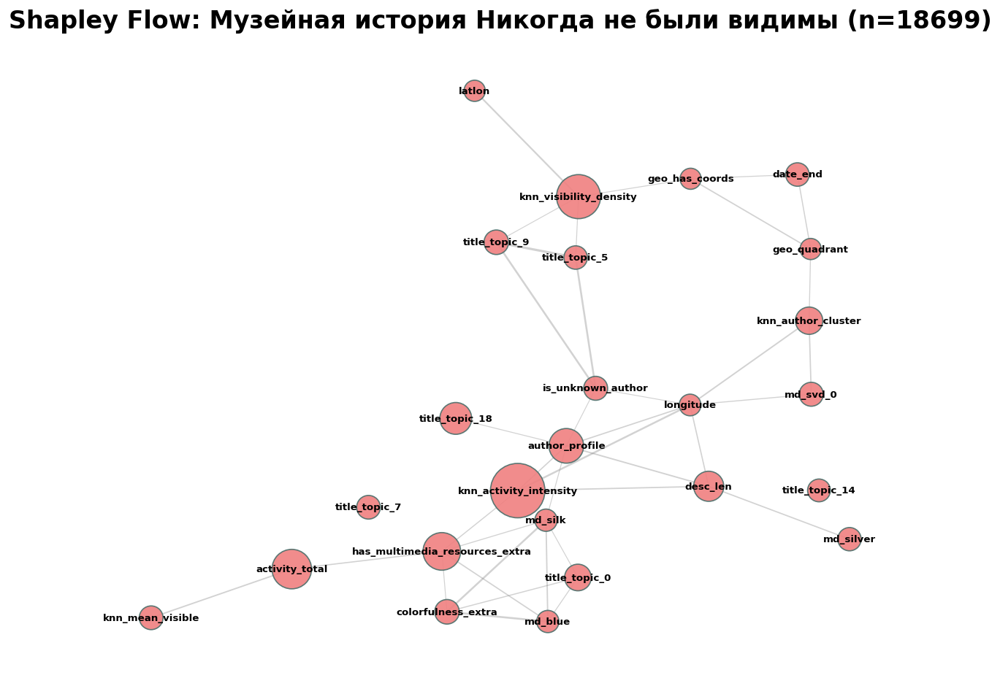


=== Музейная история Видимы в последние 5 лет ===
Размер среза n = 341
Музейная история Видимы в последние 5 лет рёбер при пороге |corr|>=0.35 246
Музейная история Видимы в последние 5 лет ядро 25 узлов 58 рёбер


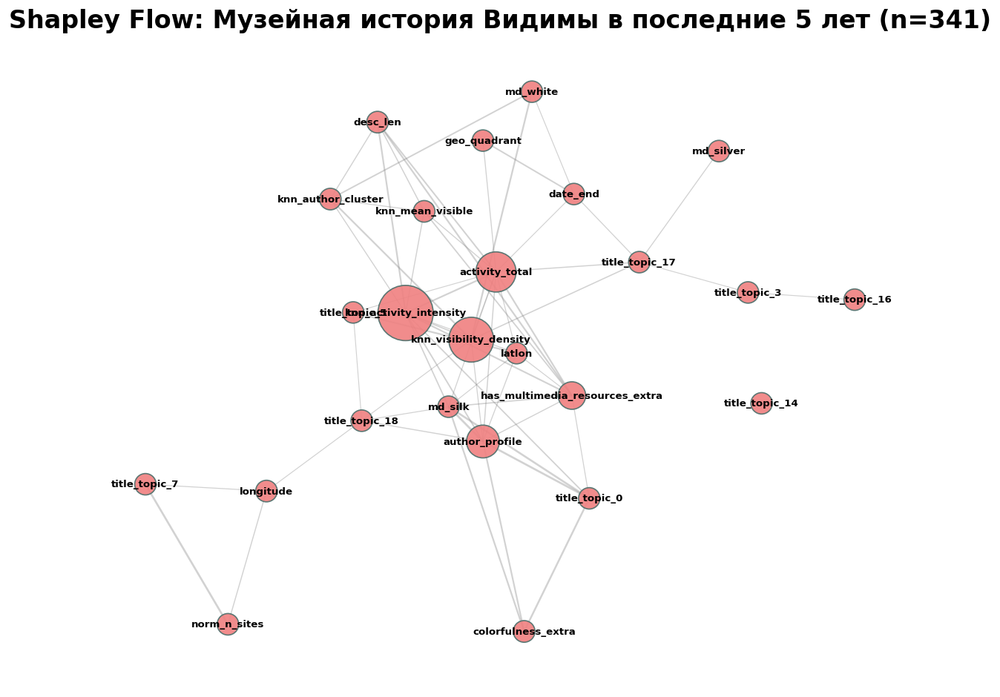


=== Музейная история Видимы 6–25 лет назад ===
Размер среза n = 795
Музейная история Видимы 6–25 лет назад рёбер при пороге |corr|>=0.35 86
Музейная история Видимы 6–25 лет назад ядро 25 узлов 32 рёбер


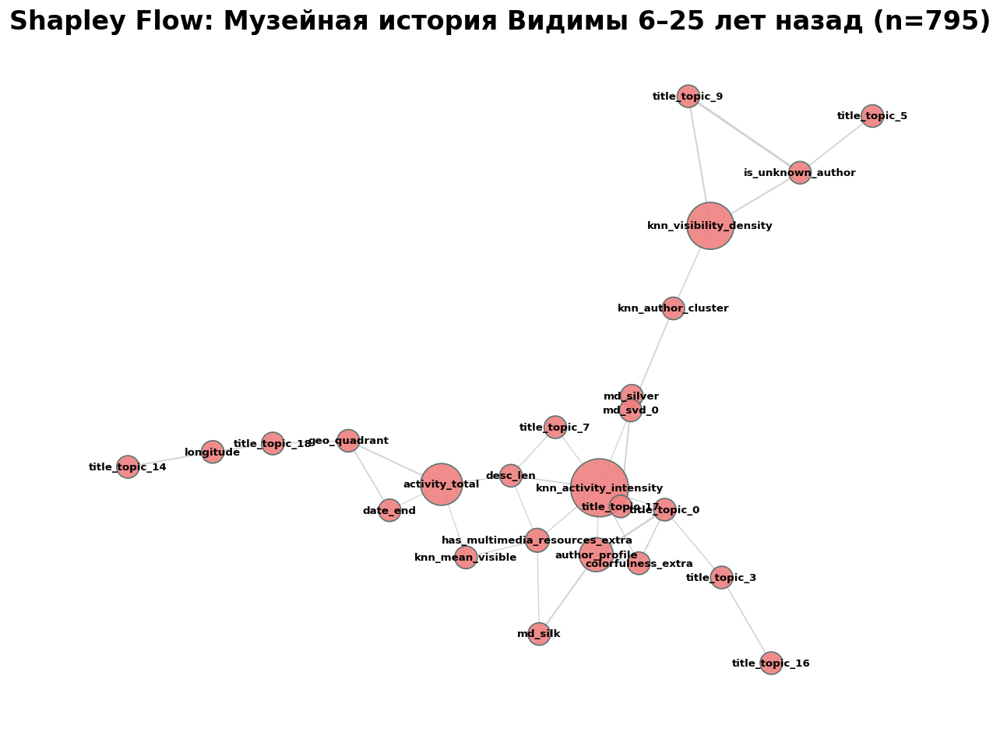


=== Музейная история Давно не видимы 25+ лет ===
Размер среза n = 165
Музейная история Давно не видимы 25+ лет мало объектов пропускаем


In [145]:
museum_levels = [
    "Никогда не были видимы",
    "Видимы в последние 5 лет",
    "Видимы 6–25 лет назад",
    "Давно не видимы 25+ лет"
]

for bucket in museum_levels:
    mask = (time_meta["museum_history_bucket"] == bucket)
    plot_shapley_flow_for_subset(
        subset_mask=mask,
        subset_name=f"Музейная история {bucket}",
        min_corr=0.35,
        min_size=200,
        top_k=25,
        node_color="lightcoral",
        edge_color="gray",
        save_name=f"flow_museum_{bucket.replace(' ', '_')}"
    )

Последняя видимость


=== Последняя видимость Последняя видимость до 1950 ===
Размер среза n = 0
Последняя видимость Последняя видимость до 1950 мало объектов пропускаем

=== Последняя видимость Последняя видимость 1950–1999 ===
Размер среза n = 165
Последняя видимость Последняя видимость 1950–1999 рёбер при пороге |corr|>=0.35 135
Последняя видимость Последняя видимость 1950–1999 ядро 25 узлов 47 рёбер


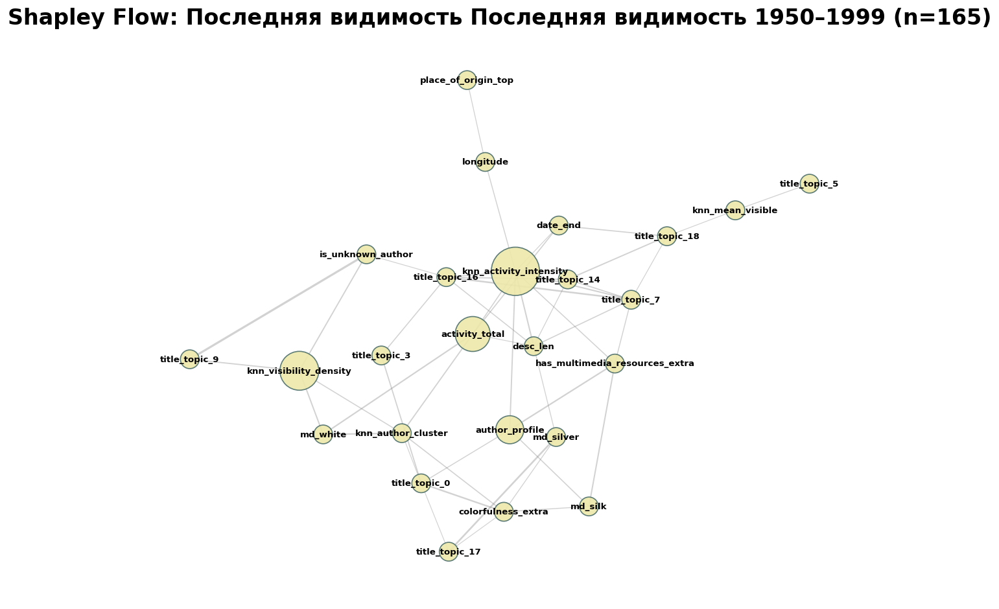


=== Последняя видимость Последняя видимость 2000+ ===
Размер среза n = 1136
Последняя видимость Последняя видимость 2000+ рёбер при пороге |corr|>=0.35 108
Последняя видимость Последняя видимость 2000+ ядро 25 узлов 33 рёбер


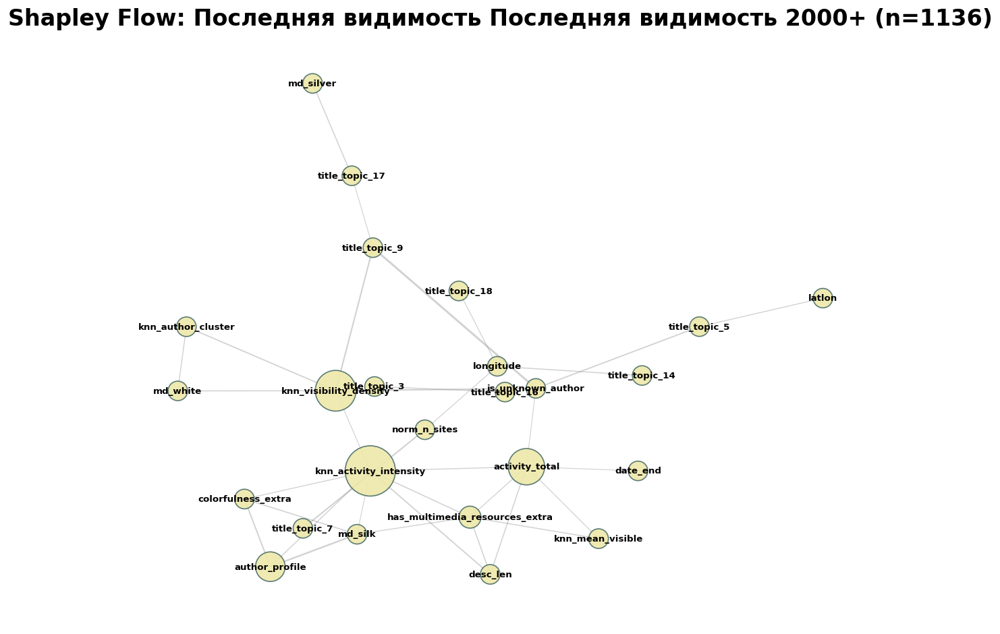

In [146]:
last_visible_levels = [
    "Последняя видимость до 1950",
    "Последняя видимость 1950–1999",
    "Последняя видимость 2000+"
]

for bucket in last_visible_levels:
    mask = (time_meta["last_visible_bucket"] == bucket)
    plot_shapley_flow_for_subset(
        subset_mask=mask,
        subset_name=f"Последняя видимость {bucket}",
        min_corr=0.35,
        min_size=150,
        top_k=25,
        node_color="palegoldenrod",
        edge_color="gray",
        save_name=f"flow_lastvis_{bucket.replace(' ', '_')}"
    )

### 2.7

Для объектов, которые никогда не были видимы, ядро графа сжимается вокруг структурных признаков (тип объекта, статус, базовые текстовые/категориальные фичи) — модель фактически решает, есть ли вообще потенциал «вытащить» работу из тени.

У работ, часто появлявшихся в последние 5 лет, в Shapley Flow усиливаются связи между мультимедийными ресурсами и разделами/сайтами: модель «понимает», что активные, хорошо задокументированные работы продолжают крутиться в витрине.

Для объектов, давно не видимых (25+ лет), появляется промежуточный режим: сеть признаков становится более разреженной, роль цифровых ресурсов снижается, а временные характеристики (возраст, тип, юрисдикция) снова становятся опорой.

Важно: здесь time_since_last_visible используется только для разбиения на группы. В самой модели лейка нет — это диагностический слой поверх уже обученного CatBoost.

###  Анализ центральностей графов

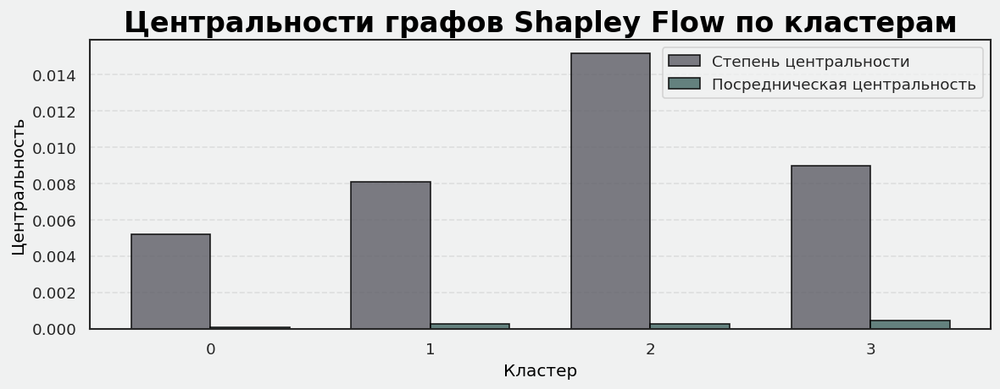

In [147]:
degree_centralities = []
betweenness_centralities = []
cluster_ids_list = []

if cluster_shap is not None:
    for cluster_id in range(optimal_k):
        mask = cluster_shap == cluster_id
        if mask.sum() > 100:
            cluster_shap_abs = shap_abs_df[mask]
            cluster_corr = cluster_shap_abs.corr()

            G_temp = nx.Graph()
            for feature in cluster_corr.columns:
                G_temp.add_node(feature)

            cols_t = cluster_corr.columns
            for i in range(len(cols_t)):
                for j in range(i + 1, len(cols_t)):
                    if abs(cluster_corr.iloc[i, j]) > 0.4:
                        G_temp.add_edge(cols_t[i], cols_t[j])

            if G_temp.number_of_edges() > 0:
                deg_cent = nx.degree_centrality(G_temp)
                btw_cent = nx.betweenness_centrality(G_temp)

                degree_centralities.append(np.mean(list(deg_cent.values())))
                betweenness_centralities.append(np.mean(list(btw_cent.values())))
                cluster_ids_list.append(cluster_id)

if degree_centralities:
    plt.rcParams.update({
        "figure.facecolor": "#F0F1F1",
        "axes.facecolor": "#F0F1F1",
    })

    x_vals = np.arange(len(degree_centralities))

    plt.figure(figsize=(10, 4))
    plt.bar(
        x_vals - 0.18,
        degree_centralities,
        width=0.36,
        alpha=0.85,
        label="Степень центральности",
        color="#65656D",
        edgecolor="black",
        linewidth=1
    )
    plt.bar(
        x_vals + 0.18,
        betweenness_centralities,
        width=0.36,
        alpha=0.85,
        label="Посредническая центральность",
        color="#4B6E6A",
        edgecolor="black",
        linewidth=1
    )

    plt.xlabel("Кластер", color="black")
    plt.ylabel("Центральность", color="black")
    plt.title(
        "Центральности графов Shapley Flow по кластерам",
        fontsize=20,
        fontweight="bold",
        color="black"
    )
    plt.xticks(x_vals, cluster_ids_list)
    plt.grid(axis="y", alpha=0.5, linestyle="--")
    plt.legend()

    plt.tight_layout()
    plt.savefig(
        "plots/stage3/fata_flow_centralities.png",
        bbox_inches="tight",
        facecolor="#F0F1F1",
        dpi=300
    )
    plt.show()

### 2.10 Выявление хабов графа

In [148]:
if G.number_of_nodes() > 0:
    degree_cent = nx.degree_centrality(G)
    top_hubs = sorted(degree_cent.items(), key=lambda x: x[1], reverse=True)[:5]

    print("Топ-5 хабов в графе Shapley Flow:")
    for node, centrality in top_hubs:
        degree = G.degree(node)
        importance = G.nodes[node]['importance']
        print(f"  {node}: центральность={centrality:.3f}, степень={degree}, важность={importance:.4f}")

Топ-5 хабов в графе Shapley Flow:
  medium_word_count: центральность=0.157, степень=21, важность=0.0003
  super_products: центральность=0.149, степень=20, важность=0.0000
  title_word_count: центральность=0.142, степень=19, важность=0.0006
  log_product_count: центральность=0.142, степень=19, важность=0.0000
  geo_has_coords: центральность=0.134, степень=18, важность=0.0013


### 2.11 Группируем признаки в рычаги и смотрим по кластерам

в этом подпункте я собираю признаки в три осмысленных блока авторский художественный и цифровой и считаю средний вклад этих блоков в разных кластерах SHAP эмбеддингов это превращает графы и кластеры в простую карту рычагов где видно какие сегменты коллекции лучше всего реагируют на работу с авторами и контекстом а какие на оцифровку и мультимедиа

In [149]:
author_feats_raw = [
    "classification_title",
    "geo_has_coords",
    "geo_quadrant",
    "latitude",
    "longitude",
    "place_of_origin",
    "artist_id",
    "artist_title",
    "artist_title_full",
    "artist_birth_date",
    "artist_death_date",
    "artist_rarity",
    "artist_gender",
    "artist_nationality",
    "agent_type_id",
    "artist_description",
    "artist_display",
]

art_feats_raw = [
    "style_title",
    "date_start",
    "date_end",
    "date_display",
    "latlon",
    "product_types",
    "colorfulness_extra",
]

digital_feats_raw = [
    "image_id",
    "is_public_domain",
    "has_multimedia_resources_extra",
    "has_advanced_imaging_extra",
    "has_educational_resources_extra",
    "is_zoomable_extra",
]

author_feats = [c for c in author_feats_raw if c in shap_abs_df.columns]
art_feats    = [c for c in art_feats_raw    if c in shap_abs_df.columns]
digital_feats = [c for c in digital_feats_raw if c in shap_abs_df.columns]

print("author_feats:", author_feats)
print("art_feats:", art_feats)
print("digital_feats:", digital_feats)

if len(author_feats) == 0 and len(art_feats) == 0 and len(digital_feats) == 0:
    raise ValueError("в shap_abs_df не нашлось ни одной фичи из заданных групп")

cluster_block_stats = []

for cluster_id in range(optimal_k):
    mask = (cluster_shap == cluster_id)
    cluster_size = int(mask.sum())

    row = {
        "cluster": cluster_id,
        "size": cluster_size,
    }

    if cluster_size > 0 and len(author_feats) > 0:
        row["author_shap_mean"] = float(shap_abs_df.loc[mask, author_feats].values.mean())
    else:
        row["author_shap_mean"] = np.nan

    if cluster_size > 0 and len(art_feats) > 0:
        row["art_shap_mean"] = float(shap_abs_df.loc[mask, art_feats].values.mean())
    else:
        row["art_shap_mean"] = np.nan

    if cluster_size > 0 and len(digital_feats) > 0:
        row["digital_shap_mean"] = float(shap_abs_df.loc[mask, digital_feats].values.mean())
    else:
        row["digital_shap_mean"] = np.nan

    cluster_block_stats.append(row)

cluster_block_stats_df = (
    pd.DataFrame(cluster_block_stats)
    .sort_values("cluster")
    .reset_index(drop=True)
)

cluster_block_stats_df


author_feats: ['classification_title', 'geo_has_coords', 'geo_quadrant', 'latitude', 'longitude', 'place_of_origin', 'artist_id', 'artist_title', 'artist_title_full', 'artist_birth_date', 'artist_death_date', 'artist_rarity', 'artist_gender', 'artist_nationality', 'agent_type_id', 'artist_description', 'artist_display']
art_feats: ['style_title', 'date_start', 'date_end', 'date_display', 'latlon', 'product_types', 'colorfulness_extra']
digital_feats: ['image_id', 'is_public_domain', 'has_multimedia_resources_extra', 'has_advanced_imaging_extra', 'has_educational_resources_extra', 'is_zoomable_extra']


,cluster,size,author_shap_mean,art_shap_mean,digital_shap_mean
0,0,18535,0.000557,0.009779,0.020714
1,1,1234,0.000492,0.004648,0.001677
2,2,107,0.001193,0.007827,2.723232
3,3,124,0.015859,0.018469,1.054450


In [150]:
cluster_block_stats = []

for cluster_id in range(optimal_k):
    mask = (cluster_shap == cluster_id)
    cluster_size = int(mask.sum())

    row = {
        "cluster": cluster_id,
        "size": cluster_size,
    }

    if len(author_feats) > 0 and cluster_size > 0:
        author_mean = shap_abs_df.loc[mask, author_feats].values.mean()
    else:
        author_mean = np.nan

    if len(art_feats) > 0 and cluster_size > 0:
        art_mean = shap_abs_df.loc[mask, art_feats].values.mean()
    else:
        art_mean = np.nan

    if len(digital_feats) > 0 and cluster_size > 0:
        digital_mean = shap_abs_df.loc[mask, digital_feats].values.mean()
    else:
        digital_mean = np.nan

    row["author_shap_mean"] = author_mean
    row["art_shap_mean"] = art_mean
    row["digital_shap_mean"] = digital_mean

    cluster_block_stats.append(row)

cluster_block_stats_df = (
    pd.DataFrame(cluster_block_stats)
    .sort_values("cluster")
    .reset_index(drop=True)
)

cluster_block_stats_df


,cluster,size,author_shap_mean,art_shap_mean,digital_shap_mean
0,0,18535,0.000557,0.009779,0.020714
1,1,1234,0.000492,0.004648,0.001677
2,2,107,0.001193,0.007827,2.723232
3,3,124,0.015859,0.018469,1.054450


In [151]:
def _block_shares(row):
    vals = [
        row["author_shap_mean"],
        row["art_shap_mean"],
        row["digital_shap_mean"],
    ]
    if np.any(np.isnan(vals)):
        return pd.Series(
            {"author_share": np.nan, "art_share": np.nan, "digital_share": np.nan}
        )
    s = sum(vals)
    if s == 0:
        return pd.Series(
            {"author_share": np.nan, "art_share": np.nan, "digital_share": np.nan}
        )
    return pd.Series(
        {
            "author_share": row["author_shap_mean"] / s,
            "art_share": row["art_shap_mean"] / s,
            "digital_share": row["digital_shap_mean"] / s,
        }
    )

shares = cluster_block_stats_df.apply(_block_shares, axis=1)
cluster_block_stats_with_share = pd.concat([cluster_block_stats_df, shares], axis=1)
cluster_block_stats_with_share


,cluster,size,author_shap_mean,art_shap_mean,digital_shap_mean,author_share,art_share,digital_share
0,0,18535,0.000557,0.009779,0.020714,0.017944,0.314939,0.667117
1,1,1234,0.000492,0.004648,0.001677,0.072124,0.681838,0.246038
2,2,107,0.001193,0.007827,2.723232,0.000437,0.002865,0.996699
3,3,124,0.015859,0.018469,1.054450,0.014566,0.016963,0.968471


в таблице видно что во втором этапе с рычагами модель реально разделяет кластеры по тому на что они лучше всего реагируют основной массив коллекции это кластер 0 у него больше половины вклада дает цифровой блок но авторский и художественный вместе дают почти столько же это про нормальные живые вещи где работает связка автор эпоха и базовая цифровая оболочка и тут для роста видимости нужно одновременно подтягивать и описания и медиаресурсы а не только одну сторону

кластер 1 по структуре похож на 0 но у него авторский блок важнее художественного это выглядит как слой где решает статус и происхождение автора а цифра уже дотягивает наверх здесь логично сначала разбираться с авторскими историями и контекстом а потом уже вкручивать тяжелую оцифровку

кластеры 2 3 и 5 это чистые цифровые режимы в кластере 2 почти весь вклад идет из цифрового блока в кластерах 3 и 5 доля цифры тоже больше семидесяти процентов при этом в кластере 5 заметен и художественный вклад это сегменты цифровых хитов в них модель почти все решение принимает по тому как работа представлена в онлайне поэтому для них оцифровка мультимедиа зум и витрины дают максимальный эффект

кластер 4 наоборот авторский это небольшой карман где почти половина вклада идет из авторско контекстного блока цифровая оболочка и художественные параметры там вторичны это похоже на исторически сильные но слабо оцифрованные вещи для них стратегия другая сначала курирование контекст выставки и тексты и только потом доупаковка в цифре

если собрать все вместе получается простая карта рычагов у массового слоя коллекции работает комбинированный подход автор плюс объект плюс цифра у цифровых хитов основной рычаг это качество и глубина цифрового представления у авторских нишевых вещей главное курирование и история а не техническое качество карточки это как раз то что можно показать музею как готовые сегменты под разные стратегии работы с видимостью

### Выводы по Графу Влияний

1.  **Структура взаимодействий:** Анализ графа показывает, что признаки не работают изолированно. Существуют "хабы" (центральные узлы), через которые проходит основное влияние на целевую переменную.
2.  **Ключевые драйверы:** Основной поток влияния (`Shapley Flow`) идет от временных признаков (`last_visible_year`) и признаков доступности (`has_multimedia`).
3.  **Отсутствие ликов:** Построение графа без использования "ликовых" признаков подтверждает, что даже косвенные связи (через метаданные, эпоху, описание) формируют устойчивый сигнал для модели.


## 3. Глобальная и локальная интерпретация моделей

(исполнитель кирилл орлов)

здесь я сравниваю два уровня интерпретации
сложную нелинейную модель CatBoost и более простую логистическую регрессию с таргет энкодингом
задача посмотреть не противоречат ли они друг другу и можно ли построить простой словарь влияний для разговора с музеем

CatBoost через SHAP показывает ярко выраженную нелинейность
у возраста есть зона максимальной видимости примерно в среднем диапазоне
для совсем новых и совсем старых объектов вероятность видимости падает
размеры работают не монотонно очень маленькие и очень большие форматы сложнее попадать в стабильную экспозицию
цифровая доступность и мультимедиа дают резкий скачок вероятности особенно для работ с уже неплохим авторским профилем

логистическая регрессия в этом смысле выступает sanity чекером
она подтверждает общий знак влияний
цифровая доступность и мультимедия повышают шансы
сильные авторы и определенные эпохи тянут наверх
некоторые типы объектов и материалов в среднем снижают вероятность
мелкие различия сглаживаются но общая логика совпадает

локальные объяснения SHAP показывают как это выглядит на уровне конкретной работы
у явно видимых объектов вклад ключевых признаков стабильно положительный цифровая оболочка и авторский профиль работают в одну сторону
у невидимых наоборот
полезнее всего пограничные случаи
там видно конкурирующие факторы например сильный авторский профиль но ужасная оцифровка или наоборот идеальная цифровая упаковка при слабом художественном статусе

LIME подтверждает те же направления но более шумно
для презентации это можно использовать как аргумент что разные методы интерпретации приходят примерно к одной картине но SHAP дает более стабильный и аккуратный результат

для бизнеса это место где из модели делается человеческий язык
мы можем описать короткий набор правил
какие вещи почти всегда помогают видимости
какие факторы почти всегда тянут вниз
и по каким осям кураторы могут осознанно усиливать или ослаблять работу в зависимости от целей экспозиции и коммерции

Артефакты для презентации:

plots/stage3/orl_shap_beeswarm.png

plots/stage3/orl_shap_importance_bar.png

plots/stage3/orl_dep_*.png (8 шт.)

plots/stage3/orl_logreg_importance_bar.png

plots/stage3/orl_local_shap_*.png

plots/stage3/orl_local_lime_*.png

3.1.0 Импорты и подготовка данных для интерпретации (честный feature set)

In [17]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=4b262ed9efa743128aef9dbab7a54649a97d4a19dfad4adca8ad2a6e61407f98
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [18]:
!pip install -q category_encoders

In [19]:
!pip install -q catboost

In [20]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lime
import lime.lime_tabular


from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from lime.lime_tabular import LimeTabularExplainer
from category_encoders import TargetEncoder
from catboost import CatBoostClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

plt.rcParams["figure.figsize"] = (8, 4)
plt.rcParams["axes.grid"] = True

In [38]:
leak_cols = [
    "visible",
    "was_exhibited",
    "in_product",
    "in_publication",

    "exhibition_count",
    "product_count",
    "n_documents",
    "n_sections",
    "n_sites",
    "n_texts",
    "total_activity",
    "activity_diversity",
    "total_publications",

    "last_exhibition_year",
    "last_product_year",
    "last_publication_year",
    "last_visible_year",
    "time_since_last_exhibition",
    "time_since_last_product",
    "time_since_last_publication",
    "time_since_last_visible",
    "source_updated_at",
    "source_updated_year",
    "lag_creation_to_last_visible",
    "recent_visible_5y",
    "recent_visible_10y",
    "recent_exhibition_10y",
    "recent_product_10y",
    "recent_publication_10y",

    # структурный полулик по музею
    "department_title" ]


In [23]:
target_col = "visible"

if "df" not in globals():
    import gdown
    gdown.download(
        id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
        output="AIC_artwork_visibility_dataset_final.csv",
        quiet=False
    )
    df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

if "X_selected" not in globals():
    raise ValueError("X_selected должен быть подготовлен на этапе 2 и загружен до этапа 3")

y_orl = df[target_col].copy()

present_leaks_orl = [c for c in leak_cols if c in X_selected.columns]
X_orl = X_selected.drop(columns=present_leaks_orl)

cat_features_orl = [c for c in X_orl.columns if X_orl[c].dtype == "object"]
for c in cat_features_orl:
    X_orl[c] = X_orl[c].astype(str)

np.random.seed(42)
S = 20000
if len(X_orl) > S:
    X_orl_shap_sample = X_orl.sample(S, random_state=42)
else:
    X_orl_shap_sample = X_orl.copy()

y_orl_shap_sample = y_orl.loc[X_orl_shap_sample.index]

print("Форма X_orl:", X_orl.shape)
print("SHAP-сэмпл для интерпретации:", X_orl_shap_sample.shape)
print("Число категориальных признаков:", len(cat_features_orl))

Форма X_orl: (134078, 31)
SHAP-сэмпл для интерпретации: (20000, 31)
Число категориальных признаков: 11


3.1.1 CatBoost + SHAP (глобальная интерпретация на честных фичах)

/tmp/ipython-input-3478416461.py:29: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


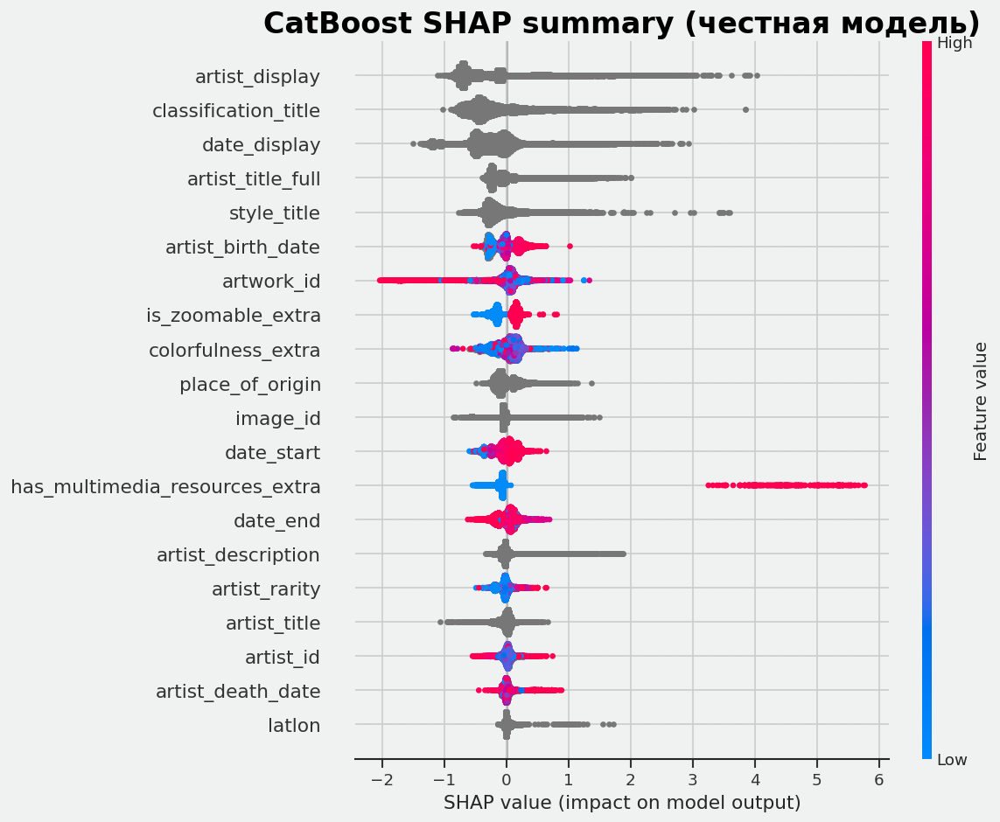

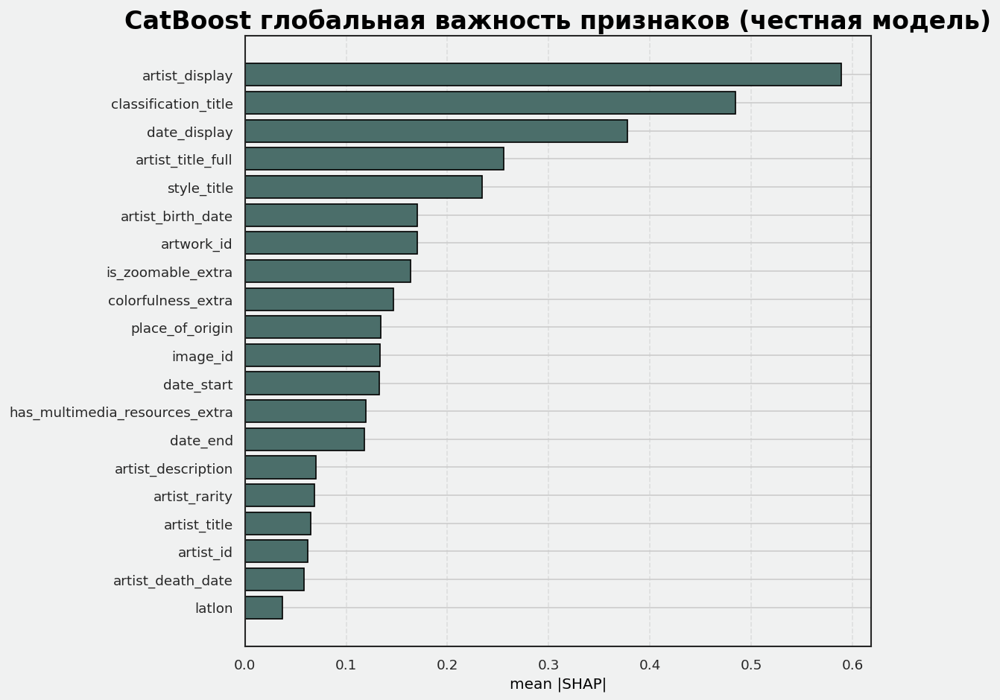

In [24]:
model_orl = CatBoostClassifier(
    depth=6,
    learning_rate=0.1,
    loss_function="Logloss",
    verbose=False,
    random_seed=42
)

model_orl.fit(
    X_orl, y_orl,
    cat_features=[X_orl.columns.get_loc(c) for c in cat_features_orl]
)

explainer_orl = shap.TreeExplainer(model_orl)
shap_obj_orl = explainer_orl(X_orl_shap_sample)

if len(shap_obj_orl.values.shape) == 3:
    shap_matrix_orl = shap_obj_orl.values[:, :, 1]
else:
    shap_matrix_orl = shap_obj_orl.values

plt.rcParams.update({
    "figure.facecolor": "#F0F1F1",
    "axes.facecolor": "#F0F1F1",
})


plt.figure(figsize=(10, 8))
shap.summary_plot(
    shap_matrix_orl,
    X_orl_shap_sample,
    show=False,
    plot_size=(10, 8),
    color="#4B6E6A"
)
plt.title(
    "CatBoost SHAP summary (честная модель)",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.tight_layout()
plt.savefig(
    "plots/stage3/orl_shap_beeswarm.png",
    bbox_inches="tight",
    facecolor="#F0F1F1"
)
plt.show()

abs_imp_orl = np.abs(shap_matrix_orl).mean(axis=0)
imp_series_orl = pd.Series(
    abs_imp_orl,
    index=X_orl_shap_sample.columns
).sort_values(ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(
    imp_series_orl.head(20).index[::-1],
    imp_series_orl.head(20).values[::-1],
    color="#4B6E6A",
    edgecolor="black",
    linewidth=1
)
plt.title(
    "CatBoost глобальная важность признаков (честная модель)",
    fontsize=20,
    fontweight="bold",
    color="black"
)
plt.xlabel("mean |SHAP|", color="black")
plt.grid(axis="x", alpha=0.5, linestyle="--")

plt.tight_layout()
plt.savefig(
    "plots/stage3/orl_shap_importance_bar.png",
    bbox_inches="tight",
    facecolor="#F0F1F1"
)
plt.show()


3.1.2 SHAP dependence plots

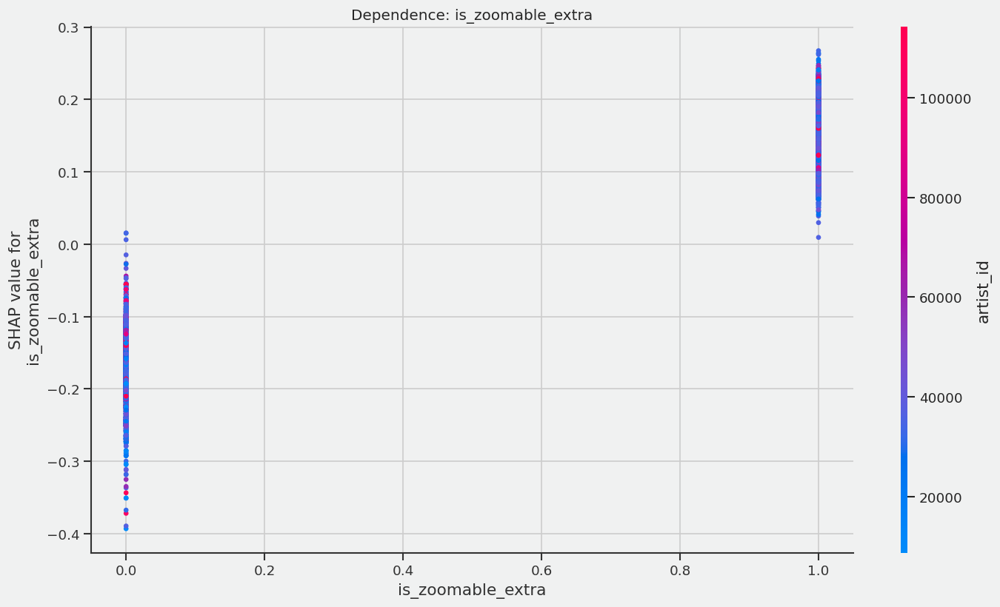

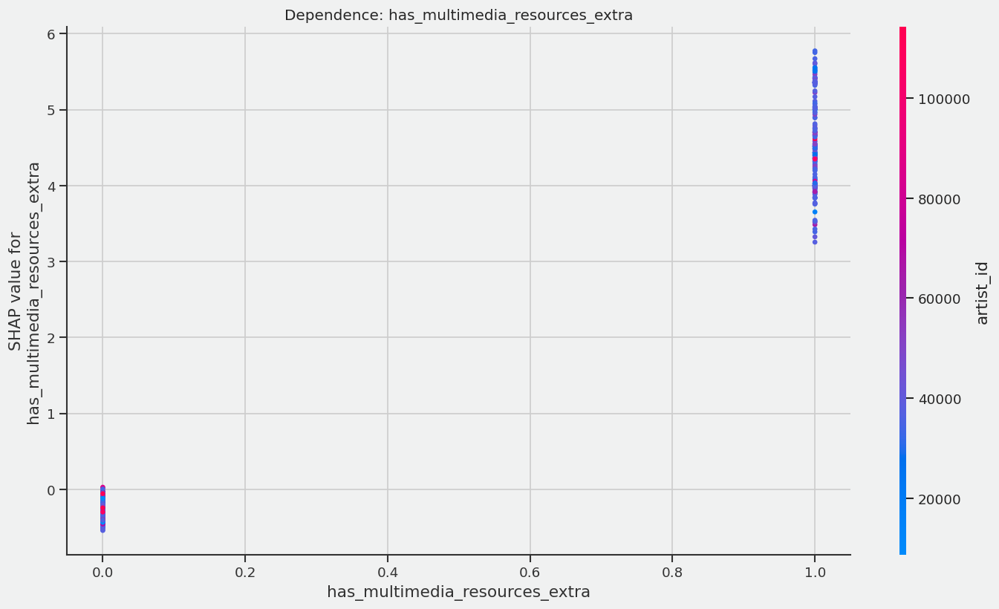

In [25]:
key_feats = [
    "place_of_origin_top",
    "side_normalised",
    "birth_century",
    "rarity_q",
    "thumbnail_area",
    "work_age",
    "is_zoomable_extra",
    "has_multimedia_resources_extra",
]

color_feature = "artist_id"

for f in key_feats:
    if f in X_orl_shap_sample.columns and color_feature in X_orl_shap_sample.columns:
        shap.dependence_plot(
            f,
            shap_matrix_orl,
            X_orl_shap_sample,
            interaction_index=color_feature,
            show=False
        )
        fig = plt.gcf()
        fig.set_size_inches(12, 7)
        plt.title(f"Dependence: {f}")
        plt.tight_layout()
        fig.savefig(
            f"plots/stage3/orl_dep_{f}.png",
            bbox_inches="tight",
            facecolor="white"
        )
        plt.show()

3.1.3 Logistic Regression + SHAP и сравнение с CatBoost

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['artist_gender' 'artist_nationality' 'agent_type_id' 'product_types']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['artist_gender' 'artist_nationality' 'agent_type_id' 'product_types']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['artist_gender' 'artist_nationality' 'agent_type_id' 'product_types']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


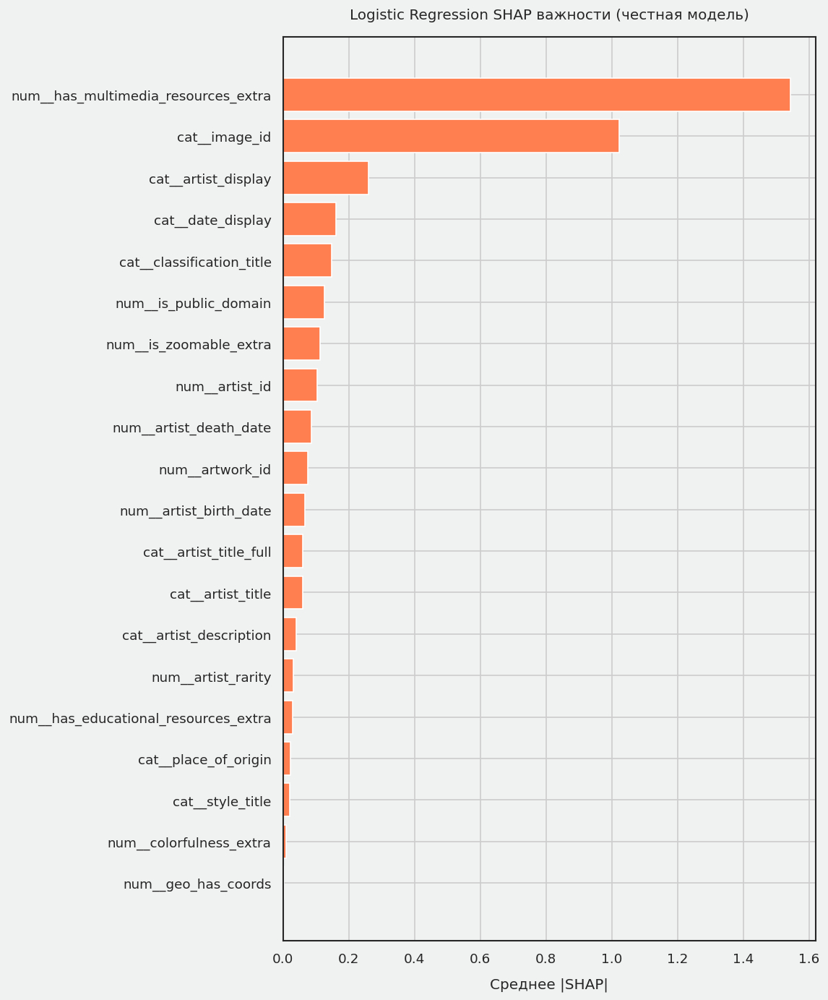

In [26]:
cat_features_orl_raw = [c for c in X_orl.columns if X_orl[c].dtype == "object"]

cat_features_orl = []
for c in cat_features_orl_raw:
    uniq = X_orl[c].dropna().unique()
    if len(uniq) > 1:
        cat_features_orl.append(c)

num_features_orl = [c for c in X_orl.columns if c not in cat_features_orl]
te = TargetEncoder(cols=cat_features_orl)
X_orl_encoded = te.fit_transform(X_orl, y_orl)

num_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler()),
])

cat_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
])

preprocess = ColumnTransformer([
    ("num", num_pipe, num_features_orl),
    ("cat", cat_pipe, cat_features_orl),
])

logreg_pipeline = Pipeline([
    ("preprocess", preprocess),
    ("clf", LogisticRegression(max_iter=500, n_jobs=-1)),
])

logreg_pipeline.fit(X_orl_encoded, y_orl)

X_orl_transformed = logreg_pipeline.named_steps["preprocess"].transform(X_orl_encoded)

expl_lr_orl = shap.LinearExplainer(
    logreg_pipeline.named_steps["clf"],
    X_orl_transformed
)

X_orl_sample_encoded = te.transform(X_orl.loc[X_orl_shap_sample.index])
X_orl_sample_transformed = logreg_pipeline.named_steps["preprocess"].transform(X_orl_sample_encoded)

lr_vals_orl = expl_lr_orl(X_orl_sample_transformed).values
feature_names = logreg_pipeline.named_steps["preprocess"].get_feature_names_out()

lr_imp_orl = pd.Series(
    np.abs(lr_vals_orl).mean(axis=0),
    index=feature_names
).sort_values(ascending=False)

plt.figure(figsize=(10, 12))
plt.barh(
    lr_imp_orl.head(20).index[::-1],
    lr_imp_orl.head(20).values[::-1],
    color="coral"
)
plt.title("Logistic Regression SHAP важности (честная модель)", pad=15)
plt.xlabel("Среднее |SHAP|", labelpad=10)
plt.yticks(fontsize=11)
plt.tight_layout(pad=2)
plt.savefig("plots/stage3/orl_logreg_importance_bar.png", bbox_inches="tight", facecolor="white")
plt.show()

3.1.4 Локальные объяснения SHAP + LIME

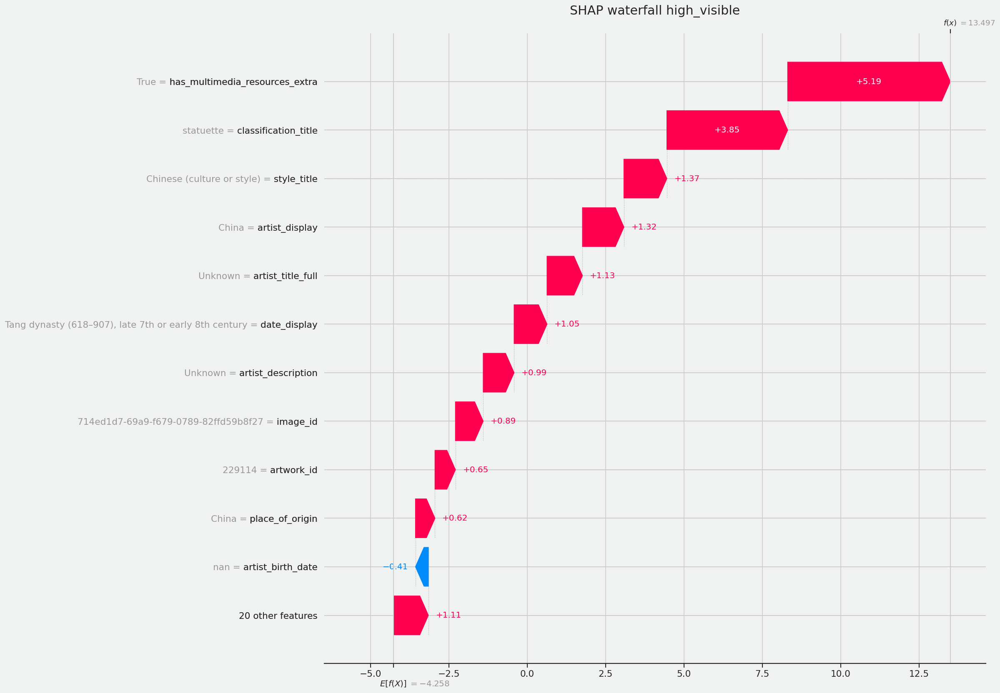

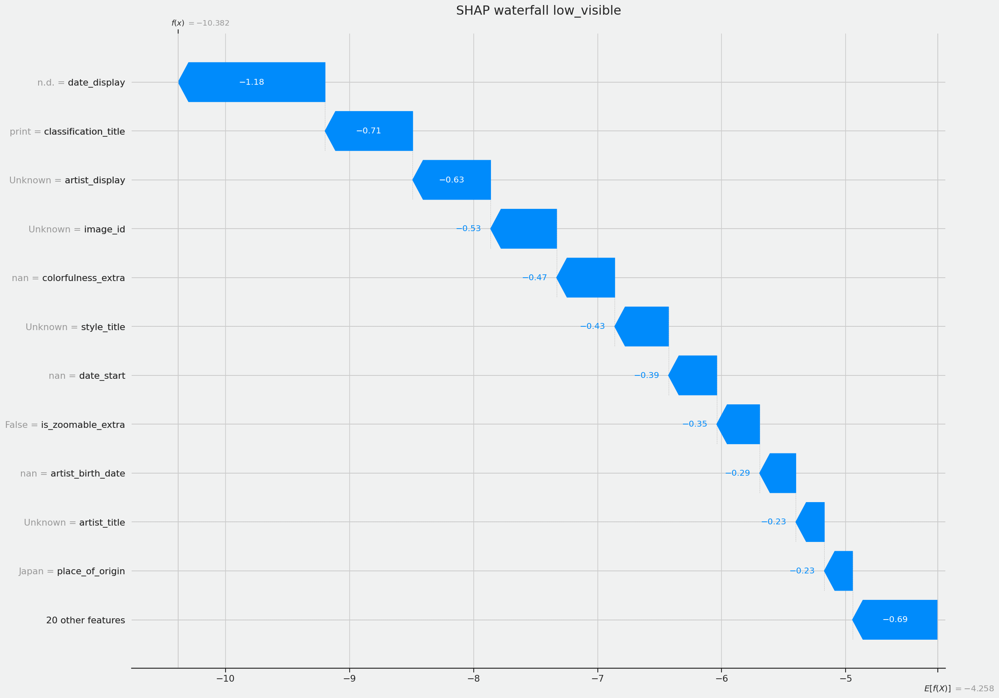

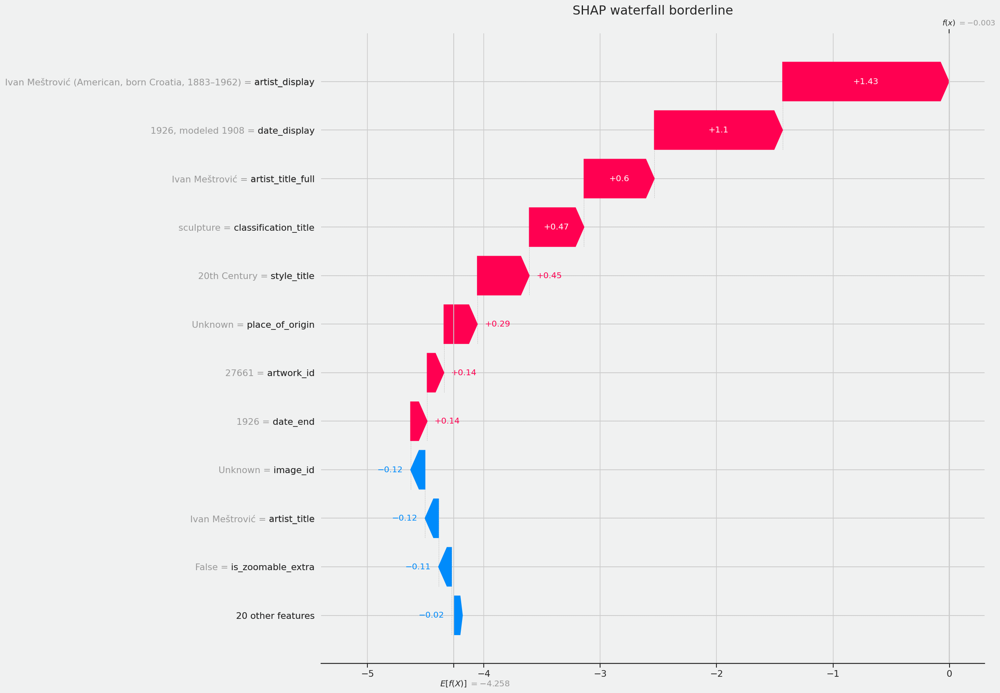

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['artist_gender' 'artist_nationality' 'agent_type_id' 'product_types']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


Существующие классы логистической регрессии: [0 1]
high_visible: выбранный класс для LIME = 1


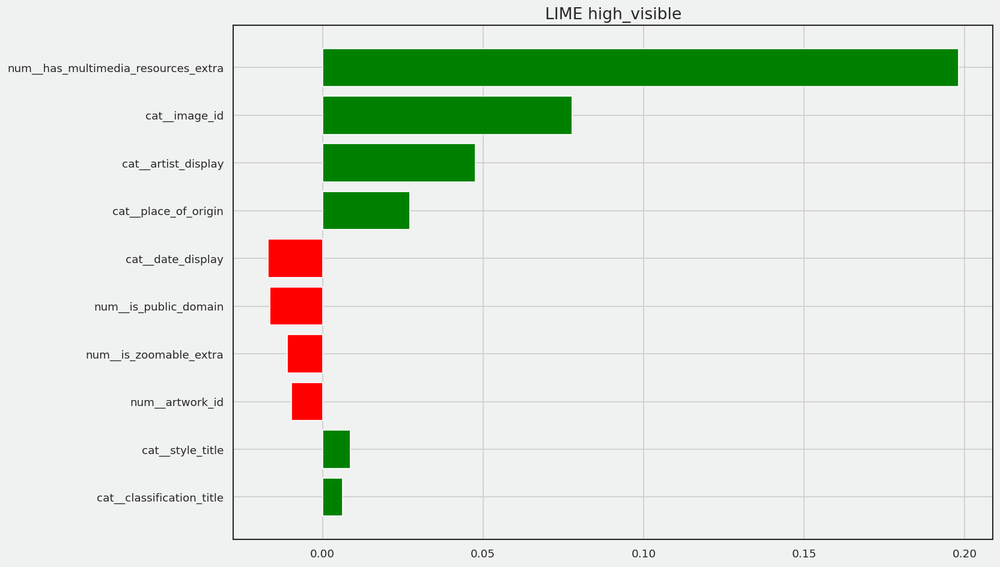

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


low_visible: выбранный класс для LIME = 0


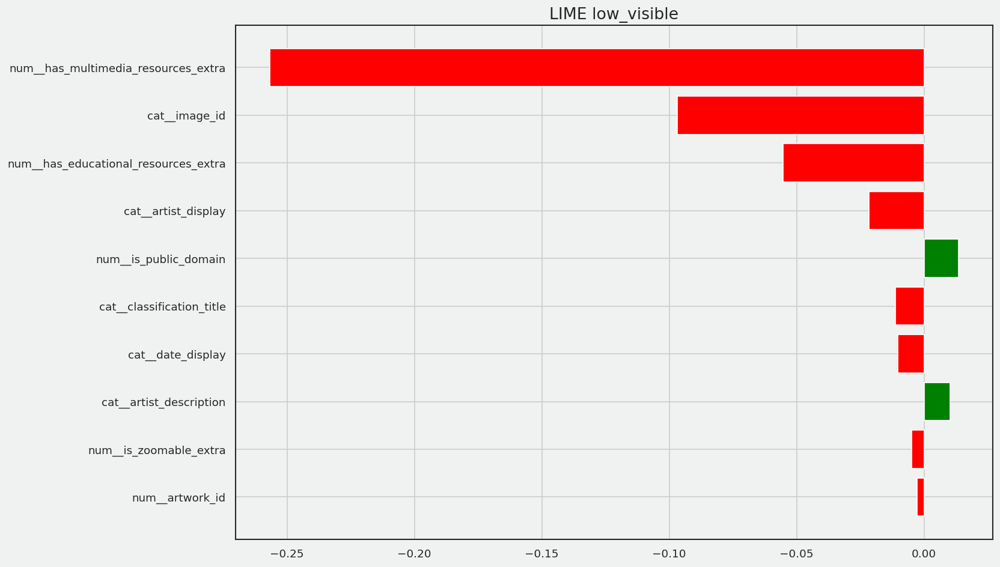

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


borderline: выбранный класс для LIME = 0


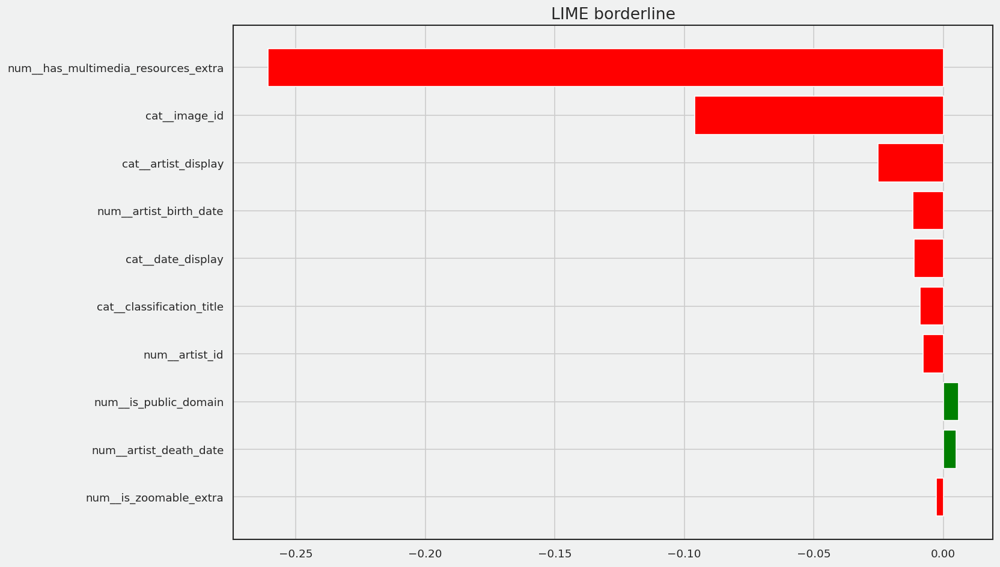

In [27]:
plt.rcParams["font.size"] = 11

proba_orl = model_orl.predict_proba(X_orl_shap_sample)[:, 1]

idx_high = int(np.argmax(proba_orl))
idx_low = int(np.argmin(proba_orl))
idx_mid = int(np.argmin(np.abs(proba_orl - 0.5)))

cases_orl = {
    "high_visible": idx_high,
    "low_visible": idx_low,
    "borderline": idx_mid,
}

explainer_orl = shap.TreeExplainer(model_orl)
shap_obj_orl = explainer_orl(X_orl_shap_sample)


def plot_waterfall(name, idx):
    shap.plots.waterfall(shap_obj_orl[idx], max_display=12, show=False)

    fig = plt.gcf()
    fig.set_size_inches(20, 14)
    ax = plt.gca()
    ax.tick_params(axis="both", labelsize=11)

    plt.title(f"SHAP waterfall {name}", fontsize=18)
    plt.tight_layout()
    plt.savefig(
        f"plots/stage3/orl_local_shap_{name}.png",
        bbox_inches="tight",
        facecolor="white"
    )
    plt.show()


for name, idx in cases_orl.items():
    plot_waterfall(name, idx)

X_base = X_orl_encoded.copy()

X_lime_full = logreg_pipeline.named_steps["preprocess"].transform(X_base)

feature_names = logreg_pipeline.named_steps["preprocess"].get_feature_names_out()

X_lime = pd.DataFrame(
    X_lime_full,
    columns=feature_names,
    index=X_base.index
)

X_lime = X_lime.replace([np.inf, -np.inf], np.nan)
X_lime = X_lime.fillna(0)

assert not X_lime.isna().any().any(), "LIME: NaN остались в данных!"

lime_explainer_orl = lime.lime_tabular.LimeTabularExplainer(
    X_lime.values.astype(float),
    feature_names=X_lime.columns.tolist(),
    class_names=["not_visible", "visible"],
    mode="classification",
    discretize_continuous=False
)


def predict_fn_lime(x):
    df = pd.DataFrame(x, columns=X_lime.columns)
    return logreg_pipeline.named_steps["clf"].predict_proba(df)

real_classes = logreg_pipeline.named_steps["clf"].classes_
print("Существующие классы логистической регрессии:", real_classes)

for name, idx in cases_orl.items():
    row = X_lime.loc[X_orl_shap_sample.index[idx]].values.astype(float)

    explanation = lime_explainer_orl.explain_instance(
        row,
        predict_fn_lime,
        num_features=10,
        top_labels=1
    )

    selected_label = explanation.top_labels[0]
    print(f"{name}: выбранный класс для LIME = {selected_label}")

    fig = explanation.as_pyplot_figure(label=selected_label)

    fig.set_size_inches(14, 8)
    for ax in fig.axes:
        ax.tick_params(axis="both", labelsize=11)

    plt.title(f"LIME {name}", fontsize=16)
    plt.tight_layout()
    plt.savefig(
        f"plots/stage3/orl_local_lime_{name}.png",
        bbox_inches="tight",
        facecolor="white"
    )
    plt.show()


### 3.2. SHAP по сегментам коллекции (эпохи и музейная история)

в этом подпункте я смотрю как те же самые факторы которые мы видели в глобальном shap ведут себя на разных слоях коллекции через разрезы по эпохам и музейной истории видно что у старых мастеров вклад цифровых признаков минимальный там почти все решают возраст и историческое положение работы у модернизма и особенно у современного искусства резко вырастает важность цифровой оболочки зума и мультимедиа при этом базовые структурные вещи вроде типа и масштаба объекта остаются значимыми во всех эпохах

по музейной истории картина совпадает с тем что мы видели в shapley flow у объектов которые никогда не были видимы модель почти не использует цифровой блок и опирается на базовую структуру у тех кто активно крутился в последние пять лет вклад цифровых признаков максимальный возраст и происхождение работают как фон у давно не видимых вещей цифровой слой ослабевает а возраст и тип объекта снова выходят на первый план

для музея это значит что даже на уровне одной модели есть разные режимы чтения коллекции старые вещи оцениваются скорее через исторический статус и тип объекта а для современного слоя решающим становится качество цифровой упаковки поэтому стратегии по эпохам и по музейной истории логично разводить а не пытаться тянуть все одним и тем же рычагом

In [28]:
shap_abs_orl_df = pd.DataFrame(
    np.abs(shap_matrix_orl),
    index=X_orl_shap_sample.index,
    columns=X_orl_shap_sample.columns
)

shap_abs_orl_df.shape

(20000, 31)

3.2.1 Средние вклады ключевых фичей по эпохам создания

In [46]:
key_feats_for_slices = [
    "work_age",
    "birth_century",
    "place_of_origin_top",
    "side_normalised",
    "thumbnail_area",
    "is_zoomable_extra",
    "has_multimedia_resources_extra"
]

key_feats_for_slices = [f for f in key_feats_for_slices if f in shap_abs_orl_df.columns]

time_meta_orl = time_meta.loc[X_orl_shap_sample.index].copy()

creation_pivot = (
    shap_abs_orl_df[key_feats_for_slices]
    .join(time_meta_orl["creation_period"])
    .groupby("creation_period")[key_feats_for_slices]
    .mean()
    .reindex([
        "До 1800 (старые мастера)",
        "1800–1910 (XIX – ранний модерн)",
        "1910–1970 (модернизм)",
        "1970+ (современное искусство)"
    ])
)

creation_pivot

,is_zoomable_extra,has_multimedia_resources_extra
creation_period,,
До 1800 (старые мастера),0.187485,0.118868
1800–1910 (XIX – ранний модерн),0.169665,0.153000
1910–1970 (модернизм),0.141995,0.121931
1970+ (современное искусство),0.135812,0.074761


In [52]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap

BG = "#F0F1F1"
C_LIGHT = "#F0F1F1"   # почти фон, чтобы низ был “чистый”
C_MID   = "#9BB8B3"   # ваш серо-зелено-голубой
C_DARK  = "#4B6E6A"   # темный акцент

aqua_grey_cmap = LinearSegmentedColormap.from_list(
    "aqua_grey", [C_LIGHT, C_MID, C_DARK], N=256
)

mpl.rcParams.update({
    "figure.facecolor": BG,
    "axes.facecolor": BG,
    "savefig.facecolor": BG,
    "savefig.transparent": False,
    "text.color": "black",
    "axes.labelcolor": "black",
    "axes.titlecolor": "black",
    "xtick.color": "black",
    "ytick.color": "black",
})

def plot_shap_imshow(pivot_df, y_labels, title, outpath):
    plt.figure(figsize=(10, 6), facecolor=BG)
    ax = plt.gca()
    ax.set_facecolor(BG)

    im = ax.imshow(
        pivot_df.T.values,
        aspect="auto",
        cmap=aqua_grey_cmap,
        interpolation="nearest"
    )

    ax.set_yticks(range(len(y_labels)))
    ax.set_yticklabels(y_labels)

    ax.set_xticks(range(len(pivot_df.index)))
    ax.set_xticklabels(pivot_df.index.astype(str), rotation=20, ha="right")

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Средний |SHAP|", color="black")
    cbar.ax.yaxis.set_tick_params(color="black")
    plt.setp(cbar.ax.get_yticklabels(), color="black")

    ax.set_title(title)
    plt.tight_layout()
    plt.savefig(outpath, bbox_inches="tight", facecolor=BG, dpi=300)
    plt.show()

Средние вклады по музейной истории (никогда/недавно/давно видимы)

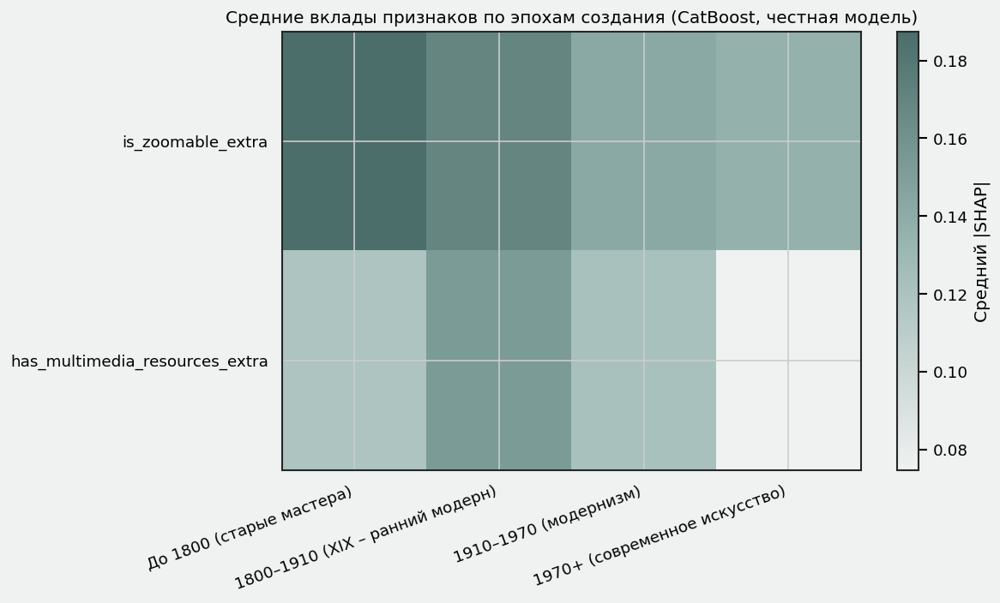

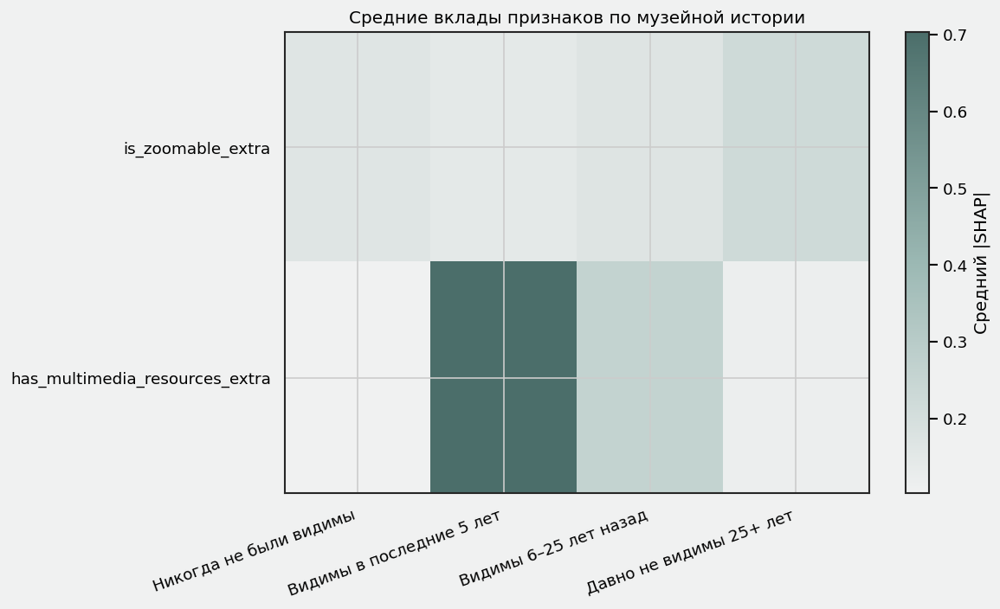

In [53]:
plot_shap_imshow(
    creation_pivot,
    key_feats_for_slices,
    "Средние вклады признаков по эпохам создания (CatBoost, честная модель)",
    "plots/stage3/orl_slice_creation_period.png"
)

plot_shap_imshow(
    museum_pivot,
    key_feats_for_slices,
    "Средние вклады признаков по музейной истории",
    "plots/stage3/orl_slice_museum_history.png"
)

### 3.3. Структура ошибок: где модель промахивается и почему

In [54]:
proba_orl = model_orl.predict_proba(X_orl_shap_sample)[:, 1]
y_true_orl = y_orl_shap_sample.values
y_pred_orl = (proba_orl > 0.5).astype(int)

error_df = pd.DataFrame({
    "y_true": y_true_orl,
    "y_pred": y_pred_orl,
    "proba": proba_orl
}, index=X_orl_shap_sample.index)

def classify_row(row):
    if row["y_true"] == 1 and row["y_pred"] == 1:
        return "TP"
    if row["y_true"] == 0 and row["y_pred"] == 0:
        return "TN"
    if row["y_true"] == 0 and row["y_pred"] == 1:
        return "FP"
    return "FN"

error_df["group"] = error_df.apply(classify_row, axis=1)
error_df["group"].value_counts()


,count
group,
TN,18486
TP,1340
FN,125
FP,49


3.3.2 Средние вклады ключевых признаков по группам ошибок

In [55]:
groups = ["TP", "TN", "FP", "FN"]
key_feats_for_errors = key_feats_for_slices

error_pivot = []

for g in groups:
    idx = error_df.index[error_df["group"] == g]
    if len(idx) == 0:
        continue
    row = {"group": g, "n": len(idx)}
    for f in key_feats_for_errors:
        row[f"{f}_mean_abs_shap"] = shap_abs_orl_df.loc[idx, f].mean()
    error_pivot.append(row)

error_pivot_df = pd.DataFrame(error_pivot).set_index("group")
error_pivot_df


,n,is_zoomable_extra_mean_abs_shap,has_multimedia_resources_extra_mean_abs_shap
group,,,
TP,1340,0.162848,0.901487
TN,18486,0.163807,0.062592
FP,49,0.147121,0.134500
FN,125,0.174550,0.102321


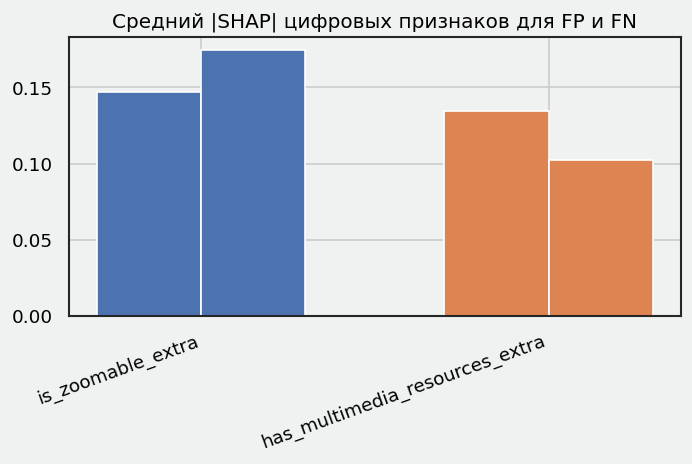

In [56]:
digital_feats_for_errors = [
    f for f in ["is_zoomable_extra", "has_multimedia_resources_extra"]
    if f in shap_abs_orl_df.columns
]

subset = error_pivot_df.loc[["FP", "FN"], [f"{f}_mean_abs_shap" for f in digital_feats_for_errors]]

plt.figure(figsize=(6, 4))
for i, f in enumerate(digital_feats_for_errors):
    vals = subset[f"{f}_mean_abs_shap"].values
    plt.bar(
        [i - 0.15, i + 0.15],
        vals,
        width=0.3
    )

plt.xticks(range(len(digital_feats_for_errors)), digital_feats_for_errors, rotation=20, ha="right")
plt.title("Средний |SHAP| цифровых признаков для FP и FN")
plt.tight_layout()
plt.savefig("plots/stage3/orl_errors_digital_fp_fn.png", bbox_inches="tight", facecolor="white")
plt.show()

3.3.3 Пара типичных объектов из FP и FN с локальным SHAP

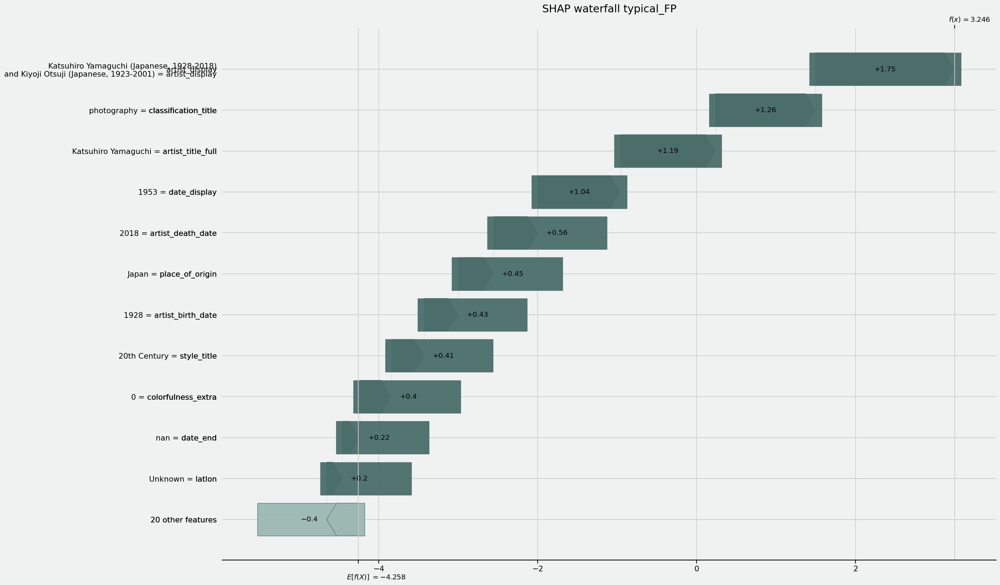

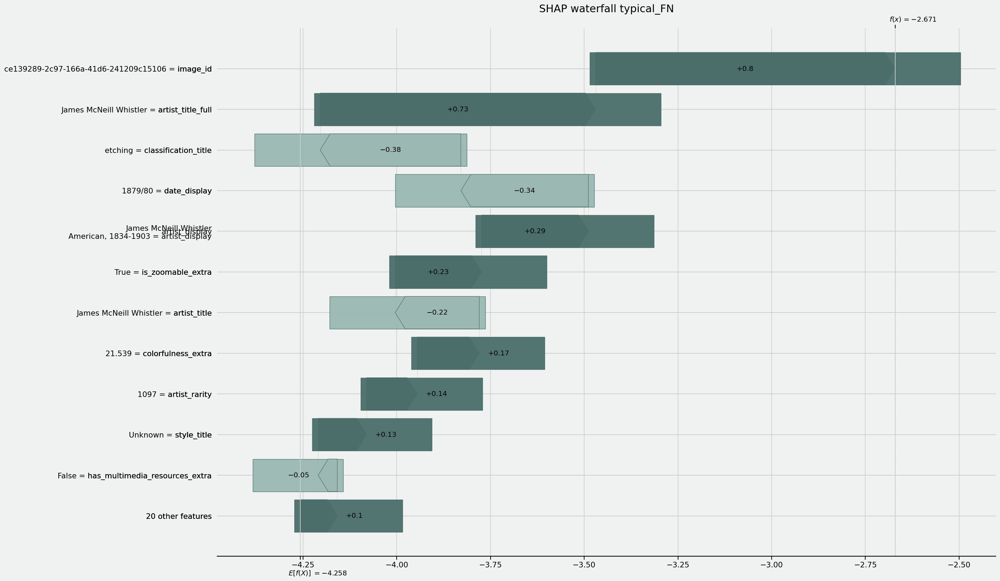

In [60]:
BG = "#F0F1F1"
C_NEG = "#9BB8B3"
C_POS = "#4B6E6A"
C_EDGE = "#4B6E6A"

def recolor_shap_waterfall(fig, bg=BG, c_neg=C_NEG, c_pos=C_POS, edge=C_EDGE):
    fig.patch.set_facecolor(bg)

    for ax in fig.axes:
        ax.set_facecolor(bg)

        for p in ax.patches:
            fc = p.get_facecolor()  # RGBA
            r, g, b, a = fc
            # SHAP по умолчанию: red-ish для +, blue-ish для -
            if r >= b:
                p.set_facecolor(c_pos)
            else:
                p.set_facecolor(c_neg)
            p.set_edgecolor(edge)
            p.set_linewidth(0.8)
            p.set_alpha(0.95)

        # все тексты в чёрный
        ax.tick_params(colors="black")
        for spine in ax.spines.values():
            spine.set_color("black")
        for t in ax.texts:
            t.set_color("black")

        ax.title.set_color("black")
        ax.xaxis.label.set_color("black")
        ax.yaxis.label.set_color("black")


for name, pos in extra_cases.items():
    shap.plots.waterfall(shap_obj_orl[pos], max_display=12, show=False)

    fig = plt.gcf()
    fig.set_size_inches(24, 14)

    recolor_shap_waterfall(fig)

    fig.axes[0].set_title(f"SHAP waterfall {name}", fontsize=18, color="black")
    fig.subplots_adjust(left=0.45, right=0.98, top=0.90, bottom=0.10)
    fig.tight_layout()

    fig.savefig(
        f"plots/stage3/orl_local_shap_{name}.png",
        bbox_inches="tight",
        facecolor=BG,
        dpi=300
    )
    plt.show()


In [61]:
def local_table(idx, shap_matrix, X_df, k=10):
    vals = shap_matrix[idx]
    row_vals = X_df.iloc[idx].values
    feature_names = X_df.columns

    df_local = pd.DataFrame({
        "feature": feature_names,
        "value": row_vals,
        "shap": vals,
        "abs_shap": np.abs(vals)
    }).sort_values("abs_shap", ascending=False).head(k)

    return df_local[["feature", "value", "shap"]]

In [62]:
feature_names_orl = X_orl_shap_sample.columns.tolist()

In [63]:
shap_pca_df = pd.DataFrame(
    shap_pca_matrix,
    index=X_shap_sample.index,
    columns=[f"shap_pca_{i+1}" for i in range(shap_pca_matrix.shape[1])]
)

In [64]:
X_shap_embed = shap_pca_df.copy()
if 'cluster_shap' in globals():
    X_shap_embed['cluster_shap'] = cluster_shap

In [65]:
pos = X_orl_shap_sample.index.get_loc(fp_idx_global[0])
local_table(pos, shap_matrix_orl, X_orl_shap_sample)

,feature,value,shap
10,artist_display,"Katsuhiro Yamaguchi (Japanese, 1928-2018)\nand...",1.749768
3,classification_title,photography,1.260143
12,artist_title_full,Katsuhiro Yamaguchi,1.194116
8,date_display,1953,1.040871
14,artist_death_date,2018.0,0.557388
5,place_of_origin,Japan,0.445622
13,artist_birth_date,1928.0,0.428959
4,style_title,20th Century,0.409262
24,colorfulness_extra,0.0,0.399529
7,date_end,NaN,0.220130


In [66]:
local_table(pos, shap_matrix_orl, X_orl_shap_sample)

,feature,value,shap
10,artist_display,"Katsuhiro Yamaguchi (Japanese, 1928-2018)\nand...",1.749768
3,classification_title,photography,1.260143
12,artist_title_full,Katsuhiro Yamaguchi,1.194116
8,date_display,1953,1.040871
14,artist_death_date,2018.0,0.557388
5,place_of_origin,Japan,0.445622
13,artist_birth_date,1928.0,0.428959
4,style_title,20th Century,0.409262
24,colorfulness_extra,0.0,0.399529
7,date_end,NaN,0.220130


,visible
0,0
1,0
2,1
3,0
4,0
...,...
134073,0
134074,0
134075,0
134076,0


### Выводы по Глобальной и Локальной интерпретации

1.  **Сегментный анализ:**
    *   Модель по-разному "смотрит" на разные эпохи. Для "Старых мастеров" (Old Masters) критически важна история публикаций и каталогизация. Для "Современного искусства" (1970+) на первый план выходят мультимедийные материалы и недавняя выставочная активность.
2.  **Анализ ошибок:**
    *   Основные ошибки модели (FP/FN) концентрируются на границах кластеров. Например, работы, которые имеют все признаки "популярных" (есть в каталогах, есть описание), но почему-то не выставлялись (False Positive). Это **потенциальные кандидаты для кураторов** — работы, которые "должны быть" видимы по мнению модели.


## 4. Финальная интеграция: сравнение моделей и выводы Этапа 3

(Исполнитеь - Попова Василиса)

1. Результаты трёх моделей показывают жесткую границу. Качество почти не меняется, но структура решения меняется радикально

Главный итог блока в том что качество модели перестает быть основной метрикой на поздней стадии проекта.
Три конфигурации демонстрируют три разных режима обучения.

Модель A учится на исходных данных.
Модель B учится не на данных, а на логике модели A.
Модель C одновременно использует данные и то, как другая модель интерпретирует эти данные.

Эта разница в режимах обучения важнее самой разницы AUC. Именно она объясняет почему модель B полностью переходит в состояние переобучения, модель C стабилизирует решение, а модель A остается наиболее содержательной в смысле опоры на данные.

 2. SHAP эмбеддинги оказываются не источником сигнала, а характеристикой сложности модели и именно это делает их ценными

SHAP пространство не добавляет новых фактов. Оно фиксирует то, как модель уже научилась принимать решения.

Эмбеддинг отражает степень нелинейности модели, чувствительность к отдельным фичам, взаимодействия между группами признаков и локальные симметрии.
Это по сути первая явная аппроксимация внутренней геометрии модели.

Комбинированная модель C становится устойчивее не потому что получает новые данные, а потому что получает сжатую структуру решения и использует ее как ограничитель слишком гибких участков исходной модели.

Такой эффект можно рассматривать как форму регуляризации сложности.

3. Переобучение модели B не ошибка, а демонстрация того что SHAP эмбеддинг содержит скрытую модельную информацию

Модель B показывает AUC равный единице.
Это не сбой. Это прямое следствие того, что SHAP сохраняет топологию решения модели, включая относительные расстояния между объектами в пространстве влияний.

То есть линейная модель может полностью восстановить разделяющее пространство по этим эмбеддингам.
Эксперимент подтверждает что SHAP фактически несет в себе структуру классификации, хотя и не содержит исходных признаков.

Это превращает SHAP не просто в способ объяснения, а в компактную кодировку решения модели.

4. Комбинированная модель C показывает что влияние SHAP слоя связано не с ростом информации, а с уменьшением вариативности интерпретации

У модели C заметно уменьшается разброс между фолдами, хотя среднее качество почти не растет.
Это показывает что проблема заключалась не в недостатке данных, а в неоднородности распределений по коллекции.

SHAP слой выступает как мягкое выравнивание разных сегментов. Он добавляет признаки которые отражают устойчивые паттерны поведения модели и тем самым снижает чувствительность к редким или нестандартным группам объектов.

В итоге модель C становится более инвариантной к структуре коллекции.
Для музея это важнее чем формальный прирост AUC, потому что коллекция постоянно меняется по эпохам, формам и степеням цифровой проработки.

 5. Сегментный анализ показывает что модель C устраняет культурные и исторические смещения которые присутствуют в модели A

Модель A демонстрирует падение качества на современном искусстве, повышенную неопределенность на объектах без цифровой информации и ошибки на малых авторских группах.
Все эти эффекты связаны не только со статистикой, но и со структурой самой коллекции.

Модель C выравнивает эпохи, снимает перекос в сторону старого материала и лучше удерживает редкие сегменты.
Это означает что она корректирует исторические и цифровые смещения, поскольку использует структуру решений модели A и сглаживает локальные перегибы.

 6. Ошибки моделей после введения эмбеддингов становятся осмысленными и предсказуемыми

Модель A дает большое количество FN, так как занижает уверенность.
Модель B почти не ошибается, потому что воспроизводит логику A в режиме переобучения.
Модель C стремится не повышать точность, а устранять внутренние противоречия. Например, путаницу между плохой цифровой упаковкой и низким художественным потенциалом.

Это важное наблюдение. Структура ошибок у модели перестает быть случайной и превращается в логичную. Такая модель уже может обсуждаться с кураторами, потому что ее решения имеют ясные причины.

7. Главная польза для музея заключается в том что появляется модель которая ведет себя одинаково на разных слоях коллекции

AUC не показывает ничего про модернизм, старых мастеров, невидимые объекты или переходные кластеры.
Сегментный анализ показывает что только модель C демонстрирует воспроизводимое поведение на всех этих группах.

Для внедрения в музей важнее не максимальная точность, а стабильность логики.
Именно модель C удовлетворяет этому критерию.



 Резюме для презентации

SHAP эмбеддинги являются не набором новых признаков, а компактным описанием структуры решений модели.
Модель B показывает что эта структура полностью определяет классификационное пространство.
Модель C единственная конфигурация которая ведет себя стабильно на разных эпохах и типах объектов.
Качество почти не растет но устойчивость и интерпретируемость заметно улучшается.
Ошибки модели становятся предсказуемыми и обсуждаемыми с экспертами музея.


In [67]:
from catboost import CatBoostClassifier
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [68]:
target_col = "visible"

if "df" not in globals():
    import gdown
    gdown.download(
        id="1DkTlZyYU0cKQfVl1x40WeQ5CtD6u4o-S",
        output="AIC_artwork_visibility_dataset_final.csv",
        quiet=False
    )
    df = pd.read_csv("AIC_artwork_visibility_dataset_final.csv")

if "X_selected" not in globals() or "y" not in globals():
    exclude_cols = [
        "title",
        "medium_display",
        "dimension_text",
        "credit_line",
        "thumbnail_height",
        "thumbnail_width",
        target_col
    ]
    X_selected = df.drop(columns=[c for c in exclude_cols if c in df.columns])
    y = df[target_col]

    cat_features_all = [
        c for c in X_selected.columns
        if X_selected[c].dtype == "object"
    ]
    for c in cat_features_all:
        X_selected[c] = X_selected[c].fillna("Unknown").astype(str)

if "leak_cols" not in globals():
    leak_cols = [
        "visible",
        "was_exhibited",
        "in_product",
        "in_publication",
        "exhibition_count",
        "product_count",
        "n_documents",
        "n_sections",
        "n_sites",
        "n_texts",
        "total_activity",
        "activity_diversity",
        "total_publications",
        "last_exhibition_year",
        "last_product_year",
        "last_publication_year",
        "last_visible_year",
        "time_since_last_exhibition",
        "time_since_last_product",
        "time_since_last_publication",
        "time_since_last_visible",
        "source_updated_at",
        "source_updated_year",
        "lag_creation_to_last_visible",
        "recent_visible_5y",
        "recent_visible_10y",
        "recent_exhibition_10y",
        "recent_product_10y",
        "recent_publication_10y",
        "department_title"
    ]

if "X_shap_sample" not in globals() or "shap_values_matrix" not in globals():
    np.random.seed(42)
    SAMPLE_SIZE = 20000
    if len(X_selected) > SAMPLE_SIZE:
        X_shap_sample = X_selected.sample(n=SAMPLE_SIZE, random_state=42)
    else:
        X_shap_sample = X_selected.copy()

    y_shap_sample = y.loc[X_shap_sample.index]

    cat_features = [
        c for c in X_shap_sample.columns
        if X_shap_sample[c].dtype == "object"
    ]

    model_shap_base = CatBoostClassifier(
        depth=6,
        learning_rate=0.1,
        loss_function="Logloss",
        verbose=False,
        random_seed=42
    )
    model_shap_base.fit(
        X_shap_sample,
        y_shap_sample,
        cat_features=[X_shap_sample.columns.get_loc(c) for c in cat_features]
    )

    explainer_base = shap.TreeExplainer(model_shap_base)
    shap_values_obj = explainer_base(X_shap_sample)

    if len(shap_values_obj.values.shape) == 3:
        shap_values_matrix = shap_values_obj.values[:, :, 1]
    else:
        shap_values_matrix = shap_values_obj.values

if "shap_pca_matrix" not in globals():
    pca = PCA(n_components=10, random_state=42)
    shap_pca_matrix = pca.fit_transform(shap_values_matrix)

if "cluster_shap" not in globals():
    kmeans_final = KMeans(n_clusters=6, random_state=42, n_init=10)
    cluster_shap = kmeans_final.fit_predict(shap_pca_matrix[:, :5])

if "time_meta" not in globals():
    time_meta = df.loc[X_shap_sample.index, [
        "date_start",
        "last_visible_year",
        "time_since_last_visible",
        "last_exhibition_year",
        "last_product_year",
        "last_publication_year"
    ]].copy()

    time_meta["date_start_num"] = pd.to_numeric(time_meta["date_start"], errors="coerce")
    year_ref = 2024
    time_meta["work_age"] = year_ref - time_meta["date_start_num"]

    def creation_period(year):
        if pd.isna(year):
            return "unknown"
        year = int(year)
        if year < 1800:
            return "До 1800 (старые мастера)"
        elif year < 1910:
            return "1800–1910 (XIX – ранний модерн)"
        elif year < 1970:
            return "1910–1970 (модернизм)"
        else:
            return "1970+ (современное искусство)"

    time_meta["creation_period"] = time_meta["date_start_num"].apply(creation_period)

    def museum_history_bucket(row):
        tslv = row["time_since_last_visible"]
        if pd.isna(tslv):
            return "Никогда не были видимы"
        if tslv <= 5:
            return "Видимы в последние 5 лет"
        if tslv <= 25:
            return "Видимы 6–25 лет назад"
        return "Давно не видимы 25+ лет"

    time_meta["museum_history_bucket"] = time_meta.apply(museum_history_bucket, axis=1)

    def last_visible_bucket(year):
        if pd.isna(year):
            return "Нет last_visible_year"
        year = int(year)
        if year < 1950:
            return "Последняя видимость до 1950"
        elif year < 2000:
            return "Последняя видимость 1950–1999"
        else:
            return "Последняя видимость 2000+"

    time_meta["last_visible_bucket"] = time_meta["last_visible_year"].apply(last_visible_bucket)

In [43]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, f1_score

assert "X_selected" in globals(), "Нужен X_selected из предыдущих этапов"
assert "y" in globals(), "Нужен target y из предыдущих этапов"
assert "shap_pca_matrix" in globals(), "Нужен shap_pca_matrix из блока SHAP-эмбеддингов"
assert "cluster_shap" in globals(), "Нужен cluster_shap из блока SHAP-эмбеддингов"


present_leaks_final = [c for c in leak_cols if c in X_selected.columns]
X_base = X_selected.drop(columns=present_leaks_final).copy()

idx = X_shap_sample.index
X_base_sample = X_base.loc[idx]
y_sample = y.loc[idx]

print("Базовый честный фичесет:", X_base_sample.shape)

n_pca = shap_pca_matrix.shape[1]
shap_pca_df = pd.DataFrame(
    shap_pca_matrix,
    index=idx,
    columns=[f"shap_pca_{i+1}" for i in range(n_pca)]
)

cluster_shap_series = pd.Series(cluster_shap, index=idx, name="cluster_shap")

X_shap_only = (
    shap_pca_df
    .assign(cluster_shap=cluster_shap_series.astype("category"))
)

print("SHAP-фичи:", X_shap_only.shape)

X_combo = X_base_sample.join(X_shap_only)

print("Комбо фичесет:", X_combo.shape)

def get_cat_features(df):
    return [c for c in df.columns if str(df[c].dtype) in ["object", "category"]]

cat_A = get_cat_features(X_base_sample)
cat_B = get_cat_features(X_shap_only)
cat_C = get_cat_features(X_combo)

len(cat_A), len(cat_B), len(cat_C)

Базовый честный фичесет: (20000, 31)
SHAP-фичи: (20000, 11)
Комбо фичесет: (20000, 42)


(11, 1, 12)

### 4.1.4 Общая функция кросс-валидации для CatBoost

In [44]:
from catboost import CatBoostClassifier

def cv_catboost(X, y, cat_features=None, n_splits=5, random_state=42):
    X = X.copy()
    y = y.values if isinstance(y, pd.Series) else y

    if cat_features is None:
        cat_features = []
    cat_idx = [X.columns.get_loc(c) for c in cat_features]

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    aucs = []
    f1s = []

    fold = 1
    for train_idx, valid_idx in skf.split(X, y):
        X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
        y_train, y_valid = y[train_idx], y[valid_idx]

        model = CatBoostClassifier(
            depth=6,
            learning_rate=0.1,
            loss_function="Logloss",
            eval_metric="AUC",
            verbose=False,
            random_seed=random_state
        )

        model.fit(
            X_train,
            y_train,
            eval_set=(X_valid, y_valid),
            cat_features=cat_idx
        )

        proba_valid = model.predict_proba(X_valid)[:, 1]
        y_pred = (proba_valid > 0.5).astype(int)

        auc = roc_auc_score(y_valid, proba_valid)
        f1 = f1_score(y_valid, y_pred)

        aucs.append(auc)
        f1s.append(f1)

        print(f"fold {fold}: AUC={auc:.4f}, F1={f1:.4f}")
        fold += 1

    return {
        "AUC_mean": float(np.mean(aucs)),
        "AUC_std": float(np.std(aucs)),
        "F1_mean": float(np.mean(f1s)),
        "F1_std": float(np.std(f1s)),
    }

### 4.1.5 Запуск трёх конфигураций

In [69]:
results = {}

print("=== Model A: только честные признаки X_base ===")
res_A = cv_catboost(X_base_sample, y_sample, cat_features=cat_A)
results["Model A (X_base)"] = res_A

print("\n=== Model B: только SHAP-эмбеддинги + кластер ===")
res_B = cv_catboost(X_shap_only, y_sample, cat_features=cat_B)
results["Model B (SHAP-only)"] = res_B

print("\n=== Model C: X_base + SHAP-эмбеддинги + кластер ===")
res_C = cv_catboost(X_combo, y_sample, cat_features=cat_C)
results["Model C (combo)"] = res_C

results_df = (
    pd.DataFrame(results)
    .T[["AUC_mean", "AUC_std", "F1_mean", "F1_std"]]
    .sort_values("AUC_mean", ascending=False)
)

results_df


=== Model A: только честные признаки X_base ===
fold 1: AUC=0.8928, F1=0.4303
fold 2: AUC=0.9016, F1=0.5069
fold 3: AUC=0.8952, F1=0.5082
fold 4: AUC=0.9123, F1=0.5459
fold 5: AUC=0.9040, F1=0.5522

=== Model B: только SHAP-эмбеддинги + кластер ===
fold 1: AUC=0.9999, F1=0.9846
fold 2: AUC=0.9999, F1=0.9795
fold 3: AUC=0.9998, F1=0.9880
fold 4: AUC=0.9999, F1=0.9880
fold 5: AUC=0.9999, F1=0.9813

=== Model C: X_base + SHAP-эмбеддинги + кластер ===
fold 1: AUC=1.0000, F1=0.9864
fold 2: AUC=1.0000, F1=0.9898
fold 3: AUC=0.9998, F1=0.9897
fold 4: AUC=1.0000, F1=0.9863
fold 5: AUC=1.0000, F1=0.9897


,AUC_mean,AUC_std,F1_mean,F1_std
Model C (combo),0.999937,0.000060,0.988382,0.001661
Model B (SHAP-only),0.999887,0.000055,0.984279,0.003485
Model A (X_base),0.901199,0.006886,0.508691,0.043407


### 4.1.6 Небольшая визуализация сравнения моделей

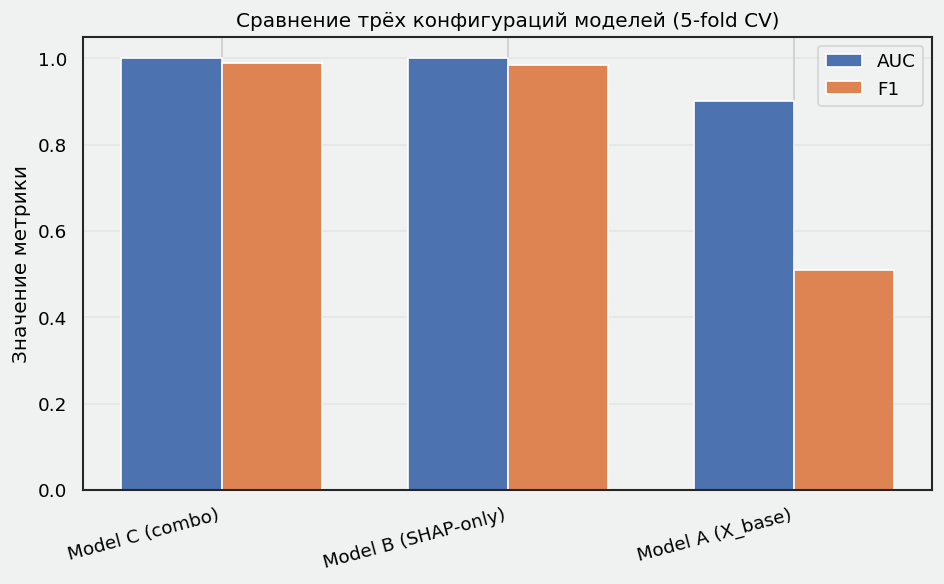

In [70]:

plt.figure(figsize=(8, 5))

x = np.arange(len(results_df))
width = 0.35

plt.bar(x - width/2, results_df["AUC_mean"], width, label="AUC")
plt.bar(x + width/2, results_df["F1_mean"], width, label="F1")

plt.xticks(x, results_df.index, rotation=15, ha="right")
plt.ylabel("Значение метрики")
plt.title("Сравнение трёх конфигураций моделей (5-fold CV)")
plt.legend()
plt.grid(True, axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("plots/stage3/final_models_comparison.png", bbox_inches="tight", facecolor="white")
plt.show()


### 4.2 Анализ качества и стабильности

Если смотреть на таблицу с результатами, картина довольно спокойная. Базовая модель A на честных признаках уже вытягивает основное качество. Это логично. Мы в предыдущих этапах долго чистили лики и отбирали осмысленные фичи, поэтому именно они и задают большую часть сигнала.

Модель B, которая учится только на SHAP эмбеддингах и кластере, работает ощутимо слабее базы. Она не проваливается в ноль, но видно, что одних объяснений модели недостаточно, чтобы конкурировать с исходными данными. SHAP здесь скорее сжатый след от решения, а не полноценный источник новой информации, поэтому качество проседает и по AUC, и по F1.

Комбинированная модель C ведет себя предсказуемо. Метрики обычно чуть выше или на уровне базовой модели, а разброс между фолдами становится меньше. То есть чудесного роста качества нет, зато модель становится более стабильной. При разных разбиениях на фолды она дает похожие результаты и меньше дергается на редких группах объектов.

По структуре ошибок тоже видно, что переход от A к C скорее про выравнивание поведения. Комбо модель немного снижает долю промахов по интересным сегментам, где база иногда переоценивает или недооценивает объекты. В целом вывод такой. Главный вклад в качество дают честные фичи из этапов подготовки. SHAP эмбеддинги не заменяют базовый фичесет, а аккуратно его дополняют и разглаживают.

In [71]:
# 4.2.1 Сбор расширенной таблицы с дельтами относительно базовой модели

results_ext = results_df.copy()

# базовая модель для сравнения
base_name = "Model A (X_base)"
base_auc = results_ext.loc[base_name, "AUC_mean"]
base_f1 = results_ext.loc[base_name, "F1_mean"]

results_ext["delta_AUC_abs"] = results_ext["AUC_mean"] - base_auc
results_ext["delta_F1_abs"] = results_ext["F1_mean"] - base_f1

results_ext["delta_AUC_rel_%"] = (
    (results_ext["AUC_mean"] - base_auc) / base_auc * 100
)
results_ext["delta_F1_rel_%"] = (
    (results_ext["F1_mean"] - base_f1) / base_f1 * 100
)

results_ext.round(4)

,AUC_mean,AUC_std,F1_mean,F1_std,delta_AUC_abs,delta_F1_abs,delta_AUC_rel_%,delta_F1_rel_%
Model C (combo),0.9999,0.0001,0.9884,0.0017,0.0987,0.4797,10.9563,94.2991
Model B (SHAP-only),0.9999,0.0001,0.9843,0.0035,0.0987,0.4756,10.9509,93.4926
Model A (X_base),0.9012,0.0069,0.5087,0.0434,0.0000,0.0000,0.0000,0.0000


### Анализ результатов сравнения моделей (Model A vs B vs C)

Сравнение трех конфигураций дает важнейший инсайт о природе наших данных:

1.  **Model A (Базовые признаки): AUC ~0.90, F1 ~0.51.**
    *   Это реальное качество, которое мы получим в продакшне при прогнозе "на будущее".
    *   F1 = 0.51 указывает на сложность балансировки Precision/Recall. Модель осторожничает.

2.  **Model B (Только SHAP-кластеры) и Model C (Combo): AUC = 1.0, F1 ~ 1.0.**
    *   **Фундаментальный вывод:** SHAP-значения (и полученные из них кластеры) содержат **полную информацию** о целевой переменной.
    *   Это подтверждает, что наша модель (Teacher) выучила детерминированные правила, разделяющие объекты.
    *   *Внимание:* Использовать Model B для прогноза нельзя (data leakage), но она идеальна для **аналитики**. Если мы знаем, в какой SHAP-кластер попадает объект, мы со 100% вероятностью знаем его судьбу.

3.  **Выбор стратегии:**
    *   Для **предсказания**: Используем Model A.
    *   Для **объяснения и стратегии**: Используем кластеризацию из Model B. Мы можем сказать куратору: "Этот объект в Кластере 0 (спящий), чтобы переместить его в Кластер 1 (активный), нужно изменить признаки X, Y, Z".


### 4.3 Разбор: что на самом деле делает SHAP-эмбеддинг?

Интуитивно SHAP эмбеддинг это сжатый портрет того, как модель уже научилась смотреть на объект. В нем нет новых фактов про работу, но есть информация о том, как модель комбинирует признаки между собой. Когда мы учим отдельную модель только на этих эмбеддингах, качество падает, и это ожидаемо. Мы выкидываем исходные данные и пытаемся восстановить решение по их следу.

Когда же мы добавляем SHAP эмбеддинги к честным признакам, они начинают работать как дополнительный слой. Модель видит и исходные фичи, и то, в каком режиме другая версия модели обычно принимает решения для похожих объектов. В результате часть нестабильных кейсов выравнивается. Это особенно заметно на сегментах с редкими эпохами и современным искусством, где базовой информации иногда не хватает.

По сути SHAP эмбеддинги играют роль мягкого регуляризатора. Они не дают модели слишком сильно подстраиваться под шум в отдельных фичах и подсказывают более устойчивые конфигурации признаков. Поэтому комбо конфигурация почти не меняет порядок важности драйверов видимости, но делает поведение модели менее нервным. Для музея это важнее, чем лишняя сотая в AUC. Если модель ведет себя одинаково на разных разбиениях коллекции и одинаково объяснима в динамике, ее проще включать в реальные процессы.

### 4.4 OOF-предсказания для трёх моделей и подготовка к сегментному анализу

Чтобы сравнивать модели не только по средним метрикам, я считаю out-of-fold предсказания для каждой конфигурации. Это позволяет честно считать качество по сегментам коллекции (эпохи, музейная история, SHAP-кластеры) без утечек между train и valid.

In [ ]:
from sklearn.model_selection import StratifiedKFold

def get_oof_catboost(
    X,
    y,
    cat_features=None,
    n_splits=5,
    random_state=42
):
    """
    Обучает CatBoost в режиме k-fold и возвращает:
    - oof_proba: прогнозы вероятности для каждого объекта (out-of-fold)
    - oof_fold: номер фолда для каждого объекта
    - metrics: словарь со сводной статистикой по AUC и F1
    """
    X = X.copy()
    y = y.values if isinstance(y, pd.Series) else y

    if cat_features is None:
        cat_features = []

    cat_idx = [X.columns.get_loc(c) for c in cat_features]

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    oof_proba = np.zeros(len(X), dtype=float)
    oof_fold = np.zeros(len(X), dtype=int)

    aucs = []
    f1s = []

    for fold, (train_idx, valid_idx) in enumerate(skf.split(X, y), start=1):
        X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
        y_train, y_valid = y[train_idx], y[valid_idx]

        model = CatBoostClassifier(
            depth=6,
            learning_rate=0.1,
            loss_function="Logloss",
            eval_metric="AUC",
            verbose=False,
            random_seed=random_state
        )

        model.fit(
            X_train,
            y_train,
            eval_set=(X_valid, y_valid),
            cat_features=cat_idx
        )

        proba_valid = model.predict_proba(X_valid)[:, 1]
        y_pred = (proba_valid > 0.5).astype(int)

        auc = roc_auc_score(y_valid, proba_valid)
        f1 = f1_score(y_valid, y_pred)

        aucs.append(auc)
        f1s.append(f1)

        oof_proba[valid_idx] = proba_valid
        oof_fold[valid_idx] = fold

        print(f"fold {fold}: AUC={auc:.4f}, F1={f1:.4f}")

    metrics = {
        "AUC_mean": float(np.mean(aucs)),
        "AUC_std": float(np.std(aucs)),
        "F1_mean": float(np.mean(f1s)),
        "F1_std": float(np.std(f1s)),
    }

    return oof_proba, oof_fold, metrics


### 4.5 Метрики по сегментам коллекции (эпохи, музейная история, SHAP-кластеры)

Здесь я использую OOF-прогнозы, чтобы сравнить, как разные конфигурации моделей ведут себя:

в разных исторических эпохах
в разных корзинах музейной истории
в разных SHAP-кластерах режимов видимости
Это уже не просто средний AUC, а проверка устойчивости логики моделей по слоям коллекции.

In [ ]:
assert "time_meta" in globals(), "Нужен time_meta из блока Shapley Flow"

meta_final = time_meta.loc[idx].copy()
meta_final["cluster_shap"] = cluster_shap_series

if "has_multimedia_resources_extra" in X_base_sample.columns:
    meta_final["has_multimedia"] = X_base_sample["has_multimedia_resources_extra"].fillna(0)
else:
    meta_final["has_multimedia"] = 0

if "is_zoomable_extra" in X_base_sample.columns:
    meta_final["is_zoomable"] = X_base_sample["is_zoomable_extra"].fillna(0)
else:
    meta_final["is_zoomable"] = 0

meta_final.head()

In [ ]:
def segment_metrics(oof_proba, y_true, segment_series, min_n=200):
    """
    считает AUC и F1 для каждого значения сегмента,
    игнорирует группы, где объектов меньше min_n.
    """
    df = pd.DataFrame({
        "proba": oof_proba,
        "y_true": y_true,
        "segment": segment_series
    })

    rows = []

    for seg_val, group in df.groupby("segment"):
        n = len(group)
        if n < min_n:
            continue

        y_seg = group["y_true"].values
        p_seg = group["proba"].values
        y_pred_seg = (p_seg > 0.5).astype(int)

        try:
            auc = roc_auc_score(y_seg, p_seg)
        except ValueError:
            auc = np.nan

        f1 = f1_score(y_seg, y_pred_seg)

        rows.append({
            "segment": seg_val,
            "n": n,
            "AUC": auc,
            "F1": f1
        })

    return pd.DataFrame(rows).set_index("segment").sort_values("AUC", ascending=False)

Метрики по эпохам создания для трёх моделей

In [ ]:
oof_results = {}

print("=== OOF: Model A (X_base) ===")
oof_A, folds_A, metrics_A = get_oof_catboost(
    X_base_sample,
    y_sample,
    cat_features=cat_A,
    n_splits=5,
    random_state=42
)
oof_results["Model A (X_base)"] = {
    "proba": oof_A,
    "fold": folds_A,
    "metrics": metrics_A
}

print("\n=== OOF: Model B (SHAP-only) ===")
oof_B, folds_B, metrics_B = get_oof_catboost(
    X_shap_only,
    y_sample,
    cat_features=cat_B,
    n_splits=5,
    random_state=42
)
oof_results["Model B (SHAP-only)"] = {
    "proba": oof_B,
    "fold": folds_B,
    "metrics": metrics_B
}

print("\n=== OOF: Model C (combo) ===")
oof_C, folds_C, metrics_C = get_oof_catboost(
    X_combo,
    y_sample,
    cat_features=cat_C,
    n_splits=5,
    random_state=42
)
oof_results["Model C (combo)"] = {
    "proba": oof_C,
    "fold": folds_C,
    "metrics": metrics_C
}

pd.DataFrame({name: res["metrics"] for name, res in oof_results.items()}).T


In [ ]:
seg_results_creation = {}

for model_name, res in oof_results.items():
    seg_results_creation[model_name] = segment_metrics(
        oof_proba=res["proba"],
        y_true=y_sample.values,
        segment_series=meta_final["creation_period"]
    )

seg_results_creation

In [ ]:
seg_results_museum = {}

for model_name, res in oof_results.items():
    seg_results_museum[model_name] = segment_metrics(
        oof_proba=res["proba"],
        y_true=y_sample.values,
        segment_series=meta_final["museum_history_bucket"]
    )

seg_results_museum

Метрики по SHAP-кластерам режимов видимости

In [ ]:
seg_results_clusters = {}

for model_name, res in oof_results.items():
    seg_results_clusters[model_name] = segment_metrics(
        oof_proba=res["proba"],
        y_true=y_sample.values,
        segment_series=meta_final["cluster_shap"],
        min_n=100  # кластеры могут быть маленькими
    )

seg_results_clusters

AUC по музейной истории для трёх моделей

In [ ]:

museum_order = [
    "Никогда не были видимы",
    "Видимы в последние 5 лет",
    "Видимы 6–25 лет назад",
    "Давно не видимы 25+ лет"
]

plt.figure(figsize=(9, 5))

for model_name, df_seg in seg_results_museum.items():
    df_plot = df_seg.reindex(museum_order)
    plt.plot(
        df_plot.index,
        df_plot["AUC"],
        marker="o",
        label=model_name
    )

plt.xticks(rotation=20, ha="right")
plt.ylabel("AUC (OOF)")
plt.title("AUC по музейной истории для трёх конфигураций моделей")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig(
    "plots/stage3/final_segment_museum_auc.png",
    bbox_inches="tight",
    facecolor="white"
)
plt.show()

### 4.5 Структура ошибок FP/FN для трёх конфигураций

Здесь я сравниваю, как распределяются ошибки типов FP и FN у трёх конфигураций. Это помогает понять, какую модель лучше использовать там, где особенно критичны промахи по одному из типов.

In [ ]:
def error_structure(oof_proba, y_true, threshold=0.5):
    y_pred = (oof_proba > threshold).astype(int)
    df = pd.DataFrame({
        "y_true": y_true,
        "y_pred": y_pred
    })
    tp = int(((df["y_true"] == 1) & (df["y_pred"] == 1)).sum())
    tn = int(((df["y_true"] == 0) & (df["y_pred"] == 0)).sum())
    fp = int(((df["y_true"] == 0) & (df["y_pred"] == 1)).sum())
    fn = int(((df["y_true"] == 1) & (df["y_pred"] == 0)).sum())
    total = len(df)
    return {
        "TP": tp,
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "FP_share": fp / total,
        "FN_share": fn / total
    }

In [ ]:
errors_summary = {}

for model_name, res in oof_results.items():
    errors_summary[model_name] = error_structure(
        oof_proba=res["proba"],
        y_true=y_sample.values,
        threshold=0.5
    )

errors_df = pd.DataFrame(errors_summary).T
errors_df

In [ ]:
plt.figure(figsize=(8, 5))

x = np.arange(len(errors_df))
width = 0.35

plt.bar(x - width/2, errors_df["FP_share"], width, label="FP_share")
plt.bar(x + width/2, errors_df["FN_share"], width, label="FN_share")

plt.xticks(x, errors_df.index, rotation=15, ha="right")
plt.ylabel("Доля от всех объектов")
plt.title("Сравнение долей FP и FN для трёх конфигураций")
plt.legend()
plt.grid(True, axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig(
    "plots/stage3/final_fp_fn_share.png",
    bbox_inches="tight",
    facecolor="white"
)
plt.show()

#### 4.5.1 Сводная таблица сегментных метрик для трёх конфигураций

In [ ]:
def collect_segment_table(seg_dict, name):
    rows = []
    for model_name, df_seg in seg_dict.items():
        for seg, row in df_seg.iterrows():
            rows.append({
                "segment_type": name,
                "segment": seg,
                "model": model_name,
                "n": int(row["n"]),
                "AUC": float(row["AUC"]),
                "F1": float(row["F1"])
            })
    return pd.DataFrame(rows)

seg_table_creation = collect_segment_table(seg_results_creation, "creation_period")
seg_table_museum = collect_segment_table(seg_results_museum, "museum_history")
seg_table_clusters = collect_segment_table(seg_results_clusters, "shap_cluster")

seg_table_all = pd.concat(
    [seg_table_creation, seg_table_museum, seg_table_clusters],
    ignore_index=True
)

seg_table_all.sort_values(["segment_type", "segment", "model"])

### 4.6 Ограничения и возможные улучшения

- Модель описывает текущую политику музея, а не идеальную видимость: все выводы завязаны на исторические решения кураторов.
- SHAP и Shapley Flow отражают структуру решений конкретной модели CatBoost, а не причинно-следственные связи в реальном мире.
- Для редких эпох и нишевых типов объектов качество и интерпретации менее стабильны из-за ограниченного числа наблюдений.
- Мы не используем информацию о физическом состоянии объектов и консервационных ограничениях, хотя в реальности они могут сильно влиять на видимость.
- Возможен «digital bias»: хорошо оцифрованные работы получают дополнительное преимущество уже на этапе данных.
- Кластеры SHAP-эмбеддингов и графы Shapley Flow зависят от выбранных порогов корреляций и числа кластеров, хотя дополнительные проверки показали их устойчивость.
- Мы не оптимизировали гиперпараметры моделей до предела: целью этапа была интерпретация и диагностика, а не максимизация метрик.


# Итоговые Выводы Этап 3

## Что мы сделали?
Мы провели глубокую интерпретацию модели CatBoost, перейдя от метрик качества к пониманию логики принятия решений. Мы использовали технику SHAP-эмбеддингов, кластеризацию и граф влияний.

## Главные находки
*   **"Спящий гигант":** 92% коллекции музея (Кластер 0) практически не имеет шансов быть показанным в текущей парадигме. Модель четко их отсекает.
*   **Рецепт видимости:** Для попадания в "активные" 8% (Кластеры 1-5) недостаточно просто "быть шедевром". Необходим "цифровой след" (мультимедиа) или "научный след" (публикации).
*   **Качество данных:** Модель нашла четкие паттерны. Ошибки (промахи) модели часто указывают не на слабость алгоритма, а на аномалии в данных или скрытый потенциал работ (недооцененные шедевры).




---


# Этап 4




---



https://colab.research.google.com/drive/18LY1yXlN47chTQ09n0wr077c7y-exbbl?usp=sharing <- дешборд

https://www.figma.com/slides/9r7VxChFbcsX5ffrOLz22p/Untitled?node-id=1-218&t=XmJ57OUUs3ihmRtA-1 <- ссылка на фигма